<a href="https://colab.research.google.com/github/MrCrowbar/ProyectoEquipo2/blob/main/Proyecto_Equipo_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%matplotlib inline
%load_ext tensorboard

In [3]:
# Para audio augmentation
!pip install torchaudio
import torchaudio

In [3]:
# Esto es para text augmentation.
!pip install transformers==4.6.1
!pip install nlpaug==1.1.3
import nlpaug
import nlpaug.augmenter.word as naw

### Extracción de features del sonido.
A continuación vamos a implementar un modelo diseñado para procesar archivos de sonido "crudos" tipo wav.

In [4]:
from google.colab import drive
drive.mount('/content/drive')
%cd 'drive/MyDrive/DepresionDetection'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/.shortcut-targets-by-id/1f7iqqmGVeLMWsZp_4v4rY02mGnyxDVS6/DepresionDetection


In [5]:
# Instalamos torchaudio
!pip install pydub torch==1.7.0+cu101 torchvision==0.8.1+cu101 torchaudio==0.7.0 -f https://download.pytorch.org/whl/torch_stable.html

# Instalamos speechbrain
!pip install speechbrain

# Importamos librerías necesarias de Pytorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter

# Importamos librerías de uso general
import matplotlib.pyplot as plt
import IPython.display as ipd
import os
from tqdm import tqdm
import sys
import pickle
import librosa
import math
import random
import pandas as pd
import librosa.display
from IPython.display import Audio, display
from tqdm import tqdm
import numpy as np
import gc

# Importamos funciones de utilidad propias
from utils import number_of_correct, save_checkpoint, pad_sequence, collate_fn

Looking in links: https://download.pytorch.org/whl/torch_stable.html


/usr/local/lib/python3.7/dist-packages/torchaudio/backend/utils.py:54: UserWarning: "sox" backend is being deprecated. The default backend will be changed to "sox_io" backend in 0.8.0 and "sox" backend will be removed in 0.9.0. Please migrate to "sox_io" backend. Please refer to https://github.com/pytorch/audio/issues/903 for the detail.
  '"sox" backend is being deprecated. '


Activamos CUDA

In [6]:
# Si tenemos CUDA lo ponemos en device
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


### Abrimos los sonidos vectorizados desde los pickles almacenados en Google Drive

In [6]:
all_vectors = {}
for i in tqdm(range(1,6)):
  audio_vector_path = './audio_vectors/audio_vectors_{}.pkl'.format(i)
  audio_dict = pickle.load(open(audio_vector_path, 'rb'))
  for key, value in audio_dict.items():
    value_size = value.size
    all_vectors[key] = torch.tensor( value.reshape( (1, value_size) ))

100%|██████████| 5/5 [03:13<00:00, 38.70s/it]


In [7]:
print(len(all_vectors))

10039


In [8]:
gc.collect()

103

In [18]:
# Función auxiliar para graficar la distribución de los datos
def plot_data(_data,_bins,_title,_xlabel,_ylabel):
  TOTAL = 7523
  plt.figure(figsize=(20,10))
  arr = plt.hist(_data, bins=_bins, edgecolor='black', alpha=0.5, align='mid')
  for i in range(_bins):
    count = int(arr[0][i])
    if count != 0:
      plt.text(arr[1][i] + 0.1, arr[0][i], str(count), fontsize=15, rotation=-45)
  plt.xlabel(_xlabel, fontsize=15)
  plt.ylabel(_ylabel, fontsize=15)
  plt.title(_title, fontsize=20, pad=40)
  plt.grid(False)
  plt.show()

## Crear set de datos
A continuación creamos un set de datos de entrenamiento y otro set de datos de validación.

In [14]:
# Cargamos el train_dataset y test_dataset en formato de csv
train_data = pd.read_csv('trans_text_train_BERT.csv')
test_data = pd.read_csv('trans_text_test_BERT.csv')

In [15]:
# Condensamos nuestro set en 2 categorías
whole_data = train_data.append(test_data, ignore_index = True)
emo_dict_2  = { 
  2: 1, 
  3: 0, 
  4: 0, 
  5: 0,
  6: 1,
  7: 1
}
condensed_data = whole_data.replace({'label': emo_dict_2})
condensed_data['label'].value_counts()

0    4072
1    3451
Name: label, dtype: int64

In [16]:
condensed_data.label.unique()

array([1, 0])

In [17]:
plot_data(condensed_data.label, 4, "Condensed emotions", "Positive: exc, hap, sur. // Negative: ang, sad, fru, fear", "Count")

NameError: ignored

In [19]:
test_data = condensed_data.tail(100)

In [20]:
test_data.label.unique()

array([1, 0])

In [ ]:
train_data = condensed_data.head(7423)

In [ ]:
train_data.label.unique()

### Data Augmentation.

In [ ]:
assert False

### Data Augmentation

##### Text Augmentation
Vamos a realizar data augmentation de texto

In [ ]:
# This is the bert augmenter.
ber = naw.ContextualWordEmbsAug(
    model_path='bert-base-uncased', action="substitute")

In [ ]:
# This are the three lists we are going to augment.
Pos = condensed_data[condensed_data['label'] == 1]['transcription'].to_list()
Neg = condensed_data[condensed_data['label'] == 0]['transcription'].to_list()

In [ ]:
# We get the augmented variants of the labels up until 3000 sentences.
Cap = 4500

Aug_pos = []
for au in range(1, Cap + 1 - len(Pos)):
  Aug_pos.append(ber.augment(Pos[au]))

Aug_neg = []
for au in range(1, Cap + 1 - len(Neg)):
  Aug_neg.append(ber.augment(Neg[au]))

# We join the lists.
Positive = Pos + Aug_pos
Negative = Neg + Aug_neg

In [ ]:
assert Cap == len(Positive) == len(Negative)# Just checking.

In [ ]:
# We have all the data and their labels.
All_data = Negative + Positive
All_label = [0] * Cap + [1]  * Cap # 0=neg, 1=pos

# We take all the data into a DF
whole_data2 = pd.DataFrame(All_data, index=All_label, columns=['Data'])

# We shuffle the dataframe
whole_data2.set_index(np.random.permutation(whole_data2.index))
whole_data2.sort_index(inplace=True)

In [ ]:
view_data3 = whole_data2.copy()
dumy_label = ['neg'] * Cap + ['pos'] * Cap
view_data3.reset_index()
view_data3.set_index([dumy_label])

In [ ]:
plot_data(view_data3.index, 4, "Condensed emotions", "Positive: exc, hap, sur. // Negative: ang, sad, fru, fear", "Count")

In [ ]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(whole_data2, test_size=0.8)

In [ ]:
# Lets divide the data with a 80/20 ratio
X_train = train['Data']
y_train = train.index

X_val = test['Data']
y_val = test.index

#### Audio
Vamos a realizar data augmentation de sonido

In [19]:
def play_audio(waveform, sample_rate):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  if num_channels == 1:
    display(Audio(waveform[0], rate=sample_rate))
  elif num_channels == 2:
    display(Audio((waveform[0], waveform[1]), rate=sample_rate))
  else:
    raise ValueError("Waveform with more than 2 channels are not supported.")

In [20]:
def plot_specgram(waveform, sample_rate, title="Spectrogram", xlim=None):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  time_axis = torch.arange(0, num_frames) / sample_rate

  figure, axes = plt.subplots(num_channels, 1)
  if num_channels == 1:
    axes = [axes]
  for c in range(num_channels):
    axes[c].specgram(waveform[c], Fs=sample_rate)
    if num_channels > 1:
      axes[c].set_ylabel(f'Channel {c+1}')
    if xlim:
      axes[c].set_xlim(xlim)
  figure.suptitle(title)
  plt.show(block=False)

In [21]:
def plot_waveform(waveform, sample_rate, title="Waveform", xlim=None, ylim=None):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  time_axis = torch.arange(0, num_frames) / sample_rate

  figure, axes = plt.subplots(num_channels, 1)
  if num_channels == 1:
    axes = [axes]
  for c in range(num_channels):
    axes[c].plot(time_axis, waveform[c], linewidth=1)
    axes[c].grid(True)
    if num_channels > 1:
      axes[c].set_ylabel(f'Channel {c+1}')
    if xlim:
      axes[c].set_xlim(xlim)
    if ylim:
      axes[c].set_ylim(ylim)
  figure.suptitle(title)
  plt.show(block=False)

In [22]:
def print_stats(waveform, sample_rate=None, src=None):
  if src:
    print("-" * 10)
    print("Source:", src)
    print("-" * 10)
  if sample_rate:
    print("Sample Rate:", sample_rate)
  print("Shape:", tuple(waveform.shape))
  print("Dtype:", waveform.dtype)
  print(f" - Max:     {waveform.max().item():6.3f}")
  print(f" - Min:     {waveform.min().item():6.3f}")
  print(f" - Mean:    {waveform.mean().item():6.3f}")
  print(f" - Std Dev: {waveform.std().item():6.3f}")
  print()
  print(waveform)
  print()

In [23]:
play_audio(all_vectors['Ses05M_script03_1_M033'], 44100)

In [24]:
sample_rate1 = 44100

# Define effects
effects = [["lowpass", "-1", "300"], ["speed", "0.9"], ['pitch', '200']]

TensorModificado, sample_rate2 = torchaudio.sox_effects.apply_effects_tensor(all_vectors['Ses01M_impro05_M000'], sample_rate1, effects)

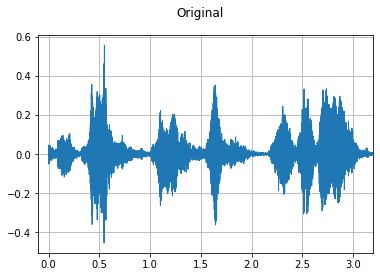

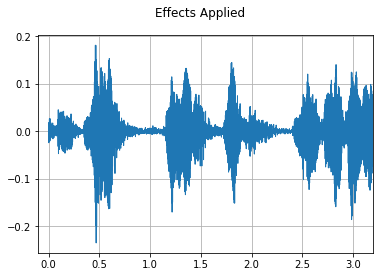

----------
Source: Original
----------
Sample Rate: 44100
Shape: (1, 181252)
Dtype: torch.float32
 - Max:      0.556
 - Min:     -0.455
 - Mean:    -0.000
 - Std Dev:  0.055

tensor([[0.0454, 0.0453, 0.0449,  ..., 0.0010, 0.0012, 0.0013]])

----------
Source: Effects Applied
----------
Sample Rate: 44100
Shape: (1, 203448)
Dtype: torch.float32
 - Max:      0.181
 - Min:     -0.235
 - Mean:    -0.000
 - Std Dev:  0.029

tensor([[0.0019, 0.0037, 0.0054,  ..., 0.0000, 0.0000, 0.0000]])



In [25]:
plot_waveform(all_vectors['Ses01M_impro05_M000'], 44100, title="Original", xlim=(-.1, 3.2))
plot_waveform(TensorModificado, sample_rate2, title="Effects Applied", xlim=(-.1, 3.2))

print_stats(all_vectors['Ses01M_impro05_M000'], sample_rate=44100, src="Original")
print_stats(TensorModificado, sample_rate=44100, src="Effects Applied")

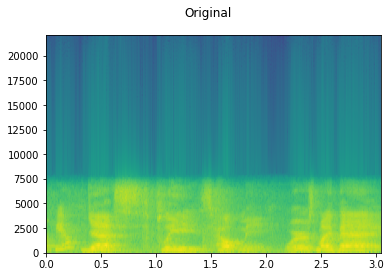

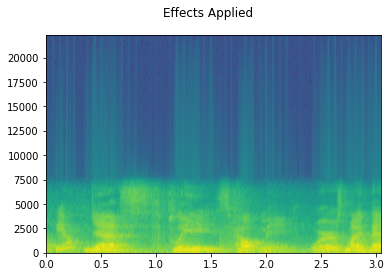

In [26]:
plot_specgram(all_vectors['Ses01M_impro05_M000'], sample_rate1, title="Original", xlim=(0, 3.04))
play_audio(all_vectors['Ses01M_impro05_M000'], sample_rate1)
plot_specgram(TensorModificado, sample_rate2, title="Effects Applied", xlim=(0, 3.04))
play_audio(TensorModificado, sample_rate2)

In [27]:
P = []
N = []

for x in range(len(condensed_data)):
  if condensed_data['label'][x] == 1:
    P.append(condensed_data['wav_file'][x])
  else:
    N.append(condensed_data['wav_file'][x])

print(len(N))
print(len(P))

4072
3451


### Aumentamos audio y guardamos en diccionario

In [ ]:
'''
pos_vectors =  {}
neg_vectors = {}
cap = 4500

for x in range(1, cap - len(P)):
  ran_speed = np.random.uniform(low=0.9, high=1.1)
  ran_pitch = np.random.randint(-300, 200)
  vector_filtrado, sample_rate2 = torchaudio.sox_effects.apply_effects_tensor(all_vectors[P[x]], 44100, [["lowpass", "-1", "300"], ["speed", str(ran_speed)], ['pitch', str(ran_pitch)]])

  pos_vectors[P[x] + str('_aug')] = vector_filtrado


for x in range(1, cap - len(N)):
  ran_speed = np.random.uniform(low=0.9, high=1.1)
  ran_pitch = np.random.randint(-300, 200)
  vector_filtrado, sample_rate2 = torchaudio.sox_effects.apply_effects_tensor(all_vectors[N[x]], 44100, [["lowpass", "-1", "300"], ["speed", str(ran_speed)], ['pitch', str(ran_pitch)]])
  
  neg_vectors[N[x] + str('_aug')] = vector_filtrado

'''

In [ ]:
# Ya se guardaron en PICKLE
'''Positive_augmented_vectors = open("Positive_augmented_vectors.pkl", "wb")
pickle.dump(pos_vectors, Positive_augmented_vectors)
Positive_augmented_vectors.close()

Negative_augmented_vectors = open("Negative_augmented_vectors.pkl", "wb")
pickle.dump(neg_vectors, Negative_augmented_vectors)
Negative_augmented_vectors.close()
'''

In [28]:
pos_vectors = ''
neg_vectors = ''

with open("Positive_augmented_vectors.pkl", "rb") as file:
  pos_vectors = pickle.load(file)

with open("Negative_augmented_vectors.pkl", "rb") as file:
  neg_vectors = pickle.load(file)

In [29]:
gc.collect()

7472

### Creamos nuestro train set aumentado

In [30]:
columns = ['waveform', 'label']
train_set_aug = pd.DataFrame(columns=columns)
n = len(pos_vectors)
label = 1
for wav in tqdm(pos_vectors.values(), total=n):
  train_set_aug = train_set_aug.append({'waveform': wav, 'label': label}, ignore_index=True)

n = len(neg_vectors)
label = 0
for wav in tqdm(neg_vectors.values(), total=n):
  train_set_aug = train_set_aug.append({'waveform': wav, 'label': label}, ignore_index=True)

100%|██████████| 427/427 [00:01<00:00, 407.55it/s]


### Creamos nuestro test y train set con datos originales

In [31]:
columns = ['waveform', 'label']
test_set = pd.DataFrame(columns=columns)

files, labels = (test_data.wav_file, test_data.label)
n = len(files)
for file, label in tqdm(zip(files,labels),total=n):
  wav = all_vectors.pop(file)
  test_set = test_set.append({'waveform': wav, 'label': label}, ignore_index=True)

100%|██████████| 100/100 [00:00<00:00, 400.30it/s]


In [32]:
gc.collect()

103

In [33]:
train_set = pd.DataFrame(columns=columns)
files, labels = (train_data.wav_file, train_data.label)
n = len(files)
for file, label in tqdm(zip(files,labels),total=n):
  wav = all_vectors.pop(file)
  train_set = train_set.append({'waveform': wav, 'label': label}, ignore_index=True)

100%|██████████| 7423/7423 [00:18<00:00, 405.65it/s]


In [34]:
waveform = train_set.iloc[0].waveform
new_sample_rate = 8000
sample_rate = 44100
transform = torchaudio.transforms.Resample(orig_freq=sample_rate, new_freq=new_sample_rate)
transformed = transform(waveform)
ipd.Audio(transformed.numpy(), rate=new_sample_rate)

In [35]:
print(len(all_vectors))

2516


In [36]:
vectores_defectuosos = open("defective_vectors.pkl", "wb")
pickle.dump(all_vectors, vectores_defectuosos)
vectores_defectuosos.close()

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py", line 2882, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-36-06da361b69ec>", line 2, in <module>
    pickle.dump(all_vectors, vectores_defectuosos)
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py", line 1823, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'KeyboardInterrupt' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/IPython/core/ultratb.py", line 1132, in get_records
    return _fixed_getinnerframes(etb, number_of_lines_of_context, tb_offset)
  File "/usr/local/lib/python3.7/dist-packages/IPython/core/u

KeyboardInterrupt: ignored

In [37]:
del all_vectors

In [69]:
gc.collect()

643

In [39]:
train_set.shape

(7423, 2)

In [40]:
train_set.label.unique()

array([1, 0], dtype=object)

### Append de set original y aumentado

In [41]:
train_set = train_set.append(train_set_aug)

In [42]:
train_set.label.unique()

array([1, 0], dtype=object)

In [43]:
test_set.label.unique()

array([1, 0], dtype=object)

In [44]:
train_set.shape

(8898, 2)

In [46]:
gc.collect()

503

In [ ]:
assert False

Creamos nuestro CustomDataset y obtenemos 2 sets.
El de entrenamiento y el de validación.
Debido a que no tenemos tantos datos no contamos con un set de testing.****






In [45]:
class CustomSoundDataset(DataLoader):
    def __init__(self, data_set, transform=None, target_transform=None):
        self.labels = data_set.label
        self.waveforms = data_set.waveform
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        waveform = self.waveforms.iloc[idx]
        label = self.labels.iloc[idx]
        return waveform, label

In [47]:
train_dataset = CustomSoundDataset(train_set)
test_dataset = CustomSoundDataset(test_set)

In [48]:
train_data_loader = torch.utils.data.DataLoader(
  train_dataset,
  batch_size=10,
  shuffle=True,
  num_workers=1,
  pin_memory=True,
  collate_fn=collate_fn
 )

In [49]:
test_data_loader = torch.utils.data.DataLoader(
  test_dataset,
  batch_size=10,
  shuffle=False,
  drop_last=False,
  collate_fn=collate_fn,
  num_workers=1,
  pin_memory=True,
)

In [50]:
gc.collect()

222

## Importamos el modelo M11
A continuación vamos a cargar el modelo M11 para entrenarlo con nuestros datasets.

In [8]:
from mX_models import M11
model = M11()
model.to(device)
print(model)
n = model.count_parameters()
print("Number of parameters: %s" % n)

M11 model
Model n_input 1
Model n_output 2
M11(
  (conv1): Conv1d(1, 32, kernel_size=(80,), stride=(4,))
  (bn1): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool1): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv1d(32, 32, kernel_size=(3,), stride=(1,), padding=(1,))
  (bn2): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv1d(32, 32, kernel_size=(3,), stride=(1,), padding=(1,))
  (bn3): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool2): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (conv4): Conv1d(32, 64, kernel_size=(3,), stride=(1,), padding=(1,))
  (bn4): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv5): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,))
  (bn5): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=

Elegimos como optimización para el modelo Adam junto con un scheduler

In [9]:
gc.collect()

93

In [57]:
optimizer = optim.Adam(model.parameters(), lr=0.00001, weight_decay=0.0001) #lr = 0.00001
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)  # reduce the learning after 20 epochs by a factor of 10

In [10]:
optimizer = optim.Adam(model.parameters())
path = './M11_lowest_loss.tar'
checkpoint = torch.load(path)
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)
epoch = checkpoint['epoch']
loss = checkpoint['loss']
# model.to(device)

In [11]:
print("Epoch: ", epoch)
print("loss: ", loss)

Epoch:  20
loss:  0.362551748752594


## Entrenamiento y Testing
Definimos un entrenamiento con lineamientos típicos de Pytorch.
Como loss function se utiliza log-likelihood debido a que nuestra capa de salida es de tipo Softmax.
En cada epoch vamos a entrenar el modelo, evaluarlo y guardar las métricas para graficar el desempeño en Tensorboard.

In [58]:
def train(model, epoch, log_interval, model_name, pbar, pbar_update):
    model.train()
    t_loss = 0.0
    for batch_idx, (data, target) in enumerate(train_data_loader): # train_loader
        data = data.to(device)
        target = target.to(device)

        # apply transform and model on whole batch directly on device
        data = transform(data)
        output = model(data)

        # negative log-likelihood for a tensor of size (batch x 1 x n_output)
        loss = F.nll_loss(output.squeeze(), target)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # print training stats
        if batch_idx % log_interval == 0:
            print(f"Train Epoch: {epoch} [{batch_idx * len(data)}/{len(train_data_loader.dataset)} ({100. * batch_idx / len(train_data_loader):.0f}%)]\tLoss: {loss.item():.6f}")

        # update progress bar
        pbar.update(pbar_update)

        # record loss
        t_loss = loss.item()

    return t_loss

Durante testing calculamos el accuracy y el loss con nuestro set de validación

In [59]:
def test(model, epoch, pbar, pbar_update):
    model.eval()
    correct = 0
    accuracy = 0
    v_loss = 0.0
    for data, target in test_data_loader: #test_loader

        data = data.to(device)
        target = target.to(device)

        # apply transform and model on whole batch directly on device
        data = transform(data)
        output = model(data)

        # Get validation loss
        loss = F.nll_loss(output.squeeze(), target)
        v_loss = loss.item()

        # Get predictions
        pred = output.argmax(dim=-1)
        correct += number_of_correct(pred, target)

        # update progress bar
        pbar.update(pbar_update)

    print(f"\nTest Epoch: {epoch}\tAccuracy: {correct}/{len(test_data_loader.dataset)} ({100. * correct / len(test_data_loader.dataset):.0f}%)\n")
    accuracy = (100. * correct) / len(test_data_loader.dataset)

    return v_loss, accuracy

In [12]:
gc.collect()

313

In [61]:
def trainModel(model, optimizer, scheduler, n_epoch, model_name, transform):

  #Inicializamos tensorboard
  log_dir = os.path.join('logs', model_name,'')
  writer = SummaryWriter(log_dir)

  # Datos iniciales para visualizar
  log_interval = 20
  pbar_update = 1 / (len(train_data_loader) + len(test_data_loader))
  global_acc = 0.0
  global_loss = 2
  transform = transform.to(device)

  # Iniciamos entrenamiento
  with tqdm(total=n_epoch) as pbar:
      for epoch in range(1, n_epoch + 1):

          # Obtenemos el loss de entrenamiento y val
          # También jalamos el accuracy
          local_train_loss = train(model, epoch, log_interval, model_name, pbar, pbar_update)
          local_val_loss, local_val_accuracy = test(model, epoch, pbar, pbar_update)

          # Escribimos métricas a tensorboard
          writer.add_scalar("Loss/train", local_train_loss, epoch)
          writer.add_scalar("Loss/val", local_val_loss, epoch)
          writer.add_scalar("Acc/val", local_val_accuracy, epoch)

          writer.add_scalars('loss',{
              'train': local_train_loss,
              'val': local_val_loss,
          }, epoch)

          writer.flush()

          # Actualizar scheduler
          scheduler.step()

          # Guardamos el modelo con el menor training loss
          if local_train_loss < global_loss:
            global_loss = local_train_loss
            path = model_name + '_lowest_loss'
            print("Lowest training loss: ", global_loss)
            save_checkpoint(model, optimizer, epoch, global_loss, path)
          
          # Guardamos el modelo con el mayor validation accuracy
          if local_val_accuracy > global_acc:
            global_acc = local_val_accuracy
            path = model_name + '_highest_acc'
            print("Highest val accuracy: ", global_acc)
            save_checkpoint(model, optimizer, epoch, global_loss, path)

  # Cerramos Tensorboard
  writer.close()

In [62]:
gc.collect()

88

## Etapa de entrenamiento
Ahora procedemos a entrenar nuestro modelo

In [63]:
trainModel(model, optimizer, scheduler, 50, 'M11', transform)

  0%|          | 0.003333333333333333/50 [00:01<12:28:24, 898.14s/it]  

Train Epoch: 1 [0/8898 (0%)]	Loss: 0.734900


  0%|          | 0.02666666666666667/50 [00:03<1:13:09, 87.84s/it] 

Train Epoch: 1 [200/8898 (2%)]	Loss: 0.678385


  0%|          | 0.04666666666666667/50 [00:04<50:01, 60.08s/it] 

Train Epoch: 1 [400/8898 (4%)]	Loss: 0.734811


  0%|          | 0.06888888888888886/50 [00:05<1:03:06, 75.84s/it]

Train Epoch: 1 [600/8898 (7%)]	Loss: 0.658716


  0%|          | 0.09111111111111095/50 [00:07<55:29, 66.72s/it]

Train Epoch: 1 [800/8898 (9%)]	Loss: 0.677648


  0%|          | 0.11333333333333304/50 [00:08<52:46, 63.48s/it]

Train Epoch: 1 [1000/8898 (11%)]	Loss: 0.746951


  0%|          | 0.13555555555555526/50 [00:10<58:30, 70.41s/it]

Train Epoch: 1 [1200/8898 (13%)]	Loss: 0.708133


  0%|          | 0.15888888888888875/50 [00:11<55:34, 66.90s/it]

Train Epoch: 1 [1400/8898 (16%)]	Loss: 0.703756


  0%|          | 0.1811111111111111/50 [00:13<53:53, 64.90s/it] 

Train Epoch: 1 [1600/8898 (18%)]	Loss: 0.714499


  0%|          | 0.20333333333333348/50 [00:14<54:26, 65.60s/it]

Train Epoch: 1 [1800/8898 (20%)]	Loss: 0.710586


  0%|          | 0.22555555555555584/50 [00:16<57:14, 69.01s/it]

Train Epoch: 1 [2000/8898 (22%)]	Loss: 0.649071


  0%|          | 0.2477777777777782/50 [00:17<56:49, 68.53s/it]   

Train Epoch: 1 [2200/8898 (25%)]	Loss: 0.733935


  1%|          | 0.26777777777777834/50 [00:18<58:20, 70.39s/it]

Train Epoch: 1 [2400/8898 (27%)]	Loss: 0.676788


  1%|          | 0.29222222222222294/50 [00:20<56:52, 68.64s/it]

Train Epoch: 1 [2600/8898 (29%)]	Loss: 0.696209


  1%|          | 0.3144444444444453/50 [00:21<48:38, 58.75s/it] 

Train Epoch: 1 [2800/8898 (31%)]	Loss: 0.724251


  1%|          | 0.33666666666666767/50 [00:23<56:35, 68.37s/it]

Train Epoch: 1 [3000/8898 (34%)]	Loss: 0.673751


  1%|          | 0.35888888888889003/50 [00:24<57:53, 69.97s/it]

Train Epoch: 1 [3200/8898 (36%)]	Loss: 0.704878


  1%|          | 0.3811111111111124/50 [00:26<1:00:45, 73.46s/it] 

Train Epoch: 1 [3400/8898 (38%)]	Loss: 0.672262


  1%|          | 0.40333333333333476/50 [00:28<55:36, 67.27s/it]

Train Epoch: 1 [3600/8898 (40%)]	Loss: 0.677957


  1%|          | 0.4233333333333349/50 [00:29<53:58, 65.33s/it] 

Train Epoch: 1 [3800/8898 (43%)]	Loss: 0.714820


  1%|          | 0.4477777777777795/50 [00:31<51:57, 62.92s/it] 

Train Epoch: 1 [4000/8898 (45%)]	Loss: 0.725652


  1%|          | 0.47000000000000186/50 [00:32<55:09, 66.82s/it]

Train Epoch: 1 [4200/8898 (47%)]	Loss: 0.695763


  1%|          | 0.490000000000002/50 [00:33<52:01, 63.04s/it]  

Train Epoch: 1 [4400/8898 (49%)]	Loss: 0.665797


  1%|          | 0.5133333333333348/50 [00:35<48:58, 59.38s/it]

Train Epoch: 1 [4600/8898 (52%)]	Loss: 0.677075


  1%|          | 0.5377777777777781/50 [00:36<48:33, 58.90s/it]

Train Epoch: 1 [4800/8898 (54%)]	Loss: 0.681127


  1%|          | 0.5599999999999994/50 [00:38<54:38, 66.32s/it]  

Train Epoch: 1 [5000/8898 (56%)]	Loss: 0.728232


  1%|          | 0.5822222222222206/50 [00:39<51:50, 62.95s/it]

Train Epoch: 1 [5200/8898 (58%)]	Loss: 0.696080


  1%|          | 0.6022222222222198/50 [00:41<58:01, 70.47s/it]  

Train Epoch: 1 [5400/8898 (61%)]	Loss: 0.681229


  1%|          | 0.624444444444441/50 [00:43<54:07, 65.78s/it] 

Train Epoch: 1 [5600/8898 (63%)]	Loss: 0.665985


  1%|▏         | 0.6466666666666623/50 [00:44<53:04, 64.53s/it]

Train Epoch: 1 [5800/8898 (65%)]	Loss: 0.753373


  1%|▏         | 0.6688888888888835/50 [00:45<48:51, 59.42s/it]

Train Epoch: 1 [6000/8898 (67%)]	Loss: 0.638424


  1%|▏         | 0.6911111111111048/50 [00:47<49:37, 60.38s/it]

Train Epoch: 1 [6200/8898 (70%)]	Loss: 0.558332


  1%|▏         | 0.713333333333326/50 [00:48<52:20, 63.71s/it] 

Train Epoch: 1 [6400/8898 (72%)]	Loss: 0.634325


  1%|▏         | 0.7377777777777694/50 [00:50<49:55, 60.81s/it]

Train Epoch: 1 [6600/8898 (74%)]	Loss: 0.757093


  2%|▏         | 0.7577777777777686/50 [00:51<55:27, 67.57s/it]

Train Epoch: 1 [6800/8898 (76%)]	Loss: 0.653844


  2%|▏         | 0.7799999999999898/50 [00:52<52:48, 64.38s/it]

Train Epoch: 1 [7000/8898 (79%)]	Loss: 0.637374


  2%|▏         | 0.8044444444444332/50 [00:54<47:09, 57.52s/it]

Train Epoch: 1 [7200/8898 (81%)]	Loss: 0.721878


  2%|▏         | 0.8244444444444323/50 [00:55<47:51, 58.39s/it]

Train Epoch: 1 [7400/8898 (83%)]	Loss: 0.685306


  2%|▏         | 0.8488888888888757/50 [00:57<48:32, 59.25s/it]

Train Epoch: 1 [7600/8898 (85%)]	Loss: 0.659997


  2%|▏         | 0.8688888888888748/50 [00:58<47:42, 58.26s/it]

Train Epoch: 1 [7800/8898 (88%)]	Loss: 0.638441


  2%|▏         | 0.8911111111110961/50 [00:59<55:33, 67.87s/it]

Train Epoch: 1 [8000/8898 (90%)]	Loss: 0.703303


  2%|▏         | 0.9133333333333173/50 [01:01<49:59, 61.12s/it]

Train Epoch: 1 [8200/8898 (92%)]	Loss: 0.728131


  2%|▏         | 0.9355555555555386/50 [01:02<53:45, 65.75s/it]

Train Epoch: 1 [8400/8898 (94%)]	Loss: 0.613751


  2%|▏         | 0.9577777777777599/50 [01:04<44:16, 54.16s/it]

Train Epoch: 1 [8600/8898 (97%)]	Loss: 0.659937


  2%|▏         | 0.9799999999999811/50 [01:05<58:12, 71.25s/it] 

Train Epoch: 1 [8800/8898 (99%)]	Loss: 0.640171


  2%|▏         | 0.9977777777777581/50 [01:07<57:12, 70.06s/it]  


Test Epoch: 1	Accuracy: 56/100 (56%)

Lowest training loss:  0.676101803779602
Saved checkpoint at epoch 1 with loss 0.676101803779602
Highest val accuracy:  56.0
Saved checkpoint at epoch 1 with loss 0.676101803779602


  2%|▏         | 1.0033333333333134/50 [01:09<2:50:53, 209.27s/it]

Train Epoch: 2 [0/8898 (0%)]	Loss: 0.723626


  2%|▏         | 1.0255555555555347/50 [01:11<55:01, 67.42s/it]

Train Epoch: 2 [200/8898 (2%)]	Loss: 0.660188


  2%|▏         | 1.0455555555555338/50 [01:12<54:32, 66.86s/it]

Train Epoch: 2 [400/8898 (4%)]	Loss: 0.612775


  2%|▏         | 1.0699999999999772/50 [01:14<51:28, 63.12s/it]

Train Epoch: 2 [600/8898 (7%)]	Loss: 0.705009


  2%|▏         | 1.0922222222221984/50 [01:15<55:04, 67.56s/it]

Train Epoch: 2 [800/8898 (9%)]	Loss: 0.695044


  2%|▏         | 1.1144444444444197/50 [01:17<54:57, 67.45s/it]

Train Epoch: 2 [1000/8898 (11%)]	Loss: 0.639255


  2%|▏         | 1.136666666666641/50 [01:18<51:35, 63.34s/it] 

Train Epoch: 2 [1200/8898 (13%)]	Loss: 0.663310


  2%|▏         | 1.1588888888888622/50 [01:20<1:01:29, 75.55s/it]

Train Epoch: 2 [1400/8898 (16%)]	Loss: 0.634352


  2%|▏         | 1.1811111111110835/50 [01:21<51:14, 62.98s/it]

Train Epoch: 2 [1600/8898 (18%)]	Loss: 0.672991


  2%|▏         | 1.2033333333333047/50 [01:22<46:04, 56.66s/it]

Train Epoch: 2 [1800/8898 (20%)]	Loss: 0.750079


  2%|▏         | 1.225555555555526/50 [01:24<48:50, 60.08s/it] 

Train Epoch: 2 [2000/8898 (22%)]	Loss: 0.786152


  2%|▏         | 1.2477777777777472/50 [01:25<48:31, 59.73s/it]

Train Epoch: 2 [2200/8898 (25%)]	Loss: 0.687554


  3%|▎         | 1.2688888888888574/50 [01:26<48:22, 59.56s/it]

Train Epoch: 2 [2400/8898 (27%)]	Loss: 0.697816


  3%|▎         | 1.2911111111110787/50 [01:28<58:52, 72.53s/it]

Train Epoch: 2 [2600/8898 (29%)]	Loss: 0.706951


  3%|▎         | 1.3133333333333/50 [01:29<50:43, 62.51s/it]   

Train Epoch: 2 [2800/8898 (31%)]	Loss: 0.647551


  3%|▎         | 1.3355555555555212/50 [01:31<47:03, 58.03s/it]

Train Epoch: 2 [3000/8898 (34%)]	Loss: 0.739716


  3%|▎         | 1.3599999999999646/50 [01:32<52:13, 64.42s/it]

Train Epoch: 2 [3200/8898 (36%)]	Loss: 0.596500


  3%|▎         | 1.3799999999999637/50 [01:34<52:54, 65.30s/it]

Train Epoch: 2 [3400/8898 (38%)]	Loss: 0.662885


  3%|▎         | 1.404444444444407/50 [01:35<49:48, 61.49s/it]

Train Epoch: 2 [3600/8898 (40%)]	Loss: 0.707336


  3%|▎         | 1.4255555555555173/50 [01:37<54:44, 67.63s/it]

Train Epoch: 2 [3800/8898 (43%)]	Loss: 0.661649


  3%|▎         | 1.4477777777777385/50 [01:38<51:06, 63.16s/it]

Train Epoch: 2 [4000/8898 (45%)]	Loss: 0.681309


  3%|▎         | 1.4699999999999598/50 [01:39<47:44, 59.02s/it]

Train Epoch: 2 [4200/8898 (47%)]	Loss: 0.655359


  3%|▎         | 1.492222222222181/50 [01:41<44:12, 54.68s/it]

Train Epoch: 2 [4400/8898 (49%)]	Loss: 0.610687


  3%|▎         | 1.5122222222221802/50 [01:42<54:28, 67.41s/it]

Train Epoch: 2 [4600/8898 (52%)]	Loss: 0.646155


  3%|▎         | 1.5366666666666235/50 [01:44<49:00, 60.67s/it]

Train Epoch: 2 [4800/8898 (54%)]	Loss: 0.600336


  3%|▎         | 1.5588888888888448/50 [01:45<48:34, 60.18s/it]

Train Epoch: 2 [5000/8898 (56%)]	Loss: 0.625196


  3%|▎         | 1.578888888888844/50 [01:46<47:00, 58.25s/it] 

Train Epoch: 2 [5200/8898 (58%)]	Loss: 0.617798


  3%|▎         | 1.6033333333332873/50 [01:48<52:11, 64.70s/it]

Train Epoch: 2 [5400/8898 (61%)]	Loss: 0.772611


  3%|▎         | 1.6244444444443975/50 [01:49<47:22, 58.75s/it]

Train Epoch: 2 [5600/8898 (63%)]	Loss: 0.637832


  3%|▎         | 1.6488888888888409/50 [01:51<51:54, 64.40s/it]

Train Epoch: 2 [5800/8898 (65%)]	Loss: 0.677998


  3%|▎         | 1.66888888888884/50 [01:52<48:40, 60.43s/it] 

Train Epoch: 2 [6000/8898 (67%)]	Loss: 0.630541


  3%|▎         | 1.6911111111110613/50 [01:54<45:30, 56.51s/it]

Train Epoch: 2 [6200/8898 (70%)]	Loss: 0.674904


  3%|▎         | 1.7144444444443936/50 [01:55<52:38, 65.41s/it]

Train Epoch: 2 [6400/8898 (72%)]	Loss: 0.666037


  3%|▎         | 1.7366666666666148/50 [01:57<54:06, 67.26s/it]

Train Epoch: 2 [6600/8898 (74%)]	Loss: 0.813035


  4%|▎         | 1.758888888888836/50 [01:58<50:37, 62.97s/it]

Train Epoch: 2 [6800/8898 (76%)]	Loss: 0.619725


  4%|▎         | 1.7811111111110574/50 [01:59<49:29, 61.57s/it]

Train Epoch: 2 [7000/8898 (79%)]	Loss: 0.735749


  4%|▎         | 1.8033333333332786/50 [02:01<49:09, 61.20s/it]

Train Epoch: 2 [7200/8898 (81%)]	Loss: 0.622913


  4%|▎         | 1.8255555555554999/50 [02:02<48:09, 59.97s/it]

Train Epoch: 2 [7400/8898 (83%)]	Loss: 0.620065


  4%|▎         | 1.8488888888888322/50 [02:04<50:51, 63.38s/it]

Train Epoch: 2 [7600/8898 (85%)]	Loss: 0.638449


  4%|▎         | 1.8688888888888313/50 [02:05<57:07, 71.20s/it]

Train Epoch: 2 [7800/8898 (88%)]	Loss: 0.673081


  4%|▍         | 1.8911111111110526/50 [02:06<50:53, 63.48s/it]

Train Epoch: 2 [8000/8898 (90%)]	Loss: 0.721653


  4%|▍         | 1.9133333333332738/50 [02:08<46:55, 58.55s/it]

Train Epoch: 2 [8200/8898 (92%)]	Loss: 0.687518


  4%|▍         | 1.9377777777777172/50 [02:09<44:58, 56.14s/it]

Train Epoch: 2 [8400/8898 (94%)]	Loss: 0.592242


  4%|▍         | 1.9599999999999385/50 [02:11<49:46, 62.16s/it]

Train Epoch: 2 [8600/8898 (97%)]	Loss: 0.758069


  4%|▍         | 1.9799999999999376/50 [02:12<45:47, 57.22s/it]

Train Epoch: 2 [8800/8898 (99%)]	Loss: 0.707422


  4%|▍         | 1.9999999999999367/50 [02:13<58:36, 73.26s/it]  


Test Epoch: 2	Accuracy: 58/100 (58%)

Highest val accuracy:  58.0
Saved checkpoint at epoch 2 with loss 0.676101803779602


  4%|▍         | 2.0044444444443816/50 [02:14<1:29:54, 112.41s/it]

Train Epoch: 3 [0/8898 (0%)]	Loss: 0.628977


  4%|▍         | 2.0266666666666073/50 [02:16<1:00:56, 76.22s/it]

Train Epoch: 3 [200/8898 (2%)]	Loss: 0.687660


  4%|▍         | 2.0466666666666105/50 [02:17<47:53, 59.92s/it]

Train Epoch: 3 [400/8898 (4%)]	Loss: 0.539809


  4%|▍         | 2.068888888888836/50 [02:18<48:58, 61.31s/it] 

Train Epoch: 3 [600/8898 (7%)]	Loss: 0.692783


  4%|▍         | 2.092222222222173/50 [02:20<43:20, 54.28s/it] 

Train Epoch: 3 [800/8898 (9%)]	Loss: 0.688532


  4%|▍         | 2.114444444444399/50 [02:21<59:10, 74.14s/it] 

Train Epoch: 3 [1000/8898 (11%)]	Loss: 0.634763


  4%|▍         | 2.134444444444402/50 [02:23<52:42, 66.07s/it] 

Train Epoch: 3 [1200/8898 (13%)]	Loss: 0.764950


  4%|▍         | 2.15888888888885/50 [02:24<55:34, 69.69s/it]  

Train Epoch: 3 [1400/8898 (16%)]	Loss: 0.665471


  4%|▍         | 2.181111111111076/50 [02:26<48:38, 61.03s/it] 

Train Epoch: 3 [1600/8898 (18%)]	Loss: 0.604328


  4%|▍         | 2.2033333333333016/50 [02:27<53:36, 67.30s/it]

Train Epoch: 3 [1800/8898 (20%)]	Loss: 0.711218


  4%|▍         | 2.2255555555555273/50 [02:29<46:46, 58.75s/it]

Train Epoch: 3 [2000/8898 (22%)]	Loss: 0.679041


  4%|▍         | 2.247777777777753/50 [02:30<49:47, 62.57s/it] 

Train Epoch: 3 [2200/8898 (25%)]	Loss: 0.545874


  5%|▍         | 2.2699999999999787/50 [02:31<54:34, 68.59s/it]

Train Epoch: 3 [2400/8898 (27%)]	Loss: 0.561366


  5%|▍         | 2.2922222222222044/50 [02:33<49:24, 62.13s/it]

Train Epoch: 3 [2600/8898 (29%)]	Loss: 0.599514


  5%|▍         | 2.31444444444443/50 [02:34<48:43, 61.30s/it]  

Train Epoch: 3 [2800/8898 (31%)]	Loss: 0.695087


  5%|▍         | 2.336666666666656/50 [02:36<55:17, 69.60s/it]

Train Epoch: 3 [3000/8898 (34%)]	Loss: 0.600624


  5%|▍         | 2.3588888888888815/50 [02:37<49:08, 61.88s/it]

Train Epoch: 3 [3200/8898 (36%)]	Loss: 0.629370


  5%|▍         | 2.381111111111107/50 [02:39<55:04, 69.39s/it] 

Train Epoch: 3 [3400/8898 (38%)]	Loss: 0.570824


  5%|▍         | 2.403333333333333/50 [02:40<47:54, 60.38s/it] 

Train Epoch: 3 [3600/8898 (40%)]	Loss: 0.720641


  5%|▍         | 2.4244444444444473/50 [02:41<51:23, 64.81s/it]

Train Epoch: 3 [3800/8898 (43%)]	Loss: 0.668137


  5%|▍         | 2.446666666666673/50 [02:43<1:05:25, 82.55s/it] 

Train Epoch: 3 [4000/8898 (45%)]	Loss: 0.687761


  5%|▍         | 2.4688888888888987/50 [02:44<52:52, 66.74s/it]

Train Epoch: 3 [4200/8898 (47%)]	Loss: 0.672666


  5%|▍         | 2.493333333333347/50 [02:46<46:09, 58.30s/it] 

Train Epoch: 3 [4400/8898 (49%)]	Loss: 0.724811


  5%|▌         | 2.51333333333335/50 [02:47<50:20, 63.60s/it]  

Train Epoch: 3 [4600/8898 (52%)]	Loss: 0.562372


  5%|▌         | 2.5377777777777983/50 [02:49<49:05, 62.06s/it]

Train Epoch: 3 [4800/8898 (54%)]	Loss: 0.745357


  5%|▌         | 2.560000000000024/50 [02:50<46:09, 58.38s/it] 

Train Epoch: 3 [5000/8898 (56%)]	Loss: 0.544315


  5%|▌         | 2.580000000000027/50 [02:52<52:15, 66.12s/it] 

Train Epoch: 3 [5200/8898 (58%)]	Loss: 0.720532


  5%|▌         | 2.6044444444444754/50 [02:53<52:03, 65.89s/it]

Train Epoch: 3 [5400/8898 (61%)]	Loss: 0.593919


  5%|▌         | 2.6244444444444786/50 [02:54<51:28, 65.20s/it]

Train Epoch: 3 [5600/8898 (63%)]	Loss: 0.716619


  5%|▌         | 2.6466666666667042/50 [02:56<59:01, 74.80s/it]

Train Epoch: 3 [5800/8898 (65%)]	Loss: 0.656350


  5%|▌         | 2.66888888888893/50 [02:58<53:44, 68.12s/it]  

Train Epoch: 3 [6000/8898 (67%)]	Loss: 0.763715


  5%|▌         | 2.693333333333378/50 [02:59<48:45, 61.84s/it] 

Train Epoch: 3 [6200/8898 (70%)]	Loss: 0.713925


  5%|▌         | 2.7133333333333813/50 [03:01<49:37, 62.96s/it]

Train Epoch: 3 [6400/8898 (72%)]	Loss: 0.742187


  5%|▌         | 2.735555555555607/50 [03:02<53:13, 67.56s/it] 

Train Epoch: 3 [6600/8898 (74%)]	Loss: 0.582491


  6%|▌         | 2.7600000000000553/50 [03:04<48:02, 61.01s/it]

Train Epoch: 3 [6800/8898 (76%)]	Loss: 0.648402


  6%|▌         | 2.782222222222281/50 [03:05<48:13, 61.29s/it] 

Train Epoch: 3 [7000/8898 (79%)]	Loss: 0.583305


  6%|▌         | 2.8044444444445067/50 [03:06<46:19, 58.89s/it]

Train Epoch: 3 [7200/8898 (81%)]	Loss: 0.617437


  6%|▌         | 2.82444444444451/50 [03:08<57:32, 73.18s/it]  

Train Epoch: 3 [7400/8898 (83%)]	Loss: 0.729992


  6%|▌         | 2.847777777777847/50 [03:09<47:15, 60.13s/it] 

Train Epoch: 3 [7600/8898 (85%)]	Loss: 0.606444


  6%|▌         | 2.86777777777785/50 [03:11<50:46, 64.64s/it]  

Train Epoch: 3 [7800/8898 (88%)]	Loss: 0.714109


  6%|▌         | 2.892222222222298/50 [03:12<52:38, 67.05s/it] 

Train Epoch: 3 [8000/8898 (90%)]	Loss: 0.634373


  6%|▌         | 2.914444444444524/50 [03:14<48:33, 61.88s/it] 

Train Epoch: 3 [8200/8898 (92%)]	Loss: 0.621700


  6%|▌         | 2.9366666666667496/50 [03:15<49:46, 63.46s/it]

Train Epoch: 3 [8400/8898 (94%)]	Loss: 0.704760


  6%|▌         | 2.9588888888889753/50 [03:17<48:09, 61.43s/it]

Train Epoch: 3 [8600/8898 (97%)]	Loss: 0.550072


  6%|▌         | 2.981111111111201/50 [03:18<49:45, 63.50s/it] 

Train Epoch: 3 [8800/8898 (99%)]	Loss: 0.625239


  6%|▌         | 3.000000000000093/50 [03:20<54:24, 69.47s/it] 


Test Epoch: 3	Accuracy: 58/100 (58%)

Lowest training loss:  0.6286841630935669
Saved checkpoint at epoch 3 with loss 0.6286841630935669


  6%|▌         | 3.0022222222223154/50 [03:20<1:48:58, 139.12s/it]

Train Epoch: 4 [0/8898 (0%)]	Loss: 0.734941


  6%|▌         | 3.024444444444541/50 [03:22<52:52, 67.53s/it] 

Train Epoch: 4 [200/8898 (2%)]	Loss: 0.708917


  6%|▌         | 3.047777777777878/50 [03:23<54:21, 69.45s/it] 

Train Epoch: 4 [400/8898 (4%)]	Loss: 0.715264


  6%|▌         | 3.0700000000001038/50 [03:25<54:29, 69.67s/it]

Train Epoch: 4 [600/8898 (7%)]	Loss: 0.670179


  6%|▌         | 3.0922222222223295/50 [03:26<45:33, 58.28s/it]

Train Epoch: 4 [800/8898 (9%)]	Loss: 0.616042


  6%|▌         | 3.114444444444555/50 [03:28<45:01, 57.61s/it] 

Train Epoch: 4 [1000/8898 (11%)]	Loss: 0.624207


  6%|▋         | 3.136666666666781/50 [03:29<47:01, 60.21s/it] 

Train Epoch: 4 [1200/8898 (13%)]	Loss: 0.725251


  6%|▋         | 3.1588888888890065/50 [03:31<49:36, 63.53s/it]

Train Epoch: 4 [1400/8898 (16%)]	Loss: 0.666823


  6%|▋         | 3.1811111111112322/50 [03:32<51:55, 66.53s/it]

Train Epoch: 4 [1600/8898 (18%)]	Loss: 0.637072


  6%|▋         | 3.203333333333458/50 [03:33<47:47, 61.27s/it] 

Train Epoch: 4 [1800/8898 (20%)]	Loss: 0.610684


  6%|▋         | 3.2255555555556836/50 [03:35<53:50, 69.07s/it]

Train Epoch: 4 [2000/8898 (22%)]	Loss: 0.629127


  6%|▋         | 3.2477777777779093/50 [03:36<53:00, 68.03s/it]

Train Epoch: 4 [2200/8898 (25%)]	Loss: 0.628357


  7%|▋         | 3.270000000000135/50 [03:38<49:17, 63.30s/it] 

Train Epoch: 4 [2400/8898 (27%)]	Loss: 0.586346


  7%|▋         | 3.2922222222223607/50 [03:39<55:01, 70.69s/it]

Train Epoch: 4 [2600/8898 (29%)]	Loss: 0.675636


  7%|▋         | 3.3144444444445864/50 [03:41<51:36, 66.32s/it]

Train Epoch: 4 [2800/8898 (31%)]	Loss: 0.725184


  7%|▋         | 3.336666666666812/50 [03:42<55:51, 71.82s/it] 

Train Epoch: 4 [3000/8898 (34%)]	Loss: 0.620468


  7%|▋         | 3.358888888889038/50 [03:44<45:59, 59.17s/it] 

Train Epoch: 4 [3200/8898 (36%)]	Loss: 0.757826


  7%|▋         | 3.3811111111112635/50 [03:45<51:09, 65.85s/it]

Train Epoch: 4 [3400/8898 (38%)]	Loss: 0.761096


  7%|▋         | 3.403333333333489/50 [03:47<52:52, 68.08s/it] 

Train Epoch: 4 [3600/8898 (40%)]	Loss: 0.856755


  7%|▋         | 3.425555555555715/50 [03:48<50:03, 64.49s/it] 

Train Epoch: 4 [3800/8898 (43%)]	Loss: 0.753032


  7%|▋         | 3.4477777777779406/50 [03:49<47:39, 61.43s/it]

Train Epoch: 4 [4000/8898 (45%)]	Loss: 0.698448


  7%|▋         | 3.468888888889055/50 [03:51<52:23, 67.56s/it] 

Train Epoch: 4 [4200/8898 (47%)]	Loss: 0.611144


  7%|▋         | 3.4911111111112807/50 [03:52<54:29, 70.30s/it]

Train Epoch: 4 [4400/8898 (49%)]	Loss: 0.666393


  7%|▋         | 3.5133333333335064/50 [03:54<51:12, 66.09s/it]

Train Epoch: 4 [4600/8898 (52%)]	Loss: 0.625599


  7%|▋         | 3.534444444444621/50 [03:55<49:31, 63.96s/it] 

Train Epoch: 4 [4800/8898 (54%)]	Loss: 0.619200


  7%|▋         | 3.558888888889069/50 [03:57<51:14, 66.20s/it] 

Train Epoch: 4 [5000/8898 (56%)]	Loss: 0.620982


  7%|▋         | 3.5811111111112948/50 [03:58<57:50, 74.77s/it] 

Train Epoch: 4 [5200/8898 (58%)]	Loss: 0.674127


  7%|▋         | 3.6033333333335205/50 [04:00<46:02, 59.54s/it]

Train Epoch: 4 [5400/8898 (61%)]	Loss: 0.662734


  7%|▋         | 3.625555555555746/50 [04:01<50:41, 65.58s/it] 

Train Epoch: 4 [5600/8898 (63%)]	Loss: 0.711966


  7%|▋         | 3.647777777777972/50 [04:03<55:16, 71.55s/it] 

Train Epoch: 4 [5800/8898 (65%)]	Loss: 0.648454


  7%|▋         | 3.6700000000001975/50 [04:04<48:30, 62.83s/it]

Train Epoch: 4 [6000/8898 (67%)]	Loss: 0.663020


  7%|▋         | 3.6922222222224232/50 [04:06<52:00, 67.39s/it]

Train Epoch: 4 [6200/8898 (70%)]	Loss: 0.654185


  7%|▋         | 3.714444444444649/50 [04:07<51:13, 66.40s/it] 

Train Epoch: 4 [6400/8898 (72%)]	Loss: 0.848595


  7%|▋         | 3.7366666666668746/50 [04:09<49:05, 63.67s/it]

Train Epoch: 4 [6600/8898 (74%)]	Loss: 0.596244


  8%|▊         | 3.7588888888891003/50 [04:10<46:05, 59.81s/it]

Train Epoch: 4 [6800/8898 (76%)]	Loss: 0.532577


  8%|▊         | 3.781111111111326/50 [04:11<51:02, 66.25s/it] 

Train Epoch: 4 [7000/8898 (79%)]	Loss: 0.538180


  8%|▊         | 3.8033333333335517/50 [04:13<50:12, 65.22s/it]

Train Epoch: 4 [7200/8898 (81%)]	Loss: 0.729888


  8%|▊         | 3.8255555555557774/50 [04:14<48:41, 63.27s/it]

Train Epoch: 4 [7400/8898 (83%)]	Loss: 0.790886


  8%|▊         | 3.847777777778003/50 [04:16<50:26, 65.58s/it] 

Train Epoch: 4 [7600/8898 (85%)]	Loss: 0.581505


  8%|▊         | 3.870000000000229/50 [04:17<54:53, 71.39s/it] 

Train Epoch: 4 [7800/8898 (88%)]	Loss: 0.754105


  8%|▊         | 3.8922222222224545/50 [04:19<51:39, 67.23s/it]

Train Epoch: 4 [8000/8898 (90%)]	Loss: 0.610563


  8%|▊         | 3.91444444444468/50 [04:20<55:07, 71.76s/it]  

Train Epoch: 4 [8200/8898 (92%)]	Loss: 0.755315


  8%|▊         | 3.936666666666906/50 [04:22<58:35, 76.33s/it]   

Train Epoch: 4 [8400/8898 (94%)]	Loss: 0.657717


  8%|▊         | 3.9588888888891316/50 [04:23<47:55, 62.45s/it]

Train Epoch: 4 [8600/8898 (97%)]	Loss: 0.824427


  8%|▊         | 3.9811111111113573/50 [04:25<50:00, 65.20s/it]

Train Epoch: 4 [8800/8898 (99%)]	Loss: 0.521781


  8%|▊         | 3.998888888889138/50 [04:26<55:03, 71.82s/it] 


Test Epoch: 4	Accuracy: 56/100 (56%)

Lowest training loss:  0.5515699982643127
Saved checkpoint at epoch 4 with loss 0.5515699982643127


  8%|▊         | 4.0033333333335825/50 [04:27<1:19:51, 104.16s/it]

Train Epoch: 5 [0/8898 (0%)]	Loss: 0.617689


  8%|▊         | 4.025555555555808/50 [04:29<56:43, 74.02s/it]  

Train Epoch: 5 [200/8898 (2%)]	Loss: 0.587398


  8%|▊         | 4.047777777778034/50 [04:30<52:13, 68.19s/it]

Train Epoch: 5 [400/8898 (4%)]	Loss: 0.606735


  8%|▊         | 4.07000000000026/50 [04:32<45:11, 59.03s/it] 

Train Epoch: 5 [600/8898 (7%)]	Loss: 0.798093


  8%|▊         | 4.092222222222485/50 [04:33<48:33, 63.47s/it]

Train Epoch: 5 [800/8898 (9%)]	Loss: 0.624658


  8%|▊         | 4.114444444444711/50 [04:34<47:26, 62.04s/it] 

Train Epoch: 5 [1000/8898 (11%)]	Loss: 0.783694


  8%|▊         | 4.136666666666937/50 [04:36<46:53, 61.36s/it]

Train Epoch: 5 [1200/8898 (13%)]	Loss: 0.615115


  8%|▊         | 4.158888888889162/50 [04:37<52:02, 68.10s/it]

Train Epoch: 5 [1400/8898 (16%)]	Loss: 0.561930


  8%|▊         | 4.181111111111388/50 [04:39<51:07, 66.95s/it] 

Train Epoch: 5 [1600/8898 (18%)]	Loss: 0.641794


  8%|▊         | 4.203333333333614/50 [04:40<47:02, 61.63s/it]

Train Epoch: 5 [1800/8898 (20%)]	Loss: 0.823187


  8%|▊         | 4.2255555555558395/50 [04:41<47:49, 62.70s/it]

Train Epoch: 5 [2000/8898 (22%)]	Loss: 0.724181


  8%|▊         | 4.247777777778065/50 [04:43<50:00, 65.59s/it]

Train Epoch: 5 [2200/8898 (25%)]	Loss: 0.637925


  9%|▊         | 4.270000000000291/50 [04:44<47:02, 61.72s/it]

Train Epoch: 5 [2400/8898 (27%)]	Loss: 0.589458


  9%|▊         | 4.292222222222517/50 [04:46<50:26, 66.21s/it]

Train Epoch: 5 [2600/8898 (29%)]	Loss: 0.703972


  9%|▊         | 4.314444444444742/50 [04:47<49:40, 65.25s/it]

Train Epoch: 5 [2800/8898 (31%)]	Loss: 0.760732


  9%|▊         | 4.334444444444745/50 [04:49<47:20, 62.20s/it]

Train Epoch: 5 [3000/8898 (34%)]	Loss: 0.680522


  9%|▊         | 4.358888888889194/50 [04:50<49:13, 64.72s/it]

Train Epoch: 5 [3200/8898 (36%)]	Loss: 0.706239


  9%|▉         | 4.381111111111419/50 [04:52<52:30, 69.06s/it]

Train Epoch: 5 [3400/8898 (38%)]	Loss: 0.620280


  9%|▉         | 4.403333333333645/50 [04:53<51:09, 67.31s/it] 

Train Epoch: 5 [3600/8898 (40%)]	Loss: 0.640256


  9%|▉         | 4.4244444444447595/50 [04:55<49:52, 65.66s/it]

Train Epoch: 5 [3800/8898 (43%)]	Loss: 0.630843


  9%|▉         | 4.446666666666985/50 [04:56<52:02, 68.54s/it]

Train Epoch: 5 [4000/8898 (45%)]	Loss: 0.717794


  9%|▉         | 4.468888888889211/50 [04:58<49:25, 65.13s/it]

Train Epoch: 5 [4200/8898 (47%)]	Loss: 0.686249


  9%|▉         | 4.491111111111437/50 [04:59<47:59, 63.28s/it]

Train Epoch: 5 [4400/8898 (49%)]	Loss: 0.664902


  9%|▉         | 4.5144444444447736/50 [05:01<47:34, 62.76s/it]

Train Epoch: 5 [4600/8898 (52%)]	Loss: 0.575072


  9%|▉         | 4.536666666666999/50 [05:02<54:02, 71.31s/it]

Train Epoch: 5 [4800/8898 (54%)]	Loss: 0.711933


  9%|▉         | 4.558888888889225/50 [05:04<45:59, 60.72s/it]

Train Epoch: 5 [5000/8898 (56%)]	Loss: 0.588985


  9%|▉         | 4.581111111111451/50 [05:05<47:30, 62.77s/it]

Train Epoch: 5 [5200/8898 (58%)]	Loss: 0.755084


  9%|▉         | 4.603333333333676/50 [05:06<48:36, 64.25s/it]

Train Epoch: 5 [5400/8898 (61%)]	Loss: 0.667266


  9%|▉         | 4.625555555555902/50 [05:08<47:30, 62.81s/it] 

Train Epoch: 5 [5600/8898 (63%)]	Loss: 0.558454


  9%|▉         | 4.647777777778128/50 [05:09<50:51, 67.28s/it]

Train Epoch: 5 [5800/8898 (65%)]	Loss: 0.567520


  9%|▉         | 4.670000000000353/50 [05:11<46:37, 61.72s/it]

Train Epoch: 5 [6000/8898 (67%)]	Loss: 0.533325


  9%|▉         | 4.692222222222579/50 [05:12<50:24, 66.76s/it] 

Train Epoch: 5 [6200/8898 (70%)]	Loss: 0.708965


  9%|▉         | 4.714444444444805/50 [05:14<51:00, 67.59s/it]

Train Epoch: 5 [6400/8898 (72%)]	Loss: 0.668506


  9%|▉         | 4.7366666666670305/50 [05:15<53:03, 70.34s/it]

Train Epoch: 5 [6600/8898 (74%)]	Loss: 0.618217


 10%|▉         | 4.758888888889256/50 [05:17<51:06, 67.78s/it]

Train Epoch: 5 [6800/8898 (76%)]	Loss: 0.558144


 10%|▉         | 4.781111111111482/50 [05:18<53:00, 70.34s/it]

Train Epoch: 5 [7000/8898 (79%)]	Loss: 0.597092


 10%|▉         | 4.803333333333708/50 [05:20<49:07, 65.21s/it]

Train Epoch: 5 [7200/8898 (81%)]	Loss: 0.591974


 10%|▉         | 4.825555555555933/50 [05:21<48:59, 65.07s/it]

Train Epoch: 5 [7400/8898 (83%)]	Loss: 0.562818


 10%|▉         | 4.847777777778159/50 [05:23<48:59, 65.09s/it]

Train Epoch: 5 [7600/8898 (85%)]	Loss: 0.595185


 10%|▉         | 4.870000000000385/50 [05:24<50:37, 67.30s/it]

Train Epoch: 5 [7800/8898 (88%)]	Loss: 0.775240


 10%|▉         | 4.89222222222261/50 [05:26<53:21, 70.97s/it] 

Train Epoch: 5 [8000/8898 (90%)]	Loss: 0.659715


 10%|▉         | 4.914444444444836/50 [05:27<48:49, 64.98s/it] 

Train Epoch: 5 [8200/8898 (92%)]	Loss: 0.724152


 10%|▉         | 4.936666666667062/50 [05:29<50:15, 66.91s/it]

Train Epoch: 5 [8400/8898 (94%)]	Loss: 0.770496


 10%|▉         | 4.9588888888892875/50 [05:30<58:33, 78.01s/it] 

Train Epoch: 5 [8600/8898 (97%)]	Loss: 0.616430


 10%|▉         | 4.981111111111513/50 [05:32<47:32, 63.37s/it]

Train Epoch: 5 [8800/8898 (99%)]	Loss: 0.622504


 10%|█         | 5.000000000000405/50 [05:33<53:05, 70.79s/it]


Test Epoch: 5	Accuracy: 58/100 (58%)



 10%|█         | 5.002222222222628/50 [05:34<1:32:33, 123.42s/it]

Train Epoch: 6 [0/8898 (0%)]	Loss: 0.576438


 10%|█         | 5.026666666667076/50 [05:35<45:49, 61.14s/it]

Train Epoch: 6 [200/8898 (2%)]	Loss: 0.725269


 10%|█         | 5.046666666667079/50 [05:37<48:15, 64.41s/it]

Train Epoch: 6 [400/8898 (4%)]	Loss: 0.652028


 10%|█         | 5.071111111111527/50 [05:38<43:38, 58.28s/it]

Train Epoch: 6 [600/8898 (7%)]	Loss: 0.646027


 10%|█         | 5.093333333333753/50 [05:40<47:43, 63.77s/it]

Train Epoch: 6 [800/8898 (9%)]	Loss: 0.606328


 10%|█         | 5.113333333333756/50 [05:41<45:30, 60.84s/it] 

Train Epoch: 6 [1000/8898 (11%)]	Loss: 0.865592


 10%|█         | 5.135555555555982/50 [05:43<58:19, 78.00s/it]

Train Epoch: 6 [1200/8898 (13%)]	Loss: 0.519661


 10%|█         | 5.16000000000043/50 [05:44<49:50, 66.68s/it]  

Train Epoch: 6 [1400/8898 (16%)]	Loss: 0.654498


 10%|█         | 5.182222222222656/50 [05:46<47:01, 62.96s/it]

Train Epoch: 6 [1600/8898 (18%)]	Loss: 0.639407


 10%|█         | 5.202222222222659/50 [05:47<47:42, 63.89s/it]

Train Epoch: 6 [1800/8898 (20%)]	Loss: 0.584509


 10%|█         | 5.2244444444448845/50 [05:48<50:15, 67.35s/it]

Train Epoch: 6 [2000/8898 (22%)]	Loss: 0.651879


 10%|█         | 5.248888888889333/50 [05:50<43:15, 57.99s/it]

Train Epoch: 6 [2200/8898 (25%)]	Loss: 0.652547


 11%|█         | 5.268888888889336/50 [05:51<47:06, 63.20s/it]

Train Epoch: 6 [2400/8898 (27%)]	Loss: 0.637569


 11%|█         | 5.292222222222673/50 [05:53<50:36, 67.92s/it]

Train Epoch: 6 [2600/8898 (29%)]	Loss: 0.579195


 11%|█         | 5.314444444444899/50 [05:54<49:11, 66.06s/it]

Train Epoch: 6 [2800/8898 (31%)]	Loss: 0.636928


 11%|█         | 5.336666666667124/50 [05:56<48:52, 65.65s/it]

Train Epoch: 6 [3000/8898 (34%)]	Loss: 0.672760


 11%|█         | 5.35888888888935/50 [05:57<51:39, 69.44s/it] 

Train Epoch: 6 [3200/8898 (36%)]	Loss: 0.605403


 11%|█         | 5.381111111111576/50 [05:59<50:20, 67.69s/it]

Train Epoch: 6 [3400/8898 (38%)]	Loss: 0.592131


 11%|█         | 5.403333333333801/50 [06:00<47:40, 64.15s/it]

Train Epoch: 6 [3600/8898 (40%)]	Loss: 0.749189


 11%|█         | 5.425555555556027/50 [06:02<52:20, 70.46s/it] 

Train Epoch: 6 [3800/8898 (43%)]	Loss: 0.558834


 11%|█         | 5.447777777778253/50 [06:03<46:46, 63.00s/it]

Train Epoch: 6 [4000/8898 (45%)]	Loss: 0.666281


 11%|█         | 5.4700000000004785/50 [06:05<45:42, 61.59s/it]

Train Epoch: 6 [4200/8898 (47%)]	Loss: 0.515706


 11%|█         | 5.491111111111593/50 [06:06<46:20, 62.48s/it]

Train Epoch: 6 [4400/8898 (49%)]	Loss: 0.710291


 11%|█         | 5.513333333333819/50 [06:08<50:43, 68.42s/it]

Train Epoch: 6 [4600/8898 (52%)]	Loss: 0.561838


 11%|█         | 5.537777777778267/50 [06:09<46:25, 62.65s/it]

Train Epoch: 6 [4800/8898 (54%)]	Loss: 0.699585


 11%|█         | 5.55777777777827/50 [06:11<50:06, 67.66s/it] 

Train Epoch: 6 [5000/8898 (56%)]	Loss: 0.648907


 11%|█         | 5.582222222222718/50 [06:12<43:01, 58.13s/it]

Train Epoch: 6 [5200/8898 (58%)]	Loss: 0.630267


 11%|█         | 5.602222222222721/50 [06:13<45:07, 60.99s/it]

Train Epoch: 6 [5400/8898 (61%)]	Loss: 0.744641


 11%|█         | 5.624444444444947/50 [06:15<49:11, 66.50s/it] 

Train Epoch: 6 [5600/8898 (63%)]	Loss: 0.637283


 11%|█▏        | 5.646666666667173/50 [06:16<50:03, 67.73s/it]

Train Epoch: 6 [5800/8898 (65%)]	Loss: 0.629051


 11%|█▏        | 5.6688888888893985/50 [06:18<45:58, 62.22s/it]

Train Epoch: 6 [6000/8898 (67%)]	Loss: 0.654087


 11%|█▏        | 5.691111111111624/50 [06:19<45:39, 61.83s/it]

Train Epoch: 6 [6200/8898 (70%)]	Loss: 0.619732


 11%|█▏        | 5.715555555556072/50 [06:21<46:41, 63.27s/it]

Train Epoch: 6 [6400/8898 (72%)]	Loss: 0.585879


 11%|█▏        | 5.7355555555560755/50 [06:22<43:57, 59.58s/it]

Train Epoch: 6 [6600/8898 (74%)]	Loss: 0.542436


 12%|█▏        | 5.757777777778301/50 [06:24<50:38, 68.69s/it]

Train Epoch: 6 [6800/8898 (76%)]	Loss: 0.556294


 12%|█▏        | 5.7822222222227495/50 [06:25<47:48, 64.88s/it]

Train Epoch: 6 [7000/8898 (79%)]	Loss: 0.641616


 12%|█▏        | 5.804444444444975/50 [06:27<40:38, 55.18s/it]

Train Epoch: 6 [7200/8898 (81%)]	Loss: 0.631438


 12%|█▏        | 5.824444444444978/50 [06:28<50:03, 67.99s/it]

Train Epoch: 6 [7400/8898 (83%)]	Loss: 0.536202


 12%|█▏        | 5.846666666667204/50 [06:29<47:18, 64.30s/it] 

Train Epoch: 6 [7600/8898 (85%)]	Loss: 0.581633


 12%|█▏        | 5.86888888888943/50 [06:31<57:02, 77.55s/it]   

Train Epoch: 6 [7800/8898 (88%)]	Loss: 0.703759


 12%|█▏        | 5.891111111111655/50 [06:33<43:29, 59.16s/it]

Train Epoch: 6 [8000/8898 (90%)]	Loss: 0.678015


 12%|█▏        | 5.915555555556104/50 [06:34<47:32, 64.70s/it]

Train Epoch: 6 [8200/8898 (92%)]	Loss: 0.589145


 12%|█▏        | 5.935555555556107/50 [06:36<52:29, 71.47s/it]

Train Epoch: 6 [8400/8898 (94%)]	Loss: 0.697406


 12%|█▏        | 5.9577777777783325/50 [06:37<49:41, 67.71s/it]

Train Epoch: 6 [8600/8898 (97%)]	Loss: 0.829110


 12%|█▏        | 5.982222222222781/50 [06:39<47:28, 64.72s/it]

Train Epoch: 6 [8800/8898 (99%)]	Loss: 0.523204


 12%|█▏        | 5.99888888888945/50 [06:40<58:52, 80.29s/it]    


Test Epoch: 6	Accuracy: 64/100 (64%)

Highest val accuracy:  64.0
Saved checkpoint at epoch 6 with loss 0.5515699982643127


 12%|█▏        | 6.003333333333895/50 [06:41<1:25:10, 116.15s/it]

Train Epoch: 7 [0/8898 (0%)]	Loss: 0.657361


 12%|█▏        | 6.025555555556121/50 [06:43<55:34, 75.82s/it]

Train Epoch: 7 [200/8898 (2%)]	Loss: 0.622477


 12%|█▏        | 6.047777777778347/50 [06:44<45:45, 62.46s/it]

Train Epoch: 7 [400/8898 (4%)]	Loss: 0.664029


 12%|█▏        | 6.071111111111684/50 [06:46<44:28, 60.75s/it]

Train Epoch: 7 [600/8898 (7%)]	Loss: 0.716837


 12%|█▏        | 6.093333333333909/50 [06:47<45:48, 62.60s/it]

Train Epoch: 7 [800/8898 (9%)]	Loss: 0.580302


 12%|█▏        | 6.113333333333912/50 [06:48<46:57, 64.20s/it]

Train Epoch: 7 [1000/8898 (11%)]	Loss: 0.533414


 12%|█▏        | 6.135555555556138/50 [06:50<48:25, 66.24s/it] 

Train Epoch: 7 [1200/8898 (13%)]	Loss: 0.719773


 12%|█▏        | 6.160000000000586/50 [06:52<48:11, 65.96s/it]

Train Epoch: 7 [1400/8898 (16%)]	Loss: 0.690468


 12%|█▏        | 6.1800000000005895/50 [06:53<44:58, 61.59s/it]

Train Epoch: 7 [1600/8898 (18%)]	Loss: 0.674471


 12%|█▏        | 6.202222222222815/50 [06:54<47:42, 65.35s/it]

Train Epoch: 7 [1800/8898 (20%)]	Loss: 0.576980


 12%|█▏        | 6.226666666667263/50 [06:56<44:19, 60.76s/it]

Train Epoch: 7 [2000/8898 (22%)]	Loss: 0.604670


 12%|█▏        | 6.248888888889489/50 [06:57<44:02, 60.41s/it] 

Train Epoch: 7 [2200/8898 (25%)]	Loss: 0.540930


 13%|█▎        | 6.268888888889492/50 [06:59<48:09, 66.07s/it]

Train Epoch: 7 [2400/8898 (27%)]	Loss: 0.564368


 13%|█▎        | 6.2933333333339405/50 [07:01<48:40, 66.83s/it]

Train Epoch: 7 [2600/8898 (29%)]	Loss: 0.620613


 13%|█▎        | 6.314444444445055/50 [07:02<53:28, 73.45s/it]

Train Epoch: 7 [2800/8898 (31%)]	Loss: 0.636944


 13%|█▎        | 6.336666666667281/50 [07:04<47:33, 65.35s/it]

Train Epoch: 7 [3000/8898 (34%)]	Loss: 0.691753


 13%|█▎        | 6.358888888889506/50 [07:05<56:45, 78.03s/it]

Train Epoch: 7 [3200/8898 (36%)]	Loss: 0.605563


 13%|█▎        | 6.381111111111732/50 [07:07<44:53, 61.76s/it] 

Train Epoch: 7 [3400/8898 (38%)]	Loss: 0.558291


 13%|█▎        | 6.403333333333958/50 [07:08<47:06, 64.84s/it]

Train Epoch: 7 [3600/8898 (40%)]	Loss: 0.590307


 13%|█▎        | 6.425555555556183/50 [07:10<52:15, 71.95s/it]

Train Epoch: 7 [3800/8898 (43%)]	Loss: 0.613233


 13%|█▎        | 6.447777777778409/50 [07:11<49:16, 67.88s/it] 

Train Epoch: 7 [4000/8898 (45%)]	Loss: 0.657416


 13%|█▎        | 6.470000000000635/50 [07:13<42:31, 58.61s/it]

Train Epoch: 7 [4200/8898 (47%)]	Loss: 0.625464


 13%|█▎        | 6.4922222222228605/50 [07:14<47:58, 66.17s/it]

Train Epoch: 7 [4400/8898 (49%)]	Loss: 0.563842


 13%|█▎        | 6.514444444445086/50 [07:16<46:30, 64.16s/it]

Train Epoch: 7 [4600/8898 (52%)]	Loss: 0.656217


 13%|█▎        | 6.536666666667312/50 [07:17<46:59, 64.87s/it]

Train Epoch: 7 [4800/8898 (54%)]	Loss: 0.687200


 13%|█▎        | 6.558888888889538/50 [07:18<45:23, 62.70s/it]

Train Epoch: 7 [5000/8898 (56%)]	Loss: 0.545982


 13%|█▎        | 6.581111111111763/50 [07:20<49:56, 69.02s/it]

Train Epoch: 7 [5200/8898 (58%)]	Loss: 0.722318


 13%|█▎        | 6.603333333333989/50 [07:21<50:13, 69.45s/it]

Train Epoch: 7 [5400/8898 (61%)]	Loss: 0.537792


 13%|█▎        | 6.625555555556215/50 [07:23<49:05, 67.92s/it]

Train Epoch: 7 [5600/8898 (63%)]	Loss: 0.519801


 13%|█▎        | 6.64777777777844/50 [07:24<47:31, 65.77s/it] 

Train Epoch: 7 [5800/8898 (65%)]	Loss: 0.739683


 13%|█▎        | 6.670000000000666/50 [07:26<47:42, 66.06s/it] 

Train Epoch: 7 [6000/8898 (67%)]	Loss: 0.554645


 13%|█▎        | 6.692222222222892/50 [07:27<44:12, 61.25s/it]

Train Epoch: 7 [6200/8898 (70%)]	Loss: 0.524022


 13%|█▎        | 6.7144444444451175/50 [07:29<50:20, 69.78s/it]

Train Epoch: 7 [6400/8898 (72%)]	Loss: 0.745105


 13%|█▎        | 6.736666666667343/50 [07:30<50:00, 69.34s/it]

Train Epoch: 7 [6600/8898 (74%)]	Loss: 0.672694


 14%|█▎        | 6.758888888889569/50 [07:32<49:04, 68.09s/it]

Train Epoch: 7 [6800/8898 (76%)]	Loss: 0.567660


 14%|█▎        | 6.7811111111117945/50 [07:33<54:54, 76.23s/it]

Train Epoch: 7 [7000/8898 (79%)]	Loss: 0.566777


 14%|█▎        | 6.80333333333402/50 [07:35<42:38, 59.23s/it] 

Train Epoch: 7 [7200/8898 (81%)]	Loss: 0.576513


 14%|█▎        | 6.825555555556246/50 [07:36<44:08, 61.36s/it]

Train Epoch: 7 [7400/8898 (83%)]	Loss: 0.726674


 14%|█▎        | 6.847777777778472/50 [07:38<49:17, 68.55s/it]

Train Epoch: 7 [7600/8898 (85%)]	Loss: 0.616018


 14%|█▎        | 6.870000000000697/50 [07:39<45:27, 63.25s/it]

Train Epoch: 7 [7800/8898 (88%)]	Loss: 0.723903


 14%|█▍        | 6.892222222222923/50 [07:41<46:19, 64.49s/it] 

Train Epoch: 7 [8000/8898 (90%)]	Loss: 0.599694


 14%|█▍        | 6.914444444445149/50 [07:42<49:52, 69.45s/it]

Train Epoch: 7 [8200/8898 (92%)]	Loss: 0.719993


 14%|█▍        | 6.936666666667374/50 [07:44<45:34, 63.50s/it]

Train Epoch: 7 [8400/8898 (94%)]	Loss: 0.641886


 14%|█▍        | 6.9588888888896/50 [07:45<50:15, 70.06s/it]   

Train Epoch: 7 [8600/8898 (97%)]	Loss: 0.640824


 14%|█▍        | 6.981111111111826/50 [07:47<44:59, 62.75s/it]

Train Epoch: 7 [8800/8898 (99%)]	Loss: 0.677417


 14%|█▍        | 6.998888888889606/50 [07:48<52:51, 73.75s/it]


Test Epoch: 7	Accuracy: 65/100 (65%)

Highest val accuracy:  65.0
Saved checkpoint at epoch 7 with loss 0.5515699982643127


 14%|█▍        | 7.0033333333340515/50 [07:49<1:25:47, 119.71s/it]

Train Epoch: 8 [0/8898 (0%)]	Loss: 0.633581


 14%|█▍        | 7.025555555556277/50 [07:51<53:37, 74.88s/it]

Train Epoch: 8 [200/8898 (2%)]	Loss: 0.774779


 14%|█▍        | 7.047777777778503/50 [07:52<42:35, 59.51s/it]

Train Epoch: 8 [400/8898 (4%)]	Loss: 0.579973


 14%|█▍        | 7.070000000000729/50 [07:54<48:54, 68.35s/it]

Train Epoch: 8 [600/8898 (7%)]	Loss: 0.561549


 14%|█▍        | 7.092222222222954/50 [07:55<45:59, 64.30s/it]

Train Epoch: 8 [800/8898 (9%)]	Loss: 0.674581


 14%|█▍        | 7.11444444444518/50 [07:57<47:03, 65.85s/it] 

Train Epoch: 8 [1000/8898 (11%)]	Loss: 0.479424


 14%|█▍        | 7.136666666667406/50 [07:58<46:47, 65.50s/it]

Train Epoch: 8 [1200/8898 (13%)]	Loss: 0.709704


 14%|█▍        | 7.158888888889631/50 [08:00<53:58, 75.59s/it]

Train Epoch: 8 [1400/8898 (16%)]	Loss: 0.440454


 14%|█▍        | 7.181111111111857/50 [08:01<52:03, 72.95s/it] 

Train Epoch: 8 [1600/8898 (18%)]	Loss: 0.599112


 14%|█▍        | 7.203333333334083/50 [08:03<49:01, 68.74s/it]

Train Epoch: 8 [1800/8898 (20%)]	Loss: 0.541429


 14%|█▍        | 7.2255555555563085/50 [08:04<48:54, 68.61s/it]

Train Epoch: 8 [2000/8898 (22%)]	Loss: 0.604919


 14%|█▍        | 7.247777777778534/50 [08:06<46:01, 64.58s/it]

Train Epoch: 8 [2200/8898 (25%)]	Loss: 0.701364


 15%|█▍        | 7.27000000000076/50 [08:07<44:36, 62.64s/it] 

Train Epoch: 8 [2400/8898 (27%)]	Loss: 0.617561


 15%|█▍        | 7.2922222222229856/50 [08:09<49:17, 69.26s/it]

Train Epoch: 8 [2600/8898 (29%)]	Loss: 0.631580


 15%|█▍        | 7.314444444445211/50 [08:11<40:30, 56.94s/it]

Train Epoch: 8 [2800/8898 (31%)]	Loss: 0.587336


 15%|█▍        | 7.336666666667437/50 [08:12<48:55, 68.80s/it]

Train Epoch: 8 [3000/8898 (34%)]	Loss: 0.677121


 15%|█▍        | 7.358888888889663/50 [08:14<43:20, 60.99s/it]

Train Epoch: 8 [3200/8898 (36%)]	Loss: 0.774345


 15%|█▍        | 7.381111111111888/50 [08:15<49:55, 70.28s/it]

Train Epoch: 8 [3400/8898 (38%)]	Loss: 0.636735


 15%|█▍        | 7.403333333334114/50 [08:17<57:37, 81.16s/it] 

Train Epoch: 8 [3600/8898 (40%)]	Loss: 0.802510


 15%|█▍        | 7.42555555555634/50 [08:18<47:35, 67.06s/it] 

Train Epoch: 8 [3800/8898 (43%)]	Loss: 0.643028


 15%|█▍        | 7.447777777778565/50 [08:20<53:08, 74.92s/it]

Train Epoch: 8 [4000/8898 (45%)]	Loss: 0.471150


 15%|█▍        | 7.470000000000791/50 [08:22<50:38, 71.45s/it] 

Train Epoch: 8 [4200/8898 (47%)]	Loss: 0.630997


 15%|█▍        | 7.492222222223017/50 [08:23<49:47, 70.29s/it]

Train Epoch: 8 [4400/8898 (49%)]	Loss: 0.499699


 15%|█▌        | 7.5144444444452425/50 [08:25<47:00, 66.39s/it]

Train Epoch: 8 [4600/8898 (52%)]	Loss: 0.575131


 15%|█▌        | 7.536666666667468/50 [08:26<47:12, 66.71s/it]

Train Epoch: 8 [4800/8898 (54%)]	Loss: 0.667909


 15%|█▌        | 7.558888888889694/50 [08:28<48:02, 67.91s/it]

Train Epoch: 8 [5000/8898 (56%)]	Loss: 0.676556


 15%|█▌        | 7.58111111111192/50 [08:29<57:36, 81.48s/it] 

Train Epoch: 8 [5200/8898 (58%)]	Loss: 0.794864


 15%|█▌        | 7.603333333334145/50 [08:31<44:34, 63.09s/it]

Train Epoch: 8 [5400/8898 (61%)]	Loss: 0.594582


 15%|█▌        | 7.625555555556371/50 [08:32<49:03, 69.46s/it]

Train Epoch: 8 [5600/8898 (63%)]	Loss: 0.622905


 15%|█▌        | 7.647777777778597/50 [08:34<46:22, 65.70s/it]

Train Epoch: 8 [5800/8898 (65%)]	Loss: 0.675944


 15%|█▌        | 7.670000000000822/50 [08:35<46:33, 65.99s/it]

Train Epoch: 8 [6000/8898 (67%)]	Loss: 0.545408


 15%|█▌        | 7.692222222223048/50 [08:37<42:50, 60.75s/it] 

Train Epoch: 8 [6200/8898 (70%)]	Loss: 0.801414


 15%|█▌        | 7.714444444445274/50 [08:38<46:24, 65.85s/it]

Train Epoch: 8 [6400/8898 (72%)]	Loss: 0.510233


 15%|█▌        | 7.7366666666674995/50 [08:40<44:20, 62.95s/it]

Train Epoch: 8 [6600/8898 (74%)]	Loss: 0.627099


 16%|█▌        | 7.758888888889725/50 [08:41<50:29, 71.73s/it]

Train Epoch: 8 [6800/8898 (76%)]	Loss: 0.656150


 16%|█▌        | 7.781111111111951/50 [08:43<47:24, 67.38s/it]

Train Epoch: 8 [7000/8898 (79%)]	Loss: 0.602188


 16%|█▌        | 7.803333333334177/50 [08:44<42:26, 60.34s/it]

Train Epoch: 8 [7200/8898 (81%)]	Loss: 0.474246


 16%|█▌        | 7.825555555556402/50 [08:46<45:47, 65.14s/it]

Train Epoch: 8 [7400/8898 (83%)]	Loss: 0.780360


 16%|█▌        | 7.847777777778628/50 [08:47<46:59, 66.90s/it]

Train Epoch: 8 [7600/8898 (85%)]	Loss: 0.591463


 16%|█▌        | 7.870000000000854/50 [08:49<43:12, 61.54s/it]

Train Epoch: 8 [7800/8898 (88%)]	Loss: 0.628427


 16%|█▌        | 7.892222222223079/50 [08:51<50:45, 72.32s/it]

Train Epoch: 8 [8000/8898 (90%)]	Loss: 0.845323


 16%|█▌        | 7.914444444445305/50 [08:52<49:31, 70.60s/it] 

Train Epoch: 8 [8200/8898 (92%)]	Loss: 0.595229


 16%|█▌        | 7.936666666667531/50 [08:54<50:18, 71.76s/it]

Train Epoch: 8 [8400/8898 (94%)]	Loss: 0.571795


 16%|█▌        | 7.958888888889756/50 [08:55<47:52, 68.32s/it]

Train Epoch: 8 [8600/8898 (97%)]	Loss: 0.523756


 16%|█▌        | 7.97888888888976/50 [08:57<51:39, 73.76s/it] 

Train Epoch: 8 [8800/8898 (99%)]	Loss: 0.598794


 16%|█▌        | 8.000000000000874/50 [08:58<50:13, 71.76s/it]


Test Epoch: 8	Accuracy: 69/100 (69%)

Highest val accuracy:  69.0
Saved checkpoint at epoch 8 with loss 0.5515699982643127


 16%|█▌        | 8.002222222223097/50 [08:59<1:30:59, 129.99s/it]

Train Epoch: 9 [0/8898 (0%)]	Loss: 0.792899


 16%|█▌        | 8.024444444445322/50 [09:01<51:06, 73.06s/it]

Train Epoch: 9 [200/8898 (2%)]	Loss: 0.507332


 16%|█▌        | 8.046666666667548/50 [09:02<48:04, 68.76s/it]

Train Epoch: 9 [400/8898 (4%)]	Loss: 0.447337


 16%|█▌        | 8.071111111111996/50 [09:04<44:37, 63.86s/it]

Train Epoch: 9 [600/8898 (7%)]	Loss: 0.568355


 16%|█▌        | 8.091111111112/50 [09:05<49:09, 70.37s/it]   

Train Epoch: 9 [800/8898 (9%)]	Loss: 0.581047


 16%|█▌        | 8.113333333334225/50 [09:07<46:58, 67.28s/it]

Train Epoch: 9 [1000/8898 (11%)]	Loss: 0.602465


 16%|█▋        | 8.13555555555645/50 [09:08<47:42, 68.36s/it] 

Train Epoch: 9 [1200/8898 (13%)]	Loss: 0.619712


 16%|█▋        | 8.157777777778676/50 [09:10<44:29, 63.79s/it]

Train Epoch: 9 [1400/8898 (16%)]	Loss: 0.653187


 16%|█▋        | 8.180000000000902/50 [09:11<43:36, 62.57s/it]

Train Epoch: 9 [1600/8898 (18%)]	Loss: 0.541464


 16%|█▋        | 8.20444444444535/50 [09:13<43:42, 62.75s/it] 

Train Epoch: 9 [1800/8898 (20%)]	Loss: 0.719453


 16%|█▋        | 8.224444444445353/50 [09:14<41:11, 59.17s/it]

Train Epoch: 9 [2000/8898 (22%)]	Loss: 0.694550


 16%|█▋        | 8.24666666666758/50 [09:16<43:00, 61.81s/it] 

Train Epoch: 9 [2200/8898 (25%)]	Loss: 0.590583


 17%|█▋        | 8.268888888889805/50 [09:17<48:10, 69.26s/it]

Train Epoch: 9 [2400/8898 (27%)]	Loss: 0.670509


 17%|█▋        | 8.29111111111203/50 [09:19<49:06, 70.64s/it] 

Train Epoch: 9 [2600/8898 (29%)]	Loss: 0.636090


 17%|█▋        | 8.315555555556479/50 [09:20<39:23, 56.69s/it]

Train Epoch: 9 [2800/8898 (31%)]	Loss: 0.624833


 17%|█▋        | 8.337777777778705/50 [09:21<40:47, 58.76s/it]

Train Epoch: 9 [3000/8898 (34%)]	Loss: 0.612033


 17%|█▋        | 8.36000000000093/50 [09:23<46:09, 66.51s/it] 

Train Epoch: 9 [3200/8898 (36%)]	Loss: 0.744938


 17%|█▋        | 8.380000000000933/50 [09:25<51:15, 73.90s/it]

Train Epoch: 9 [3400/8898 (38%)]	Loss: 0.717900


 17%|█▋        | 8.402222222223159/50 [09:26<40:24, 58.29s/it]

Train Epoch: 9 [3600/8898 (40%)]	Loss: 0.651962


 17%|█▋        | 8.424444444445385/50 [09:27<46:04, 66.50s/it]

Train Epoch: 9 [3800/8898 (43%)]	Loss: 0.548065


 17%|█▋        | 8.448888888889833/50 [09:29<44:59, 64.96s/it]

Train Epoch: 9 [4000/8898 (45%)]	Loss: 0.568664


 17%|█▋        | 8.466666666667614/50 [09:30<44:50, 64.79s/it]

Train Epoch: 9 [4200/8898 (47%)]	Loss: 0.722546


 17%|█▋        | 8.491111111112062/50 [09:32<55:24, 80.09s/it]

Train Epoch: 9 [4400/8898 (49%)]	Loss: 0.631114


 17%|█▋        | 8.513333333334288/50 [09:34<43:03, 62.28s/it]

Train Epoch: 9 [4600/8898 (52%)]	Loss: 0.615345


 17%|█▋        | 8.535555555556513/50 [09:35<44:09, 63.91s/it]

Train Epoch: 9 [4800/8898 (54%)]	Loss: 0.707945


 17%|█▋        | 8.557777777778739/50 [09:37<46:15, 66.96s/it]

Train Epoch: 9 [5000/8898 (56%)]	Loss: 0.653704


 17%|█▋        | 8.580000000000965/50 [09:38<49:47, 72.14s/it]

Train Epoch: 9 [5200/8898 (58%)]	Loss: 0.669621


 17%|█▋        | 8.60222222222319/50 [09:40<42:16, 61.27s/it] 

Train Epoch: 9 [5400/8898 (61%)]	Loss: 0.541878


 17%|█▋        | 8.624444444445416/50 [09:41<54:53, 79.61s/it]

Train Epoch: 9 [5600/8898 (63%)]	Loss: 0.606953


 17%|█▋        | 8.648888888889864/50 [09:43<44:15, 64.22s/it]

Train Epoch: 9 [5800/8898 (65%)]	Loss: 0.431449


 17%|█▋        | 8.668888888889867/50 [09:44<43:46, 63.55s/it]

Train Epoch: 9 [6000/8898 (67%)]	Loss: 0.616808


 17%|█▋        | 8.693333333334316/50 [09:46<44:08, 64.13s/it]

Train Epoch: 9 [6200/8898 (70%)]	Loss: 0.532908


 17%|█▋        | 8.715555555556541/50 [09:47<41:48, 60.77s/it]

Train Epoch: 9 [6400/8898 (72%)]	Loss: 0.590976


 17%|█▋        | 8.735555555556545/50 [09:49<52:44, 76.68s/it]

Train Epoch: 9 [6600/8898 (74%)]	Loss: 0.601239


 18%|█▊        | 8.75777777777877/50 [09:51<54:39, 79.51s/it] 

Train Epoch: 9 [6800/8898 (76%)]	Loss: 0.644555


 18%|█▊        | 8.782222222223218/50 [09:52<43:10, 62.86s/it]

Train Epoch: 9 [7000/8898 (79%)]	Loss: 0.737477


 18%|█▊        | 8.802222222223222/50 [09:53<45:10, 65.78s/it]

Train Epoch: 9 [7200/8898 (81%)]	Loss: 0.606201


 18%|█▊        | 8.824444444445447/50 [09:55<48:25, 70.56s/it]

Train Epoch: 9 [7400/8898 (83%)]	Loss: 0.539500


 18%|█▊        | 8.848888888889896/50 [09:57<41:59, 61.23s/it]

Train Epoch: 9 [7600/8898 (85%)]	Loss: 0.524450


 18%|█▊        | 8.868888888889899/50 [09:58<45:16, 66.04s/it]

Train Epoch: 9 [7800/8898 (88%)]	Loss: 0.635928


 18%|█▊        | 8.891111111112124/50 [09:59<45:19, 66.14s/it]

Train Epoch: 9 [8000/8898 (90%)]	Loss: 0.601903


 18%|█▊        | 8.91333333333435/50 [10:01<51:40, 75.46s/it] 

Train Epoch: 9 [8200/8898 (92%)]	Loss: 0.539170


 18%|█▊        | 8.937777777778798/50 [10:03<42:13, 61.69s/it]

Train Epoch: 9 [8400/8898 (94%)]	Loss: 0.805154


 18%|█▊        | 8.957777777778801/50 [10:04<42:25, 62.02s/it]

Train Epoch: 9 [8600/8898 (97%)]	Loss: 0.547446


 18%|█▊        | 8.98222222222325/50 [10:05<40:05, 58.65s/it] 

Train Epoch: 9 [8800/8898 (99%)]	Loss: 0.496277


 18%|█▊        | 9.00000000000103/50 [10:07<48:05, 70.39s/it] 


Test Epoch: 9	Accuracy: 67/100 (67%)



 18%|█▊        | 9.002222222223253/50 [10:08<1:26:04, 125.98s/it]

Train Epoch: 10 [0/8898 (0%)]	Loss: 0.485548


 18%|█▊        | 9.024444444445479/50 [10:09<47:24, 69.43s/it]

Train Epoch: 10 [200/8898 (2%)]	Loss: 0.527300


 18%|█▊        | 9.046666666667704/50 [10:11<47:29, 69.57s/it]

Train Epoch: 10 [400/8898 (4%)]	Loss: 0.549093


 18%|█▊        | 9.06888888888993/50 [10:12<46:13, 67.75s/it] 

Train Epoch: 10 [600/8898 (7%)]	Loss: 0.536180


 18%|█▊        | 9.093333333334378/50 [10:14<40:40, 59.66s/it]

Train Epoch: 10 [800/8898 (9%)]	Loss: 0.701832


 18%|█▊        | 9.113333333334381/50 [10:15<46:03, 67.58s/it]

Train Epoch: 10 [1000/8898 (11%)]	Loss: 0.489391


 18%|█▊        | 9.135555555556607/50 [10:16<44:02, 64.67s/it]

Train Epoch: 10 [1200/8898 (13%)]	Loss: 0.678013


 18%|█▊        | 9.157777777778833/50 [10:18<46:51, 68.84s/it]

Train Epoch: 10 [1400/8898 (16%)]	Loss: 0.646173


 18%|█▊        | 9.18111111111217/50 [10:19<41:53, 61.59s/it] 

Train Epoch: 10 [1600/8898 (18%)]	Loss: 0.677465


 18%|█▊        | 9.201111111112173/50 [10:21<44:15, 65.08s/it]

Train Epoch: 10 [1800/8898 (20%)]	Loss: 0.787405


 18%|█▊        | 9.225555555556621/50 [10:22<49:34, 72.94s/it]

Train Epoch: 10 [2000/8898 (22%)]	Loss: 0.576928


 18%|█▊        | 9.247777777778847/50 [10:24<44:30, 65.53s/it]

Train Epoch: 10 [2200/8898 (25%)]	Loss: 0.750320


 19%|█▊        | 9.270000000001072/50 [10:25<41:51, 61.67s/it]

Train Epoch: 10 [2400/8898 (27%)]	Loss: 0.828871


 19%|█▊        | 9.292222222223298/50 [10:27<47:40, 70.28s/it]

Train Epoch: 10 [2600/8898 (29%)]	Loss: 0.679998


 19%|█▊        | 9.314444444445524/50 [10:28<49:41, 73.27s/it]

Train Epoch: 10 [2800/8898 (31%)]	Loss: 0.569810


 19%|█▊        | 9.33666666666775/50 [10:30<42:54, 63.31s/it] 

Train Epoch: 10 [3000/8898 (34%)]	Loss: 0.718322


 19%|█▊        | 9.358888888889975/50 [10:31<49:10, 72.59s/it]

Train Epoch: 10 [3200/8898 (36%)]	Loss: 0.623609


 19%|█▉        | 9.381111111112201/50 [10:33<43:20, 64.02s/it]

Train Epoch: 10 [3400/8898 (38%)]	Loss: 0.695091


 19%|█▉        | 9.401111111112204/50 [10:34<50:19, 74.38s/it]

Train Epoch: 10 [3600/8898 (40%)]	Loss: 0.593532


 19%|█▉        | 9.425555555556652/50 [10:36<45:33, 67.38s/it]

Train Epoch: 10 [3800/8898 (43%)]	Loss: 0.637358


 19%|█▉        | 9.447777777778878/50 [10:38<44:42, 66.15s/it]

Train Epoch: 10 [4000/8898 (45%)]	Loss: 0.491451


 19%|█▉        | 9.470000000001104/50 [10:39<46:48, 69.29s/it]

Train Epoch: 10 [4200/8898 (47%)]	Loss: 0.561451


 19%|█▉        | 9.49222222222333/50 [10:40<45:08, 66.87s/it] 

Train Epoch: 10 [4400/8898 (49%)]	Loss: 0.620843


 19%|█▉        | 9.514444444445555/50 [10:42<45:30, 67.45s/it]

Train Epoch: 10 [4600/8898 (52%)]	Loss: 0.727411


 19%|█▉        | 9.53666666666778/50 [10:43<43:25, 64.39s/it] 

Train Epoch: 10 [4800/8898 (54%)]	Loss: 0.486543


 19%|█▉        | 9.558888888890007/50 [10:45<44:30, 66.04s/it]

Train Epoch: 10 [5000/8898 (56%)]	Loss: 0.575195


 19%|█▉        | 9.581111111112232/50 [10:46<39:04, 58.00s/it]

Train Epoch: 10 [5200/8898 (58%)]	Loss: 0.629947


 19%|█▉        | 9.603333333334458/50 [10:48<45:23, 67.43s/it]

Train Epoch: 10 [5400/8898 (61%)]	Loss: 0.501659


 19%|█▉        | 9.625555555556684/50 [10:50<43:38, 64.85s/it]

Train Epoch: 10 [5600/8898 (63%)]	Loss: 0.465435


 19%|█▉        | 9.64777777777891/50 [10:51<46:44, 69.51s/it] 

Train Epoch: 10 [5800/8898 (65%)]	Loss: 0.512249


 19%|█▉        | 9.670000000001135/50 [10:52<44:34, 66.31s/it]

Train Epoch: 10 [6000/8898 (67%)]	Loss: 0.586357


 19%|█▉        | 9.69222222222336/50 [10:54<42:17, 62.96s/it] 

Train Epoch: 10 [6200/8898 (70%)]	Loss: 0.613252


 19%|█▉        | 9.714444444445586/50 [10:55<43:04, 64.17s/it]

Train Epoch: 10 [6400/8898 (72%)]	Loss: 0.721737


 19%|█▉        | 9.736666666667812/50 [10:57<46:24, 69.15s/it]

Train Epoch: 10 [6600/8898 (74%)]	Loss: 0.841858


 20%|█▉        | 9.758888888890038/50 [10:58<41:18, 61.60s/it]

Train Epoch: 10 [6800/8898 (76%)]	Loss: 0.463971


 20%|█▉        | 9.780000000001152/50 [11:00<45:36, 68.05s/it]

Train Epoch: 10 [7000/8898 (79%)]	Loss: 0.842997


 20%|█▉        | 9.802222222223378/50 [11:01<43:44, 65.29s/it]

Train Epoch: 10 [7200/8898 (81%)]	Loss: 0.807074


 20%|█▉        | 9.824444444445604/50 [11:03<43:27, 64.90s/it]

Train Epoch: 10 [7400/8898 (83%)]	Loss: 0.621230


 20%|█▉        | 9.84666666666783/50 [11:04<43:27, 64.93s/it] 

Train Epoch: 10 [7600/8898 (85%)]	Loss: 0.634909


 20%|█▉        | 9.871111111112278/50 [11:06<42:56, 64.21s/it]

Train Epoch: 10 [7800/8898 (88%)]	Loss: 0.602883


 20%|█▉        | 9.893333333334503/50 [11:07<41:32, 62.14s/it]

Train Epoch: 10 [8000/8898 (90%)]	Loss: 0.657499


 20%|█▉        | 9.913333333334506/50 [11:09<46:53, 70.19s/it]

Train Epoch: 10 [8200/8898 (92%)]	Loss: 0.594184


 20%|█▉        | 9.935555555556732/50 [11:10<50:46, 76.04s/it]

Train Epoch: 10 [8400/8898 (94%)]	Loss: 0.498257


 20%|█▉        | 9.96000000000118/50 [11:12<48:04, 72.03s/it] 

Train Epoch: 10 [8600/8898 (97%)]	Loss: 0.615589


 20%|█▉        | 9.982222222223406/50 [11:13<40:03, 60.05s/it]

Train Epoch: 10 [8800/8898 (99%)]	Loss: 0.569851


 20%|█▉        | 9.998888888890075/50 [11:15<49:37, 74.44s/it]


Test Epoch: 10	Accuracy: 64/100 (64%)

Lowest training loss:  0.45336630940437317
Saved checkpoint at epoch 10 with loss 0.45336630940437317


 20%|██        | 10.001111111112298/50 [11:15<1:24:12, 126.31s/it]

Train Epoch: 11 [0/8898 (0%)]	Loss: 0.684858


 20%|██        | 10.025555555556746/50 [11:17<49:11, 73.84s/it]

Train Epoch: 11 [200/8898 (2%)]	Loss: 0.700183


 20%|██        | 10.04666666666786/50 [11:19<43:29, 65.32s/it] 

Train Epoch: 11 [400/8898 (4%)]	Loss: 0.687484


 20%|██        | 10.070000000001198/50 [11:20<46:22, 69.68s/it]

Train Epoch: 11 [600/8898 (7%)]	Loss: 0.779233


 20%|██        | 10.092222222223423/50 [11:22<45:54, 69.02s/it]

Train Epoch: 11 [800/8898 (9%)]	Loss: 0.673169


 20%|██        | 10.114444444445649/50 [11:23<47:19, 71.20s/it]

Train Epoch: 11 [1000/8898 (11%)]	Loss: 0.715416


 20%|██        | 10.136666666667875/50 [11:25<41:22, 62.28s/it]

Train Epoch: 11 [1200/8898 (13%)]	Loss: 0.560395


 20%|██        | 10.1588888888901/50 [11:26<43:32, 65.58s/it]  

Train Epoch: 11 [1400/8898 (16%)]	Loss: 0.438581


 20%|██        | 10.181111111112326/50 [11:28<44:59, 67.78s/it]

Train Epoch: 11 [1600/8898 (18%)]	Loss: 0.748006


 20%|██        | 10.203333333334552/50 [11:29<45:15, 68.23s/it]

Train Epoch: 11 [1800/8898 (20%)]	Loss: 0.718569


 20%|██        | 10.225555555556777/50 [11:31<45:30, 68.65s/it]

Train Epoch: 11 [2000/8898 (22%)]	Loss: 0.616593


 20%|██        | 10.247777777779003/50 [11:32<40:12, 60.68s/it]

Train Epoch: 11 [2200/8898 (25%)]	Loss: 0.490219


 21%|██        | 10.270000000001229/50 [11:34<46:36, 70.40s/it]

Train Epoch: 11 [2400/8898 (27%)]	Loss: 0.548203


 21%|██        | 10.292222222223455/50 [11:35<42:55, 64.87s/it]

Train Epoch: 11 [2600/8898 (29%)]	Loss: 0.596908


 21%|██        | 10.31444444444568/50 [11:37<41:55, 63.39s/it] 

Train Epoch: 11 [2800/8898 (31%)]	Loss: 0.702843


 21%|██        | 10.334444444445683/50 [11:38<47:58, 72.57s/it]

Train Epoch: 11 [3000/8898 (34%)]	Loss: 0.658062


 21%|██        | 10.358888888890132/50 [11:40<41:21, 62.61s/it]

Train Epoch: 11 [3200/8898 (36%)]	Loss: 0.704000


 21%|██        | 10.381111111112357/50 [11:41<42:40, 64.62s/it]

Train Epoch: 11 [3400/8898 (38%)]	Loss: 0.511225


 21%|██        | 10.403333333334583/50 [11:43<46:09, 69.93s/it]

Train Epoch: 11 [3600/8898 (40%)]	Loss: 0.578874


 21%|██        | 10.425555555556809/50 [11:44<44:56, 68.13s/it]

Train Epoch: 11 [3800/8898 (43%)]	Loss: 0.533855


 21%|██        | 10.447777777779034/50 [11:46<45:41, 69.31s/it]

Train Epoch: 11 [4000/8898 (45%)]	Loss: 0.547964


 21%|██        | 10.47000000000126/50 [11:47<38:51, 58.97s/it] 

Train Epoch: 11 [4200/8898 (47%)]	Loss: 0.632063


 21%|██        | 10.492222222223486/50 [11:49<43:47, 66.49s/it]

Train Epoch: 11 [4400/8898 (49%)]	Loss: 0.623589


 21%|██        | 10.514444444445711/50 [11:50<43:58, 66.82s/it]

Train Epoch: 11 [4600/8898 (52%)]	Loss: 0.668133


 21%|██        | 10.536666666667937/50 [11:52<43:35, 66.26s/it]

Train Epoch: 11 [4800/8898 (54%)]	Loss: 0.491672


 21%|██        | 10.557777777779052/50 [11:53<48:46, 74.21s/it]

Train Epoch: 11 [5000/8898 (56%)]	Loss: 0.617591


 21%|██        | 10.580000000001277/50 [11:55<38:52, 59.16s/it]

Train Epoch: 11 [5200/8898 (58%)]	Loss: 0.577877


 21%|██        | 10.604444444445726/50 [11:56<41:20, 62.95s/it]

Train Epoch: 11 [5400/8898 (61%)]	Loss: 0.492554


 21%|██▏       | 10.626666666667951/50 [11:58<40:05, 61.10s/it]

Train Epoch: 11 [5600/8898 (63%)]	Loss: 0.634928


 21%|██▏       | 10.646666666667954/50 [11:59<50:05, 76.37s/it]

Train Epoch: 11 [5800/8898 (65%)]	Loss: 0.582752


 21%|██▏       | 10.671111111112403/50 [12:01<42:51, 65.38s/it]

Train Epoch: 11 [6000/8898 (67%)]	Loss: 0.839151


 21%|██▏       | 10.691111111112406/50 [12:02<46:52, 71.55s/it]

Train Epoch: 11 [6200/8898 (70%)]	Loss: 0.379628


 21%|██▏       | 10.713333333334631/50 [12:04<42:02, 64.21s/it]

Train Epoch: 11 [6400/8898 (72%)]	Loss: 0.743865


 21%|██▏       | 10.73777777777908/50 [12:06<41:20, 63.18s/it] 

Train Epoch: 11 [6600/8898 (74%)]	Loss: 0.495100


 22%|██▏       | 10.757777777779083/50 [12:07<46:10, 70.61s/it]

Train Epoch: 11 [6800/8898 (76%)]	Loss: 0.731673


 22%|██▏       | 10.782222222223531/50 [12:09<45:29, 69.60s/it]

Train Epoch: 11 [7000/8898 (79%)]	Loss: 0.617647


 22%|██▏       | 10.802222222223534/50 [12:10<42:30, 65.08s/it]

Train Epoch: 11 [7200/8898 (81%)]	Loss: 0.534469


 22%|██▏       | 10.82444444444576/50 [12:12<39:24, 60.35s/it] 

Train Epoch: 11 [7400/8898 (83%)]	Loss: 0.626371


 22%|██▏       | 10.846666666667986/50 [12:13<41:18, 63.31s/it]

Train Epoch: 11 [7600/8898 (85%)]	Loss: 0.519908


 22%|██▏       | 10.868888888890211/50 [12:15<42:10, 64.67s/it]

Train Epoch: 11 [7800/8898 (88%)]	Loss: 0.749970


 22%|██▏       | 10.891111111112437/50 [12:16<38:00, 58.31s/it]

Train Epoch: 11 [8000/8898 (90%)]	Loss: 0.854125


 22%|██▏       | 10.913333333334663/50 [12:18<44:17, 67.99s/it]

Train Epoch: 11 [8200/8898 (92%)]	Loss: 0.531247


 22%|██▏       | 10.937777777779111/50 [12:19<39:18, 60.37s/it]

Train Epoch: 11 [8400/8898 (94%)]	Loss: 0.694486


 22%|██▏       | 10.957777777779114/50 [12:20<48:28, 74.49s/it]

Train Epoch: 11 [8600/8898 (97%)]	Loss: 0.580458


 22%|██▏       | 10.98000000000134/50 [12:22<46:16, 71.15s/it] 

Train Epoch: 11 [8800/8898 (99%)]	Loss: 0.735478


 22%|██▏       | 10.998888888890232/50 [12:24<51:57, 79.93s/it]


Test Epoch: 11	Accuracy: 67/100 (67%)



 22%|██▏       | 11.003333333334677/50 [12:24<1:15:19, 115.90s/it]

Train Epoch: 12 [0/8898 (0%)]	Loss: 0.699685


 22%|██▏       | 11.025555555556902/50 [12:26<45:03, 69.36s/it]

Train Epoch: 12 [200/8898 (2%)]	Loss: 0.537055


 22%|██▏       | 11.047777777779128/50 [12:27<40:37, 62.59s/it]

Train Epoch: 12 [400/8898 (4%)]	Loss: 0.449625


 22%|██▏       | 11.070000000001354/50 [12:29<41:59, 64.72s/it]

Train Epoch: 12 [600/8898 (7%)]	Loss: 0.527152


 22%|██▏       | 11.09222222222358/50 [12:30<41:54, 64.63s/it] 

Train Epoch: 12 [800/8898 (9%)]	Loss: 0.685445


 22%|██▏       | 11.114444444445805/50 [12:32<45:47, 70.65s/it]

Train Epoch: 12 [1000/8898 (11%)]	Loss: 0.617040


 22%|██▏       | 11.136666666668031/50 [12:33<43:09, 66.62s/it]

Train Epoch: 12 [1200/8898 (13%)]	Loss: 0.592451


 22%|██▏       | 11.158888888890257/50 [12:35<43:45, 67.61s/it]

Train Epoch: 12 [1400/8898 (16%)]	Loss: 0.638731


 22%|██▏       | 11.181111111112482/50 [12:36<45:31, 70.37s/it]

Train Epoch: 12 [1600/8898 (18%)]	Loss: 0.437808


 22%|██▏       | 11.203333333334708/50 [12:38<43:05, 66.65s/it]

Train Epoch: 12 [1800/8898 (20%)]	Loss: 0.566682


 22%|██▏       | 11.225555555556934/50 [12:39<39:14, 60.73s/it]

Train Epoch: 12 [2000/8898 (22%)]	Loss: 0.637675


 22%|██▏       | 11.245555555556937/50 [12:41<45:05, 69.82s/it]

Train Epoch: 12 [2200/8898 (25%)]	Loss: 0.679427


 23%|██▎       | 11.270000000001385/50 [12:42<43:55, 68.04s/it]

Train Epoch: 12 [2400/8898 (27%)]	Loss: 0.698666


 23%|██▎       | 11.29222222222361/50 [12:44<44:49, 69.49s/it] 

Train Epoch: 12 [2600/8898 (29%)]	Loss: 0.590062


 23%|██▎       | 11.314444444445837/50 [12:45<41:48, 64.83s/it]

Train Epoch: 12 [2800/8898 (31%)]	Loss: 0.716006


 23%|██▎       | 11.336666666668062/50 [12:47<42:27, 65.89s/it]

Train Epoch: 12 [3000/8898 (34%)]	Loss: 0.565405


 23%|██▎       | 11.358888888890288/50 [12:48<42:16, 65.65s/it]

Train Epoch: 12 [3200/8898 (36%)]	Loss: 0.614164


 23%|██▎       | 11.381111111112514/50 [12:50<40:38, 63.14s/it]

Train Epoch: 12 [3400/8898 (38%)]	Loss: 0.496287


 23%|██▎       | 11.40333333333474/50 [12:51<42:07, 65.49s/it] 

Train Epoch: 12 [3600/8898 (40%)]	Loss: 0.584764


 23%|██▎       | 11.426666666668076/50 [12:52<38:53, 60.48s/it]

Train Epoch: 12 [3800/8898 (43%)]	Loss: 0.505701


 23%|██▎       | 11.44666666666808/50 [12:54<47:14, 73.53s/it] 

Train Epoch: 12 [4000/8898 (45%)]	Loss: 0.630738


 23%|██▎       | 11.468888888890305/50 [12:55<44:02, 68.57s/it]

Train Epoch: 12 [4200/8898 (47%)]	Loss: 0.903210


 23%|██▎       | 11.493333333334753/50 [12:57<48:31, 75.61s/it]

Train Epoch: 12 [4400/8898 (49%)]	Loss: 0.461485


 23%|██▎       | 11.515555555556979/50 [12:58<38:20, 59.78s/it]

Train Epoch: 12 [4600/8898 (52%)]	Loss: 0.599211


 23%|██▎       | 11.535555555556982/50 [13:00<43:24, 67.72s/it]

Train Epoch: 12 [4800/8898 (54%)]	Loss: 0.500476


 23%|██▎       | 11.557777777779208/50 [13:01<41:11, 64.28s/it]

Train Epoch: 12 [5000/8898 (56%)]	Loss: 0.880995


 23%|██▎       | 11.582222222223656/50 [13:03<46:33, 72.70s/it]

Train Epoch: 12 [5200/8898 (58%)]	Loss: 0.540564


 23%|██▎       | 11.60222222222366/50 [13:04<48:18, 75.48s/it] 

Train Epoch: 12 [5400/8898 (61%)]	Loss: 0.693584


 23%|██▎       | 11.624444444445885/50 [13:06<38:41, 60.50s/it]

Train Epoch: 12 [5600/8898 (63%)]	Loss: 0.668868


 23%|██▎       | 11.64666666666811/50 [13:08<51:43, 80.92s/it] 

Train Epoch: 12 [5800/8898 (65%)]	Loss: 0.626171


 23%|██▎       | 11.668888888890336/50 [13:09<37:19, 58.41s/it]

Train Epoch: 12 [6000/8898 (67%)]	Loss: 0.762736


 23%|██▎       | 11.691111111112562/50 [13:11<49:19, 77.25s/it]

Train Epoch: 12 [6200/8898 (70%)]	Loss: 0.676132


 23%|██▎       | 11.713333333334788/50 [13:12<46:38, 73.10s/it]

Train Epoch: 12 [6400/8898 (72%)]	Loss: 0.574503


 23%|██▎       | 11.737777777779236/50 [13:14<42:54, 67.29s/it]

Train Epoch: 12 [6600/8898 (74%)]	Loss: 0.678086


 24%|██▎       | 11.75777777777924/50 [13:15<43:06, 67.63s/it] 

Train Epoch: 12 [6800/8898 (76%)]	Loss: 0.648879


 24%|██▎       | 11.782222222223687/50 [13:17<43:24, 68.15s/it]

Train Epoch: 12 [7000/8898 (79%)]	Loss: 0.586672


 24%|██▎       | 11.80222222222369/50 [13:19<49:24, 77.60s/it] 

Train Epoch: 12 [7200/8898 (81%)]	Loss: 0.629354


 24%|██▎       | 11.824444444445916/50 [13:20<42:04, 66.13s/it]

Train Epoch: 12 [7400/8898 (83%)]	Loss: 0.611688


 24%|██▎       | 11.846666666668142/50 [13:22<46:11, 72.64s/it]

Train Epoch: 12 [7600/8898 (85%)]	Loss: 0.522570


 24%|██▎       | 11.868888888890368/50 [13:24<45:22, 71.40s/it]

Train Epoch: 12 [7800/8898 (88%)]	Loss: 0.712189


 24%|██▍       | 11.891111111112593/50 [13:25<39:08, 61.63s/it]

Train Epoch: 12 [8000/8898 (90%)]	Loss: 0.594429


 24%|██▍       | 11.913333333334819/50 [13:27<44:03, 69.40s/it]

Train Epoch: 12 [8200/8898 (92%)]	Loss: 0.548574


 24%|██▍       | 11.935555555557045/50 [13:28<38:47, 61.15s/it]

Train Epoch: 12 [8400/8898 (94%)]	Loss: 0.629632


 24%|██▍       | 11.95777777777927/50 [13:30<50:36, 79.83s/it] 

Train Epoch: 12 [8600/8898 (97%)]	Loss: 0.555152


 24%|██▍       | 11.980000000001496/50 [13:31<40:38, 64.15s/it]

Train Epoch: 12 [8800/8898 (99%)]	Loss: 0.590038


 24%|██▍       | 12.0000000000015/50 [13:33<43:34, 68.80s/it]  


Test Epoch: 12	Accuracy: 62/100 (62%)



 24%|██▍       | 12.002222222223722/50 [13:34<1:23:57, 132.57s/it]

Train Epoch: 13 [0/8898 (0%)]	Loss: 0.612086


 24%|██▍       | 12.02666666666817/50 [13:35<39:22, 62.22s/it] 

Train Epoch: 13 [200/8898 (2%)]	Loss: 0.512127


 24%|██▍       | 12.048888888890396/50 [13:37<42:25, 67.06s/it]

Train Epoch: 13 [400/8898 (4%)]	Loss: 0.791931


 24%|██▍       | 12.068888888890399/50 [13:38<42:28, 67.19s/it]

Train Epoch: 13 [600/8898 (7%)]	Loss: 0.627461


 24%|██▍       | 12.091111111112625/50 [13:39<40:02, 63.38s/it]

Train Epoch: 13 [800/8898 (9%)]	Loss: 0.678508


 24%|██▍       | 12.11333333333485/50 [13:41<44:06, 69.85s/it] 

Train Epoch: 13 [1000/8898 (11%)]	Loss: 0.679041


 24%|██▍       | 12.135555555557076/50 [13:43<45:46, 72.53s/it]

Train Epoch: 13 [1200/8898 (13%)]	Loss: 0.487651


 24%|██▍       | 12.160000000001524/50 [13:44<41:23, 65.62s/it]

Train Epoch: 13 [1400/8898 (16%)]	Loss: 0.581635


 24%|██▍       | 12.180000000001527/50 [13:46<41:51, 66.40s/it]

Train Epoch: 13 [1600/8898 (18%)]	Loss: 0.662364


 24%|██▍       | 12.204444444445976/50 [13:47<36:41, 58.24s/it]

Train Epoch: 13 [1800/8898 (20%)]	Loss: 0.639602


 24%|██▍       | 12.224444444445979/50 [13:49<42:51, 68.07s/it]

Train Epoch: 13 [2000/8898 (22%)]	Loss: 0.717850


 24%|██▍       | 12.246666666668204/50 [13:50<43:22, 68.95s/it]

Train Epoch: 13 [2200/8898 (25%)]	Loss: 0.657647


 25%|██▍       | 12.271111111112653/50 [13:52<38:18, 60.93s/it]

Train Epoch: 13 [2400/8898 (27%)]	Loss: 0.502242


 25%|██▍       | 12.293333333334878/50 [13:53<38:03, 60.57s/it]

Train Epoch: 13 [2600/8898 (29%)]	Loss: 0.608590


 25%|██▍       | 12.313333333334882/50 [13:55<43:34, 69.39s/it]

Train Epoch: 13 [2800/8898 (31%)]	Loss: 0.677866


 25%|██▍       | 12.335555555557107/50 [13:57<52:11, 83.14s/it]

Train Epoch: 13 [3000/8898 (34%)]	Loss: 0.590438


 25%|██▍       | 12.357777777779333/50 [13:58<41:50, 66.68s/it]

Train Epoch: 13 [3200/8898 (36%)]	Loss: 0.504622


 25%|██▍       | 12.380000000001559/50 [14:00<41:40, 66.47s/it]

Train Epoch: 13 [3400/8898 (38%)]	Loss: 0.563240


 25%|██▍       | 12.402222222223784/50 [14:01<38:59, 62.22s/it]

Train Epoch: 13 [3600/8898 (40%)]	Loss: 0.517137


 25%|██▍       | 12.42444444444601/50 [14:03<53:43, 85.79s/it] 

Train Epoch: 13 [3800/8898 (43%)]	Loss: 0.538601


 25%|██▍       | 12.446666666668236/50 [14:04<44:35, 71.26s/it]

Train Epoch: 13 [4000/8898 (45%)]	Loss: 0.598632


 25%|██▍       | 12.468888888890461/50 [14:06<46:13, 73.90s/it]

Train Epoch: 13 [4200/8898 (47%)]	Loss: 0.563084


 25%|██▍       | 12.491111111112687/50 [14:07<37:37, 60.18s/it]

Train Epoch: 13 [4400/8898 (49%)]	Loss: 0.514706


 25%|██▌       | 12.515555555557135/50 [14:09<42:29, 68.02s/it]

Train Epoch: 13 [4600/8898 (52%)]	Loss: 0.587373


 25%|██▌       | 12.535555555557139/50 [14:11<47:07, 75.46s/it]

Train Epoch: 13 [4800/8898 (54%)]	Loss: 0.844967


 25%|██▌       | 12.557777777779364/50 [14:12<45:13, 72.47s/it]

Train Epoch: 13 [5000/8898 (56%)]	Loss: 0.659699


 25%|██▌       | 12.58000000000159/50 [14:14<46:23, 74.38s/it] 

Train Epoch: 13 [5200/8898 (58%)]	Loss: 0.532765


 25%|██▌       | 12.602222222223816/50 [14:15<42:04, 67.52s/it]

Train Epoch: 13 [5400/8898 (61%)]	Loss: 0.555452


 25%|██▌       | 12.624444444446041/50 [14:17<41:04, 65.94s/it]

Train Epoch: 13 [5600/8898 (63%)]	Loss: 0.731823


 25%|██▌       | 12.646666666668267/50 [14:19<43:25, 69.76s/it]

Train Epoch: 13 [5800/8898 (65%)]	Loss: 0.453688


 25%|██▌       | 12.668888888890493/50 [14:20<45:15, 72.74s/it]

Train Epoch: 13 [6000/8898 (67%)]	Loss: 0.631634


 25%|██▌       | 12.691111111112718/50 [14:22<45:15, 72.79s/it]

Train Epoch: 13 [6200/8898 (70%)]	Loss: 0.673041


 25%|██▌       | 12.713333333334944/50 [14:23<49:05, 79.01s/it]

Train Epoch: 13 [6400/8898 (72%)]	Loss: 0.440656


 25%|██▌       | 12.73555555555717/50 [14:25<43:26, 69.93s/it] 

Train Epoch: 13 [6600/8898 (74%)]	Loss: 0.501173


 26%|██▌       | 12.760000000001618/50 [14:26<40:31, 65.30s/it]

Train Epoch: 13 [6800/8898 (76%)]	Loss: 0.550703


 26%|██▌       | 12.780000000001621/50 [14:28<42:53, 69.14s/it]

Train Epoch: 13 [7000/8898 (79%)]	Loss: 0.444914


 26%|██▌       | 12.80444444444607/50 [14:30<42:58, 69.31s/it] 

Train Epoch: 13 [7200/8898 (81%)]	Loss: 0.603324


 26%|██▌       | 12.826666666668295/50 [14:31<38:02, 61.41s/it]

Train Epoch: 13 [7400/8898 (83%)]	Loss: 0.577212


 26%|██▌       | 12.846666666668298/50 [14:32<45:08, 72.89s/it]

Train Epoch: 13 [7600/8898 (85%)]	Loss: 0.690647


 26%|██▌       | 12.868888888890524/50 [14:34<45:13, 73.08s/it]

Train Epoch: 13 [7800/8898 (88%)]	Loss: 0.536457


 26%|██▌       | 12.89111111111275/50 [14:36<38:40, 62.54s/it] 

Train Epoch: 13 [8000/8898 (90%)]	Loss: 0.631185


 26%|██▌       | 12.915555555557198/50 [14:37<38:24, 62.14s/it]

Train Epoch: 13 [8200/8898 (92%)]	Loss: 0.523646


 26%|██▌       | 12.935555555557201/50 [14:38<40:22, 65.37s/it]

Train Epoch: 13 [8400/8898 (94%)]	Loss: 0.549308


 26%|██▌       | 12.96000000000165/50 [14:40<39:19, 63.69s/it] 

Train Epoch: 13 [8600/8898 (97%)]	Loss: 0.690083


 26%|██▌       | 12.980000000001652/50 [14:42<38:52, 63.02s/it]

Train Epoch: 13 [8800/8898 (99%)]	Loss: 0.641831


 26%|██▌       | 12.998888888890544/50 [14:43<42:23, 68.74s/it]


Test Epoch: 13	Accuracy: 69/100 (69%)



 26%|██▌       | 13.00333333333499/50 [14:44<1:02:43, 101.74s/it] 

Train Epoch: 14 [0/8898 (0%)]	Loss: 0.600931


 26%|██▌       | 13.023333333334993/50 [14:45<43:40, 70.88s/it]

Train Epoch: 14 [200/8898 (2%)]	Loss: 0.672995


 26%|██▌       | 13.04777777777944/50 [14:47<42:34, 69.14s/it] 

Train Epoch: 14 [400/8898 (4%)]	Loss: 0.442486


 26%|██▌       | 13.070000000001667/50 [14:48<38:35, 62.70s/it]

Train Epoch: 14 [600/8898 (7%)]	Loss: 0.651578


 26%|██▌       | 13.092222222223892/50 [14:50<45:36, 74.13s/it]

Train Epoch: 14 [800/8898 (9%)]	Loss: 0.580698


 26%|██▌       | 13.114444444446118/50 [14:52<43:25, 70.64s/it]

Train Epoch: 14 [1000/8898 (11%)]	Loss: 0.640927


 26%|██▋       | 13.136666666668344/50 [14:53<40:28, 65.88s/it]

Train Epoch: 14 [1200/8898 (13%)]	Loss: 0.692922


 26%|██▋       | 13.15888888889057/50 [14:55<39:57, 65.08s/it] 

Train Epoch: 14 [1400/8898 (16%)]	Loss: 0.754273


 26%|██▋       | 13.181111111112795/50 [14:56<44:08, 71.92s/it]

Train Epoch: 14 [1600/8898 (18%)]	Loss: 0.506459


 26%|██▋       | 13.20333333333502/50 [14:58<42:04, 68.60s/it] 

Train Epoch: 14 [1800/8898 (20%)]	Loss: 0.556162


 26%|██▋       | 13.225555555557246/50 [14:59<40:15, 65.69s/it]

Train Epoch: 14 [2000/8898 (22%)]	Loss: 0.635958


 26%|██▋       | 13.247777777779472/50 [15:01<37:42, 61.55s/it]

Train Epoch: 14 [2200/8898 (25%)]	Loss: 0.422186


 27%|██▋       | 13.270000000001698/50 [15:02<43:35, 71.20s/it]

Train Epoch: 14 [2400/8898 (27%)]	Loss: 0.748499


 27%|██▋       | 13.292222222223923/50 [15:04<38:49, 63.46s/it]

Train Epoch: 14 [2600/8898 (29%)]	Loss: 0.545318


 27%|██▋       | 13.31444444444615/50 [15:05<42:24, 69.37s/it] 

Train Epoch: 14 [2800/8898 (31%)]	Loss: 0.641013


 27%|██▋       | 13.336666666668375/50 [15:07<41:35, 68.06s/it]

Train Epoch: 14 [3000/8898 (34%)]	Loss: 0.551116


 27%|██▋       | 13.3588888888906/50 [15:08<44:11, 72.36s/it]  

Train Epoch: 14 [3200/8898 (36%)]	Loss: 0.501964


 27%|██▋       | 13.381111111112826/50 [15:10<37:50, 61.99s/it]

Train Epoch: 14 [3400/8898 (38%)]	Loss: 0.651237


 27%|██▋       | 13.403333333335052/50 [15:11<41:34, 68.16s/it]

Train Epoch: 14 [3600/8898 (40%)]	Loss: 0.597651


 27%|██▋       | 13.423333333335055/50 [15:13<53:32, 87.83s/it]

Train Epoch: 14 [3800/8898 (43%)]	Loss: 0.655853


 27%|██▋       | 13.447777777779503/50 [15:15<42:36, 69.94s/it]

Train Epoch: 14 [4000/8898 (45%)]	Loss: 0.618518


 27%|██▋       | 13.470000000001729/50 [15:16<40:36, 66.70s/it]

Train Epoch: 14 [4200/8898 (47%)]	Loss: 0.647189


 27%|██▋       | 13.492222222223955/50 [15:18<42:59, 70.66s/it]

Train Epoch: 14 [4400/8898 (49%)]	Loss: 0.613080


 27%|██▋       | 13.51444444444618/50 [15:19<39:13, 64.51s/it] 

Train Epoch: 14 [4600/8898 (52%)]	Loss: 0.613934


 27%|██▋       | 13.536666666668406/50 [15:21<40:37, 66.85s/it]

Train Epoch: 14 [4800/8898 (54%)]	Loss: 0.561283


 27%|██▋       | 13.558888888890632/50 [15:22<41:45, 68.75s/it]

Train Epoch: 14 [5000/8898 (56%)]	Loss: 0.569811


 27%|██▋       | 13.581111111112858/50 [15:24<40:40, 67.02s/it]

Train Epoch: 14 [5200/8898 (58%)]	Loss: 0.617140


 27%|██▋       | 13.603333333335083/50 [15:25<40:49, 67.30s/it]

Train Epoch: 14 [5400/8898 (61%)]	Loss: 0.722816


 27%|██▋       | 13.625555555557309/50 [15:27<43:03, 71.04s/it]

Train Epoch: 14 [5600/8898 (63%)]	Loss: 0.539817


 27%|██▋       | 13.647777777779535/50 [15:28<39:31, 65.23s/it]

Train Epoch: 14 [5800/8898 (65%)]	Loss: 0.475372


 27%|██▋       | 13.67000000000176/50 [15:30<48:25, 79.97s/it] 

Train Epoch: 14 [6000/8898 (67%)]	Loss: 0.634333


 27%|██▋       | 13.692222222223986/50 [15:31<45:28, 75.15s/it]

Train Epoch: 14 [6200/8898 (70%)]	Loss: 0.653948


 27%|██▋       | 13.71222222222399/50 [15:33<38:42, 64.01s/it] 

Train Epoch: 14 [6400/8898 (72%)]	Loss: 0.655066


 27%|██▋       | 13.736666666668437/50 [15:34<39:44, 65.77s/it]

Train Epoch: 14 [6600/8898 (74%)]	Loss: 0.419328


 28%|██▊       | 13.758888888890663/50 [15:36<40:30, 67.07s/it]

Train Epoch: 14 [6800/8898 (76%)]	Loss: 0.773495


 28%|██▊       | 13.781111111112889/50 [15:37<41:02, 67.98s/it]

Train Epoch: 14 [7000/8898 (79%)]	Loss: 0.467320


 28%|██▊       | 13.801111111112892/50 [15:39<36:41, 60.83s/it]

Train Epoch: 14 [7200/8898 (81%)]	Loss: 0.833591


 28%|██▊       | 13.82555555555734/50 [15:40<38:26, 63.77s/it] 

Train Epoch: 14 [7400/8898 (83%)]	Loss: 0.679165


 28%|██▊       | 13.847777777779566/50 [15:42<39:32, 65.64s/it]

Train Epoch: 14 [7600/8898 (85%)]	Loss: 0.550993


 28%|██▊       | 13.870000000001792/50 [15:43<40:50, 67.84s/it]

Train Epoch: 14 [7800/8898 (88%)]	Loss: 0.507984


 28%|██▊       | 13.892222222224017/50 [15:45<42:37, 70.84s/it]

Train Epoch: 14 [8000/8898 (90%)]	Loss: 0.759301


 28%|██▊       | 13.914444444446243/50 [15:46<36:01, 59.91s/it]

Train Epoch: 14 [8200/8898 (92%)]	Loss: 0.469836


 28%|██▊       | 13.936666666668469/50 [15:48<40:33, 67.48s/it]

Train Epoch: 14 [8400/8898 (94%)]	Loss: 0.562178


 28%|██▊       | 13.958888888890694/50 [15:49<38:38, 64.32s/it]

Train Epoch: 14 [8600/8898 (97%)]	Loss: 0.587118


 28%|██▊       | 13.98111111111292/50 [15:51<38:41, 64.46s/it] 

Train Epoch: 14 [8800/8898 (99%)]	Loss: 0.686681


 28%|██▊       | 13.9988888888907/50 [15:52<42:06, 70.18s/it]  


Test Epoch: 14	Accuracy: 70/100 (70%)

Highest val accuracy:  70.0
Saved checkpoint at epoch 14 with loss 0.45336630940437317


 28%|██▊       | 14.003333333335146/50 [15:53<1:05:43, 109.55s/it]

Train Epoch: 15 [0/8898 (0%)]	Loss: 0.603482


 28%|██▊       | 14.025555555557371/50 [15:54<38:01, 63.42s/it]

Train Epoch: 15 [200/8898 (2%)]	Loss: 0.711855


 28%|██▊       | 14.047777777779597/50 [15:56<44:22, 74.06s/it]

Train Epoch: 15 [400/8898 (4%)]	Loss: 0.544836


 28%|██▊       | 14.070000000001823/50 [15:58<39:55, 66.67s/it]

Train Epoch: 15 [600/8898 (7%)]	Loss: 0.687915


 28%|██▊       | 14.092222222224049/50 [15:59<39:05, 65.31s/it]

Train Epoch: 15 [800/8898 (9%)]	Loss: 0.439724


 28%|██▊       | 14.114444444446274/50 [16:01<38:03, 63.63s/it]

Train Epoch: 15 [1000/8898 (11%)]	Loss: 0.573663


 28%|██▊       | 14.1366666666685/50 [16:02<38:21, 64.17s/it]  

Train Epoch: 15 [1200/8898 (13%)]	Loss: 0.619139


 28%|██▊       | 14.158888888890726/50 [16:04<39:46, 66.57s/it]

Train Epoch: 15 [1400/8898 (16%)]	Loss: 0.641551


 28%|██▊       | 14.181111111112951/50 [16:05<39:56, 66.91s/it]

Train Epoch: 15 [1600/8898 (18%)]	Loss: 0.651646


 28%|██▊       | 14.203333333335177/50 [16:07<41:17, 69.21s/it]

Train Epoch: 15 [1800/8898 (20%)]	Loss: 0.538238


 28%|██▊       | 14.225555555557403/50 [16:08<37:13, 62.43s/it]

Train Epoch: 15 [2000/8898 (22%)]	Loss: 0.647116


 28%|██▊       | 14.247777777779628/50 [16:10<42:56, 72.08s/it]

Train Epoch: 15 [2200/8898 (25%)]	Loss: 0.553001


 29%|██▊       | 14.270000000001854/50 [16:11<40:19, 67.73s/it]

Train Epoch: 15 [2400/8898 (27%)]	Loss: 0.481203


 29%|██▊       | 14.29222222222408/50 [16:13<40:45, 68.49s/it] 

Train Epoch: 15 [2600/8898 (29%)]	Loss: 0.623452


 29%|██▊       | 14.314444444446305/50 [16:14<38:40, 65.01s/it]

Train Epoch: 15 [2800/8898 (31%)]	Loss: 0.438616


 29%|██▊       | 14.336666666668531/50 [16:15<37:00, 62.27s/it]

Train Epoch: 15 [3000/8898 (34%)]	Loss: 0.537853


 29%|██▊       | 14.358888888890757/50 [16:17<40:14, 67.74s/it]

Train Epoch: 15 [3200/8898 (36%)]	Loss: 0.443580


 29%|██▉       | 14.37888888889076/50 [16:18<34:30, 58.12s/it] 

Train Epoch: 15 [3400/8898 (38%)]	Loss: 0.773075


 29%|██▉       | 14.403333333335208/50 [16:20<41:05, 69.25s/it]

Train Epoch: 15 [3600/8898 (40%)]	Loss: 0.531468


 29%|██▉       | 14.425555555557434/50 [16:21<35:40, 60.17s/it]

Train Epoch: 15 [3800/8898 (43%)]	Loss: 0.514084


 29%|██▉       | 14.44777777777966/50 [16:23<40:32, 68.42s/it] 

Train Epoch: 15 [4000/8898 (45%)]	Loss: 0.703225


 29%|██▉       | 14.470000000001885/50 [16:24<39:48, 67.22s/it]

Train Epoch: 15 [4200/8898 (47%)]	Loss: 0.410774


 29%|██▉       | 14.492222222224111/50 [16:26<38:52, 65.69s/it]

Train Epoch: 15 [4400/8898 (49%)]	Loss: 0.507495


 29%|██▉       | 14.514444444446337/50 [16:28<42:33, 71.96s/it]

Train Epoch: 15 [4600/8898 (52%)]	Loss: 0.686520


 29%|██▉       | 14.53444444444634/50 [16:29<43:47, 74.08s/it] 

Train Epoch: 15 [4800/8898 (54%)]	Loss: 0.515754


 29%|██▉       | 14.558888888890788/50 [16:31<40:04, 67.84s/it]

Train Epoch: 15 [5000/8898 (56%)]	Loss: 0.531150


 29%|██▉       | 14.581111111113014/50 [16:32<38:57, 66.01s/it]

Train Epoch: 15 [5200/8898 (58%)]	Loss: 0.730077


 29%|██▉       | 14.60333333333524/50 [16:34<33:50, 57.37s/it] 

Train Epoch: 15 [5400/8898 (61%)]	Loss: 0.619858


 29%|██▉       | 14.625555555557465/50 [16:35<40:46, 69.16s/it]

Train Epoch: 15 [5600/8898 (63%)]	Loss: 0.458074


 29%|██▉       | 14.647777777779691/50 [16:37<39:42, 67.39s/it]

Train Epoch: 15 [5800/8898 (65%)]	Loss: 0.573202


 29%|██▉       | 14.670000000001917/50 [16:38<37:30, 63.69s/it]

Train Epoch: 15 [6000/8898 (67%)]	Loss: 0.619461


 29%|██▉       | 14.692222222224142/50 [16:40<34:12, 58.13s/it]

Train Epoch: 15 [6200/8898 (70%)]	Loss: 0.587524


 29%|██▉       | 14.714444444446368/50 [16:41<36:46, 62.52s/it]

Train Epoch: 15 [6400/8898 (72%)]	Loss: 0.604836


 29%|██▉       | 14.736666666668594/50 [16:43<37:42, 64.16s/it]

Train Epoch: 15 [6600/8898 (74%)]	Loss: 0.586269


 30%|██▉       | 14.75888888889082/50 [16:44<39:51, 67.85s/it] 

Train Epoch: 15 [6800/8898 (76%)]	Loss: 0.528992


 30%|██▉       | 14.781111111113045/50 [16:46<37:07, 63.26s/it]

Train Epoch: 15 [7000/8898 (79%)]	Loss: 0.506699


 30%|██▉       | 14.80333333333527/50 [16:47<39:05, 66.65s/it] 

Train Epoch: 15 [7200/8898 (81%)]	Loss: 0.666797


 30%|██▉       | 14.825555555557496/50 [16:49<37:28, 63.93s/it]

Train Epoch: 15 [7400/8898 (83%)]	Loss: 0.557981


 30%|██▉       | 14.847777777779722/50 [16:50<41:55, 71.56s/it]

Train Epoch: 15 [7600/8898 (85%)]	Loss: 0.562277


 30%|██▉       | 14.867777777779725/50 [16:52<41:57, 71.66s/it]

Train Epoch: 15 [7800/8898 (88%)]	Loss: 0.561725


 30%|██▉       | 14.892222222224174/50 [16:54<42:59, 73.47s/it]

Train Epoch: 15 [8000/8898 (90%)]	Loss: 0.457084


 30%|██▉       | 14.9144444444464/50 [16:55<38:37, 66.04s/it]  

Train Epoch: 15 [8200/8898 (92%)]	Loss: 0.598548


 30%|██▉       | 14.936666666668625/50 [16:57<38:30, 65.91s/it]

Train Epoch: 15 [8400/8898 (94%)]	Loss: 0.583893


 30%|██▉       | 14.95888888889085/50 [16:58<41:46, 71.54s/it] 

Train Epoch: 15 [8600/8898 (97%)]	Loss: 0.570690


 30%|██▉       | 14.981111111113076/50 [17:00<39:26, 67.58s/it]

Train Epoch: 15 [8800/8898 (99%)]	Loss: 0.590737


 30%|██▉       | 14.998888888890857/50 [17:01<41:44, 71.56s/it]


Test Epoch: 15	Accuracy: 72/100 (72%)

Highest val accuracy:  72.0
Saved checkpoint at epoch 15 with loss 0.45336630940437317


 30%|███       | 15.003333333335302/50 [17:02<1:09:42, 119.50s/it]

Train Epoch: 16 [0/8898 (0%)]	Loss: 0.625784


 30%|███       | 15.025555555557528/50 [17:04<44:56, 77.11s/it]

Train Epoch: 16 [200/8898 (2%)]	Loss: 0.651143


 30%|███       | 15.047777777779753/50 [17:05<38:25, 65.95s/it]

Train Epoch: 16 [400/8898 (4%)]	Loss: 0.577374


 30%|███       | 15.07000000000198/50 [17:07<35:43, 61.37s/it] 

Train Epoch: 16 [600/8898 (7%)]	Loss: 0.550554


 30%|███       | 15.092222222224205/50 [17:08<39:10, 67.35s/it]

Train Epoch: 16 [800/8898 (9%)]	Loss: 0.622097


 30%|███       | 15.112222222224208/50 [17:09<39:22, 67.73s/it]

Train Epoch: 16 [1000/8898 (11%)]	Loss: 0.562737


 30%|███       | 15.136666666668656/50 [17:11<44:54, 77.28s/it]

Train Epoch: 16 [1200/8898 (13%)]	Loss: 0.544677


 30%|███       | 15.158888888890882/50 [17:13<41:51, 72.08s/it]

Train Epoch: 16 [1400/8898 (16%)]	Loss: 0.526593


 30%|███       | 15.181111111113108/50 [17:14<39:10, 67.51s/it]

Train Epoch: 16 [1600/8898 (18%)]	Loss: 0.586579


 30%|███       | 15.203333333335333/50 [17:16<36:42, 63.31s/it]

Train Epoch: 16 [1800/8898 (20%)]	Loss: 0.552174


 30%|███       | 15.225555555557559/50 [17:17<36:32, 63.04s/it]

Train Epoch: 16 [2000/8898 (22%)]	Loss: 0.511046


 30%|███       | 15.247777777779785/50 [17:19<36:03, 62.26s/it]

Train Epoch: 16 [2200/8898 (25%)]	Loss: 0.629682


 31%|███       | 15.27000000000201/50 [17:21<40:40, 70.28s/it] 

Train Epoch: 16 [2400/8898 (27%)]	Loss: 0.520420


 31%|███       | 15.292222222224236/50 [17:22<39:59, 69.14s/it]

Train Epoch: 16 [2600/8898 (29%)]	Loss: 0.643761


 31%|███       | 15.314444444446462/50 [17:24<41:12, 71.27s/it]

Train Epoch: 16 [2800/8898 (31%)]	Loss: 0.820741


 31%|███       | 15.336666666668687/50 [17:25<37:40, 65.21s/it]

Train Epoch: 16 [3000/8898 (34%)]	Loss: 0.689366


 31%|███       | 15.358888888890913/50 [17:26<35:41, 61.83s/it]

Train Epoch: 16 [3200/8898 (36%)]	Loss: 0.719473


 31%|███       | 15.381111111113139/50 [17:28<39:54, 69.17s/it]

Train Epoch: 16 [3400/8898 (38%)]	Loss: 0.621197


 31%|███       | 15.403333333335365/50 [17:29<36:27, 63.23s/it]

Train Epoch: 16 [3600/8898 (40%)]	Loss: 0.549358


 31%|███       | 15.42555555555759/50 [17:31<40:09, 69.68s/it] 

Train Epoch: 16 [3800/8898 (43%)]	Loss: 0.495327


 31%|███       | 15.447777777779816/50 [17:32<44:08, 76.65s/it]

Train Epoch: 16 [4000/8898 (45%)]	Loss: 0.467295


 31%|███       | 15.470000000002042/50 [17:34<39:19, 68.33s/it]

Train Epoch: 16 [4200/8898 (47%)]	Loss: 0.635169


 31%|███       | 15.492222222224267/50 [17:35<38:54, 67.64s/it]

Train Epoch: 16 [4400/8898 (49%)]	Loss: 0.699860


 31%|███       | 15.514444444446493/50 [17:37<39:16, 68.34s/it]

Train Epoch: 16 [4600/8898 (52%)]	Loss: 0.656144


 31%|███       | 15.536666666668719/50 [17:39<46:12, 80.45s/it]

Train Epoch: 16 [4800/8898 (54%)]	Loss: 0.560594


 31%|███       | 15.558888888890944/50 [17:40<39:16, 68.43s/it]

Train Epoch: 16 [5000/8898 (56%)]	Loss: 0.691140


 31%|███       | 15.578888888890948/50 [17:41<36:40, 63.94s/it]

Train Epoch: 16 [5200/8898 (58%)]	Loss: 0.728058


 31%|███       | 15.603333333335396/50 [17:43<38:00, 66.31s/it]

Train Epoch: 16 [5400/8898 (61%)]	Loss: 0.511189


 31%|███▏      | 15.625555555557622/50 [17:45<40:35, 70.86s/it]

Train Epoch: 16 [5600/8898 (63%)]	Loss: 0.545496


 31%|███▏      | 15.647777777779847/50 [17:46<39:53, 69.68s/it]

Train Epoch: 16 [5800/8898 (65%)]	Loss: 0.471574


 31%|███▏      | 15.670000000002073/50 [17:48<36:37, 64.00s/it]

Train Epoch: 16 [6000/8898 (67%)]	Loss: 0.538016


 31%|███▏      | 15.692222222224299/50 [17:49<37:54, 66.31s/it]

Train Epoch: 16 [6200/8898 (70%)]	Loss: 0.570650


 31%|███▏      | 15.714444444446524/50 [17:51<37:25, 65.50s/it]

Train Epoch: 16 [6400/8898 (72%)]	Loss: 0.604219


 31%|███▏      | 15.73666666666875/50 [17:52<38:21, 67.18s/it] 

Train Epoch: 16 [6600/8898 (74%)]	Loss: 0.936323


 32%|███▏      | 15.758888888890976/50 [17:53<33:52, 59.35s/it]

Train Epoch: 16 [6800/8898 (76%)]	Loss: 0.596692


 32%|███▏      | 15.781111111113201/50 [17:55<34:57, 61.30s/it]

Train Epoch: 16 [7000/8898 (79%)]	Loss: 0.563475


 32%|███▏      | 15.801111111113205/50 [17:56<33:30, 58.80s/it]

Train Epoch: 16 [7200/8898 (81%)]	Loss: 0.549984


 32%|███▏      | 15.825555555557653/50 [17:58<44:41, 78.46s/it]

Train Epoch: 16 [7400/8898 (83%)]	Loss: 0.559046


 32%|███▏      | 15.847777777779879/50 [18:00<42:27, 74.59s/it]

Train Epoch: 16 [7600/8898 (85%)]	Loss: 0.648846


 32%|███▏      | 15.870000000002104/50 [18:01<38:35, 67.84s/it]

Train Epoch: 16 [7800/8898 (88%)]	Loss: 0.580969


 32%|███▏      | 15.89222222222433/50 [18:03<37:30, 65.98s/it] 

Train Epoch: 16 [8000/8898 (90%)]	Loss: 0.535482


 32%|███▏      | 15.912222222224333/50 [18:04<38:16, 67.38s/it]

Train Epoch: 16 [8200/8898 (92%)]	Loss: 0.560736


 32%|███▏      | 15.936666666668781/50 [18:06<41:03, 72.33s/it]

Train Epoch: 16 [8400/8898 (94%)]	Loss: 0.704839


 32%|███▏      | 15.958888888891007/50 [18:08<36:26, 64.22s/it]

Train Epoch: 16 [8600/8898 (97%)]	Loss: 0.576523


 32%|███▏      | 15.981111111113233/50 [18:09<37:08, 65.52s/it]

Train Epoch: 16 [8800/8898 (99%)]	Loss: 0.647269


 32%|███▏      | 15.998888888891013/50 [18:10<37:36, 66.37s/it]


Test Epoch: 16	Accuracy: 69/100 (69%)



 32%|███▏      | 16.00333333333546/50 [18:11<1:01:36, 108.74s/it] 

Train Epoch: 17 [0/8898 (0%)]	Loss: 0.675122


 32%|███▏      | 16.025555555557684/50 [18:13<41:16, 72.90s/it]

Train Epoch: 17 [200/8898 (2%)]	Loss: 0.561570


 32%|███▏      | 16.04777777777991/50 [18:14<39:48, 70.34s/it] 

Train Epoch: 17 [400/8898 (4%)]	Loss: 0.618486


 32%|███▏      | 16.070000000002135/50 [18:16<35:54, 63.49s/it]

Train Epoch: 17 [600/8898 (7%)]	Loss: 0.590173


 32%|███▏      | 16.09222222222436/50 [18:17<38:22, 67.90s/it]

Train Epoch: 17 [800/8898 (9%)]	Loss: 0.584654


 32%|███▏      | 16.114444444446587/50 [18:19<35:59, 63.73s/it]

Train Epoch: 17 [1000/8898 (11%)]	Loss: 0.457777


 32%|███▏      | 16.136666666668813/50 [18:20<42:33, 75.40s/it]

Train Epoch: 17 [1200/8898 (13%)]	Loss: 0.608205


 32%|███▏      | 16.15888888889104/50 [18:22<40:05, 71.09s/it] 

Train Epoch: 17 [1400/8898 (16%)]	Loss: 0.634708


 32%|███▏      | 16.181111111113264/50 [18:23<37:10, 65.97s/it]

Train Epoch: 17 [1600/8898 (18%)]	Loss: 0.452983


 32%|███▏      | 16.201111111113267/50 [18:25<38:44, 68.76s/it]

Train Epoch: 17 [1800/8898 (20%)]	Loss: 0.483005


 32%|███▏      | 16.225555555557715/50 [18:27<33:32, 59.57s/it]

Train Epoch: 17 [2000/8898 (22%)]	Loss: 0.657905


 32%|███▏      | 16.24777777777994/50 [18:28<34:30, 61.35s/it]

Train Epoch: 17 [2200/8898 (25%)]	Loss: 0.817830


 33%|███▎      | 16.270000000002167/50 [18:30<36:18, 64.60s/it]

Train Epoch: 17 [2400/8898 (27%)]	Loss: 0.468275


 33%|███▎      | 16.292222222224392/50 [18:31<38:53, 69.23s/it]

Train Epoch: 17 [2600/8898 (29%)]	Loss: 0.696370


 33%|███▎      | 16.314444444446618/50 [18:33<37:51, 67.44s/it]

Train Epoch: 17 [2800/8898 (31%)]	Loss: 0.475351


 33%|███▎      | 16.336666666668844/50 [18:34<38:42, 69.00s/it]

Train Epoch: 17 [3000/8898 (34%)]	Loss: 0.507465


 33%|███▎      | 16.35888888889107/50 [18:36<37:43, 67.29s/it] 

Train Epoch: 17 [3200/8898 (36%)]	Loss: 0.652730


 33%|███▎      | 16.378888888891073/50 [18:37<40:05, 71.55s/it]

Train Epoch: 17 [3400/8898 (38%)]	Loss: 0.668710


 33%|███▎      | 16.40333333333552/50 [18:39<34:15, 61.19s/it]

Train Epoch: 17 [3600/8898 (40%)]	Loss: 0.625887


 33%|███▎      | 16.425555555557747/50 [18:40<40:07, 71.72s/it]

Train Epoch: 17 [3800/8898 (43%)]	Loss: 0.630869


 33%|███▎      | 16.447777777779972/50 [18:42<39:46, 71.12s/it]

Train Epoch: 17 [4000/8898 (45%)]	Loss: 0.683775


 33%|███▎      | 16.470000000002198/50 [18:43<39:28, 70.65s/it]

Train Epoch: 17 [4200/8898 (47%)]	Loss: 0.634902


 33%|███▎      | 16.492222222224424/50 [18:45<33:00, 59.11s/it]

Train Epoch: 17 [4400/8898 (49%)]	Loss: 0.918667


 33%|███▎      | 16.51444444444665/50 [18:46<36:18, 65.05s/it] 

Train Epoch: 17 [4600/8898 (52%)]	Loss: 0.751385


 33%|███▎      | 16.534444444446653/50 [18:48<37:00, 66.37s/it]

Train Epoch: 17 [4800/8898 (54%)]	Loss: 0.533213


 33%|███▎      | 16.5588888888911/50 [18:49<40:45, 73.12s/it]  

Train Epoch: 17 [5000/8898 (56%)]	Loss: 0.613587


 33%|███▎      | 16.581111111113326/50 [18:51<35:46, 64.23s/it]

Train Epoch: 17 [5200/8898 (58%)]	Loss: 0.516820


 33%|███▎      | 16.603333333335552/50 [18:52<36:34, 65.72s/it]

Train Epoch: 17 [5400/8898 (61%)]	Loss: 0.568273


 33%|███▎      | 16.625555555557778/50 [18:54<39:27, 70.93s/it]

Train Epoch: 17 [5600/8898 (63%)]	Loss: 0.598806


 33%|███▎      | 16.647777777780004/50 [18:56<41:14, 74.19s/it]

Train Epoch: 17 [5800/8898 (65%)]	Loss: 0.625686


 33%|███▎      | 16.67000000000223/50 [18:57<38:57, 70.13s/it] 

Train Epoch: 17 [6000/8898 (67%)]	Loss: 0.424187


 33%|███▎      | 16.692222222224455/50 [18:59<36:20, 65.46s/it]

Train Epoch: 17 [6200/8898 (70%)]	Loss: 0.533511


 33%|███▎      | 16.712222222224458/50 [19:00<35:06, 63.27s/it]

Train Epoch: 17 [6400/8898 (72%)]	Loss: 0.497858


 33%|███▎      | 16.737777777780018/50 [19:02<38:20, 69.15s/it]

Train Epoch: 17 [6600/8898 (74%)]	Loss: 0.651866


 34%|███▎      | 16.760000000002243/50 [19:03<34:18, 61.92s/it]

Train Epoch: 17 [6800/8898 (76%)]	Loss: 0.678266


 34%|███▎      | 16.780000000002246/50 [19:05<38:14, 69.08s/it]

Train Epoch: 17 [7000/8898 (79%)]	Loss: 0.612943


 34%|███▎      | 16.802222222224472/50 [19:06<34:57, 63.17s/it]

Train Epoch: 17 [7200/8898 (81%)]	Loss: 0.538636


 34%|███▎      | 16.824444444446698/50 [19:08<36:22, 65.78s/it]

Train Epoch: 17 [7400/8898 (83%)]	Loss: 0.598054


 34%|███▎      | 16.8444444444467/50 [19:09<40:19, 72.98s/it] 

Train Epoch: 17 [7600/8898 (85%)]	Loss: 0.555659


 34%|███▎      | 16.86888888889115/50 [19:11<41:43, 75.56s/it] 

Train Epoch: 17 [7800/8898 (88%)]	Loss: 0.498473


 34%|███▍      | 16.893333333335598/50 [19:12<34:49, 63.13s/it]

Train Epoch: 17 [8000/8898 (90%)]	Loss: 0.561346


 34%|███▍      | 16.9133333333356/50 [19:14<37:38, 68.26s/it]  

Train Epoch: 17 [8200/8898 (92%)]	Loss: 0.662504


 34%|███▍      | 16.935555555557826/50 [19:15<35:27, 64.34s/it]

Train Epoch: 17 [8400/8898 (94%)]	Loss: 0.823792


 34%|███▍      | 16.957777777780052/50 [19:17<35:41, 64.82s/it]

Train Epoch: 17 [8600/8898 (97%)]	Loss: 0.719525


 34%|███▍      | 16.980000000002278/50 [19:18<36:40, 66.63s/it]

Train Epoch: 17 [8800/8898 (99%)]	Loss: 0.522709


 34%|███▍      | 16.99888888889117/50 [19:20<34:48, 63.27s/it] 


Test Epoch: 17	Accuracy: 70/100 (70%)



 34%|███▍      | 17.003333333335615/50 [19:21<58:12, 105.84s/it]  

Train Epoch: 18 [0/8898 (0%)]	Loss: 0.653731


 34%|███▍      | 17.02555555555784/50 [19:22<39:02, 71.05s/it] 

Train Epoch: 18 [200/8898 (2%)]	Loss: 0.516451


 34%|███▍      | 17.047777777780066/50 [19:24<38:01, 69.25s/it]

Train Epoch: 18 [400/8898 (4%)]	Loss: 0.774084


 34%|███▍      | 17.070000000002292/50 [19:25<35:18, 64.33s/it]

Train Epoch: 18 [600/8898 (7%)]	Loss: 0.641287


 34%|███▍      | 17.092222222224517/50 [19:27<37:19, 68.06s/it]

Train Epoch: 18 [800/8898 (9%)]	Loss: 0.763438


 34%|███▍      | 17.114444444446743/50 [19:28<41:23, 75.52s/it]

Train Epoch: 18 [1000/8898 (11%)]	Loss: 0.478207


 34%|███▍      | 17.13666666666897/50 [19:30<37:20, 68.18s/it] 

Train Epoch: 18 [1200/8898 (13%)]	Loss: 0.673683


 34%|███▍      | 17.158888888891195/50 [19:31<37:32, 68.59s/it]

Train Epoch: 18 [1400/8898 (16%)]	Loss: 0.530433


 34%|███▍      | 17.18111111111342/50 [19:33<37:29, 68.53s/it] 

Train Epoch: 18 [1600/8898 (18%)]	Loss: 0.627194


 34%|███▍      | 17.203333333335646/50 [19:35<37:46, 69.09s/it]

Train Epoch: 18 [1800/8898 (20%)]	Loss: 0.664114


 34%|███▍      | 17.22555555555787/50 [19:36<37:48, 69.20s/it]

Train Epoch: 18 [2000/8898 (22%)]	Loss: 0.793063


 34%|███▍      | 17.247777777780097/50 [19:38<35:55, 65.81s/it]

Train Epoch: 18 [2200/8898 (25%)]	Loss: 0.526377


 35%|███▍      | 17.270000000002323/50 [19:39<39:48, 72.98s/it]

Train Epoch: 18 [2400/8898 (27%)]	Loss: 0.564967


 35%|███▍      | 17.29222222222455/50 [19:41<35:24, 64.96s/it] 

Train Epoch: 18 [2600/8898 (29%)]	Loss: 0.532712


 35%|███▍      | 17.314444444446774/50 [19:42<33:51, 62.15s/it]

Train Epoch: 18 [2800/8898 (31%)]	Loss: 0.680478


 35%|███▍      | 17.336666666669/50 [19:44<36:28, 67.01s/it]   

Train Epoch: 18 [3000/8898 (34%)]	Loss: 0.690694


 35%|███▍      | 17.358888888891226/50 [19:45<37:11, 68.37s/it]

Train Epoch: 18 [3200/8898 (36%)]	Loss: 0.718690


 35%|███▍      | 17.38111111111345/50 [19:47<33:33, 61.73s/it]

Train Epoch: 18 [3400/8898 (38%)]	Loss: 0.741631


 35%|███▍      | 17.401111111113455/50 [19:48<36:47, 67.73s/it]

Train Epoch: 18 [3600/8898 (40%)]	Loss: 0.474236


 35%|███▍      | 17.425555555557903/50 [19:50<39:34, 72.90s/it]

Train Epoch: 18 [3800/8898 (43%)]	Loss: 0.577861


 35%|███▍      | 17.44777777778013/50 [19:51<33:40, 62.07s/it] 

Train Epoch: 18 [4000/8898 (45%)]	Loss: 0.490010


 35%|███▍      | 17.470000000002354/50 [19:53<37:44, 69.63s/it]

Train Epoch: 18 [4200/8898 (47%)]	Loss: 0.490692


 35%|███▍      | 17.49222222222458/50 [19:54<39:27, 72.83s/it] 

Train Epoch: 18 [4400/8898 (49%)]	Loss: 0.402807


 35%|███▌      | 17.514444444446806/50 [19:56<36:31, 67.45s/it]

Train Epoch: 18 [4600/8898 (52%)]	Loss: 0.523508


 35%|███▌      | 17.53666666666903/50 [19:57<35:22, 65.37s/it]

Train Epoch: 18 [4800/8898 (54%)]	Loss: 0.439361


 35%|███▌      | 17.558888888891257/50 [19:59<36:12, 66.98s/it]

Train Epoch: 18 [5000/8898 (56%)]	Loss: 0.582984


 35%|███▌      | 17.581111111113483/50 [20:01<38:56, 72.08s/it]

Train Epoch: 18 [5200/8898 (58%)]	Loss: 0.477782


 35%|███▌      | 17.60333333333571/50 [20:02<39:05, 72.40s/it] 

Train Epoch: 18 [5400/8898 (61%)]	Loss: 0.583924


 35%|███▌      | 17.625555555557934/50 [20:04<35:11, 65.22s/it]

Train Epoch: 18 [5600/8898 (63%)]	Loss: 0.582042


 35%|███▌      | 17.64777777778016/50 [20:05<33:24, 61.95s/it] 

Train Epoch: 18 [5800/8898 (65%)]	Loss: 0.542890


 35%|███▌      | 17.670000000002386/50 [20:07<38:24, 71.29s/it]

Train Epoch: 18 [6000/8898 (67%)]	Loss: 0.618673


 35%|███▌      | 17.69222222222461/50 [20:09<34:33, 64.19s/it]

Train Epoch: 18 [6200/8898 (70%)]	Loss: 0.698993


 35%|███▌      | 17.714444444446837/50 [20:10<35:47, 66.52s/it]

Train Epoch: 18 [6400/8898 (72%)]	Loss: 0.539031


 35%|███▌      | 17.736666666669063/50 [20:12<37:18, 69.38s/it]

Train Epoch: 18 [6600/8898 (74%)]	Loss: 0.544355


 36%|███▌      | 17.75888888889129/50 [20:13<31:55, 59.40s/it] 

Train Epoch: 18 [6800/8898 (76%)]	Loss: 0.551440


 36%|███▌      | 17.781111111113514/50 [20:14<35:06, 65.37s/it]

Train Epoch: 18 [7000/8898 (79%)]	Loss: 0.603631


 36%|███▌      | 17.80333333333574/50 [20:16<36:54, 68.77s/it] 

Train Epoch: 18 [7200/8898 (81%)]	Loss: 0.449585


 36%|███▌      | 17.825555555557965/50 [20:17<32:55, 61.41s/it]

Train Epoch: 18 [7400/8898 (83%)]	Loss: 0.681810


 36%|███▌      | 17.84777777778019/50 [20:19<37:57, 70.84s/it]

Train Epoch: 18 [7600/8898 (85%)]	Loss: 0.512996


 36%|███▌      | 17.870000000002417/50 [20:21<39:47, 74.30s/it]

Train Epoch: 18 [7800/8898 (88%)]	Loss: 0.608182


 36%|███▌      | 17.89000000000242/50 [20:22<36:11, 67.63s/it] 

Train Epoch: 18 [8000/8898 (90%)]	Loss: 0.675064


 36%|███▌      | 17.91444444444687/50 [20:24<32:37, 61.02s/it] 

Train Epoch: 18 [8200/8898 (92%)]	Loss: 0.735760


 36%|███▌      | 17.93444444444687/50 [20:25<33:56, 63.50s/it]

Train Epoch: 18 [8400/8898 (94%)]	Loss: 0.533887


 36%|███▌      | 17.96000000000243/50 [20:27<36:18, 67.98s/it]

Train Epoch: 18 [8600/8898 (97%)]	Loss: 0.565163


 36%|███▌      | 17.980000000002434/50 [20:28<34:07, 63.95s/it]

Train Epoch: 18 [8800/8898 (99%)]	Loss: 0.696568


 36%|███▌      | 17.998888888891326/50 [20:29<36:18, 68.07s/it]


Test Epoch: 18	Accuracy: 70/100 (70%)



 36%|███▌      | 18.00333333333577/50 [20:30<55:07, 103.36s/it]  

Train Epoch: 19 [0/8898 (0%)]	Loss: 0.585757


 36%|███▌      | 18.023333333335774/50 [20:31<34:21, 64.48s/it]

Train Epoch: 19 [200/8898 (2%)]	Loss: 0.510282


 36%|███▌      | 18.047777777780222/50 [20:33<34:00, 63.86s/it]

Train Epoch: 19 [400/8898 (4%)]	Loss: 0.642148


 36%|███▌      | 18.070000000002448/50 [20:35<33:45, 63.44s/it]

Train Epoch: 19 [600/8898 (7%)]	Loss: 0.723729


 36%|███▌      | 18.092222222224674/50 [20:36<36:12, 68.08s/it]

Train Epoch: 19 [800/8898 (9%)]	Loss: 0.716373


 36%|███▌      | 18.1144444444469/50 [20:38<38:29, 72.44s/it]  

Train Epoch: 19 [1000/8898 (11%)]	Loss: 0.701667


 36%|███▋      | 18.136666666669125/50 [20:39<36:26, 68.61s/it]

Train Epoch: 19 [1200/8898 (13%)]	Loss: 0.646749


 36%|███▋      | 18.15888888889135/50 [20:41<33:03, 62.30s/it]

Train Epoch: 19 [1400/8898 (16%)]	Loss: 0.605388


 36%|███▋      | 18.181111111113577/50 [20:42<35:11, 66.37s/it]

Train Epoch: 19 [1600/8898 (18%)]	Loss: 0.701962


 36%|███▋      | 18.203333333335802/50 [20:44<37:14, 70.27s/it]

Train Epoch: 19 [1800/8898 (20%)]	Loss: 0.468966


 36%|███▋      | 18.225555555558028/50 [20:45<33:03, 62.43s/it]

Train Epoch: 19 [2000/8898 (22%)]	Loss: 0.573929


 36%|███▋      | 18.247777777780254/50 [20:47<38:28, 72.71s/it]

Train Epoch: 19 [2200/8898 (25%)]	Loss: 0.729499


 37%|███▋      | 18.27000000000248/50 [20:48<33:34, 63.50s/it] 

Train Epoch: 19 [2400/8898 (27%)]	Loss: 0.640306


 37%|███▋      | 18.292222222224705/50 [20:50<36:07, 68.37s/it]

Train Epoch: 19 [2600/8898 (29%)]	Loss: 0.593710


 37%|███▋      | 18.31444444444693/50 [20:52<36:18, 68.76s/it] 

Train Epoch: 19 [2800/8898 (31%)]	Loss: 0.625336


 37%|███▋      | 18.336666666669156/50 [20:53<37:39, 71.37s/it]

Train Epoch: 19 [3000/8898 (34%)]	Loss: 0.585895


 37%|███▋      | 18.358888888891382/50 [20:55<37:59, 72.05s/it]

Train Epoch: 19 [3200/8898 (36%)]	Loss: 0.576602


 37%|███▋      | 18.381111111113608/50 [20:56<39:15, 74.48s/it]

Train Epoch: 19 [3400/8898 (38%)]	Loss: 0.546052


 37%|███▋      | 18.403333333335834/50 [20:58<35:25, 67.27s/it]

Train Epoch: 19 [3600/8898 (40%)]	Loss: 0.660935


 37%|███▋      | 18.42555555555806/50 [20:59<41:21, 78.59s/it] 

Train Epoch: 19 [3800/8898 (43%)]	Loss: 0.497358


 37%|███▋      | 18.447777777780285/50 [21:01<32:18, 61.45s/it]

Train Epoch: 19 [4000/8898 (45%)]	Loss: 0.507868


 37%|███▋      | 18.47000000000251/50 [21:02<36:02, 68.59s/it] 

Train Epoch: 19 [4200/8898 (47%)]	Loss: 0.504414


 37%|███▋      | 18.492222222224736/50 [21:04<33:41, 64.16s/it]

Train Epoch: 19 [4400/8898 (49%)]	Loss: 0.594136


 37%|███▋      | 18.514444444446962/50 [21:05<36:01, 68.64s/it]

Train Epoch: 19 [4600/8898 (52%)]	Loss: 0.649550


 37%|███▋      | 18.536666666669188/50 [21:07<36:37, 69.83s/it]

Train Epoch: 19 [4800/8898 (54%)]	Loss: 0.735185


 37%|███▋      | 18.558888888891413/50 [21:08<34:42, 66.22s/it]

Train Epoch: 19 [5000/8898 (56%)]	Loss: 0.644615


 37%|███▋      | 18.58111111111364/50 [21:10<35:50, 68.43s/it] 

Train Epoch: 19 [5200/8898 (58%)]	Loss: 0.639340


 37%|███▋      | 18.603333333335865/50 [21:12<38:19, 73.25s/it]

Train Epoch: 19 [5400/8898 (61%)]	Loss: 0.577527


 37%|███▋      | 18.62555555555809/50 [21:13<33:50, 64.71s/it] 

Train Epoch: 19 [5600/8898 (63%)]	Loss: 0.482685


 37%|███▋      | 18.647777777780316/50 [21:15<31:48, 60.88s/it]

Train Epoch: 19 [5800/8898 (65%)]	Loss: 0.554116


 37%|███▋      | 18.671111111113653/50 [21:16<32:35, 62.41s/it]

Train Epoch: 19 [6000/8898 (67%)]	Loss: 0.594595


 37%|███▋      | 18.691111111113656/50 [21:18<38:54, 74.56s/it]

Train Epoch: 19 [6200/8898 (70%)]	Loss: 0.651707


 37%|███▋      | 18.713333333335882/50 [21:19<37:43, 72.35s/it]

Train Epoch: 19 [6400/8898 (72%)]	Loss: 0.555884


 37%|███▋      | 18.735555555558108/50 [21:21<37:38, 72.25s/it]

Train Epoch: 19 [6600/8898 (74%)]	Loss: 0.569589


 38%|███▊      | 18.757777777780333/50 [21:23<39:52, 76.57s/it]

Train Epoch: 19 [6800/8898 (76%)]	Loss: 0.652866


 38%|███▊      | 18.78000000000256/50 [21:24<40:49, 78.47s/it] 

Train Epoch: 19 [7000/8898 (79%)]	Loss: 0.513089


 38%|███▊      | 18.802222222224785/50 [21:26<33:20, 64.12s/it]

Train Epoch: 19 [7200/8898 (81%)]	Loss: 0.502669


 38%|███▊      | 18.82444444444701/50 [21:27<36:34, 70.39s/it] 

Train Epoch: 19 [7400/8898 (83%)]	Loss: 0.699561


 38%|███▊      | 18.84888888889146/50 [21:29<35:22, 68.13s/it] 

Train Epoch: 19 [7600/8898 (85%)]	Loss: 0.731317


 38%|███▊      | 18.868888888891462/50 [21:30<32:26, 62.51s/it]

Train Epoch: 19 [7800/8898 (88%)]	Loss: 0.704736


 38%|███▊      | 18.89333333333591/50 [21:32<32:32, 62.77s/it] 

Train Epoch: 19 [8000/8898 (90%)]	Loss: 0.640080


 38%|███▊      | 18.913333333335913/50 [21:33<35:43, 68.95s/it]

Train Epoch: 19 [8200/8898 (92%)]	Loss: 0.734972


 38%|███▊      | 18.93555555555814/50 [21:35<36:58, 71.41s/it] 

Train Epoch: 19 [8400/8898 (94%)]	Loss: 0.582972


 38%|███▊      | 18.957777777780365/50 [21:36<34:21, 66.39s/it]

Train Epoch: 19 [8600/8898 (97%)]	Loss: 0.728573


 38%|███▊      | 18.98000000000259/50 [21:38<33:57, 65.69s/it] 

Train Epoch: 19 [8800/8898 (99%)]	Loss: 0.662953


 38%|███▊      | 19.000000000002593/50 [21:39<38:29, 74.49s/it]


Test Epoch: 19	Accuracy: 71/100 (71%)



 38%|███▊      | 19.002222222224816/50 [21:40<1:03:53, 123.68s/it]

Train Epoch: 20 [0/8898 (0%)]	Loss: 0.426365


 38%|███▊      | 19.02444444444704/50 [21:41<38:09, 73.90s/it]

Train Epoch: 20 [200/8898 (2%)]	Loss: 0.622877


 38%|███▊      | 19.04888888889149/50 [21:43<30:55, 59.96s/it] 

Train Epoch: 20 [400/8898 (4%)]	Loss: 0.451372


 38%|███▊      | 19.068888888891493/50 [21:44<35:25, 68.71s/it]

Train Epoch: 20 [600/8898 (7%)]	Loss: 0.612123


 38%|███▊      | 19.09333333333594/50 [21:46<34:19, 66.65s/it]

Train Epoch: 20 [800/8898 (9%)]	Loss: 0.622806


 38%|███▊      | 19.115555555558167/50 [21:48<35:14, 68.47s/it]

Train Epoch: 20 [1000/8898 (11%)]	Loss: 0.693140


 38%|███▊      | 19.13555555555817/50 [21:49<34:05, 66.27s/it] 

Train Epoch: 20 [1200/8898 (13%)]	Loss: 0.646887


 38%|███▊      | 19.16000000000262/50 [21:51<32:12, 62.66s/it] 

Train Epoch: 20 [1400/8898 (16%)]	Loss: 0.543989


 38%|███▊      | 19.18000000000262/50 [21:52<32:42, 63.67s/it]

Train Epoch: 20 [1600/8898 (18%)]	Loss: 0.671225


 38%|███▊      | 19.202222222224847/50 [21:54<37:17, 72.64s/it]

Train Epoch: 20 [1800/8898 (20%)]	Loss: 0.584967


 38%|███▊      | 19.224444444447073/50 [21:55<33:58, 66.22s/it]

Train Epoch: 20 [2000/8898 (22%)]	Loss: 0.721395


 38%|███▊      | 19.24888888889152/50 [21:57<36:05, 70.43s/it]

Train Epoch: 20 [2200/8898 (25%)]	Loss: 0.573580


 39%|███▊      | 19.268888888891524/50 [21:58<32:52, 64.17s/it]

Train Epoch: 20 [2400/8898 (27%)]	Loss: 0.706116


 39%|███▊      | 19.29111111111375/50 [22:00<40:37, 79.37s/it] 

Train Epoch: 20 [2600/8898 (29%)]	Loss: 0.476680


 39%|███▊      | 19.3155555555582/50 [22:02<32:27, 63.46s/it]  

Train Epoch: 20 [2800/8898 (31%)]	Loss: 0.594202


 39%|███▊      | 19.337777777780424/50 [22:03<34:39, 67.82s/it]

Train Epoch: 20 [3000/8898 (34%)]	Loss: 0.652495


 39%|███▊      | 19.357777777780427/50 [22:05<33:10, 64.94s/it]

Train Epoch: 20 [3200/8898 (36%)]	Loss: 0.525095


 39%|███▉      | 19.380000000002653/50 [22:06<32:39, 64.01s/it]

Train Epoch: 20 [3400/8898 (38%)]	Loss: 0.578823


 39%|███▉      | 19.40222222222488/50 [22:08<33:49, 66.34s/it] 

Train Epoch: 20 [3600/8898 (40%)]	Loss: 0.521845


 39%|███▉      | 19.424444444447104/50 [22:09<30:16, 59.41s/it]

Train Epoch: 20 [3800/8898 (43%)]	Loss: 0.709294


 39%|███▉      | 19.44666666666933/50 [22:10<30:53, 60.67s/it] 

Train Epoch: 20 [4000/8898 (45%)]	Loss: 0.625174


 39%|███▉      | 19.47111111111378/50 [22:12<31:12, 61.32s/it] 

Train Epoch: 20 [4200/8898 (47%)]	Loss: 0.475055


 39%|███▉      | 19.493333333336004/50 [22:13<31:32, 62.02s/it]

Train Epoch: 20 [4400/8898 (49%)]	Loss: 0.648031


 39%|███▉      | 19.51555555555823/50 [22:15<33:11, 65.33s/it] 

Train Epoch: 20 [4600/8898 (52%)]	Loss: 0.598563


 39%|███▉      | 19.537777777780455/50 [22:16<33:29, 65.98s/it]

Train Epoch: 20 [4800/8898 (54%)]	Loss: 0.649153


 39%|███▉      | 19.56000000000268/50 [22:18<34:47, 68.59s/it]

Train Epoch: 20 [5000/8898 (56%)]	Loss: 0.553715


 39%|███▉      | 19.580000000002684/50 [22:19<36:03, 71.11s/it]

Train Epoch: 20 [5200/8898 (58%)]	Loss: 0.648521


 39%|███▉      | 19.60222222222491/50 [22:21<38:41, 76.36s/it] 

Train Epoch: 20 [5400/8898 (61%)]	Loss: 0.518798


 39%|███▉      | 19.626666666669358/50 [22:23<33:27, 66.09s/it]

Train Epoch: 20 [5600/8898 (63%)]	Loss: 0.518737


 39%|███▉      | 19.64666666666936/50 [22:24<33:43, 66.66s/it]

Train Epoch: 20 [5800/8898 (65%)]	Loss: 0.491923


 39%|███▉      | 19.668888888891587/50 [22:26<38:23, 75.94s/it]

Train Epoch: 20 [6000/8898 (67%)]	Loss: 0.445294


 39%|███▉      | 19.691111111113813/50 [22:28<37:12, 73.65s/it]

Train Epoch: 20 [6200/8898 (70%)]	Loss: 0.556779


 39%|███▉      | 19.71333333333604/50 [22:29<37:43, 74.74s/it] 

Train Epoch: 20 [6400/8898 (72%)]	Loss: 0.644271


 39%|███▉      | 19.735555555558264/50 [22:31<40:21, 80.01s/it]

Train Epoch: 20 [6600/8898 (74%)]	Loss: 0.522906


 40%|███▉      | 19.75777777778049/50 [22:33<34:56, 69.33s/it] 

Train Epoch: 20 [6800/8898 (76%)]	Loss: 0.597442


 40%|███▉      | 19.780000000002715/50 [22:34<34:47, 69.09s/it]

Train Epoch: 20 [7000/8898 (79%)]	Loss: 0.561980


 40%|███▉      | 19.80222222222494/50 [22:36<39:12, 77.92s/it]

Train Epoch: 20 [7200/8898 (81%)]	Loss: 0.562892


 40%|███▉      | 19.824444444447167/50 [22:37<37:11, 73.95s/it]

Train Epoch: 20 [7400/8898 (83%)]	Loss: 0.642951


 40%|███▉      | 19.846666666669392/50 [22:39<34:39, 68.97s/it]

Train Epoch: 20 [7600/8898 (85%)]	Loss: 0.701104


 40%|███▉      | 19.868888888891618/50 [22:40<34:10, 68.07s/it]

Train Epoch: 20 [7800/8898 (88%)]	Loss: 0.696836


 40%|███▉      | 19.891111111113844/50 [22:42<33:02, 65.83s/it]

Train Epoch: 20 [8000/8898 (90%)]	Loss: 0.616670


 40%|███▉      | 19.91333333333607/50 [22:43<38:11, 76.15s/it] 

Train Epoch: 20 [8200/8898 (92%)]	Loss: 0.670677


 40%|███▉      | 19.937777777780518/50 [22:45<28:34, 57.05s/it]

Train Epoch: 20 [8400/8898 (94%)]	Loss: 0.425220


 40%|███▉      | 19.95777777778052/50 [22:46<33:49, 67.56s/it]

Train Epoch: 20 [8600/8898 (97%)]	Loss: 0.701688


 40%|███▉      | 19.980000000002747/50 [22:48<33:22, 66.72s/it]

Train Epoch: 20 [8800/8898 (99%)]	Loss: 0.611128


 40%|███▉      | 19.99888888889164/50 [22:49<31:22, 62.74s/it] 


Test Epoch: 20	Accuracy: 67/100 (67%)

Lowest training loss:  0.362551748752594
Saved checkpoint at epoch 20 with loss 0.362551748752594


 40%|████      | 20.003333333336084/50 [22:50<52:43, 105.46s/it] 

Train Epoch: 21 [0/8898 (0%)]	Loss: 0.695562


 40%|████      | 20.02555555555831/50 [22:52<35:56, 71.94s/it] 

Train Epoch: 21 [200/8898 (2%)]	Loss: 0.440934


 40%|████      | 20.047777777780535/50 [22:53<34:27, 69.01s/it]

Train Epoch: 21 [400/8898 (4%)]	Loss: 0.589599


 40%|████      | 20.07000000000276/50 [22:55<38:02, 76.28s/it] 

Train Epoch: 21 [600/8898 (7%)]	Loss: 0.704398


 40%|████      | 20.092222222224986/50 [22:56<31:39, 63.52s/it]

Train Epoch: 21 [800/8898 (9%)]	Loss: 0.575626


 40%|████      | 20.114444444447212/50 [22:58<33:39, 67.58s/it]

Train Epoch: 21 [1000/8898 (11%)]	Loss: 0.642851


 40%|████      | 20.136666666669438/50 [23:00<31:26, 63.18s/it]

Train Epoch: 21 [1200/8898 (13%)]	Loss: 0.596110


 40%|████      | 20.158888888891664/50 [23:01<35:10, 70.74s/it]

Train Epoch: 21 [1400/8898 (16%)]	Loss: 0.638756


 40%|████      | 20.18111111111389/50 [23:03<37:09, 74.78s/it] 

Train Epoch: 21 [1600/8898 (18%)]	Loss: 0.700129


 40%|████      | 20.203333333336115/50 [23:04<36:11, 72.89s/it]

Train Epoch: 21 [1800/8898 (20%)]	Loss: 0.498062


 40%|████      | 20.22555555555834/50 [23:06<29:21, 59.16s/it] 

Train Epoch: 21 [2000/8898 (22%)]	Loss: 0.632826


 40%|████      | 20.247777777780566/50 [23:07<31:23, 63.30s/it]

Train Epoch: 21 [2200/8898 (25%)]	Loss: 0.593116


 41%|████      | 20.270000000002792/50 [23:09<34:41, 70.01s/it]

Train Epoch: 21 [2400/8898 (27%)]	Loss: 0.525580


 41%|████      | 20.292222222225018/50 [23:10<34:16, 69.23s/it]

Train Epoch: 21 [2600/8898 (29%)]	Loss: 0.533131


 41%|████      | 20.314444444447243/50 [23:12<32:27, 65.59s/it]

Train Epoch: 21 [2800/8898 (31%)]	Loss: 0.644758


 41%|████      | 20.334444444447247/50 [23:13<34:41, 70.17s/it]

Train Epoch: 21 [3000/8898 (34%)]	Loss: 0.509714


 41%|████      | 20.358888888891695/50 [23:15<31:21, 63.49s/it]

Train Epoch: 21 [3200/8898 (36%)]	Loss: 0.503649


 41%|████      | 20.378888888891698/50 [23:16<32:27, 65.76s/it]

Train Epoch: 21 [3400/8898 (38%)]	Loss: 0.578359


 41%|████      | 20.403333333336146/50 [23:18<34:08, 69.21s/it]

Train Epoch: 21 [3600/8898 (40%)]	Loss: 0.500803


 41%|████      | 20.425555555558372/50 [23:19<35:55, 72.88s/it]

Train Epoch: 21 [3800/8898 (43%)]	Loss: 0.690444


 41%|████      | 20.447777777780598/50 [23:21<40:43, 82.68s/it]

Train Epoch: 21 [4000/8898 (45%)]	Loss: 0.762833


 41%|████      | 20.470000000002823/50 [23:23<36:30, 74.16s/it]

Train Epoch: 21 [4200/8898 (47%)]	Loss: 0.611013


 41%|████      | 20.49222222222505/50 [23:24<33:32, 68.19s/it] 

Train Epoch: 21 [4400/8898 (49%)]	Loss: 0.486713


 41%|████      | 20.514444444447275/50 [23:26<33:30, 68.19s/it]

Train Epoch: 21 [4600/8898 (52%)]	Loss: 0.584024


 41%|████      | 20.5366666666695/50 [23:27<32:57, 67.13s/it]  

Train Epoch: 21 [4800/8898 (54%)]	Loss: 0.809902


 41%|████      | 20.558888888891726/50 [23:29<33:17, 67.83s/it]

Train Epoch: 21 [5000/8898 (56%)]	Loss: 0.705370


 41%|████      | 20.58111111111395/50 [23:31<35:15, 71.92s/it]

Train Epoch: 21 [5200/8898 (58%)]	Loss: 0.711007


 41%|████      | 20.603333333336177/50 [23:32<35:18, 72.08s/it]

Train Epoch: 21 [5400/8898 (61%)]	Loss: 0.547528


 41%|████▏     | 20.625555555558403/50 [23:34<35:20, 72.18s/it]

Train Epoch: 21 [5600/8898 (63%)]	Loss: 0.634718


 41%|████▏     | 20.64777777778063/50 [23:35<30:31, 62.41s/it] 

Train Epoch: 21 [5800/8898 (65%)]	Loss: 0.567164


 41%|████▏     | 20.670000000002855/50 [23:37<30:51, 63.12s/it]

Train Epoch: 21 [6000/8898 (67%)]	Loss: 0.593371


 41%|████▏     | 20.69222222222508/50 [23:38<28:30, 58.38s/it] 

Train Epoch: 21 [6200/8898 (70%)]	Loss: 0.480431


 41%|████▏     | 20.713333333336195/50 [23:40<33:19, 68.28s/it]

Train Epoch: 21 [6400/8898 (72%)]	Loss: 0.569278


 41%|████▏     | 20.737777777780643/50 [23:41<29:34, 60.63s/it]

Train Epoch: 21 [6600/8898 (74%)]	Loss: 0.612823


 42%|████▏     | 20.757777777780646/50 [23:43<35:09, 72.15s/it]

Train Epoch: 21 [6800/8898 (76%)]	Loss: 0.662729


 42%|████▏     | 20.782222222225094/50 [23:44<30:21, 62.33s/it]

Train Epoch: 21 [7000/8898 (79%)]	Loss: 0.553691


 42%|████▏     | 20.802222222225097/50 [23:46<33:50, 69.55s/it]

Train Epoch: 21 [7200/8898 (81%)]	Loss: 0.652817


 42%|████▏     | 20.824444444447323/50 [23:47<34:53, 71.74s/it]

Train Epoch: 21 [7400/8898 (83%)]	Loss: 0.576568


 42%|████▏     | 20.84666666666955/50 [23:49<36:04, 74.26s/it] 

Train Epoch: 21 [7600/8898 (85%)]	Loss: 0.741748


 42%|████▏     | 20.868888888891775/50 [23:50<33:04, 68.12s/it]

Train Epoch: 21 [7800/8898 (88%)]	Loss: 0.722545


 42%|████▏     | 20.893333333336223/50 [23:52<30:55, 63.74s/it]

Train Epoch: 21 [8000/8898 (90%)]	Loss: 0.592767


 42%|████▏     | 20.913333333336226/50 [23:54<35:38, 73.53s/it]

Train Epoch: 21 [8200/8898 (92%)]	Loss: 0.757783


 42%|████▏     | 20.93555555555845/50 [23:55<30:31, 63.03s/it]

Train Epoch: 21 [8400/8898 (94%)]	Loss: 0.651713


 42%|████▏     | 20.957777777780677/50 [23:57<30:03, 62.10s/it]

Train Epoch: 21 [8600/8898 (97%)]	Loss: 0.536322


 42%|████▏     | 20.980000000002903/50 [23:58<34:24, 71.13s/it]

Train Epoch: 21 [8800/8898 (99%)]	Loss: 0.593225


 42%|████▏     | 21.000000000002906/50 [24:00<31:55, 66.04s/it]


Test Epoch: 21	Accuracy: 68/100 (68%)



 42%|████▏     | 21.00222222222513/50 [24:00<58:22, 120.80s/it]

Train Epoch: 22 [0/8898 (0%)]	Loss: 0.590232


 42%|████▏     | 21.026666666669577/50 [24:02<32:57, 68.25s/it]

Train Epoch: 22 [200/8898 (2%)]	Loss: 0.577146


 42%|████▏     | 21.04666666666958/50 [24:04<34:40, 71.85s/it] 

Train Epoch: 22 [400/8898 (4%)]	Loss: 0.523456


 42%|████▏     | 21.068888888891806/50 [24:05<35:26, 73.49s/it]

Train Epoch: 22 [600/8898 (7%)]	Loss: 0.729700


 42%|████▏     | 21.09111111111403/50 [24:07<34:27, 71.52s/it]

Train Epoch: 22 [800/8898 (9%)]	Loss: 0.553294


 42%|████▏     | 21.11555555555848/50 [24:09<32:18, 67.10s/it] 

Train Epoch: 22 [1000/8898 (11%)]	Loss: 0.610679


 42%|████▏     | 21.135555555558483/50 [24:10<32:54, 68.40s/it]

Train Epoch: 22 [1200/8898 (13%)]	Loss: 0.542562


 42%|████▏     | 21.15777777778071/50 [24:11<30:30, 63.46s/it] 

Train Epoch: 22 [1400/8898 (16%)]	Loss: 0.479617


 42%|████▏     | 21.180000000002934/50 [24:13<35:49, 74.57s/it]

Train Epoch: 22 [1600/8898 (18%)]	Loss: 0.537332


 42%|████▏     | 21.20222222222516/50 [24:15<35:01, 72.96s/it] 

Train Epoch: 22 [1800/8898 (20%)]	Loss: 0.623894


 42%|████▏     | 21.224444444447386/50 [24:16<38:07, 79.48s/it]

Train Epoch: 22 [2000/8898 (22%)]	Loss: 0.622573


 42%|████▏     | 21.248888888891834/50 [24:18<30:39, 63.97s/it]

Train Epoch: 22 [2200/8898 (25%)]	Loss: 0.572114


 43%|████▎     | 21.268888888891837/50 [24:19<33:15, 69.47s/it]

Train Epoch: 22 [2400/8898 (27%)]	Loss: 0.782974


 43%|████▎     | 21.293333333336285/50 [24:21<32:53, 68.74s/it]

Train Epoch: 22 [2600/8898 (29%)]	Loss: 0.531923


 43%|████▎     | 21.31333333333629/50 [24:23<31:10, 65.19s/it] 

Train Epoch: 22 [2800/8898 (31%)]	Loss: 0.382976


 43%|████▎     | 21.335555555558514/50 [24:24<31:35, 66.14s/it]

Train Epoch: 22 [3000/8898 (34%)]	Loss: 0.562726


 43%|████▎     | 21.35777777778074/50 [24:26<34:31, 72.32s/it] 

Train Epoch: 22 [3200/8898 (36%)]	Loss: 0.689683


 43%|████▎     | 21.380000000002966/50 [24:27<32:23, 67.91s/it]

Train Epoch: 22 [3400/8898 (38%)]	Loss: 0.727780


 43%|████▎     | 21.40222222222519/50 [24:29<34:53, 73.22s/it]

Train Epoch: 22 [3600/8898 (40%)]	Loss: 0.511064


 43%|████▎     | 21.424444444447417/50 [24:30<35:15, 74.02s/it]

Train Epoch: 22 [3800/8898 (43%)]	Loss: 0.767659


 43%|████▎     | 21.446666666669643/50 [24:32<35:11, 73.96s/it]

Train Epoch: 22 [4000/8898 (45%)]	Loss: 0.723246


 43%|████▎     | 21.46888888889187/50 [24:34<34:14, 72.01s/it] 

Train Epoch: 22 [4200/8898 (47%)]	Loss: 0.562912


 43%|████▎     | 21.493333333336317/50 [24:36<32:30, 68.43s/it]

Train Epoch: 22 [4400/8898 (49%)]	Loss: 0.573803


 43%|████▎     | 21.51333333333632/50 [24:37<31:56, 67.29s/it] 

Train Epoch: 22 [4600/8898 (52%)]	Loss: 0.606729


 43%|████▎     | 21.535555555558545/50 [24:38<31:11, 65.76s/it]

Train Epoch: 22 [4800/8898 (54%)]	Loss: 0.672291


 43%|████▎     | 21.55777777778077/50 [24:40<31:52, 67.24s/it]

Train Epoch: 22 [5000/8898 (56%)]	Loss: 0.495061


 43%|████▎     | 21.58222222222522/50 [24:42<31:00, 65.48s/it] 

Train Epoch: 22 [5200/8898 (58%)]	Loss: 0.607319


 43%|████▎     | 21.602222222225222/50 [24:43<33:28, 70.72s/it]

Train Epoch: 22 [5400/8898 (61%)]	Loss: 0.696453


 43%|████▎     | 21.624444444447448/50 [24:45<30:03, 63.56s/it]

Train Epoch: 22 [5600/8898 (63%)]	Loss: 0.481624


 43%|████▎     | 21.646666666669674/50 [24:46<30:39, 64.89s/it]

Train Epoch: 22 [5800/8898 (65%)]	Loss: 0.436112


 43%|████▎     | 21.671111111114122/50 [24:48<29:50, 63.20s/it]

Train Epoch: 22 [6000/8898 (67%)]	Loss: 0.657435


 43%|████▎     | 21.693333333336348/50 [24:49<31:02, 65.80s/it]

Train Epoch: 22 [6200/8898 (70%)]	Loss: 0.658341


 43%|████▎     | 21.71333333333635/50 [24:51<28:47, 61.07s/it]

Train Epoch: 22 [6400/8898 (72%)]	Loss: 0.362340


 43%|████▎     | 21.735555555558577/50 [24:52<31:25, 66.70s/it]

Train Epoch: 22 [6600/8898 (74%)]	Loss: 0.695533


 44%|████▎     | 21.757777777780802/50 [24:54<37:44, 80.20s/it]

Train Epoch: 22 [6800/8898 (76%)]	Loss: 0.542231


 44%|████▎     | 21.780000000003028/50 [24:55<29:46, 63.31s/it]

Train Epoch: 22 [7000/8898 (79%)]	Loss: 0.726896


 44%|████▎     | 21.802222222225254/50 [24:57<32:14, 68.62s/it]

Train Epoch: 22 [7200/8898 (81%)]	Loss: 0.620082


 44%|████▎     | 21.82444444444748/50 [24:59<32:56, 70.14s/it] 

Train Epoch: 22 [7400/8898 (83%)]	Loss: 0.673101


 44%|████▎     | 21.846666666669705/50 [25:00<32:37, 69.54s/it]

Train Epoch: 22 [7600/8898 (85%)]	Loss: 0.610860


 44%|████▎     | 21.86888888889193/50 [25:02<32:02, 68.34s/it]

Train Epoch: 22 [7800/8898 (88%)]	Loss: 0.588883


 44%|████▍     | 21.891111111114157/50 [25:03<35:40, 76.14s/it]

Train Epoch: 22 [8000/8898 (90%)]	Loss: 0.482717


 44%|████▍     | 21.913333333336382/50 [25:05<33:49, 72.26s/it]

Train Epoch: 22 [8200/8898 (92%)]	Loss: 0.623032


 44%|████▍     | 21.93777777778083/50 [25:07<30:01, 64.21s/it] 

Train Epoch: 22 [8400/8898 (94%)]	Loss: 0.622555


 44%|████▍     | 21.957777777780834/50 [25:08<33:24, 71.49s/it]

Train Epoch: 22 [8600/8898 (97%)]	Loss: 0.610702


 44%|████▍     | 21.98000000000306/50 [25:10<36:31, 78.21s/it] 

Train Epoch: 22 [8800/8898 (99%)]	Loss: 0.580687


 44%|████▍     | 22.000000000003062/50 [25:11<32:43, 70.13s/it]


Test Epoch: 22	Accuracy: 70/100 (70%)



 44%|████▍     | 22.002222222225285/50 [25:12<1:01:14, 131.23s/it]

Train Epoch: 23 [0/8898 (0%)]	Loss: 0.602415


 44%|████▍     | 22.02444444444751/50 [25:14<32:45, 70.25s/it] 

Train Epoch: 23 [200/8898 (2%)]	Loss: 0.561192


 44%|████▍     | 22.046666666669736/50 [25:15<33:08, 71.12s/it]

Train Epoch: 23 [400/8898 (4%)]	Loss: 0.463229


 44%|████▍     | 22.071111111114185/50 [25:17<31:21, 67.37s/it]

Train Epoch: 23 [600/8898 (7%)]	Loss: 0.706782


 44%|████▍     | 22.091111111114188/50 [25:18<33:56, 72.96s/it]

Train Epoch: 23 [800/8898 (9%)]	Loss: 0.574525


 44%|████▍     | 22.115555555558636/50 [25:20<28:48, 61.97s/it]

Train Epoch: 23 [1000/8898 (11%)]	Loss: 0.476532


 44%|████▍     | 22.13555555555864/50 [25:21<31:39, 68.19s/it] 

Train Epoch: 23 [1200/8898 (13%)]	Loss: 0.560823


 44%|████▍     | 22.160000000003087/50 [25:23<27:14, 58.72s/it]

Train Epoch: 23 [1400/8898 (16%)]	Loss: 0.634542


 44%|████▍     | 22.18000000000309/50 [25:24<37:53, 81.72s/it] 

Train Epoch: 23 [1600/8898 (18%)]	Loss: 0.628369


 44%|████▍     | 22.20444444444754/50 [25:26<29:28, 63.62s/it] 

Train Epoch: 23 [1800/8898 (20%)]	Loss: 0.630540


 44%|████▍     | 22.226666666669765/50 [25:28<30:32, 65.97s/it]

Train Epoch: 23 [2000/8898 (22%)]	Loss: 0.522140


 44%|████▍     | 22.246666666669768/50 [25:29<29:04, 62.85s/it]

Train Epoch: 23 [2200/8898 (25%)]	Loss: 0.870863


 45%|████▍     | 22.271111111114216/50 [25:30<27:30, 59.52s/it]

Train Epoch: 23 [2400/8898 (27%)]	Loss: 0.650245


 45%|████▍     | 22.29111111111422/50 [25:32<32:03, 69.41s/it] 

Train Epoch: 23 [2600/8898 (29%)]	Loss: 0.763656


 45%|████▍     | 22.313333333336445/50 [25:33<29:15, 63.42s/it]

Train Epoch: 23 [2800/8898 (31%)]	Loss: 0.473831


 45%|████▍     | 22.337777777780893/50 [25:35<28:53, 62.67s/it]

Train Epoch: 23 [3000/8898 (34%)]	Loss: 0.618579


 45%|████▍     | 22.357777777780896/50 [25:36<35:15, 76.52s/it]

Train Epoch: 23 [3200/8898 (36%)]	Loss: 0.600743


 45%|████▍     | 22.380000000003122/50 [25:38<32:16, 70.13s/it]

Train Epoch: 23 [3400/8898 (38%)]	Loss: 0.616794


 45%|████▍     | 22.402222222225348/50 [25:39<30:32, 66.41s/it]

Train Epoch: 23 [3600/8898 (40%)]	Loss: 0.520999


 45%|████▍     | 22.424444444447573/50 [25:41<30:48, 67.04s/it]

Train Epoch: 23 [3800/8898 (43%)]	Loss: 0.599518


 45%|████▍     | 22.4466666666698/50 [25:43<29:08, 63.45s/it]  

Train Epoch: 23 [4000/8898 (45%)]	Loss: 0.684717


 45%|████▍     | 22.468888888892025/50 [25:44<32:33, 70.96s/it]

Train Epoch: 23 [4200/8898 (47%)]	Loss: 0.684802


 45%|████▍     | 22.493333333336473/50 [25:46<31:11, 68.03s/it]

Train Epoch: 23 [4400/8898 (49%)]	Loss: 0.641325


 45%|████▌     | 22.513333333336476/50 [25:47<33:44, 73.65s/it]

Train Epoch: 23 [4600/8898 (52%)]	Loss: 0.729922


 45%|████▌     | 22.5355555555587/50 [25:49<33:23, 72.96s/it] 

Train Epoch: 23 [4800/8898 (54%)]	Loss: 0.603270


 45%|████▌     | 22.557777777780927/50 [25:51<35:23, 77.37s/it]

Train Epoch: 23 [5000/8898 (56%)]	Loss: 0.615311


 45%|████▌     | 22.580000000003153/50 [25:52<29:16, 64.06s/it]

Train Epoch: 23 [5200/8898 (58%)]	Loss: 0.553491


 45%|████▌     | 22.6044444444476/50 [25:54<33:24, 73.18s/it] 

Train Epoch: 23 [5400/8898 (61%)]	Loss: 0.611806


 45%|████▌     | 22.625555555558716/50 [25:55<29:15, 64.12s/it]

Train Epoch: 23 [5600/8898 (63%)]	Loss: 0.753813


 45%|████▌     | 22.64555555555872/50 [25:57<31:18, 68.69s/it] 

Train Epoch: 23 [5800/8898 (65%)]	Loss: 0.530106


 45%|████▌     | 22.670000000003167/50 [25:58<28:56, 63.54s/it]

Train Epoch: 23 [6000/8898 (67%)]	Loss: 0.454282


 45%|████▌     | 22.692222222225393/50 [26:00<30:41, 67.42s/it]

Train Epoch: 23 [6200/8898 (70%)]	Loss: 0.548539


 45%|████▌     | 22.71444444444762/50 [26:01<29:17, 64.40s/it] 

Train Epoch: 23 [6400/8898 (72%)]	Loss: 0.618315


 45%|████▌     | 22.736666666669844/50 [26:03<30:20, 66.76s/it]

Train Epoch: 23 [6600/8898 (74%)]	Loss: 0.632032


 46%|████▌     | 22.75888888889207/50 [26:04<28:30, 62.80s/it] 

Train Epoch: 23 [6800/8898 (76%)]	Loss: 0.749783


 46%|████▌     | 22.781111111114296/50 [26:06<34:47, 76.70s/it]

Train Epoch: 23 [7000/8898 (79%)]	Loss: 0.696076


 46%|████▌     | 22.80333333333652/50 [26:07<29:45, 65.66s/it]

Train Epoch: 23 [7200/8898 (81%)]	Loss: 0.640786


 46%|████▌     | 22.825555555558747/50 [26:09<35:38, 78.69s/it]

Train Epoch: 23 [7400/8898 (83%)]	Loss: 0.677368


 46%|████▌     | 22.847777777780973/50 [26:11<27:42, 61.24s/it]

Train Epoch: 23 [7600/8898 (85%)]	Loss: 0.651406


 46%|████▌     | 22.8700000000032/50 [26:12<31:47, 70.30s/it]  

Train Epoch: 23 [7800/8898 (88%)]	Loss: 0.612852


 46%|████▌     | 22.892222222225424/50 [26:14<31:51, 70.51s/it]

Train Epoch: 23 [8000/8898 (90%)]	Loss: 0.648944


 46%|████▌     | 22.91444444444765/50 [26:15<33:49, 74.92s/it] 

Train Epoch: 23 [8200/8898 (92%)]	Loss: 0.592943


 46%|████▌     | 22.936666666669876/50 [26:17<28:36, 63.41s/it]

Train Epoch: 23 [8400/8898 (94%)]	Loss: 0.780841


 46%|████▌     | 22.9588888888921/50 [26:18<30:49, 68.40s/it] 

Train Epoch: 23 [8600/8898 (97%)]	Loss: 0.668317


 46%|████▌     | 22.981111111114327/50 [26:20<33:03, 73.43s/it]

Train Epoch: 23 [8800/8898 (99%)]	Loss: 0.460831


 46%|████▌     | 23.00000000000322/50 [26:21<33:09, 73.68s/it] 


Test Epoch: 23	Accuracy: 74/100 (74%)

Highest val accuracy:  74.0
Saved checkpoint at epoch 23 with loss 0.362551748752594


 46%|████▌     | 23.00222222222544/50 [26:22<1:00:05, 133.54s/it]

Train Epoch: 24 [0/8898 (0%)]	Loss: 0.643544


 46%|████▌     | 23.024444444447667/50 [26:24<33:44, 75.04s/it]

Train Epoch: 24 [200/8898 (2%)]	Loss: 0.635390


 46%|████▌     | 23.046666666669893/50 [26:25<31:05, 69.21s/it]

Train Epoch: 24 [400/8898 (4%)]	Loss: 0.595574


 46%|████▌     | 23.06888888889212/50 [26:27<27:45, 61.83s/it] 

Train Epoch: 24 [600/8898 (7%)]	Loss: 0.593757


 46%|████▌     | 23.091111111114344/50 [26:28<32:26, 72.34s/it]

Train Epoch: 24 [800/8898 (9%)]	Loss: 0.509269


 46%|████▌     | 23.11333333333657/50 [26:30<32:53, 73.39s/it] 

Train Epoch: 24 [1000/8898 (11%)]	Loss: 0.460608


 46%|████▋     | 23.137777777781018/50 [26:32<29:54, 66.80s/it]

Train Epoch: 24 [1200/8898 (13%)]	Loss: 0.478036


 46%|████▋     | 23.15777777778102/50 [26:33<29:32, 66.03s/it]

Train Epoch: 24 [1400/8898 (16%)]	Loss: 0.549405


 46%|████▋     | 23.180000000003247/50 [26:34<31:43, 70.96s/it]

Train Epoch: 24 [1600/8898 (18%)]	Loss: 0.592368


 46%|████▋     | 23.202222222225473/50 [26:36<30:27, 68.21s/it]

Train Epoch: 24 [1800/8898 (20%)]	Loss: 0.888809


 46%|████▋     | 23.22666666666992/50 [26:38<28:35, 64.06s/it]

Train Epoch: 24 [2000/8898 (22%)]	Loss: 0.456801


 46%|████▋     | 23.246666666669924/50 [26:39<28:48, 64.61s/it]

Train Epoch: 24 [2200/8898 (25%)]	Loss: 0.489071


 47%|████▋     | 23.271111111114372/50 [26:41<29:19, 65.82s/it]

Train Epoch: 24 [2400/8898 (27%)]	Loss: 0.753897


 47%|████▋     | 23.291111111114375/50 [26:42<31:01, 69.70s/it]

Train Epoch: 24 [2600/8898 (29%)]	Loss: 0.488067


 47%|████▋     | 23.3133333333366/50 [26:44<30:50, 69.33s/it] 

Train Epoch: 24 [2800/8898 (31%)]	Loss: 0.458846


 47%|████▋     | 23.335555555558827/50 [26:45<27:16, 61.39s/it]

Train Epoch: 24 [3000/8898 (34%)]	Loss: 0.500911


 47%|████▋     | 23.357777777781052/50 [26:47<33:53, 76.31s/it]

Train Epoch: 24 [3200/8898 (36%)]	Loss: 0.596651


 47%|████▋     | 23.380000000003278/50 [26:48<29:43, 66.98s/it]

Train Epoch: 24 [3400/8898 (38%)]	Loss: 0.648837


 47%|████▋     | 23.404444444447726/50 [26:50<29:30, 66.56s/it]

Train Epoch: 24 [3600/8898 (40%)]	Loss: 0.635876


 47%|████▋     | 23.42444444444773/50 [26:51<27:28, 62.02s/it] 

Train Epoch: 24 [3800/8898 (43%)]	Loss: 0.579071


 47%|████▋     | 23.446666666669955/50 [26:53<28:58, 65.49s/it]

Train Epoch: 24 [4000/8898 (45%)]	Loss: 0.617138


 47%|████▋     | 23.46888888889218/50 [26:55<37:40, 85.19s/it]

Train Epoch: 24 [4200/8898 (47%)]	Loss: 0.712501


 47%|████▋     | 23.491111111114407/50 [26:56<27:29, 62.23s/it]

Train Epoch: 24 [4400/8898 (49%)]	Loss: 0.573221


 47%|████▋     | 23.513333333336632/50 [26:57<27:28, 62.24s/it]

Train Epoch: 24 [4600/8898 (52%)]	Loss: 0.665354


 47%|████▋     | 23.535555555558858/50 [26:59<28:51, 65.43s/it]

Train Epoch: 24 [4800/8898 (54%)]	Loss: 0.659364


 47%|████▋     | 23.557777777781084/50 [27:00<29:27, 66.85s/it]

Train Epoch: 24 [5000/8898 (56%)]	Loss: 0.686969


 47%|████▋     | 23.582222222225532/50 [27:02<30:11, 68.57s/it]

Train Epoch: 24 [5200/8898 (58%)]	Loss: 0.545627


 47%|████▋     | 23.602222222225535/50 [27:03<29:18, 66.61s/it]

Train Epoch: 24 [5400/8898 (61%)]	Loss: 0.561666


 47%|████▋     | 23.62444444444776/50 [27:05<36:17, 82.55s/it]

Train Epoch: 24 [5600/8898 (63%)]	Loss: 0.587158


 47%|████▋     | 23.646666666669987/50 [27:07<31:02, 70.68s/it]

Train Epoch: 24 [5800/8898 (65%)]	Loss: 0.666323


 47%|████▋     | 23.668888888892212/50 [27:08<32:58, 75.15s/it]

Train Epoch: 24 [6000/8898 (67%)]	Loss: 0.482631


 47%|████▋     | 23.691111111114438/50 [27:10<29:12, 66.63s/it]

Train Epoch: 24 [6200/8898 (70%)]	Loss: 0.542013


 47%|████▋     | 23.713333333336664/50 [27:11<32:12, 73.50s/it]

Train Epoch: 24 [6400/8898 (72%)]	Loss: 0.545064


 47%|████▋     | 23.73555555555889/50 [27:13<32:00, 73.11s/it] 

Train Epoch: 24 [6600/8898 (74%)]	Loss: 0.680493


 48%|████▊     | 23.757777777781115/50 [27:14<29:38, 67.75s/it]

Train Epoch: 24 [6800/8898 (76%)]	Loss: 0.470469


 48%|████▊     | 23.78000000000334/50 [27:16<29:50, 68.28s/it] 

Train Epoch: 24 [7000/8898 (79%)]	Loss: 0.692692


 48%|████▊     | 23.802222222225566/50 [27:17<31:05, 71.21s/it]

Train Epoch: 24 [7200/8898 (81%)]	Loss: 0.508451


 48%|████▊     | 23.824444444447792/50 [27:19<30:57, 70.96s/it]

Train Epoch: 24 [7400/8898 (83%)]	Loss: 0.567406


 48%|████▊     | 23.846666666670018/50 [27:20<29:39, 68.05s/it]

Train Epoch: 24 [7600/8898 (85%)]	Loss: 0.593428


 48%|████▊     | 23.868888888892243/50 [27:22<31:56, 73.36s/it]

Train Epoch: 24 [7800/8898 (88%)]	Loss: 0.618221


 48%|████▊     | 23.89111111111447/50 [27:24<29:22, 67.51s/it] 

Train Epoch: 24 [8000/8898 (90%)]	Loss: 0.470502


 48%|████▊     | 23.913333333336695/50 [27:25<29:44, 68.39s/it]

Train Epoch: 24 [8200/8898 (92%)]	Loss: 0.415487


 48%|████▊     | 23.93555555555892/50 [27:27<31:50, 73.31s/it] 

Train Epoch: 24 [8400/8898 (94%)]	Loss: 0.571062


 48%|████▊     | 23.957777777781146/50 [27:28<28:23, 65.40s/it]

Train Epoch: 24 [8600/8898 (97%)]	Loss: 0.543158


 48%|████▊     | 23.980000000003372/50 [27:30<30:14, 69.74s/it]

Train Epoch: 24 [8800/8898 (99%)]	Loss: 0.653039


 48%|████▊     | 24.000000000003375/50 [27:32<30:41, 70.81s/it]


Test Epoch: 24	Accuracy: 71/100 (71%)



 48%|████▊     | 24.002222222225598/50 [27:32<56:13, 129.76s/it]

Train Epoch: 25 [0/8898 (0%)]	Loss: 0.548060


 48%|████▊     | 24.024444444447823/50 [27:34<30:31, 70.50s/it]

Train Epoch: 25 [200/8898 (2%)]	Loss: 0.474543


 48%|████▊     | 24.04666666667005/50 [27:35<29:47, 68.88s/it] 

Train Epoch: 25 [400/8898 (4%)]	Loss: 0.529809


 48%|████▊     | 24.068888888892275/50 [27:37<29:56, 69.28s/it]

Train Epoch: 25 [600/8898 (7%)]	Loss: 0.847535


 48%|████▊     | 24.0911111111145/50 [27:38<29:02, 67.24s/it]  

Train Epoch: 25 [800/8898 (9%)]	Loss: 0.770461


 48%|████▊     | 24.113333333336726/50 [27:40<30:23, 70.44s/it]

Train Epoch: 25 [1000/8898 (11%)]	Loss: 0.660256


 48%|████▊     | 24.135555555558952/50 [27:41<25:46, 59.78s/it]

Train Epoch: 25 [1200/8898 (13%)]	Loss: 0.732664


 48%|████▊     | 24.157777777781178/50 [27:43<27:30, 63.85s/it]

Train Epoch: 25 [1400/8898 (16%)]	Loss: 0.557929


 48%|████▊     | 24.180000000003403/50 [27:44<30:43, 71.39s/it]

Train Epoch: 25 [1600/8898 (18%)]	Loss: 0.502168


 48%|████▊     | 24.20222222222563/50 [27:46<27:32, 64.05s/it] 

Train Epoch: 25 [1800/8898 (20%)]	Loss: 0.425195


 48%|████▊     | 24.224444444447855/50 [27:48<27:17, 63.54s/it]

Train Epoch: 25 [2000/8898 (22%)]	Loss: 0.556922


 48%|████▊     | 24.24666666667008/50 [27:49<37:05, 86.42s/it] 

Train Epoch: 25 [2200/8898 (25%)]	Loss: 0.518936


 49%|████▊     | 24.268888888892306/50 [27:51<32:01, 74.66s/it]

Train Epoch: 25 [2400/8898 (27%)]	Loss: 0.653732


 49%|████▊     | 24.29111111111453/50 [27:53<31:46, 74.17s/it]

Train Epoch: 25 [2600/8898 (29%)]	Loss: 0.487052


 49%|████▊     | 24.31555555555898/50 [27:54<26:39, 62.29s/it] 

Train Epoch: 25 [2800/8898 (31%)]	Loss: 0.608219


 49%|████▊     | 24.337777777781206/50 [27:56<26:29, 61.92s/it]

Train Epoch: 25 [3000/8898 (34%)]	Loss: 0.712331


 49%|████▊     | 24.35777777778121/50 [27:57<28:48, 67.40s/it] 

Train Epoch: 25 [3200/8898 (36%)]	Loss: 0.634171


 49%|████▉     | 24.382222222225657/50 [27:59<26:31, 62.13s/it]

Train Epoch: 25 [3400/8898 (38%)]	Loss: 0.488904


 49%|████▉     | 24.40222222222566/50 [28:00<30:38, 71.83s/it] 

Train Epoch: 25 [3600/8898 (40%)]	Loss: 0.527841


 49%|████▉     | 24.424444444447886/50 [28:02<29:24, 68.99s/it]

Train Epoch: 25 [3800/8898 (43%)]	Loss: 0.521560


 49%|████▉     | 24.448888888892334/50 [28:03<27:46, 65.24s/it]

Train Epoch: 25 [4000/8898 (45%)]	Loss: 0.626776


 49%|████▉     | 24.468888888892337/50 [28:05<32:08, 75.52s/it]

Train Epoch: 25 [4200/8898 (47%)]	Loss: 0.659822


 49%|████▉     | 24.493333333336786/50 [28:06<27:48, 65.40s/it]

Train Epoch: 25 [4400/8898 (49%)]	Loss: 0.596370


 49%|████▉     | 24.51333333333679/50 [28:08<29:15, 68.89s/it] 

Train Epoch: 25 [4600/8898 (52%)]	Loss: 0.644739


 49%|████▉     | 24.537777777781237/50 [28:09<27:00, 63.65s/it]

Train Epoch: 25 [4800/8898 (54%)]	Loss: 0.739001


 49%|████▉     | 24.55777777778124/50 [28:11<29:49, 70.32s/it] 

Train Epoch: 25 [5000/8898 (56%)]	Loss: 0.551323


 49%|████▉     | 24.580000000003466/50 [28:12<27:26, 64.78s/it]

Train Epoch: 25 [5200/8898 (58%)]	Loss: 0.543018


 49%|████▉     | 24.604444444447914/50 [28:14<26:40, 63.01s/it]

Train Epoch: 25 [5400/8898 (61%)]	Loss: 0.564968


 49%|████▉     | 24.624444444447917/50 [28:15<31:19, 74.05s/it]

Train Epoch: 25 [5600/8898 (63%)]	Loss: 0.629519


 49%|████▉     | 24.646666666670143/50 [28:17<30:05, 71.22s/it]

Train Epoch: 25 [5800/8898 (65%)]	Loss: 0.703319


 49%|████▉     | 24.66888888889237/50 [28:19<32:47, 77.66s/it] 

Train Epoch: 25 [6000/8898 (67%)]	Loss: 0.558393


 49%|████▉     | 24.691111111114594/50 [28:20<34:24, 81.58s/it]

Train Epoch: 25 [6200/8898 (70%)]	Loss: 0.652926


 49%|████▉     | 24.715555555559042/50 [28:22<27:42, 65.77s/it]

Train Epoch: 25 [6400/8898 (72%)]	Loss: 0.620629


 49%|████▉     | 24.735555555559046/50 [28:23<29:12, 69.37s/it]

Train Epoch: 25 [6600/8898 (74%)]	Loss: 0.579548


 50%|████▉     | 24.758888888892383/50 [28:25<26:36, 63.26s/it]

Train Epoch: 25 [6800/8898 (76%)]	Loss: 0.566046


 50%|████▉     | 24.780000000003497/50 [28:26<31:35, 75.17s/it]

Train Epoch: 25 [7000/8898 (79%)]	Loss: 0.559824


 50%|████▉     | 24.802222222225723/50 [28:28<30:47, 73.31s/it]

Train Epoch: 25 [7200/8898 (81%)]	Loss: 0.603194


 50%|████▉     | 24.82444444444795/50 [28:29<32:09, 76.66s/it] 

Train Epoch: 25 [7400/8898 (83%)]	Loss: 0.583554


 50%|████▉     | 24.846666666670174/50 [28:31<30:10, 71.98s/it]

Train Epoch: 25 [7600/8898 (85%)]	Loss: 0.647570


 50%|████▉     | 24.8688888888924/50 [28:32<28:15, 67.45s/it]  

Train Epoch: 25 [7800/8898 (88%)]	Loss: 0.573335


 50%|████▉     | 24.893333333336848/50 [28:34<27:51, 66.59s/it]

Train Epoch: 25 [8000/8898 (90%)]	Loss: 0.613235


 50%|████▉     | 24.91333333333685/50 [28:36<27:28, 65.72s/it]

Train Epoch: 25 [8200/8898 (92%)]	Loss: 0.626938


 50%|████▉     | 24.9377777777813/50 [28:37<26:30, 63.47s/it]  

Train Epoch: 25 [8400/8898 (94%)]	Loss: 0.653211


 50%|████▉     | 24.957777777781303/50 [28:39<29:25, 70.51s/it]

Train Epoch: 25 [8600/8898 (97%)]	Loss: 0.913313


 50%|████▉     | 24.98222222222575/50 [28:40<26:04, 62.53s/it]

Train Epoch: 25 [8800/8898 (99%)]	Loss: 0.573329


 50%|████▉     | 24.99777777778131/50 [28:42<33:19, 79.97s/it] 


Test Epoch: 25	Accuracy: 69/100 (69%)



 50%|█████     | 25.001111111114643/50 [28:42<43:51, 105.25s/it]

Train Epoch: 26 [0/8898 (0%)]	Loss: 0.487791


 50%|█████     | 25.02333333333687/50 [28:44<27:49, 66.85s/it] 

Train Epoch: 26 [200/8898 (2%)]	Loss: 0.608731


 50%|█████     | 25.047777777781317/50 [28:45<27:09, 65.31s/it]

Train Epoch: 26 [400/8898 (4%)]	Loss: 0.643579


 50%|█████     | 25.070000000003542/50 [28:47<29:47, 71.72s/it]

Train Epoch: 26 [600/8898 (7%)]	Loss: 0.572403


 50%|█████     | 25.092222222225768/50 [28:49<27:39, 66.63s/it]

Train Epoch: 26 [800/8898 (9%)]	Loss: 0.619262


 50%|█████     | 25.114444444447994/50 [28:50<29:38, 71.48s/it]

Train Epoch: 26 [1000/8898 (11%)]	Loss: 0.717829


 50%|█████     | 25.13666666667022/50 [28:52<30:02, 72.48s/it] 

Train Epoch: 26 [1200/8898 (13%)]	Loss: 0.623791


 50%|█████     | 25.158888888892445/50 [28:53<27:35, 66.64s/it]

Train Epoch: 26 [1400/8898 (16%)]	Loss: 0.714257


 50%|█████     | 25.17888888889245/50 [28:55<28:08, 68.03s/it] 

Train Epoch: 26 [1600/8898 (18%)]	Loss: 0.558519


 50%|█████     | 25.203333333336897/50 [28:57<28:41, 69.41s/it]

Train Epoch: 26 [1800/8898 (20%)]	Loss: 0.568018


 50%|█████     | 25.225555555559122/50 [28:58<28:59, 70.23s/it]

Train Epoch: 26 [2000/8898 (22%)]	Loss: 0.520547


 50%|█████     | 25.247777777781348/50 [29:00<26:43, 64.77s/it]

Train Epoch: 26 [2200/8898 (25%)]	Loss: 0.436619


 51%|█████     | 25.270000000003574/50 [29:01<28:43, 69.68s/it]

Train Epoch: 26 [2400/8898 (27%)]	Loss: 0.602199


 51%|█████     | 25.2922222222258/50 [29:03<27:23, 66.51s/it]  

Train Epoch: 26 [2600/8898 (29%)]	Loss: 0.442165


 51%|█████     | 25.314444444448025/50 [29:04<27:22, 66.53s/it]

Train Epoch: 26 [2800/8898 (31%)]	Loss: 0.709831


 51%|█████     | 25.33666666667025/50 [29:06<24:11, 58.84s/it] 

Train Epoch: 26 [3000/8898 (34%)]	Loss: 0.519838


 51%|█████     | 25.358888888892476/50 [29:08<32:55, 80.18s/it]

Train Epoch: 26 [3200/8898 (36%)]	Loss: 0.517242


 51%|█████     | 25.381111111114702/50 [29:09<28:37, 69.76s/it]

Train Epoch: 26 [3400/8898 (38%)]	Loss: 0.533617


 51%|█████     | 25.403333333336928/50 [29:11<29:25, 71.79s/it]

Train Epoch: 26 [3600/8898 (40%)]	Loss: 0.568496


 51%|█████     | 25.425555555559153/50 [29:12<25:58, 63.43s/it]

Train Epoch: 26 [3800/8898 (43%)]	Loss: 0.638575


 51%|█████     | 25.44777777778138/50 [29:14<28:24, 69.42s/it] 

Train Epoch: 26 [4000/8898 (45%)]	Loss: 0.451572


 51%|█████     | 25.470000000003605/50 [29:15<26:23, 64.55s/it]

Train Epoch: 26 [4200/8898 (47%)]	Loss: 0.597975


 51%|█████     | 25.49222222222583/50 [29:17<26:13, 64.21s/it] 

Train Epoch: 26 [4400/8898 (49%)]	Loss: 0.639707


 51%|█████     | 25.514444444448056/50 [29:18<31:20, 76.81s/it]

Train Epoch: 26 [4600/8898 (52%)]	Loss: 0.815209


 51%|█████     | 25.536666666670282/50 [29:20<31:06, 76.29s/it]

Train Epoch: 26 [4800/8898 (54%)]	Loss: 0.700878


 51%|█████     | 25.558888888892508/50 [29:22<29:31, 72.49s/it]

Train Epoch: 26 [5000/8898 (56%)]	Loss: 0.657270


 51%|█████     | 25.581111111114733/50 [29:23<29:14, 71.87s/it]

Train Epoch: 26 [5200/8898 (58%)]	Loss: 0.584424


 51%|█████     | 25.60333333333696/50 [29:25<29:39, 72.95s/it] 

Train Epoch: 26 [5400/8898 (61%)]	Loss: 0.560945


 51%|█████▏    | 25.625555555559185/50 [29:26<28:40, 70.57s/it]

Train Epoch: 26 [5600/8898 (63%)]	Loss: 0.669786


 51%|█████▏    | 25.64777777778141/50 [29:28<26:25, 65.09s/it] 

Train Epoch: 26 [5800/8898 (65%)]	Loss: 0.410433


 51%|█████▏    | 25.670000000003636/50 [29:29<25:56, 63.99s/it]

Train Epoch: 26 [6000/8898 (67%)]	Loss: 0.409635


 51%|█████▏    | 25.692222222225862/50 [29:31<26:54, 66.41s/it]

Train Epoch: 26 [6200/8898 (70%)]	Loss: 0.644412


 51%|█████▏    | 25.714444444448088/50 [29:32<25:30, 63.02s/it]

Train Epoch: 26 [6400/8898 (72%)]	Loss: 0.511916


 51%|█████▏    | 25.736666666670313/50 [29:34<27:26, 67.85s/it]

Train Epoch: 26 [6600/8898 (74%)]	Loss: 0.620206


 52%|█████▏    | 25.75888888889254/50 [29:35<28:17, 70.01s/it] 

Train Epoch: 26 [6800/8898 (76%)]	Loss: 0.605959


 52%|█████▏    | 25.782222222225876/50 [29:37<25:25, 63.00s/it]

Train Epoch: 26 [7000/8898 (79%)]	Loss: 0.543836


 52%|█████▏    | 25.80222222222588/50 [29:38<28:43, 71.24s/it] 

Train Epoch: 26 [7200/8898 (81%)]	Loss: 0.572185


 52%|█████▏    | 25.824444444448105/50 [29:40<29:07, 72.30s/it]

Train Epoch: 26 [7400/8898 (83%)]	Loss: 0.666312


 52%|█████▏    | 25.848888888892553/50 [29:41<30:09, 74.93s/it]

Train Epoch: 26 [7600/8898 (85%)]	Loss: 0.546635


 52%|█████▏    | 25.87111111111478/50 [29:43<26:37, 66.20s/it] 

Train Epoch: 26 [7800/8898 (88%)]	Loss: 0.584210


 52%|█████▏    | 25.891111111114782/50 [29:44<26:02, 64.82s/it]

Train Epoch: 26 [8000/8898 (90%)]	Loss: 0.837761


 52%|█████▏    | 25.913333333337008/50 [29:46<26:01, 64.83s/it]

Train Epoch: 26 [8200/8898 (92%)]	Loss: 0.739426


 52%|█████▏    | 25.935555555559233/50 [29:47<26:59, 67.30s/it]

Train Epoch: 26 [8400/8898 (94%)]	Loss: 0.521214


 52%|█████▏    | 25.95777777778146/50 [29:49<29:16, 73.05s/it] 

Train Epoch: 26 [8600/8898 (97%)]	Loss: 0.545582


 52%|█████▏    | 25.980000000003685/50 [29:50<29:37, 74.01s/it]

Train Epoch: 26 [8800/8898 (99%)]	Loss: 0.596220


 52%|█████▏    | 25.998888888892576/50 [29:52<32:23, 80.98s/it]


Test Epoch: 26	Accuracy: 74/100 (74%)



 52%|█████▏    | 26.0011111111148/50 [29:53<48:39, 121.64s/it] 

Train Epoch: 27 [0/8898 (0%)]	Loss: 0.479577


 52%|█████▏    | 26.025555555559247/50 [29:54<27:46, 69.52s/it]

Train Epoch: 27 [200/8898 (2%)]	Loss: 0.544356


 52%|█████▏    | 26.047777777781473/50 [29:56<26:01, 65.17s/it]

Train Epoch: 27 [400/8898 (4%)]	Loss: 0.630164


 52%|█████▏    | 26.0700000000037/50 [29:57<28:33, 71.63s/it]  

Train Epoch: 27 [600/8898 (7%)]	Loss: 0.676152


 52%|█████▏    | 26.092222222225924/50 [29:59<27:44, 69.61s/it]

Train Epoch: 27 [800/8898 (9%)]	Loss: 0.749269


 52%|█████▏    | 26.11444444444815/50 [30:01<30:13, 75.94s/it] 

Train Epoch: 27 [1000/8898 (11%)]	Loss: 0.648769


 52%|█████▏    | 26.136666666670376/50 [30:02<25:34, 64.29s/it]

Train Epoch: 27 [1200/8898 (13%)]	Loss: 0.486716


 52%|█████▏    | 26.1588888888926/50 [30:04<28:32, 71.83s/it] 

Train Epoch: 27 [1400/8898 (16%)]	Loss: 0.745848


 52%|█████▏    | 26.181111111114827/50 [30:05<29:51, 75.22s/it]

Train Epoch: 27 [1600/8898 (18%)]	Loss: 0.639515


 52%|█████▏    | 26.203333333337053/50 [30:07<27:50, 70.20s/it]

Train Epoch: 27 [1800/8898 (20%)]	Loss: 0.592702


 52%|█████▏    | 26.22555555555928/50 [30:09<27:39, 69.78s/it] 

Train Epoch: 27 [2000/8898 (22%)]	Loss: 0.616921


 52%|█████▏    | 26.24555555555928/50 [30:10<27:35, 69.70s/it]

Train Epoch: 27 [2200/8898 (25%)]	Loss: 0.619551


 53%|█████▎    | 26.27000000000373/50 [30:12<24:43, 62.50s/it] 

Train Epoch: 27 [2400/8898 (27%)]	Loss: 0.532723


 53%|█████▎    | 26.292222222225956/50 [30:13<26:03, 65.96s/it]

Train Epoch: 27 [2600/8898 (29%)]	Loss: 0.508326


 53%|█████▎    | 26.31444444444818/50 [30:15<27:14, 68.99s/it]

Train Epoch: 27 [2800/8898 (31%)]	Loss: 0.603313


 53%|█████▎    | 26.336666666670407/50 [30:16<26:58, 68.38s/it]

Train Epoch: 27 [3000/8898 (34%)]	Loss: 0.599449


 53%|█████▎    | 26.358888888892633/50 [30:18<31:28, 79.87s/it]

Train Epoch: 27 [3200/8898 (36%)]	Loss: 0.644737


 53%|█████▎    | 26.38111111111486/50 [30:19<25:23, 64.48s/it] 

Train Epoch: 27 [3400/8898 (38%)]	Loss: 0.705797


 53%|█████▎    | 26.403333333337084/50 [30:21<26:17, 66.85s/it]

Train Epoch: 27 [3600/8898 (40%)]	Loss: 0.510459


 53%|█████▎    | 26.42555555555931/50 [30:23<30:38, 77.99s/it] 

Train Epoch: 27 [3800/8898 (43%)]	Loss: 0.856132


 53%|█████▎    | 26.447777777781535/50 [30:24<25:19, 64.51s/it]

Train Epoch: 27 [4000/8898 (45%)]	Loss: 0.496642


 53%|█████▎    | 26.46777777778154/50 [30:25<26:00, 66.32s/it] 

Train Epoch: 27 [4200/8898 (47%)]	Loss: 0.706017


 53%|█████▎    | 26.490000000003764/50 [30:27<26:40, 68.06s/it]

Train Epoch: 27 [4400/8898 (49%)]	Loss: 0.557850


 53%|█████▎    | 26.514444444448213/50 [30:29<26:59, 68.97s/it]

Train Epoch: 27 [4600/8898 (52%)]	Loss: 0.718340


 53%|█████▎    | 26.53666666667044/50 [30:30<26:45, 68.41s/it] 

Train Epoch: 27 [4800/8898 (54%)]	Loss: 0.687930


 53%|█████▎    | 26.560000000003775/50 [30:32<26:07, 66.88s/it]

Train Epoch: 27 [5000/8898 (56%)]	Loss: 0.565001


 53%|█████▎    | 26.582222222226/50 [30:33<25:45, 66.01s/it]  

Train Epoch: 27 [5200/8898 (58%)]	Loss: 0.576335


 53%|█████▎    | 26.602222222226004/50 [30:35<26:24, 67.72s/it]

Train Epoch: 27 [5400/8898 (61%)]	Loss: 0.543096


 53%|█████▎    | 26.626666666670452/50 [30:36<24:49, 63.72s/it]

Train Epoch: 27 [5600/8898 (63%)]	Loss: 0.611040


 53%|█████▎    | 26.646666666670455/50 [30:38<26:57, 69.27s/it]

Train Epoch: 27 [5800/8898 (65%)]	Loss: 0.718923


 53%|█████▎    | 26.66888888889268/50 [30:39<26:20, 67.73s/it]

Train Epoch: 27 [6000/8898 (67%)]	Loss: 0.529484


 53%|█████▎    | 26.69333333333713/50 [30:41<29:00, 74.70s/it] 

Train Epoch: 27 [6200/8898 (70%)]	Loss: 0.585071


 53%|█████▎    | 26.713333333337133/50 [30:42<28:05, 72.37s/it]

Train Epoch: 27 [6400/8898 (72%)]	Loss: 0.583467


 53%|█████▎    | 26.73555555555936/50 [30:44<29:24, 75.86s/it] 

Train Epoch: 27 [6600/8898 (74%)]	Loss: 0.533416


 54%|█████▎    | 26.757777777781584/50 [30:46<28:28, 73.50s/it]

Train Epoch: 27 [6800/8898 (76%)]	Loss: 0.511620


 54%|█████▎    | 26.78000000000381/50 [30:47<26:28, 68.39s/it] 

Train Epoch: 27 [7000/8898 (79%)]	Loss: 0.602082


 54%|█████▎    | 26.802222222226035/50 [30:49<30:35, 79.11s/it]

Train Epoch: 27 [7200/8898 (81%)]	Loss: 0.582605


 54%|█████▎    | 26.825555555559372/50 [30:50<26:34, 68.81s/it]

Train Epoch: 27 [7400/8898 (83%)]	Loss: 0.763872


 54%|█████▎    | 26.847777777781598/50 [30:52<24:43, 64.07s/it]

Train Epoch: 27 [7600/8898 (85%)]	Loss: 0.562200


 54%|█████▎    | 26.870000000003824/50 [30:53<23:41, 61.44s/it]

Train Epoch: 27 [7800/8898 (88%)]	Loss: 0.612847


 54%|█████▍    | 26.89222222222605/50 [30:55<22:13, 57.69s/it] 

Train Epoch: 27 [8000/8898 (90%)]	Loss: 0.644271


 54%|█████▍    | 26.914444444448275/50 [30:56<24:27, 63.56s/it]

Train Epoch: 27 [8200/8898 (92%)]	Loss: 0.728647


 54%|█████▍    | 26.9366666666705/50 [30:58<29:21, 76.36s/it] 

Train Epoch: 27 [8400/8898 (94%)]	Loss: 0.589746


 54%|█████▍    | 26.958888888892726/50 [31:00<25:50, 67.28s/it]

Train Epoch: 27 [8600/8898 (97%)]	Loss: 0.599363


 54%|█████▍    | 26.981111111114952/50 [31:01<28:23, 73.99s/it]

Train Epoch: 27 [8800/8898 (99%)]	Loss: 0.498612


 54%|█████▍    | 26.998888888892733/50 [31:03<29:02, 75.75s/it]


Test Epoch: 27	Accuracy: 70/100 (70%)



 54%|█████▍    | 27.003333333337178/50 [31:04<44:50, 116.98s/it]

Train Epoch: 28 [0/8898 (0%)]	Loss: 0.641202


 54%|█████▍    | 27.025555555559404/50 [31:05<25:19, 66.12s/it]

Train Epoch: 28 [200/8898 (2%)]	Loss: 0.676014


 54%|█████▍    | 27.045555555559407/50 [31:06<25:21, 66.30s/it]

Train Epoch: 28 [400/8898 (4%)]	Loss: 0.627925


 54%|█████▍    | 27.070000000003855/50 [31:08<25:22, 66.40s/it]

Train Epoch: 28 [600/8898 (7%)]	Loss: 0.696981


 54%|█████▍    | 27.09222222222608/50 [31:10<28:52, 75.63s/it] 

Train Epoch: 28 [800/8898 (9%)]	Loss: 0.459936


 54%|█████▍    | 27.114444444448306/50 [31:11<27:08, 71.16s/it]

Train Epoch: 28 [1000/8898 (11%)]	Loss: 0.558228


 54%|█████▍    | 27.136666666670532/50 [31:13<26:48, 70.35s/it]

Train Epoch: 28 [1200/8898 (13%)]	Loss: 0.498234


 54%|█████▍    | 27.158888888892758/50 [31:15<25:57, 68.19s/it]

Train Epoch: 28 [1400/8898 (16%)]	Loss: 0.520186


 54%|█████▍    | 27.181111111114983/50 [31:16<25:25, 66.87s/it]

Train Epoch: 28 [1600/8898 (18%)]	Loss: 0.655957


 54%|█████▍    | 27.20333333333721/50 [31:18<26:42, 70.31s/it] 

Train Epoch: 28 [1800/8898 (20%)]	Loss: 0.582922


 54%|█████▍    | 27.225555555559435/50 [31:19<24:34, 64.74s/it]

Train Epoch: 28 [2000/8898 (22%)]	Loss: 0.540359


 54%|█████▍    | 27.245555555559438/50 [31:21<25:01, 65.98s/it]

Train Epoch: 28 [2200/8898 (25%)]	Loss: 0.701306


 55%|█████▍    | 27.270000000003886/50 [31:22<25:40, 67.79s/it]

Train Epoch: 28 [2400/8898 (27%)]	Loss: 0.560421


 55%|█████▍    | 27.292222222226112/50 [31:24<24:34, 64.93s/it]

Train Epoch: 28 [2600/8898 (29%)]	Loss: 0.718141


 55%|█████▍    | 27.314444444448338/50 [31:26<26:54, 71.16s/it]

Train Epoch: 28 [2800/8898 (31%)]	Loss: 0.713631


 55%|█████▍    | 27.336666666670563/50 [31:27<25:21, 67.15s/it]

Train Epoch: 28 [3000/8898 (34%)]	Loss: 0.542125


 55%|█████▍    | 27.35888888889279/50 [31:29<26:29, 70.20s/it] 

Train Epoch: 28 [3200/8898 (36%)]	Loss: 0.666116


 55%|█████▍    | 27.381111111115015/50 [31:30<25:56, 68.80s/it]

Train Epoch: 28 [3400/8898 (38%)]	Loss: 0.697889


 55%|█████▍    | 27.40333333333724/50 [31:32<31:05, 82.57s/it] 

Train Epoch: 28 [3600/8898 (40%)]	Loss: 0.694318


 55%|█████▍    | 27.425555555559466/50 [31:33<25:48, 68.59s/it]

Train Epoch: 28 [3800/8898 (43%)]	Loss: 0.532930


 55%|█████▍    | 27.447777777781692/50 [31:35<25:42, 68.38s/it]

Train Epoch: 28 [4000/8898 (45%)]	Loss: 0.664389


 55%|█████▍    | 27.470000000003918/50 [31:36<27:13, 72.51s/it]

Train Epoch: 28 [4200/8898 (47%)]	Loss: 0.594894


 55%|█████▍    | 27.492222222226143/50 [31:38<25:09, 67.08s/it]

Train Epoch: 28 [4400/8898 (49%)]	Loss: 0.642420


 55%|█████▌    | 27.51444444444837/50 [31:40<22:38, 60.40s/it] 

Train Epoch: 28 [4600/8898 (52%)]	Loss: 0.592065


 55%|█████▌    | 27.536666666670595/50 [31:41<24:52, 66.42s/it]

Train Epoch: 28 [4800/8898 (54%)]	Loss: 0.711432


 55%|█████▌    | 27.55888888889282/50 [31:43<33:26, 89.39s/it]  

Train Epoch: 28 [5000/8898 (56%)]	Loss: 0.597067


 55%|█████▌    | 27.581111111115046/50 [31:44<24:48, 66.40s/it]

Train Epoch: 28 [5200/8898 (58%)]	Loss: 0.654359


 55%|█████▌    | 27.60333333333727/50 [31:46<27:39, 74.08s/it]

Train Epoch: 28 [5400/8898 (61%)]	Loss: 0.868859


 55%|█████▌    | 27.625555555559497/50 [31:47<25:21, 67.98s/it]

Train Epoch: 28 [5600/8898 (63%)]	Loss: 0.672873


 55%|█████▌    | 27.647777777781723/50 [31:49<26:45, 71.81s/it]

Train Epoch: 28 [5800/8898 (65%)]	Loss: 0.653458


 55%|█████▌    | 27.67000000000395/50 [31:51<24:57, 67.07s/it] 

Train Epoch: 28 [6000/8898 (67%)]	Loss: 0.604206


 55%|█████▌    | 27.692222222226174/50 [31:52<27:21, 73.58s/it]

Train Epoch: 28 [6200/8898 (70%)]	Loss: 0.709807


 55%|█████▌    | 27.7144444444484/50 [31:54<29:33, 79.58s/it]  

Train Epoch: 28 [6400/8898 (72%)]	Loss: 0.552614


 55%|█████▌    | 27.736666666670626/50 [31:55<25:36, 69.04s/it]

Train Epoch: 28 [6600/8898 (74%)]	Loss: 0.656321


 56%|█████▌    | 27.75888888889285/50 [31:57<24:54, 67.17s/it]

Train Epoch: 28 [6800/8898 (76%)]	Loss: 0.702773


 56%|█████▌    | 27.781111111115077/50 [31:58<24:42, 66.72s/it]

Train Epoch: 28 [7000/8898 (79%)]	Loss: 0.864866


 56%|█████▌    | 27.803333333337303/50 [32:00<23:53, 64.60s/it]

Train Epoch: 28 [7200/8898 (81%)]	Loss: 0.469951


 56%|█████▌    | 27.82555555555953/50 [32:01<22:45, 61.58s/it] 

Train Epoch: 28 [7400/8898 (83%)]	Loss: 0.758309


 56%|█████▌    | 27.847777777781754/50 [32:03<28:25, 77.01s/it]

Train Epoch: 28 [7600/8898 (85%)]	Loss: 0.606144


 56%|█████▌    | 27.87000000000398/50 [32:04<25:36, 69.44s/it] 

Train Epoch: 28 [7800/8898 (88%)]	Loss: 0.392613


 56%|█████▌    | 27.892222222226206/50 [32:06<23:25, 63.59s/it]

Train Epoch: 28 [8000/8898 (90%)]	Loss: 0.443680


 56%|█████▌    | 27.91222222222621/50 [32:07<23:59, 65.17s/it] 

Train Epoch: 28 [8200/8898 (92%)]	Loss: 0.619838


 56%|█████▌    | 27.936666666670657/50 [32:09<24:41, 67.17s/it]

Train Epoch: 28 [8400/8898 (94%)]	Loss: 0.534737


 56%|█████▌    | 27.958888888892883/50 [32:10<24:08, 65.70s/it]

Train Epoch: 28 [8600/8898 (97%)]	Loss: 0.459741


 56%|█████▌    | 27.98111111111511/50 [32:12<26:19, 71.74s/it] 

Train Epoch: 28 [8800/8898 (99%)]	Loss: 0.571248


 56%|█████▌    | 27.99888888889289/50 [32:14<26:51, 73.23s/it] 


Test Epoch: 28	Accuracy: 73/100 (73%)



 56%|█████▌    | 28.00111111111511/50 [32:14<44:47, 122.16s/it]

Train Epoch: 29 [0/8898 (0%)]	Loss: 0.415063


 56%|█████▌    | 28.02555555555956/50 [32:16<24:37, 67.24s/it] 

Train Epoch: 29 [200/8898 (2%)]	Loss: 0.427597


 56%|█████▌    | 28.047777777781786/50 [32:17<25:16, 69.06s/it]

Train Epoch: 29 [400/8898 (4%)]	Loss: 0.487813


 56%|█████▌    | 28.07000000000401/50 [32:19<23:43, 64.93s/it]

Train Epoch: 29 [600/8898 (7%)]	Loss: 0.553277


 56%|█████▌    | 28.090000000004014/50 [32:20<24:04, 65.95s/it]

Train Epoch: 29 [800/8898 (9%)]	Loss: 0.822406


 56%|█████▌    | 28.11222222222624/50 [32:22<23:37, 64.74s/it] 

Train Epoch: 29 [1000/8898 (11%)]	Loss: 0.779310


 56%|█████▋    | 28.135555555559577/50 [32:23<29:18, 80.44s/it]

Train Epoch: 29 [1200/8898 (13%)]	Loss: 0.573689


 56%|█████▋    | 28.157777777781803/50 [32:25<28:03, 77.08s/it]

Train Epoch: 29 [1400/8898 (16%)]	Loss: 0.409159


 56%|█████▋    | 28.18000000000403/50 [32:27<27:23, 75.34s/it] 

Train Epoch: 29 [1600/8898 (18%)]	Loss: 0.529710


 56%|█████▋    | 28.202222222226254/50 [32:28<26:23, 72.67s/it]

Train Epoch: 29 [1800/8898 (20%)]	Loss: 0.736087


 56%|█████▋    | 28.226666666670702/50 [32:30<25:12, 69.48s/it]

Train Epoch: 29 [2000/8898 (22%)]	Loss: 0.608950


 56%|█████▋    | 28.246666666670706/50 [32:32<27:32, 75.95s/it]

Train Epoch: 29 [2200/8898 (25%)]	Loss: 0.630413


 57%|█████▋    | 28.26888888889293/50 [32:33<24:58, 68.98s/it]

Train Epoch: 29 [2400/8898 (27%)]	Loss: 0.546787


 57%|█████▋    | 28.291111111115157/50 [32:35<24:33, 67.87s/it]

Train Epoch: 29 [2600/8898 (29%)]	Loss: 0.720056


 57%|█████▋    | 28.313333333337383/50 [32:36<24:37, 68.14s/it]

Train Epoch: 29 [2800/8898 (31%)]	Loss: 0.669088


 57%|█████▋    | 28.33555555555961/50 [32:38<26:55, 74.56s/it] 

Train Epoch: 29 [3000/8898 (34%)]	Loss: 0.608870


 57%|█████▋    | 28.360000000004057/50 [32:40<21:08, 58.60s/it]

Train Epoch: 29 [3200/8898 (36%)]	Loss: 0.594616


 57%|█████▋    | 28.38000000000406/50 [32:41<23:56, 66.42s/it] 

Train Epoch: 29 [3400/8898 (38%)]	Loss: 0.501258


 57%|█████▋    | 28.402222222226285/50 [32:43<26:56, 74.87s/it]

Train Epoch: 29 [3600/8898 (40%)]	Loss: 0.484120


 57%|█████▋    | 28.42444444444851/50 [32:44<25:28, 70.83s/it]

Train Epoch: 29 [3800/8898 (43%)]	Loss: 0.860659


 57%|█████▋    | 28.44888888889296/50 [32:46<22:29, 62.64s/it] 

Train Epoch: 29 [4000/8898 (45%)]	Loss: 0.416302


 57%|█████▋    | 28.471111111115185/50 [32:47<24:35, 68.56s/it]

Train Epoch: 29 [4200/8898 (47%)]	Loss: 0.582924


 57%|█████▋    | 28.49111111111519/50 [32:49<24:30, 68.37s/it] 

Train Epoch: 29 [4400/8898 (49%)]	Loss: 0.625208


 57%|█████▋    | 28.513333333337414/50 [32:50<25:27, 71.09s/it]

Train Epoch: 29 [4600/8898 (52%)]	Loss: 0.703596


 57%|█████▋    | 28.537777777781862/50 [32:52<22:47, 63.69s/it]

Train Epoch: 29 [4800/8898 (54%)]	Loss: 0.621463


 57%|█████▋    | 28.560000000004088/50 [32:53<22:17, 62.37s/it]

Train Epoch: 29 [5000/8898 (56%)]	Loss: 0.517290


 57%|█████▋    | 28.581111111115202/50 [32:55<24:48, 69.48s/it]

Train Epoch: 29 [5200/8898 (58%)]	Loss: 0.391574


 57%|█████▋    | 28.603333333337428/50 [32:56<24:57, 70.01s/it]

Train Epoch: 29 [5400/8898 (61%)]	Loss: 0.661772


 57%|█████▋    | 28.625555555559654/50 [32:58<24:06, 67.69s/it]

Train Epoch: 29 [5600/8898 (63%)]	Loss: 0.702833


 57%|█████▋    | 28.64777777778188/50 [32:59<24:54, 69.98s/it] 

Train Epoch: 29 [5800/8898 (65%)]	Loss: 0.707036


 57%|█████▋    | 28.670000000004105/50 [33:01<22:15, 62.63s/it]

Train Epoch: 29 [6000/8898 (67%)]	Loss: 0.708273


 57%|█████▋    | 28.69222222222633/50 [33:02<25:19, 71.32s/it] 

Train Epoch: 29 [6200/8898 (70%)]	Loss: 0.641000


 57%|█████▋    | 28.714444444448556/50 [33:04<21:46, 61.38s/it]

Train Epoch: 29 [6400/8898 (72%)]	Loss: 0.732340


 57%|█████▋    | 28.736666666670782/50 [33:06<25:47, 72.76s/it]

Train Epoch: 29 [6600/8898 (74%)]	Loss: 0.491756


 58%|█████▊    | 28.758888888893008/50 [33:07<22:30, 63.58s/it]

Train Epoch: 29 [6800/8898 (76%)]	Loss: 0.600646


 58%|█████▊    | 28.781111111115234/50 [33:09<22:56, 64.87s/it]

Train Epoch: 29 [7000/8898 (79%)]	Loss: 0.521360


 58%|█████▊    | 28.80333333333746/50 [33:10<25:12, 71.35s/it] 

Train Epoch: 29 [7200/8898 (81%)]	Loss: 0.590664


 58%|█████▊    | 28.825555555559685/50 [33:12<24:27, 69.30s/it]

Train Epoch: 29 [7400/8898 (83%)]	Loss: 0.707579


 58%|█████▊    | 28.84777777778191/50 [33:13<26:34, 75.37s/it] 

Train Epoch: 29 [7600/8898 (85%)]	Loss: 0.750782


 58%|█████▊    | 28.870000000004136/50 [33:15<26:28, 75.18s/it]

Train Epoch: 29 [7800/8898 (88%)]	Loss: 0.435713


 58%|█████▊    | 28.892222222226362/50 [33:16<24:09, 68.69s/it]

Train Epoch: 29 [8000/8898 (90%)]	Loss: 0.607933


 58%|█████▊    | 28.914444444448588/50 [33:18<22:52, 65.11s/it]

Train Epoch: 29 [8200/8898 (92%)]	Loss: 0.603816


 58%|█████▊    | 28.93444444444859/50 [33:20<22:08, 63.08s/it]

Train Epoch: 29 [8400/8898 (94%)]	Loss: 0.495704


 58%|█████▊    | 28.95888888889304/50 [33:21<23:02, 65.72s/it] 

Train Epoch: 29 [8600/8898 (97%)]	Loss: 0.485905


 58%|█████▊    | 28.981111111115265/50 [33:23<22:44, 64.91s/it]

Train Epoch: 29 [8800/8898 (99%)]	Loss: 0.641881


 58%|█████▊    | 28.998888888893045/50 [33:24<24:11, 69.12s/it]


Test Epoch: 29	Accuracy: 70/100 (70%)



 58%|█████▊    | 29.00333333333749/50 [33:25<36:24, 104.02s/it] 

Train Epoch: 30 [0/8898 (0%)]	Loss: 0.503408


 58%|█████▊    | 29.025555555559716/50 [33:26<26:04, 74.61s/it]

Train Epoch: 30 [200/8898 (2%)]	Loss: 0.810572


 58%|█████▊    | 29.04555555555972/50 [33:28<23:10, 66.35s/it] 

Train Epoch: 30 [400/8898 (4%)]	Loss: 0.728627


 58%|█████▊    | 29.070000000004168/50 [33:30<25:30, 73.14s/it]

Train Epoch: 30 [600/8898 (7%)]	Loss: 0.494025


 58%|█████▊    | 29.092222222226393/50 [33:31<22:35, 64.84s/it]

Train Epoch: 30 [800/8898 (9%)]	Loss: 0.564941


 58%|█████▊    | 29.11444444444862/50 [33:33<30:24, 87.35s/it] 

Train Epoch: 30 [1000/8898 (11%)]	Loss: 0.476114


 58%|█████▊    | 29.136666666670845/50 [33:34<23:46, 68.35s/it]

Train Epoch: 30 [1200/8898 (13%)]	Loss: 0.664751


 58%|█████▊    | 29.15888888889307/50 [33:36<24:17, 69.91s/it] 

Train Epoch: 30 [1400/8898 (16%)]	Loss: 0.610125


 58%|█████▊    | 29.181111111115296/50 [33:38<22:36, 65.14s/it]

Train Epoch: 30 [1600/8898 (18%)]	Loss: 0.556986


 58%|█████▊    | 29.203333333337522/50 [33:39<25:18, 73.00s/it]

Train Epoch: 30 [1800/8898 (20%)]	Loss: 0.583412


 58%|█████▊    | 29.225555555559747/50 [33:41<23:46, 68.68s/it]

Train Epoch: 30 [2000/8898 (22%)]	Loss: 0.447015


 58%|█████▊    | 29.247777777781973/50 [33:42<23:29, 67.93s/it]

Train Epoch: 30 [2200/8898 (25%)]	Loss: 0.544609


 59%|█████▊    | 29.267777777781976/50 [33:44<27:57, 80.93s/it]

Train Epoch: 30 [2400/8898 (27%)]	Loss: 0.668095


 59%|█████▊    | 29.292222222226425/50 [33:46<25:08, 72.85s/it]

Train Epoch: 30 [2600/8898 (29%)]	Loss: 0.644852


 59%|█████▊    | 29.31444444444865/50 [33:47<24:15, 70.35s/it] 

Train Epoch: 30 [2800/8898 (31%)]	Loss: 0.630607


 59%|█████▊    | 29.336666666670876/50 [33:49<24:00, 69.71s/it]

Train Epoch: 30 [3000/8898 (34%)]	Loss: 0.631993


 59%|█████▊    | 29.3588888888931/50 [33:50<23:54, 69.50s/it] 

Train Epoch: 30 [3200/8898 (36%)]	Loss: 0.650720


 59%|█████▉    | 29.381111111115327/50 [33:52<23:54, 69.58s/it]

Train Epoch: 30 [3400/8898 (38%)]	Loss: 0.721982


 59%|█████▉    | 29.403333333337553/50 [33:54<25:36, 74.60s/it]

Train Epoch: 30 [3600/8898 (40%)]	Loss: 0.494674


 59%|█████▉    | 29.42555555555978/50 [33:55<23:54, 69.73s/it] 

Train Epoch: 30 [3800/8898 (43%)]	Loss: 0.388542


 59%|█████▉    | 29.446666666670893/50 [33:57<24:03, 70.22s/it]

Train Epoch: 30 [4000/8898 (45%)]	Loss: 0.645401


 59%|█████▉    | 29.46888888889312/50 [33:58<24:56, 72.88s/it] 

Train Epoch: 30 [4200/8898 (47%)]	Loss: 0.723671


 59%|█████▉    | 29.491111111115345/50 [34:00<22:09, 64.81s/it]

Train Epoch: 30 [4400/8898 (49%)]	Loss: 0.744897


 59%|█████▉    | 29.515555555559793/50 [34:01<22:09, 64.89s/it]

Train Epoch: 30 [4600/8898 (52%)]	Loss: 0.757910


 59%|█████▉    | 29.535555555559796/50 [34:03<23:31, 68.95s/it]

Train Epoch: 30 [4800/8898 (54%)]	Loss: 0.606020


 59%|█████▉    | 29.55777777778202/50 [34:04<28:23, 83.35s/it]

Train Epoch: 30 [5000/8898 (56%)]	Loss: 0.606919


 59%|█████▉    | 29.58222222222647/50 [34:06<20:35, 60.49s/it] 

Train Epoch: 30 [5200/8898 (58%)]	Loss: 0.690749


 59%|█████▉    | 29.602222222226473/50 [34:08<24:10, 71.12s/it]

Train Epoch: 30 [5400/8898 (61%)]	Loss: 0.531368


 59%|█████▉    | 29.62666666667092/50 [34:09<22:44, 67.00s/it]

Train Epoch: 30 [5600/8898 (63%)]	Loss: 0.640361


 59%|█████▉    | 29.646666666670924/50 [34:11<21:32, 63.52s/it]

Train Epoch: 30 [5800/8898 (65%)]	Loss: 0.406674


 59%|█████▉    | 29.66888888889315/50 [34:12<29:44, 87.76s/it] 

Train Epoch: 30 [6000/8898 (67%)]	Loss: 0.756983


 59%|█████▉    | 29.691111111115376/50 [34:14<23:43, 70.11s/it]

Train Epoch: 30 [6200/8898 (70%)]	Loss: 0.580282


 59%|█████▉    | 29.7133333333376/50 [34:15<22:23, 66.22s/it] 

Train Epoch: 30 [6400/8898 (72%)]	Loss: 0.777506


 59%|█████▉    | 29.73777777778205/50 [34:17<25:04, 74.24s/it] 

Train Epoch: 30 [6600/8898 (74%)]	Loss: 0.448104


 60%|█████▉    | 29.758888888893164/50 [34:19<21:43, 64.38s/it]

Train Epoch: 30 [6800/8898 (76%)]	Loss: 0.729634


 60%|█████▉    | 29.78111111111539/50 [34:20<24:21, 72.28s/it] 

Train Epoch: 30 [7000/8898 (79%)]	Loss: 0.672440


 60%|█████▉    | 29.803333333337616/50 [34:22<21:59, 65.32s/it]

Train Epoch: 30 [7200/8898 (81%)]	Loss: 0.621700


 60%|█████▉    | 29.82555555555984/50 [34:23<23:12, 69.04s/it]

Train Epoch: 30 [7400/8898 (83%)]	Loss: 0.596240


 60%|█████▉    | 29.845555555559844/50 [34:25<21:23, 63.67s/it]

Train Epoch: 30 [7600/8898 (85%)]	Loss: 0.682385


 60%|█████▉    | 29.870000000004293/50 [34:26<21:20, 63.61s/it]

Train Epoch: 30 [7800/8898 (88%)]	Loss: 0.670620


 60%|█████▉    | 29.89222222222652/50 [34:28<22:18, 66.55s/it] 

Train Epoch: 30 [8000/8898 (90%)]	Loss: 0.701653


 60%|█████▉    | 29.914444444448744/50 [34:29<21:41, 64.81s/it]

Train Epoch: 30 [8200/8898 (92%)]	Loss: 0.443361


 60%|█████▉    | 29.93666666667097/50 [34:31<22:12, 66.40s/it] 

Train Epoch: 30 [8400/8898 (94%)]	Loss: 0.556892


 60%|█████▉    | 29.958888888893195/50 [34:32<22:27, 67.23s/it]

Train Epoch: 30 [8600/8898 (97%)]	Loss: 0.586569


 60%|█████▉    | 29.98111111111542/50 [34:34<21:01, 63.01s/it]

Train Epoch: 30 [8800/8898 (99%)]	Loss: 0.438291


 60%|█████▉    | 29.9988888888932/50 [34:35<24:11, 72.58s/it] 


Test Epoch: 30	Accuracy: 69/100 (69%)



 60%|██████    | 30.003333333337647/50 [34:36<36:08, 108.45s/it]

Train Epoch: 31 [0/8898 (0%)]	Loss: 0.490935


 60%|██████    | 30.025555555559873/50 [34:38<25:34, 76.80s/it]

Train Epoch: 31 [200/8898 (2%)]	Loss: 0.588117


 60%|██████    | 30.0477777777821/50 [34:39<25:38, 77.09s/it]  

Train Epoch: 31 [400/8898 (4%)]	Loss: 0.490896


 60%|██████    | 30.070000000004324/50 [34:41<24:57, 75.15s/it]

Train Epoch: 31 [600/8898 (7%)]	Loss: 0.619906


 60%|██████    | 30.09222222222655/50 [34:43<23:07, 69.67s/it] 

Train Epoch: 31 [800/8898 (9%)]	Loss: 0.546770


 60%|██████    | 30.114444444448775/50 [34:44<23:50, 71.95s/it]

Train Epoch: 31 [1000/8898 (11%)]	Loss: 0.591241


 60%|██████    | 30.136666666671/50 [34:46<25:13, 76.21s/it]  

Train Epoch: 31 [1200/8898 (13%)]	Loss: 0.555578


 60%|██████    | 30.158888888893227/50 [34:47<23:18, 70.50s/it]

Train Epoch: 31 [1400/8898 (16%)]	Loss: 0.656915


 60%|██████    | 30.181111111115452/50 [34:49<22:21, 67.70s/it]

Train Epoch: 31 [1600/8898 (18%)]	Loss: 0.661659


 60%|██████    | 30.203333333337678/50 [34:50<23:34, 71.46s/it]

Train Epoch: 31 [1800/8898 (20%)]	Loss: 0.627199


 60%|██████    | 30.225555555559904/50 [34:52<22:31, 68.36s/it]

Train Epoch: 31 [2000/8898 (22%)]	Loss: 0.648200


 60%|██████    | 30.24777777778213/50 [34:54<23:49, 72.38s/it] 

Train Epoch: 31 [2200/8898 (25%)]	Loss: 0.499346


 61%|██████    | 30.270000000004355/50 [34:55<21:34, 65.61s/it]

Train Epoch: 31 [2400/8898 (27%)]	Loss: 0.564649


 61%|██████    | 30.29222222222658/50 [34:57<22:04, 67.19s/it]

Train Epoch: 31 [2600/8898 (29%)]	Loss: 0.537713


 61%|██████    | 30.312222222226584/50 [34:58<21:59, 67.04s/it]

Train Epoch: 31 [2800/8898 (31%)]	Loss: 0.682274


 61%|██████    | 30.336666666671032/50 [35:00<25:19, 77.28s/it]

Train Epoch: 31 [3000/8898 (34%)]	Loss: 0.557178


 61%|██████    | 30.358888888893258/50 [35:02<20:01, 61.17s/it]

Train Epoch: 31 [3200/8898 (36%)]	Loss: 0.716574


 61%|██████    | 30.381111111115484/50 [35:03<26:36, 81.36s/it]

Train Epoch: 31 [3400/8898 (38%)]	Loss: 0.857837


 61%|██████    | 30.40333333333771/50 [35:05<23:39, 72.45s/it] 

Train Epoch: 31 [3600/8898 (40%)]	Loss: 0.655587


 61%|██████    | 30.425555555559935/50 [35:07<23:07, 70.88s/it]

Train Epoch: 31 [3800/8898 (43%)]	Loss: 0.549271


 61%|██████    | 30.445555555559938/50 [35:08<24:34, 75.38s/it]

Train Epoch: 31 [4000/8898 (45%)]	Loss: 0.517568


 61%|██████    | 30.470000000004386/50 [35:10<23:19, 71.65s/it]

Train Epoch: 31 [4200/8898 (47%)]	Loss: 0.693250


 61%|██████    | 30.492222222226612/50 [35:11<23:04, 70.96s/it]

Train Epoch: 31 [4400/8898 (49%)]	Loss: 0.601330


 61%|██████    | 30.514444444448838/50 [35:13<23:45, 73.14s/it]

Train Epoch: 31 [4600/8898 (52%)]	Loss: 0.692331


 61%|██████    | 30.536666666671064/50 [35:15<23:53, 73.64s/it]

Train Epoch: 31 [4800/8898 (54%)]	Loss: 0.571898


 61%|██████    | 30.556666666671067/50 [35:16<22:32, 69.56s/it]

Train Epoch: 31 [5000/8898 (56%)]	Loss: 0.529058


 61%|██████    | 30.581111111115515/50 [35:18<23:54, 73.89s/it]

Train Epoch: 31 [5200/8898 (58%)]	Loss: 0.525316


 61%|██████    | 30.60333333333774/50 [35:19<21:42, 67.17s/it] 

Train Epoch: 31 [5400/8898 (61%)]	Loss: 0.652842


 61%|██████▏   | 30.625555555559966/50 [35:21<21:54, 67.83s/it]

Train Epoch: 31 [5600/8898 (63%)]	Loss: 0.605247


 61%|██████▏   | 30.647777777782192/50 [35:22<20:12, 62.68s/it]

Train Epoch: 31 [5800/8898 (65%)]	Loss: 0.539255


 61%|██████▏   | 30.670000000004418/50 [35:24<19:58, 62.00s/it]

Train Epoch: 31 [6000/8898 (67%)]	Loss: 0.714788


 61%|██████▏   | 30.692222222226643/50 [35:25<21:55, 68.13s/it]

Train Epoch: 31 [6200/8898 (70%)]	Loss: 0.683888


 61%|██████▏   | 30.71444444444887/50 [35:27<20:35, 64.08s/it] 

Train Epoch: 31 [6400/8898 (72%)]	Loss: 0.411383


 61%|██████▏   | 30.736666666671095/50 [35:28<21:19, 66.40s/it]

Train Epoch: 31 [6600/8898 (74%)]	Loss: 0.651649


 62%|██████▏   | 30.75888888889332/50 [35:30<22:46, 71.03s/it] 

Train Epoch: 31 [6800/8898 (76%)]	Loss: 0.789849


 62%|██████▏   | 30.781111111115546/50 [35:31<20:27, 63.88s/it]

Train Epoch: 31 [7000/8898 (79%)]	Loss: 0.719658


 62%|██████▏   | 30.803333333337772/50 [35:33<20:56, 65.47s/it]

Train Epoch: 31 [7200/8898 (81%)]	Loss: 0.583139


 62%|██████▏   | 30.825555555559998/50 [35:35<21:10, 66.28s/it]

Train Epoch: 31 [7400/8898 (83%)]	Loss: 0.680469


 62%|██████▏   | 30.847777777782223/50 [35:36<21:37, 67.76s/it]

Train Epoch: 31 [7600/8898 (85%)]	Loss: 0.748494


 62%|██████▏   | 30.87000000000445/50 [35:38<21:05, 66.17s/it] 

Train Epoch: 31 [7800/8898 (88%)]	Loss: 0.614147


 62%|██████▏   | 30.892222222226675/50 [35:39<21:41, 68.12s/it]

Train Epoch: 31 [8000/8898 (90%)]	Loss: 0.753360


 62%|██████▏   | 30.9144444444489/50 [35:41<21:39, 68.10s/it]  

Train Epoch: 31 [8200/8898 (92%)]	Loss: 0.488330


 62%|██████▏   | 30.934444444448904/50 [35:42<19:47, 62.29s/it]

Train Epoch: 31 [8400/8898 (94%)]	Loss: 0.335923


 62%|██████▏   | 30.95888888889335/50 [35:44<20:39, 65.07s/it]

Train Epoch: 31 [8600/8898 (97%)]	Loss: 0.621648


 62%|██████▏   | 30.981111111115577/50 [35:45<22:10, 69.96s/it]

Train Epoch: 31 [8800/8898 (99%)]	Loss: 0.698792


 62%|██████▏   | 31.00000000000447/50 [35:47<22:18, 70.46s/it] 


Test Epoch: 31	Accuracy: 70/100 (70%)



 62%|██████▏   | 31.002222222226692/50 [35:47<39:18, 124.16s/it]

Train Epoch: 32 [0/8898 (0%)]	Loss: 0.478780


 62%|██████▏   | 31.024444444448918/50 [35:49<22:50, 72.22s/it]

Train Epoch: 32 [200/8898 (2%)]	Loss: 0.560055


 62%|██████▏   | 31.046666666671143/50 [35:50<23:18, 73.77s/it]

Train Epoch: 32 [400/8898 (4%)]	Loss: 0.572087


 62%|██████▏   | 31.07111111111559/50 [35:52<19:42, 62.48s/it]

Train Epoch: 32 [600/8898 (7%)]	Loss: 0.449490


 62%|██████▏   | 31.091111111115595/50 [35:53<22:50, 72.48s/it]

Train Epoch: 32 [800/8898 (9%)]	Loss: 0.642157


 62%|██████▏   | 31.115555555560043/50 [35:55<21:47, 69.22s/it]

Train Epoch: 32 [1000/8898 (11%)]	Loss: 0.726626


 62%|██████▏   | 31.13777777778227/50 [35:57<21:03, 67.00s/it] 

Train Epoch: 32 [1200/8898 (13%)]	Loss: 0.514048


 62%|██████▏   | 31.15777777778227/50 [35:58<22:10, 70.61s/it]

Train Epoch: 32 [1400/8898 (16%)]	Loss: 0.565057


 62%|██████▏   | 31.180000000004497/50 [36:00<22:39, 72.26s/it]

Train Epoch: 32 [1600/8898 (18%)]	Loss: 0.517531


 62%|██████▏   | 31.202222222226723/50 [36:01<22:40, 72.37s/it]

Train Epoch: 32 [1800/8898 (20%)]	Loss: 0.996359


 62%|██████▏   | 31.22444444444895/50 [36:03<21:44, 69.50s/it] 

Train Epoch: 32 [2000/8898 (22%)]	Loss: 0.568557


 62%|██████▏   | 31.248888888893397/50 [36:04<20:17, 64.92s/it]

Train Epoch: 32 [2200/8898 (25%)]	Loss: 0.722634


 63%|██████▎   | 31.2688888888934/50 [36:06<22:47, 73.00s/it]  

Train Epoch: 32 [2400/8898 (27%)]	Loss: 0.803443


 63%|██████▎   | 31.291111111115626/50 [36:07<20:35, 66.01s/it]

Train Epoch: 32 [2600/8898 (29%)]	Loss: 0.564706


 63%|██████▎   | 31.31333333333785/50 [36:09<22:05, 70.92s/it]

Train Epoch: 32 [2800/8898 (31%)]	Loss: 0.578768


 63%|██████▎   | 31.3377777777823/50 [36:11<20:11, 64.91s/it]  

Train Epoch: 32 [3000/8898 (34%)]	Loss: 0.568284


 63%|██████▎   | 31.357777777782303/50 [36:12<19:54, 64.07s/it]

Train Epoch: 32 [3200/8898 (36%)]	Loss: 0.649495


 63%|██████▎   | 31.38000000000453/50 [36:14<20:10, 65.03s/it] 

Train Epoch: 32 [3400/8898 (38%)]	Loss: 0.562805


 63%|██████▎   | 31.402222222226754/50 [36:15<20:55, 67.49s/it]

Train Epoch: 32 [3600/8898 (40%)]	Loss: 0.728080


 63%|██████▎   | 31.42555555556009/50 [36:17<23:16, 75.16s/it]

Train Epoch: 32 [3800/8898 (43%)]	Loss: 0.545790


 63%|██████▎   | 31.445555555560095/50 [36:18<19:12, 62.14s/it]

Train Epoch: 32 [4000/8898 (45%)]	Loss: 0.481471


 63%|██████▎   | 31.470000000004543/50 [36:20<22:34, 73.10s/it]

Train Epoch: 32 [4200/8898 (47%)]	Loss: 0.511373


 63%|██████▎   | 31.49222222222677/50 [36:22<21:12, 68.76s/it] 

Train Epoch: 32 [4400/8898 (49%)]	Loss: 0.682748


 63%|██████▎   | 31.514444444448994/50 [36:23<21:07, 68.56s/it]

Train Epoch: 32 [4600/8898 (52%)]	Loss: 0.614621


 63%|██████▎   | 31.53666666667122/50 [36:25<22:25, 72.89s/it] 

Train Epoch: 32 [4800/8898 (54%)]	Loss: 0.519679


 63%|██████▎   | 31.558888888893446/50 [36:26<20:29, 66.65s/it]

Train Epoch: 32 [5000/8898 (56%)]	Loss: 0.512385


 63%|██████▎   | 31.58111111111567/50 [36:28<24:16, 79.06s/it]

Train Epoch: 32 [5200/8898 (58%)]	Loss: 0.497267


 63%|██████▎   | 31.603333333337897/50 [36:29<23:24, 76.36s/it]

Train Epoch: 32 [5400/8898 (61%)]	Loss: 0.522654


 63%|██████▎   | 31.625555555560123/50 [36:31<21:34, 70.47s/it]

Train Epoch: 32 [5600/8898 (63%)]	Loss: 0.610360


 63%|██████▎   | 31.64777777778235/50 [36:33<22:14, 72.72s/it] 

Train Epoch: 32 [5800/8898 (65%)]	Loss: 0.541941


 63%|██████▎   | 31.670000000004574/50 [36:34<23:36, 77.28s/it]

Train Epoch: 32 [6000/8898 (67%)]	Loss: 0.521745


 63%|██████▎   | 31.6922222222268/50 [36:36<19:10, 62.86s/it]  

Train Epoch: 32 [6200/8898 (70%)]	Loss: 0.651153


 63%|██████▎   | 31.714444444449025/50 [36:37<20:07, 66.05s/it]

Train Epoch: 32 [6400/8898 (72%)]	Loss: 0.478747


 63%|██████▎   | 31.73666666667125/50 [36:39<23:22, 76.81s/it]

Train Epoch: 32 [6600/8898 (74%)]	Loss: 0.433919


 64%|██████▎   | 31.758888888893477/50 [36:40<22:54, 75.35s/it]

Train Epoch: 32 [6800/8898 (76%)]	Loss: 0.668329


 64%|██████▎   | 31.781111111115703/50 [36:42<19:01, 62.65s/it]

Train Epoch: 32 [7000/8898 (79%)]	Loss: 0.671159


 64%|██████▎   | 31.80333333333793/50 [36:44<20:59, 69.24s/it] 

Train Epoch: 32 [7200/8898 (81%)]	Loss: 0.796501


 64%|██████▎   | 31.825555555560154/50 [36:45<20:40, 68.23s/it]

Train Epoch: 32 [7400/8898 (83%)]	Loss: 0.769030


 64%|██████▎   | 31.84777777778238/50 [36:47<21:13, 70.13s/it] 

Train Epoch: 32 [7600/8898 (85%)]	Loss: 0.545257


 64%|██████▎   | 31.870000000004605/50 [36:48<21:14, 70.31s/it]

Train Epoch: 32 [7800/8898 (88%)]	Loss: 0.718906


 64%|██████▍   | 31.89222222222683/50 [36:50<19:47, 65.56s/it]

Train Epoch: 32 [8000/8898 (90%)]	Loss: 0.672332


 64%|██████▍   | 31.912222222226834/50 [36:51<21:22, 70.91s/it]

Train Epoch: 32 [8200/8898 (92%)]	Loss: 0.515975


 64%|██████▍   | 31.936666666671282/50 [36:53<20:08, 66.93s/it]

Train Epoch: 32 [8400/8898 (94%)]	Loss: 0.549626


 64%|██████▍   | 31.958888888893508/50 [36:55<20:47, 69.17s/it]

Train Epoch: 32 [8600/8898 (97%)]	Loss: 0.655156


 64%|██████▍   | 31.981111111115734/50 [36:56<20:48, 69.30s/it]

Train Epoch: 32 [8800/8898 (99%)]	Loss: 0.587801


 64%|██████▍   | 31.998888888893514/50 [36:58<21:59, 73.30s/it]


Test Epoch: 32	Accuracy: 73/100 (73%)



 64%|██████▍   | 32.00111111111573/50 [36:58<36:57, 123.18s/it]

Train Epoch: 33 [0/8898 (0%)]	Loss: 0.656191


 64%|██████▍   | 32.02333333333789/50 [37:00<19:44, 65.88s/it]

Train Epoch: 33 [200/8898 (2%)]	Loss: 0.762991


 64%|██████▍   | 32.04777777778226/50 [37:02<19:30, 65.21s/it]

Train Epoch: 33 [400/8898 (4%)]	Loss: 0.494848


 64%|██████▍   | 32.07000000000441/50 [37:03<23:48, 79.67s/it]

Train Epoch: 33 [600/8898 (7%)]	Loss: 0.527839


 64%|██████▍   | 32.09222222222657/50 [37:05<22:02, 73.83s/it]

Train Epoch: 33 [800/8898 (9%)]	Loss: 0.707650


 64%|██████▍   | 32.11444444444872/50 [37:07<20:02, 67.21s/it]

Train Epoch: 33 [1000/8898 (11%)]	Loss: 0.461111


 64%|██████▍   | 32.13666666667088/50 [37:08<20:27, 68.71s/it]

Train Epoch: 33 [1200/8898 (13%)]	Loss: 0.500042


 64%|██████▍   | 32.15888888889303/50 [37:10<20:47, 69.93s/it] 

Train Epoch: 33 [1400/8898 (16%)]	Loss: 0.554980


 64%|██████▍   | 32.181111111115186/50 [37:11<19:14, 64.80s/it]

Train Epoch: 33 [1600/8898 (18%)]	Loss: 0.422197


 64%|██████▍   | 32.20333333333734/50 [37:13<21:11, 71.47s/it] 

Train Epoch: 33 [1800/8898 (20%)]	Loss: 0.608482


 64%|██████▍   | 32.225555555559495/50 [37:14<21:24, 72.28s/it]

Train Epoch: 33 [2000/8898 (22%)]	Loss: 0.713478


 64%|██████▍   | 32.24777777778165/50 [37:16<18:00, 60.86s/it] 

Train Epoch: 33 [2200/8898 (25%)]	Loss: 0.470242


 65%|██████▍   | 32.270000000003805/50 [37:17<21:52, 74.04s/it]

Train Epoch: 33 [2400/8898 (27%)]	Loss: 0.564829


 65%|██████▍   | 32.29222222222596/50 [37:19<18:55, 64.13s/it] 

Train Epoch: 33 [2600/8898 (29%)]	Loss: 0.719876


 65%|██████▍   | 32.314444444448114/50 [37:21<23:50, 80.87s/it]

Train Epoch: 33 [2800/8898 (31%)]	Loss: 0.574116


 65%|██████▍   | 32.33666666667027/50 [37:22<19:34, 66.51s/it]

Train Epoch: 33 [3000/8898 (34%)]	Loss: 0.652892


 65%|██████▍   | 32.35888888889242/50 [37:24<21:38, 73.63s/it]

Train Epoch: 33 [3200/8898 (36%)]	Loss: 0.522377


 65%|██████▍   | 32.38111111111458/50 [37:25<18:54, 64.38s/it]

Train Epoch: 33 [3400/8898 (38%)]	Loss: 0.650049


 65%|██████▍   | 32.40333333333673/50 [37:27<20:29, 69.87s/it]

Train Epoch: 33 [3600/8898 (40%)]	Loss: 0.747668


 65%|██████▍   | 32.42555555555889/50 [37:29<19:44, 67.37s/it]

Train Epoch: 33 [3800/8898 (43%)]	Loss: 0.717655


 65%|██████▍   | 32.44777777778104/50 [37:30<20:02, 68.49s/it] 

Train Epoch: 33 [4000/8898 (45%)]	Loss: 0.466196


 65%|██████▍   | 32.470000000003196/50 [37:32<20:49, 71.30s/it]

Train Epoch: 33 [4200/8898 (47%)]	Loss: 0.570960


 65%|██████▍   | 32.49222222222535/50 [37:33<21:10, 72.58s/it] 

Train Epoch: 33 [4400/8898 (49%)]	Loss: 0.510141


 65%|██████▌   | 32.514444444447506/50 [37:35<20:18, 69.68s/it]

Train Epoch: 33 [4600/8898 (52%)]	Loss: 0.571289


 65%|██████▌   | 32.53666666666966/50 [37:37<20:27, 70.27s/it] 

Train Epoch: 33 [4800/8898 (54%)]	Loss: 0.609682


 65%|██████▌   | 32.558888888891815/50 [37:38<19:19, 66.49s/it]

Train Epoch: 33 [5000/8898 (56%)]	Loss: 0.491627


 65%|██████▌   | 32.58111111111397/50 [37:40<18:17, 63.00s/it] 

Train Epoch: 33 [5200/8898 (58%)]	Loss: 0.526819


 65%|██████▌   | 32.603333333336124/50 [37:41<20:28, 70.63s/it]

Train Epoch: 33 [5400/8898 (61%)]	Loss: 0.696279


 65%|██████▌   | 32.62555555555828/50 [37:43<18:23, 63.50s/it]

Train Epoch: 33 [5600/8898 (63%)]	Loss: 0.646477


 65%|██████▌   | 32.64777777778043/50 [37:44<18:44, 64.83s/it]

Train Epoch: 33 [5800/8898 (65%)]	Loss: 0.485537


 65%|██████▌   | 32.67000000000259/50 [37:46<20:46, 71.92s/it]

Train Epoch: 33 [6000/8898 (67%)]	Loss: 0.579730


 65%|██████▌   | 32.69222222222474/50 [37:47<20:40, 71.70s/it]

Train Epoch: 33 [6200/8898 (70%)]	Loss: 0.612560


 65%|██████▌   | 32.7144444444469/50 [37:49<19:28, 67.59s/it] 

Train Epoch: 33 [6400/8898 (72%)]	Loss: 0.528514


 65%|██████▌   | 32.73444444444684/50 [37:50<22:45, 79.10s/it]

Train Epoch: 33 [6600/8898 (74%)]	Loss: 0.722028


 66%|██████▌   | 32.75888888889121/50 [37:52<20:10, 70.19s/it]

Train Epoch: 33 [6800/8898 (76%)]	Loss: 0.586049


 66%|██████▌   | 32.78111111111336/50 [37:54<18:47, 65.51s/it] 

Train Epoch: 33 [7000/8898 (79%)]	Loss: 0.467258


 66%|██████▌   | 32.803333333335516/50 [37:55<19:11, 66.94s/it]

Train Epoch: 33 [7200/8898 (81%)]	Loss: 0.527131


 66%|██████▌   | 32.82555555555767/50 [37:57<19:53, 69.50s/it] 

Train Epoch: 33 [7400/8898 (83%)]	Loss: 0.582241


 66%|██████▌   | 32.847777777779825/50 [37:58<18:02, 63.13s/it]

Train Epoch: 33 [7600/8898 (85%)]	Loss: 0.553684


 66%|██████▌   | 32.87000000000198/50 [38:00<21:10, 74.14s/it] 

Train Epoch: 33 [7800/8898 (88%)]	Loss: 0.683462


 66%|██████▌   | 32.89000000000192/50 [38:02<19:42, 69.12s/it] 

Train Epoch: 33 [8000/8898 (90%)]	Loss: 0.674840


 66%|██████▌   | 32.91444444444629/50 [38:03<17:40, 62.07s/it] 

Train Epoch: 33 [8200/8898 (92%)]	Loss: 0.732404


 66%|██████▌   | 32.936666666668444/50 [38:05<20:45, 72.99s/it]

Train Epoch: 33 [8400/8898 (94%)]	Loss: 0.655829


 66%|██████▌   | 32.9588888888906/50 [38:06<17:12, 60.61s/it] 

Train Epoch: 33 [8600/8898 (97%)]	Loss: 0.761288


 66%|██████▌   | 32.98111111111275/50 [38:08<19:31, 68.82s/it]

Train Epoch: 33 [8800/8898 (99%)]	Loss: 0.505168


 66%|██████▌   | 32.99888888889048/50 [38:09<21:17, 75.13s/it]


Test Epoch: 33	Accuracy: 72/100 (72%)



 66%|██████▌   | 33.00333333333491/50 [38:10<31:48, 112.29s/it]

Train Epoch: 34 [0/8898 (0%)]	Loss: 0.467735


 66%|██████▌   | 33.02555555555706/50 [38:12<20:46, 73.42s/it]

Train Epoch: 34 [200/8898 (2%)]	Loss: 0.647962


 66%|██████▌   | 33.04777777777922/50 [38:13<21:27, 75.96s/it]

Train Epoch: 34 [400/8898 (4%)]	Loss: 0.705892


 66%|██████▌   | 33.07000000000137/50 [38:15<18:15, 64.68s/it] 

Train Epoch: 34 [600/8898 (7%)]	Loss: 0.526032


 66%|██████▌   | 33.09000000000131/50 [38:16<21:30, 76.29s/it] 

Train Epoch: 34 [800/8898 (9%)]	Loss: 0.547101


 66%|██████▌   | 33.11444444444568/50 [38:18<21:27, 76.26s/it] 

Train Epoch: 34 [1000/8898 (11%)]	Loss: 0.701933


 66%|██████▋   | 33.136666666667836/50 [38:20<21:13, 75.52s/it]

Train Epoch: 34 [1200/8898 (13%)]	Loss: 0.543363


 66%|██████▋   | 33.15888888888999/50 [38:22<20:56, 74.62s/it] 

Train Epoch: 34 [1400/8898 (16%)]	Loss: 0.625734


 66%|██████▋   | 33.181111111112145/50 [38:23<24:14, 86.45s/it]

Train Epoch: 34 [1600/8898 (18%)]	Loss: 0.653302


 66%|██████▋   | 33.2033333333343/50 [38:25<20:43, 74.01s/it]  

Train Epoch: 34 [1800/8898 (20%)]	Loss: 0.635430


 66%|██████▋   | 33.225555555556454/50 [38:27<18:01, 64.49s/it]

Train Epoch: 34 [2000/8898 (22%)]	Loss: 0.567478


 66%|██████▋   | 33.24777777777861/50 [38:28<19:25, 69.56s/it]

Train Epoch: 34 [2200/8898 (25%)]	Loss: 0.582830


 67%|██████▋   | 33.27000000000076/50 [38:30<18:51, 67.62s/it]

Train Epoch: 34 [2400/8898 (27%)]	Loss: 0.486304


 67%|██████▋   | 33.29222222222292/50 [38:32<21:11, 76.11s/it]

Train Epoch: 34 [2600/8898 (29%)]	Loss: 0.418464


 67%|██████▋   | 33.31444444444507/50 [38:33<19:51, 71.40s/it]

Train Epoch: 34 [2800/8898 (31%)]	Loss: 0.459567


 67%|██████▋   | 33.33666666666723/50 [38:35<19:09, 68.97s/it]

Train Epoch: 34 [3000/8898 (34%)]	Loss: 0.496780


 67%|██████▋   | 33.35888888888938/50 [38:36<18:41, 67.39s/it]

Train Epoch: 34 [3200/8898 (36%)]	Loss: 0.641221


 67%|██████▋   | 33.38111111111154/50 [38:38<18:31, 66.87s/it]

Train Epoch: 34 [3400/8898 (38%)]	Loss: 0.593222


 67%|██████▋   | 33.40333333333369/50 [38:39<18:40, 67.50s/it] 

Train Epoch: 34 [3600/8898 (40%)]	Loss: 0.580254


 67%|██████▋   | 33.425555555555846/50 [38:41<19:33, 70.81s/it]

Train Epoch: 34 [3800/8898 (43%)]	Loss: 0.775157


 67%|██████▋   | 33.447777777778/50 [38:42<18:44, 67.93s/it]   

Train Epoch: 34 [4000/8898 (45%)]	Loss: 0.585705


 67%|██████▋   | 33.470000000000155/50 [38:44<18:55, 68.69s/it]

Train Epoch: 34 [4200/8898 (47%)]	Loss: 0.860917


 67%|██████▋   | 33.490000000000094/50 [38:45<20:34, 74.76s/it]

Train Epoch: 34 [4400/8898 (49%)]	Loss: 0.561498


 67%|██████▋   | 33.514444444444464/50 [38:47<18:40, 67.95s/it]

Train Epoch: 34 [4600/8898 (52%)]	Loss: 0.550049


 67%|██████▋   | 33.53666666666662/50 [38:49<20:11, 73.59s/it] 

Train Epoch: 34 [4800/8898 (54%)]	Loss: 0.632769


 67%|██████▋   | 33.558888888888774/50 [38:50<19:09, 69.89s/it]

Train Epoch: 34 [5000/8898 (56%)]	Loss: 0.519596


 67%|██████▋   | 33.58111111111093/50 [38:52<22:00, 80.45s/it]

Train Epoch: 34 [5200/8898 (58%)]	Loss: 0.491535


 67%|██████▋   | 33.60333333333308/50 [38:54<18:15, 66.83s/it]

Train Epoch: 34 [5400/8898 (61%)]	Loss: 0.537590


 67%|██████▋   | 33.62555555555524/50 [38:55<17:58, 65.85s/it]

Train Epoch: 34 [5600/8898 (63%)]	Loss: 0.522777


 67%|██████▋   | 33.64777777777739/50 [38:56<19:09, 70.27s/it]

Train Epoch: 34 [5800/8898 (65%)]	Loss: 0.597284


 67%|██████▋   | 33.66999999999955/50 [38:58<17:59, 66.08s/it]

Train Epoch: 34 [6000/8898 (67%)]	Loss: 0.703264


 67%|██████▋   | 33.6922222222217/50 [39:00<19:32, 71.89s/it]  

Train Epoch: 34 [6200/8898 (70%)]	Loss: 0.593146


 67%|██████▋   | 33.71222222222164/50 [39:01<18:58, 69.87s/it] 

Train Epoch: 34 [6400/8898 (72%)]	Loss: 0.538582


 67%|██████▋   | 33.73666666666601/50 [39:03<18:02, 66.57s/it] 

Train Epoch: 34 [6600/8898 (74%)]	Loss: 1.045021


 68%|██████▊   | 33.758888888888166/50 [39:04<18:43, 69.17s/it]

Train Epoch: 34 [6800/8898 (76%)]	Loss: 0.865670


 68%|██████▊   | 33.778888888888105/50 [39:06<18:29, 68.42s/it]

Train Epoch: 34 [7000/8898 (79%)]	Loss: 0.740324


 68%|██████▊   | 33.803333333332475/50 [39:07<17:33, 65.06s/it]

Train Epoch: 34 [7200/8898 (81%)]	Loss: 0.634954


 68%|██████▊   | 33.82555555555463/50 [39:09<18:50, 69.88s/it] 

Train Epoch: 34 [7400/8898 (83%)]	Loss: 0.753603


 68%|██████▊   | 33.847777777776784/50 [39:10<18:42, 69.47s/it]

Train Epoch: 34 [7600/8898 (85%)]	Loss: 0.674776


 68%|██████▊   | 33.86999999999894/50 [39:12<18:13, 67.77s/it]

Train Epoch: 34 [7800/8898 (88%)]	Loss: 0.731273


 68%|██████▊   | 33.89222222222109/50 [39:14<20:34, 76.64s/it]

Train Epoch: 34 [8000/8898 (90%)]	Loss: 0.607459


 68%|██████▊   | 33.91222222222103/50 [39:15<17:58, 67.06s/it]

Train Epoch: 34 [8200/8898 (92%)]	Loss: 0.442266


 68%|██████▊   | 33.9366666666654/50 [39:17<20:34, 76.85s/it] 

Train Epoch: 34 [8400/8898 (94%)]	Loss: 0.592946


 68%|██████▊   | 33.95888888888756/50 [39:18<17:55, 67.07s/it]

Train Epoch: 34 [8600/8898 (97%)]	Loss: 0.553634


 68%|██████▊   | 33.98111111110971/50 [39:20<17:19, 64.91s/it]

Train Epoch: 34 [8800/8898 (99%)]	Loss: 0.584806


 68%|██████▊   | 33.998888888887436/50 [39:21<19:46, 74.18s/it]


Test Epoch: 34	Accuracy: 70/100 (70%)



 68%|██████▊   | 34.00333333333187/50 [39:22<29:27, 110.50s/it]

Train Epoch: 35 [0/8898 (0%)]	Loss: 0.515401


 68%|██████▊   | 34.02555555555402/50 [39:24<19:01, 71.48s/it] 

Train Epoch: 35 [200/8898 (2%)]	Loss: 0.579266


 68%|██████▊   | 34.04555555555396/50 [39:25<16:55, 63.63s/it] 

Train Epoch: 35 [400/8898 (4%)]	Loss: 0.649748


 68%|██████▊   | 34.06999999999833/50 [39:27<19:08, 72.07s/it] 

Train Epoch: 35 [600/8898 (7%)]	Loss: 0.470637


 68%|██████▊   | 34.092222222220485/50 [39:28<17:33, 66.23s/it]

Train Epoch: 35 [800/8898 (9%)]	Loss: 0.649824


 68%|██████▊   | 34.11444444444264/50 [39:30<18:30, 69.90s/it] 

Train Epoch: 35 [1000/8898 (11%)]	Loss: 0.594909


 68%|██████▊   | 34.136666666664794/50 [39:32<17:34, 66.46s/it]

Train Epoch: 35 [1200/8898 (13%)]	Loss: 0.590541


 68%|██████▊   | 34.15888888888695/50 [39:33<20:13, 76.59s/it] 

Train Epoch: 35 [1400/8898 (16%)]	Loss: 0.564431


 68%|██████▊   | 34.181111111109104/50 [39:35<18:26, 69.96s/it]

Train Epoch: 35 [1600/8898 (18%)]	Loss: 0.549178


 68%|██████▊   | 34.20333333333126/50 [39:36<19:18, 73.33s/it]

Train Epoch: 35 [1800/8898 (20%)]	Loss: 0.544367


 68%|██████▊   | 34.22555555555341/50 [39:38<17:48, 67.71s/it]

Train Epoch: 35 [2000/8898 (22%)]	Loss: 0.514479


 68%|██████▊   | 34.24777777777557/50 [39:39<18:50, 71.76s/it]

Train Epoch: 35 [2200/8898 (25%)]	Loss: 0.531049


 69%|██████▊   | 34.26999999999772/50 [39:41<17:29, 66.70s/it]

Train Epoch: 35 [2400/8898 (27%)]	Loss: 0.506304


 69%|██████▊   | 34.29222222221988/50 [39:42<17:43, 67.68s/it]

Train Epoch: 35 [2600/8898 (29%)]	Loss: 0.477017


 69%|██████▊   | 34.31444444444203/50 [39:44<17:51, 68.31s/it] 

Train Epoch: 35 [2800/8898 (31%)]	Loss: 0.573941


 69%|██████▊   | 34.336666666664186/50 [39:45<16:23, 62.79s/it]

Train Epoch: 35 [3000/8898 (34%)]	Loss: 0.493094


 69%|██████▊   | 34.356666666664125/50 [39:47<15:39, 60.08s/it]

Train Epoch: 35 [3200/8898 (36%)]	Loss: 0.615861


 69%|██████▉   | 34.381111111108495/50 [39:49<19:03, 73.20s/it]

Train Epoch: 35 [3400/8898 (38%)]	Loss: 0.648755


 69%|██████▉   | 34.40333333333065/50 [39:50<16:24, 63.15s/it] 

Train Epoch: 35 [3600/8898 (40%)]	Loss: 0.494199


 69%|██████▉   | 34.425555555552805/50 [39:52<16:37, 64.08s/it]

Train Epoch: 35 [3800/8898 (43%)]	Loss: 0.669025


 69%|██████▉   | 34.44777777777496/50 [39:53<20:12, 77.95s/it] 

Train Epoch: 35 [4000/8898 (45%)]	Loss: 0.715561


 69%|██████▉   | 34.469999999997114/50 [39:55<17:23, 67.21s/it]

Train Epoch: 35 [4200/8898 (47%)]	Loss: 0.473795


 69%|██████▉   | 34.49222222221927/50 [39:56<17:16, 66.82s/it]

Train Epoch: 35 [4400/8898 (49%)]	Loss: 0.665474


 69%|██████▉   | 34.51444444444142/50 [39:58<17:09, 66.48s/it]

Train Epoch: 35 [4600/8898 (52%)]	Loss: 0.668583


 69%|██████▉   | 34.53666666666358/50 [39:59<17:08, 66.50s/it]

Train Epoch: 35 [4800/8898 (54%)]	Loss: 0.474823


 69%|██████▉   | 34.55888888888573/50 [40:01<16:59, 66.03s/it]

Train Epoch: 35 [5000/8898 (56%)]	Loss: 0.601273


 69%|██████▉   | 34.58111111110789/50 [40:03<18:47, 73.13s/it]

Train Epoch: 35 [5200/8898 (58%)]	Loss: 0.587056


 69%|██████▉   | 34.60333333333004/50 [40:04<18:46, 73.16s/it] 

Train Epoch: 35 [5400/8898 (61%)]	Loss: 0.629451


 69%|██████▉   | 34.6255555555522/50 [40:06<17:32, 68.49s/it] 

Train Epoch: 35 [5600/8898 (63%)]	Loss: 0.552225


 69%|██████▉   | 34.64777777777435/50 [40:08<18:35, 72.65s/it] 

Train Epoch: 35 [5800/8898 (65%)]	Loss: 0.690163


 69%|██████▉   | 34.669999999996506/50 [40:09<18:35, 72.74s/it]

Train Epoch: 35 [6000/8898 (67%)]	Loss: 0.582535


 69%|██████▉   | 34.69222222221866/50 [40:11<19:58, 78.28s/it] 

Train Epoch: 35 [6200/8898 (70%)]	Loss: 0.613748


 69%|██████▉   | 34.714444444440815/50 [40:12<17:59, 70.64s/it]

Train Epoch: 35 [6400/8898 (72%)]	Loss: 0.682428


 69%|██████▉   | 34.73666666666297/50 [40:14<19:50, 78.02s/it] 

Train Epoch: 35 [6600/8898 (74%)]	Loss: 0.642973


 70%|██████▉   | 34.758888888885124/50 [40:16<17:00, 66.95s/it]

Train Epoch: 35 [6800/8898 (76%)]	Loss: 0.654492


 70%|██████▉   | 34.78111111110728/50 [40:17<17:53, 70.56s/it] 

Train Epoch: 35 [7000/8898 (79%)]	Loss: 0.591622


 70%|██████▉   | 34.803333333329434/50 [40:19<16:11, 63.91s/it]

Train Epoch: 35 [7200/8898 (81%)]	Loss: 0.603705


 70%|██████▉   | 34.82333333332937/50 [40:20<19:18, 76.34s/it]

Train Epoch: 35 [7400/8898 (83%)]	Loss: 0.785130


 70%|██████▉   | 34.84777777777374/50 [40:22<17:35, 69.65s/it]

Train Epoch: 35 [7600/8898 (85%)]	Loss: 0.546472


 70%|██████▉   | 34.8699999999959/50 [40:24<17:46, 70.49s/it] 

Train Epoch: 35 [7800/8898 (88%)]	Loss: 0.632684


 70%|██████▉   | 34.89222222221805/50 [40:25<17:11, 68.29s/it]

Train Epoch: 35 [8000/8898 (90%)]	Loss: 0.597810


 70%|██████▉   | 34.91444444444021/50 [40:27<17:36, 70.03s/it]

Train Epoch: 35 [8200/8898 (92%)]	Loss: 0.581083


 70%|██████▉   | 34.934444444440146/50 [40:28<16:43, 66.62s/it]

Train Epoch: 35 [8400/8898 (94%)]	Loss: 0.471821


 70%|██████▉   | 34.958888888884516/50 [40:30<18:21, 73.20s/it]

Train Epoch: 35 [8600/8898 (97%)]	Loss: 0.460956


 70%|██████▉   | 34.98111111110667/50 [40:31<17:38, 70.49s/it] 

Train Epoch: 35 [8800/8898 (99%)]	Loss: 0.549499


 70%|██████▉   | 34.998888888884395/50 [40:33<18:44, 74.98s/it]


Test Epoch: 35	Accuracy: 70/100 (70%)



 70%|███████   | 35.00111111110661/50 [40:34<30:34, 122.31s/it]

Train Epoch: 36 [0/8898 (0%)]	Loss: 0.597710


 70%|███████   | 35.02555555555098/50 [40:35<17:05, 68.50s/it] 

Train Epoch: 36 [200/8898 (2%)]	Loss: 0.454560


 70%|███████   | 35.047777777773135/50 [40:37<19:38, 78.84s/it]

Train Epoch: 36 [400/8898 (4%)]	Loss: 0.586712


 70%|███████   | 35.06999999999529/50 [40:38<16:46, 67.38s/it] 

Train Epoch: 36 [600/8898 (7%)]	Loss: 0.786200


 70%|███████   | 35.092222222217444/50 [40:40<17:38, 70.99s/it]

Train Epoch: 36 [800/8898 (9%)]	Loss: 0.554169


 70%|███████   | 35.1144444444396/50 [40:42<16:35, 66.88s/it] 

Train Epoch: 36 [1000/8898 (11%)]	Loss: 0.659694


 70%|███████   | 35.13666666666175/50 [40:43<18:28, 74.60s/it]

Train Epoch: 36 [1200/8898 (13%)]	Loss: 0.603764


 70%|███████   | 35.15888888888391/50 [40:45<18:29, 74.77s/it]

Train Epoch: 36 [1400/8898 (16%)]	Loss: 0.530227


 70%|███████   | 35.18111111110606/50 [40:46<16:15, 65.86s/it]

Train Epoch: 36 [1600/8898 (18%)]	Loss: 0.663444


 70%|███████   | 35.20333333332822/50 [40:48<17:51, 72.42s/it]

Train Epoch: 36 [1800/8898 (20%)]	Loss: 0.579517


 70%|███████   | 35.22555555555037/50 [40:50<17:34, 71.37s/it] 

Train Epoch: 36 [2000/8898 (22%)]	Loss: 0.664843


 70%|███████   | 35.24777777777253/50 [40:51<17:17, 70.29s/it]

Train Epoch: 36 [2200/8898 (25%)]	Loss: 0.553024


 71%|███████   | 35.26999999999468/50 [40:53<17:25, 70.97s/it] 

Train Epoch: 36 [2400/8898 (27%)]	Loss: 0.441219


 71%|███████   | 35.292222222216836/50 [40:54<14:57, 61.01s/it]

Train Epoch: 36 [2600/8898 (29%)]	Loss: 0.471267


 71%|███████   | 35.31444444443899/50 [40:56<18:47, 76.80s/it] 

Train Epoch: 36 [2800/8898 (31%)]	Loss: 0.546451


 71%|███████   | 35.336666666661145/50 [40:58<17:37, 72.11s/it]

Train Epoch: 36 [3000/8898 (34%)]	Loss: 0.542571


 71%|███████   | 35.3588888888833/50 [40:59<15:51, 65.02s/it]  

Train Epoch: 36 [3200/8898 (36%)]	Loss: 0.563908


 71%|███████   | 35.381111111105454/50 [41:01<15:11, 62.32s/it]

Train Epoch: 36 [3400/8898 (38%)]	Loss: 0.748632


 71%|███████   | 35.40333333332761/50 [41:02<17:23, 71.48s/it]

Train Epoch: 36 [3600/8898 (40%)]	Loss: 0.606879


 71%|███████   | 35.425555555549764/50 [41:04<16:32, 68.09s/it]

Train Epoch: 36 [3800/8898 (43%)]	Loss: 0.724248


 71%|███████   | 35.44777777777192/50 [41:05<15:25, 63.62s/it]

Train Epoch: 36 [4000/8898 (45%)]	Loss: 0.598478


 71%|███████   | 35.46777777777186/50 [41:07<14:55, 61.65s/it]

Train Epoch: 36 [4200/8898 (47%)]	Loss: 0.693906


 71%|███████   | 35.48999999999401/50 [41:09<16:49, 69.56s/it]

Train Epoch: 36 [4400/8898 (49%)]	Loss: 0.548313


 71%|███████   | 35.51444444443838/50 [41:10<17:10, 71.11s/it]

Train Epoch: 36 [4600/8898 (52%)]	Loss: 0.622999


 71%|███████   | 35.53666666666054/50 [41:12<18:03, 74.92s/it]

Train Epoch: 36 [4800/8898 (54%)]	Loss: 0.595411


 71%|███████   | 35.55888888888269/50 [41:14<16:47, 69.76s/it] 

Train Epoch: 36 [5000/8898 (56%)]	Loss: 0.702326


 71%|███████   | 35.581111111104846/50 [41:15<15:39, 65.16s/it]

Train Epoch: 36 [5200/8898 (58%)]	Loss: 0.659577


 71%|███████   | 35.603333333327/50 [41:17<15:18, 63.79s/it]   

Train Epoch: 36 [5400/8898 (61%)]	Loss: 0.528019


 71%|███████▏  | 35.625555555549155/50 [41:18<16:49, 70.25s/it]

Train Epoch: 36 [5600/8898 (63%)]	Loss: 0.531089


 71%|███████▏  | 35.64777777777131/50 [41:20<15:46, 65.93s/it] 

Train Epoch: 36 [5800/8898 (65%)]	Loss: 0.612140


 71%|███████▏  | 35.669999999993465/50 [41:21<16:20, 68.45s/it]

Train Epoch: 36 [6000/8898 (67%)]	Loss: 0.671296


 71%|███████▏  | 35.69222222221562/50 [41:23<17:15, 72.40s/it] 

Train Epoch: 36 [6200/8898 (70%)]	Loss: 0.496305


 71%|███████▏  | 35.714444444437774/50 [41:24<14:16, 59.97s/it]

Train Epoch: 36 [6400/8898 (72%)]	Loss: 0.517838


 71%|███████▏  | 35.73666666665993/50 [41:26<17:29, 73.56s/it]

Train Epoch: 36 [6600/8898 (74%)]	Loss: 0.510756


 72%|███████▏  | 35.75888888888208/50 [41:27<16:16, 68.55s/it]

Train Epoch: 36 [6800/8898 (76%)]	Loss: 0.591805


 72%|███████▏  | 35.78111111110424/50 [41:29<16:37, 70.12s/it]

Train Epoch: 36 [7000/8898 (79%)]	Loss: 0.492983


 72%|███████▏  | 35.80333333332639/50 [41:31<16:39, 70.43s/it]

Train Epoch: 36 [7200/8898 (81%)]	Loss: 0.518072


 72%|███████▏  | 35.82555555554855/50 [41:32<15:49, 66.96s/it]

Train Epoch: 36 [7400/8898 (83%)]	Loss: 0.882242


 72%|███████▏  | 35.8477777777707/50 [41:34<16:26, 69.73s/it]  

Train Epoch: 36 [7600/8898 (85%)]	Loss: 0.737850


 72%|███████▏  | 35.86999999999286/50 [41:35<16:29, 70.03s/it]

Train Epoch: 36 [7800/8898 (88%)]	Loss: 0.646311


 72%|███████▏  | 35.89222222221501/50 [41:37<16:30, 70.18s/it] 

Train Epoch: 36 [8000/8898 (90%)]	Loss: 0.407474


 72%|███████▏  | 35.914444444437166/50 [41:39<19:11, 81.76s/it]

Train Epoch: 36 [8200/8898 (92%)]	Loss: 0.519066


 72%|███████▏  | 35.93666666665932/50 [41:40<16:20, 69.70s/it] 

Train Epoch: 36 [8400/8898 (94%)]	Loss: 0.557483


 72%|███████▏  | 35.958888888881475/50 [41:42<17:41, 75.62s/it]

Train Epoch: 36 [8600/8898 (97%)]	Loss: 0.534948


 72%|███████▏  | 35.98111111110363/50 [41:43<15:22, 65.80s/it] 

Train Epoch: 36 [8800/8898 (99%)]	Loss: 0.586293


 72%|███████▏  | 35.99888888888135/50 [41:45<16:48, 72.02s/it]


Test Epoch: 36	Accuracy: 71/100 (71%)



 72%|███████▏  | 36.003333333325784/50 [41:46<25:03, 107.40s/it]

Train Epoch: 37 [0/8898 (0%)]	Loss: 0.622002


 72%|███████▏  | 36.02555555554794/50 [41:47<15:56, 68.44s/it]

Train Epoch: 37 [200/8898 (2%)]	Loss: 0.643630


 72%|███████▏  | 36.04555555554788/50 [41:49<17:21, 74.66s/it]

Train Epoch: 37 [400/8898 (4%)]	Loss: 0.601276


 72%|███████▏  | 36.06999999999225/50 [41:51<17:23, 74.95s/it]

Train Epoch: 37 [600/8898 (7%)]	Loss: 0.448156


 72%|███████▏  | 36.0922222222144/50 [41:52<15:32, 67.06s/it] 

Train Epoch: 37 [800/8898 (9%)]	Loss: 0.487962


 72%|███████▏  | 36.11444444443656/50 [41:54<15:50, 68.45s/it]

Train Epoch: 37 [1000/8898 (11%)]	Loss: 0.591398


 72%|███████▏  | 36.13666666665871/50 [41:55<16:55, 73.27s/it]

Train Epoch: 37 [1200/8898 (13%)]	Loss: 0.506411


 72%|███████▏  | 36.15888888888087/50 [41:57<14:48, 64.21s/it]

Train Epoch: 37 [1400/8898 (16%)]	Loss: 0.528223


 72%|███████▏  | 36.18111111110302/50 [41:58<16:19, 70.88s/it] 

Train Epoch: 37 [1600/8898 (18%)]	Loss: 0.553091


 72%|███████▏  | 36.203333333325176/50 [42:00<16:41, 72.61s/it]

Train Epoch: 37 [1800/8898 (20%)]	Loss: 0.633600


 72%|███████▏  | 36.22555555554733/50 [42:02<15:06, 65.82s/it] 

Train Epoch: 37 [2000/8898 (22%)]	Loss: 0.558412


 72%|███████▏  | 36.247777777769485/50 [42:03<15:00, 65.47s/it]

Train Epoch: 37 [2200/8898 (25%)]	Loss: 0.711706


 73%|███████▎  | 36.26999999999164/50 [42:05<14:30, 63.41s/it] 

Train Epoch: 37 [2400/8898 (27%)]	Loss: 0.529342


 73%|███████▎  | 36.292222222213795/50 [42:06<15:05, 66.04s/it]

Train Epoch: 37 [2600/8898 (29%)]	Loss: 0.563071


 73%|███████▎  | 36.312222222213734/50 [42:08<14:29, 63.52s/it]

Train Epoch: 37 [2800/8898 (31%)]	Loss: 0.697775


 73%|███████▎  | 36.336666666658104/50 [42:09<16:05, 70.68s/it]

Train Epoch: 37 [3000/8898 (34%)]	Loss: 0.535878


 73%|███████▎  | 36.35888888888026/50 [42:11<14:31, 63.89s/it]

Train Epoch: 37 [3200/8898 (36%)]	Loss: 0.609997


 73%|███████▎  | 36.38111111110241/50 [42:13<16:42, 73.61s/it]

Train Epoch: 37 [3400/8898 (38%)]	Loss: 0.764808


 73%|███████▎  | 36.40333333332457/50 [42:14<15:15, 67.33s/it]

Train Epoch: 37 [3600/8898 (40%)]	Loss: 0.618260


 73%|███████▎  | 36.42555555554672/50 [42:16<14:57, 66.14s/it]

Train Epoch: 37 [3800/8898 (43%)]	Loss: 0.546939


 73%|███████▎  | 36.44777777776888/50 [42:17<14:24, 63.77s/it]

Train Epoch: 37 [4000/8898 (45%)]	Loss: 0.840849


 73%|███████▎  | 36.46999999999103/50 [42:19<14:44, 65.41s/it] 

Train Epoch: 37 [4200/8898 (47%)]	Loss: 0.616626


 73%|███████▎  | 36.49222222221319/50 [42:20<14:43, 65.39s/it]

Train Epoch: 37 [4400/8898 (49%)]	Loss: 0.619063


 73%|███████▎  | 36.51444444443534/50 [42:22<15:52, 70.61s/it] 

Train Epoch: 37 [4600/8898 (52%)]	Loss: 0.580196


 73%|███████▎  | 36.536666666657496/50 [42:23<13:36, 60.64s/it]

Train Epoch: 37 [4800/8898 (54%)]	Loss: 0.534105


 73%|███████▎  | 36.55888888887965/50 [42:25<16:48, 75.02s/it] 

Train Epoch: 37 [5000/8898 (56%)]	Loss: 0.852364


 73%|███████▎  | 36.581111111101805/50 [42:26<15:48, 70.71s/it]

Train Epoch: 37 [5200/8898 (58%)]	Loss: 0.605136


 73%|███████▎  | 36.60222222221285/50 [42:28<15:42, 70.37s/it]

Train Epoch: 37 [5400/8898 (61%)]	Loss: 0.459601


 73%|███████▎  | 36.62444444443501/50 [42:29<15:55, 71.47s/it]

Train Epoch: 37 [5600/8898 (63%)]	Loss: 0.527974


 73%|███████▎  | 36.64666666665716/50 [42:31<15:20, 68.93s/it] 

Train Epoch: 37 [5800/8898 (65%)]	Loss: 0.536241


 73%|███████▎  | 36.669999999990424/50 [42:33<16:22, 73.72s/it]

Train Epoch: 37 [6000/8898 (67%)]	Loss: 0.508893


 73%|███████▎  | 36.69222222221258/50 [42:34<15:11, 68.51s/it]

Train Epoch: 37 [6200/8898 (70%)]	Loss: 0.729518


 73%|███████▎  | 36.71444444443473/50 [42:36<15:08, 68.36s/it]

Train Epoch: 37 [6400/8898 (72%)]	Loss: 0.717219


 73%|███████▎  | 36.73666666665689/50 [42:37<16:31, 74.77s/it]

Train Epoch: 37 [6600/8898 (74%)]	Loss: 0.483555


 74%|███████▎  | 36.75888888887904/50 [42:39<15:34, 70.55s/it]

Train Epoch: 37 [6800/8898 (76%)]	Loss: 0.650425


 74%|███████▎  | 36.7811111111012/50 [42:40<13:40, 62.09s/it] 

Train Epoch: 37 [7000/8898 (79%)]	Loss: 0.680232


 74%|███████▎  | 36.801111111101136/50 [42:42<17:13, 78.34s/it]

Train Epoch: 37 [7200/8898 (81%)]	Loss: 0.493317


 74%|███████▎  | 36.825555555545506/50 [42:44<14:44, 67.16s/it]

Train Epoch: 37 [7400/8898 (83%)]	Loss: 0.590156


 74%|███████▎  | 36.84777777776766/50 [42:45<14:53, 67.97s/it] 

Train Epoch: 37 [7600/8898 (85%)]	Loss: 0.605901


 74%|███████▎  | 36.869999999989815/50 [42:47<16:16, 74.35s/it]

Train Epoch: 37 [7800/8898 (88%)]	Loss: 0.796940


 74%|███████▍  | 36.889999999989755/50 [42:49<16:21, 74.90s/it]

Train Epoch: 37 [8000/8898 (90%)]	Loss: 0.403954


 74%|███████▍  | 36.914444444434125/50 [42:51<17:04, 78.31s/it]

Train Epoch: 37 [8200/8898 (92%)]	Loss: 0.787552


 74%|███████▍  | 36.93666666665628/50 [42:52<16:57, 77.86s/it] 

Train Epoch: 37 [8400/8898 (94%)]	Loss: 0.619339


 74%|███████▍  | 36.958888888878434/50 [42:54<16:02, 73.82s/it]

Train Epoch: 37 [8600/8898 (97%)]	Loss: 0.530660


 74%|███████▍  | 36.98111111110059/50 [42:55<15:30, 71.48s/it]

Train Epoch: 37 [8800/8898 (99%)]	Loss: 0.654460


 74%|███████▍  | 36.99888888887831/50 [42:57<15:44, 72.68s/it]


Test Epoch: 37	Accuracy: 73/100 (73%)



 74%|███████▍  | 37.00333333332274/50 [42:58<23:06, 106.68s/it]

Train Epoch: 38 [0/8898 (0%)]	Loss: 0.580318


 74%|███████▍  | 37.0255555555449/50 [42:59<15:35, 72.07s/it] 

Train Epoch: 38 [200/8898 (2%)]	Loss: 0.618744


 74%|███████▍  | 37.04777777776705/50 [43:01<14:39, 67.93s/it]

Train Epoch: 38 [400/8898 (4%)]	Loss: 0.454387


 74%|███████▍  | 37.06999999998921/50 [43:02<14:09, 65.68s/it]

Train Epoch: 38 [600/8898 (7%)]	Loss: 0.425353


 74%|███████▍  | 37.09222222221136/50 [43:04<15:37, 72.63s/it] 

Train Epoch: 38 [800/8898 (9%)]	Loss: 0.696885


 74%|███████▍  | 37.115555555544624/50 [43:06<13:21, 62.18s/it]

Train Epoch: 38 [1000/8898 (11%)]	Loss: 0.665260


 74%|███████▍  | 37.13555555554456/50 [43:07<13:36, 63.46s/it]

Train Epoch: 38 [1200/8898 (13%)]	Loss: 0.693379


 74%|███████▍  | 37.15777777776672/50 [43:09<15:53, 74.24s/it]

Train Epoch: 38 [1400/8898 (16%)]	Loss: 0.610329


 74%|███████▍  | 37.17999999998887/50 [43:10<14:40, 68.65s/it]

Train Epoch: 38 [1600/8898 (18%)]	Loss: 0.711112


 74%|███████▍  | 37.20222222221103/50 [43:12<15:25, 72.35s/it]

Train Epoch: 38 [1800/8898 (20%)]	Loss: 0.544174


 74%|███████▍  | 37.22444444443318/50 [43:13<15:34, 73.17s/it] 

Train Epoch: 38 [2000/8898 (22%)]	Loss: 0.655397


 74%|███████▍  | 37.24666666665534/50 [43:15<14:27, 68.02s/it]

Train Epoch: 38 [2200/8898 (25%)]	Loss: 0.719461


 75%|███████▍  | 37.26888888887749/50 [43:17<16:13, 76.50s/it] 

Train Epoch: 38 [2400/8898 (27%)]	Loss: 0.689965


 75%|███████▍  | 37.291111111099646/50 [43:18<15:39, 73.96s/it]

Train Epoch: 38 [2600/8898 (29%)]	Loss: 0.625760


 75%|███████▍  | 37.3133333333218/50 [43:20<16:41, 78.91s/it]  

Train Epoch: 38 [2800/8898 (31%)]	Loss: 0.548000


 75%|███████▍  | 37.335555555543955/50 [43:22<15:16, 72.39s/it]

Train Epoch: 38 [3000/8898 (34%)]	Loss: 0.469522


 75%|███████▍  | 37.35777777776611/50 [43:23<13:16, 62.97s/it] 

Train Epoch: 38 [3200/8898 (36%)]	Loss: 0.565436


 75%|███████▍  | 37.379999999988264/50 [43:25<15:22, 73.09s/it]

Train Epoch: 38 [3400/8898 (38%)]	Loss: 0.662441


 75%|███████▍  | 37.40222222221042/50 [43:27<15:53, 75.69s/it] 

Train Epoch: 38 [3600/8898 (40%)]	Loss: 0.403233


 75%|███████▍  | 37.424444444432574/50 [43:28<14:04, 67.18s/it]

Train Epoch: 38 [3800/8898 (43%)]	Loss: 0.632581


 75%|███████▍  | 37.44666666665473/50 [43:30<14:38, 70.02s/it]

Train Epoch: 38 [4000/8898 (45%)]	Loss: 0.786760


 75%|███████▍  | 37.46888888887688/50 [43:31<15:08, 72.54s/it]

Train Epoch: 38 [4200/8898 (47%)]	Loss: 0.735998


 75%|███████▍  | 37.492222222210145/50 [43:33<13:30, 64.80s/it]

Train Epoch: 38 [4400/8898 (49%)]	Loss: 0.617130


 75%|███████▌  | 37.512222222210085/50 [43:34<13:26, 64.61s/it]

Train Epoch: 38 [4600/8898 (52%)]	Loss: 0.666541


 75%|███████▌  | 37.536666666654455/50 [43:36<15:54, 76.59s/it]

Train Epoch: 38 [4800/8898 (54%)]	Loss: 0.532966


 75%|███████▌  | 37.55888888887661/50 [43:38<15:19, 73.93s/it] 

Train Epoch: 38 [5000/8898 (56%)]	Loss: 0.414463


 75%|███████▌  | 37.581111111098764/50 [43:39<14:14, 68.79s/it]

Train Epoch: 38 [5200/8898 (58%)]	Loss: 0.534764


 75%|███████▌  | 37.60333333332092/50 [43:41<14:02, 67.95s/it]

Train Epoch: 38 [5400/8898 (61%)]	Loss: 0.629028


 75%|███████▌  | 37.62555555554307/50 [43:42<15:54, 77.12s/it]

Train Epoch: 38 [5600/8898 (63%)]	Loss: 0.503406


 75%|███████▌  | 37.64777777776523/50 [43:44<13:56, 67.74s/it]

Train Epoch: 38 [5800/8898 (65%)]	Loss: 0.753712


 75%|███████▌  | 37.66999999998738/50 [43:46<13:54, 67.67s/it]

Train Epoch: 38 [6000/8898 (67%)]	Loss: 0.641838


 75%|███████▌  | 37.69222222220954/50 [43:47<15:20, 74.80s/it]

Train Epoch: 38 [6200/8898 (70%)]	Loss: 0.618516


 75%|███████▌  | 37.71444444443169/50 [43:49<15:10, 74.13s/it] 

Train Epoch: 38 [6400/8898 (72%)]	Loss: 0.713488


 75%|███████▌  | 37.736666666653846/50 [43:50<14:33, 71.27s/it]

Train Epoch: 38 [6600/8898 (74%)]	Loss: 0.572158


 76%|███████▌  | 37.758888888876/50 [43:52<12:58, 63.62s/it]   

Train Epoch: 38 [6800/8898 (76%)]	Loss: 0.718537


 76%|███████▌  | 37.77888888887594/50 [43:53<13:49, 67.85s/it] 

Train Epoch: 38 [7000/8898 (79%)]	Loss: 0.564862


 76%|███████▌  | 37.80333333332031/50 [43:55<13:59, 68.79s/it] 

Train Epoch: 38 [7200/8898 (81%)]	Loss: 0.657342


 76%|███████▌  | 37.825555555542465/50 [43:57<13:22, 65.91s/it]

Train Epoch: 38 [7400/8898 (83%)]	Loss: 0.656250


 76%|███████▌  | 37.84777777776462/50 [43:58<13:47, 68.09s/it] 

Train Epoch: 38 [7600/8898 (85%)]	Loss: 0.438922


 76%|███████▌  | 37.869999999986774/50 [44:00<14:48, 73.23s/it]

Train Epoch: 38 [7800/8898 (88%)]	Loss: 0.665618


 76%|███████▌  | 37.89222222220893/50 [44:01<14:44, 73.01s/it]

Train Epoch: 38 [8000/8898 (90%)]	Loss: 0.665033


 76%|███████▌  | 37.91444444443108/50 [44:03<15:07, 75.12s/it]

Train Epoch: 38 [8200/8898 (92%)]	Loss: 0.620560


 76%|███████▌  | 37.93666666665324/50 [44:05<13:59, 69.58s/it]

Train Epoch: 38 [8400/8898 (94%)]	Loss: 0.562821


 76%|███████▌  | 37.95888888887539/50 [44:06<13:02, 65.02s/it]

Train Epoch: 38 [8600/8898 (97%)]	Loss: 0.550803


 76%|███████▌  | 37.98111111109755/50 [44:08<14:12, 70.90s/it]

Train Epoch: 38 [8800/8898 (99%)]	Loss: 0.753090


 76%|███████▌  | 37.99888888887527/50 [44:09<14:42, 73.54s/it] 


Test Epoch: 38	Accuracy: 66/100 (66%)



 76%|███████▌  | 38.0033333333197/50 [44:10<23:45, 118.85s/it] 

Train Epoch: 39 [0/8898 (0%)]	Loss: 0.622452


 76%|███████▌  | 38.02333333331964/50 [44:11<13:16, 66.48s/it] 

Train Epoch: 39 [200/8898 (2%)]	Loss: 0.708961


 76%|███████▌  | 38.04777777776401/50 [44:13<14:45, 74.11s/it] 

Train Epoch: 39 [400/8898 (4%)]	Loss: 0.688244


 76%|███████▌  | 38.069999999986166/50 [44:15<13:03, 65.65s/it]

Train Epoch: 39 [600/8898 (7%)]	Loss: 0.538074


 76%|███████▌  | 38.09222222220832/50 [44:17<14:13, 71.71s/it] 

Train Epoch: 39 [800/8898 (9%)]	Loss: 0.556917


 76%|███████▌  | 38.114444444430475/50 [44:18<14:14, 71.90s/it]

Train Epoch: 39 [1000/8898 (11%)]	Loss: 0.705886


 76%|███████▋  | 38.134444444430414/50 [44:20<13:09, 66.50s/it]

Train Epoch: 39 [1200/8898 (13%)]	Loss: 0.521610


 76%|███████▋  | 38.158888888874785/50 [44:21<13:16, 67.26s/it]

Train Epoch: 39 [1400/8898 (16%)]	Loss: 0.631024


 76%|███████▋  | 38.18111111109694/50 [44:23<12:41, 64.44s/it] 

Train Epoch: 39 [1600/8898 (18%)]	Loss: 0.586021


 76%|███████▋  | 38.203333333319094/50 [44:24<12:04, 61.44s/it]

Train Epoch: 39 [1800/8898 (20%)]	Loss: 0.700090


 76%|███████▋  | 38.22333333331903/50 [44:26<12:25, 63.28s/it]

Train Epoch: 39 [2000/8898 (22%)]	Loss: 0.572966


 76%|███████▋  | 38.2477777777634/50 [44:27<13:19, 67.99s/it] 

Train Epoch: 39 [2200/8898 (25%)]	Loss: 0.556962


 77%|███████▋  | 38.26999999998556/50 [44:29<15:50, 81.02s/it]

Train Epoch: 39 [2400/8898 (27%)]	Loss: 0.522806


 77%|███████▋  | 38.29222222220771/50 [44:31<14:24, 73.86s/it]

Train Epoch: 39 [2600/8898 (29%)]	Loss: 0.526141


 77%|███████▋  | 38.31444444442987/50 [44:32<13:12, 67.84s/it]

Train Epoch: 39 [2800/8898 (31%)]	Loss: 0.615264


 77%|███████▋  | 38.33666666665202/50 [44:34<14:07, 72.70s/it] 

Train Epoch: 39 [3000/8898 (34%)]	Loss: 0.492563


 77%|███████▋  | 38.358888888874176/50 [44:36<14:54, 76.87s/it]

Train Epoch: 39 [3200/8898 (36%)]	Loss: 0.764884


 77%|███████▋  | 38.38111111109633/50 [44:37<13:48, 71.34s/it] 

Train Epoch: 39 [3400/8898 (38%)]	Loss: 0.689893


 77%|███████▋  | 38.403333333318486/50 [44:39<13:22, 69.19s/it]

Train Epoch: 39 [3600/8898 (40%)]	Loss: 0.609849


 77%|███████▋  | 38.42555555554064/50 [44:40<12:58, 67.22s/it] 

Train Epoch: 39 [3800/8898 (43%)]	Loss: 0.595305


 77%|███████▋  | 38.447777777762795/50 [44:42<14:43, 76.45s/it]

Train Epoch: 39 [4000/8898 (45%)]	Loss: 0.586057


 77%|███████▋  | 38.46999999998495/50 [44:44<13:35, 70.70s/it] 

Train Epoch: 39 [4200/8898 (47%)]	Loss: 0.573216


 77%|███████▋  | 38.492222222207104/50 [44:45<12:50, 66.96s/it]

Train Epoch: 39 [4400/8898 (49%)]	Loss: 0.546416


 77%|███████▋  | 38.51444444442926/50 [44:47<15:07, 79.02s/it]

Train Epoch: 39 [4600/8898 (52%)]	Loss: 0.620860


 77%|███████▋  | 38.53666666665141/50 [44:48<12:09, 63.61s/it]

Train Epoch: 39 [4800/8898 (54%)]	Loss: 0.727513


 77%|███████▋  | 38.55888888887357/50 [44:50<13:43, 71.95s/it]

Train Epoch: 39 [5000/8898 (56%)]	Loss: 0.617183


 77%|███████▋  | 38.57888888887351/50 [44:52<13:09, 69.13s/it]

Train Epoch: 39 [5200/8898 (58%)]	Loss: 0.854064


 77%|███████▋  | 38.60333333331788/50 [44:53<13:21, 70.36s/it]

Train Epoch: 39 [5400/8898 (61%)]	Loss: 0.719340


 77%|███████▋  | 38.62555555554003/50 [44:55<12:39, 66.77s/it]

Train Epoch: 39 [5600/8898 (63%)]	Loss: 0.712215


 77%|███████▋  | 38.64777777776219/50 [44:57<13:38, 72.07s/it]

Train Epoch: 39 [5800/8898 (65%)]	Loss: 0.593796


 77%|███████▋  | 38.66999999998434/50 [44:58<13:00, 68.85s/it] 

Train Epoch: 39 [6000/8898 (67%)]	Loss: 0.505344


 77%|███████▋  | 38.692222222206496/50 [45:00<14:17, 75.87s/it]

Train Epoch: 39 [6200/8898 (70%)]	Loss: 0.567866


 77%|███████▋  | 38.71444444442865/50 [45:01<14:46, 78.59s/it] 

Train Epoch: 39 [6400/8898 (72%)]	Loss: 0.702513


 77%|███████▋  | 38.736666666650805/50 [45:03<12:06, 64.49s/it]

Train Epoch: 39 [6600/8898 (74%)]	Loss: 0.694460


 78%|███████▊  | 38.75888888887296/50 [45:04<12:46, 68.19s/it] 

Train Epoch: 39 [6800/8898 (76%)]	Loss: 0.522110


 78%|███████▊  | 38.781111111095115/50 [45:06<12:46, 68.31s/it]

Train Epoch: 39 [7000/8898 (79%)]	Loss: 0.578708


 78%|███████▊  | 38.80333333331727/50 [45:08<12:55, 69.30s/it] 

Train Epoch: 39 [7200/8898 (81%)]	Loss: 0.698806


 78%|███████▊  | 38.825555555539424/50 [45:09<11:36, 62.35s/it]

Train Epoch: 39 [7400/8898 (83%)]	Loss: 0.548599


 78%|███████▊  | 38.84777777776158/50 [45:11<12:21, 66.49s/it]

Train Epoch: 39 [7600/8898 (85%)]	Loss: 0.709143


 78%|███████▊  | 38.86999999998373/50 [45:12<14:32, 78.36s/it]

Train Epoch: 39 [7800/8898 (88%)]	Loss: 0.612048


 78%|███████▊  | 38.89222222220589/50 [45:14<13:03, 70.56s/it]

Train Epoch: 39 [8000/8898 (90%)]	Loss: 0.527031


 78%|███████▊  | 38.91444444442804/50 [45:15<12:02, 65.18s/it]

Train Epoch: 39 [8200/8898 (92%)]	Loss: 0.602445


 78%|███████▊  | 38.9366666666502/50 [45:17<12:33, 68.13s/it] 

Train Epoch: 39 [8400/8898 (94%)]	Loss: 0.724236


 78%|███████▊  | 38.95888888887235/50 [45:18<12:12, 66.30s/it] 

Train Epoch: 39 [8600/8898 (97%)]	Loss: 0.660370


 78%|███████▊  | 38.981111111094506/50 [45:20<12:34, 68.44s/it]

Train Epoch: 39 [8800/8898 (99%)]	Loss: 0.602901


 78%|███████▊  | 38.99888888887223/50 [45:22<14:11, 77.41s/it] 


Test Epoch: 39	Accuracy: 70/100 (70%)



 78%|███████▊  | 39.00333333331666/50 [45:22<20:36, 112.41s/it] 

Train Epoch: 40 [0/8898 (0%)]	Loss: 0.668328


 78%|███████▊  | 39.025555555538816/50 [45:24<13:30, 73.87s/it]

Train Epoch: 40 [200/8898 (2%)]	Loss: 0.516360


 78%|███████▊  | 39.045555555538755/50 [45:25<11:38, 63.76s/it]

Train Epoch: 40 [400/8898 (4%)]	Loss: 0.870234


 78%|███████▊  | 39.069999999983125/50 [45:27<12:12, 66.99s/it]

Train Epoch: 40 [600/8898 (7%)]	Loss: 0.626896


 78%|███████▊  | 39.09222222220528/50 [45:29<10:51, 59.72s/it] 

Train Epoch: 40 [800/8898 (9%)]	Loss: 0.769110


 78%|███████▊  | 39.114444444427434/50 [45:30<13:34, 74.80s/it]

Train Epoch: 40 [1000/8898 (11%)]	Loss: 0.639426


 78%|███████▊  | 39.13666666664959/50 [45:32<13:01, 71.90s/it]

Train Epoch: 40 [1200/8898 (13%)]	Loss: 0.675651


 78%|███████▊  | 39.15888888887174/50 [45:34<13:40, 75.67s/it]

Train Epoch: 40 [1400/8898 (16%)]	Loss: 0.580597


 78%|███████▊  | 39.1811111110939/50 [45:35<13:07, 72.78s/it] 

Train Epoch: 40 [1600/8898 (18%)]	Loss: 0.606012


 78%|███████▊  | 39.20333333331605/50 [45:37<12:20, 68.61s/it]

Train Epoch: 40 [1800/8898 (20%)]	Loss: 0.508991


 78%|███████▊  | 39.22555555553821/50 [45:38<13:30, 75.23s/it]

Train Epoch: 40 [2000/8898 (22%)]	Loss: 0.479973


 78%|███████▊  | 39.24777777776036/50 [45:40<12:09, 67.83s/it]

Train Epoch: 40 [2200/8898 (25%)]	Loss: 0.504419


 79%|███████▊  | 39.26999999998252/50 [45:42<13:12, 73.84s/it]

Train Epoch: 40 [2400/8898 (27%)]	Loss: 0.467221


 79%|███████▊  | 39.29222222220467/50 [45:43<12:14, 68.61s/it] 

Train Epoch: 40 [2600/8898 (29%)]	Loss: 0.479806


 79%|███████▊  | 39.314444444426826/50 [45:45<12:13, 68.67s/it]

Train Epoch: 40 [2800/8898 (31%)]	Loss: 0.718008


 79%|███████▊  | 39.33666666664898/50 [45:46<12:26, 70.00s/it] 

Train Epoch: 40 [3000/8898 (34%)]	Loss: 0.716640


 79%|███████▊  | 39.358888888871135/50 [45:48<12:55, 72.91s/it]

Train Epoch: 40 [3200/8898 (36%)]	Loss: 0.515708


 79%|███████▉  | 39.38111111109329/50 [45:49<11:02, 62.35s/it] 

Train Epoch: 40 [3400/8898 (38%)]	Loss: 0.474377


 79%|███████▉  | 39.403333333315445/50 [45:51<12:27, 70.56s/it]

Train Epoch: 40 [3600/8898 (40%)]	Loss: 0.586777


 79%|███████▉  | 39.4255555555376/50 [45:52<13:32, 76.80s/it]  

Train Epoch: 40 [3800/8898 (43%)]	Loss: 0.587144


 79%|███████▉  | 39.447777777759754/50 [45:54<11:32, 65.59s/it]

Train Epoch: 40 [4000/8898 (45%)]	Loss: 0.565216


 79%|███████▉  | 39.46999999998191/50 [45:56<12:24, 70.73s/it]

Train Epoch: 40 [4200/8898 (47%)]	Loss: 0.518215


 79%|███████▉  | 39.49222222220406/50 [45:57<13:23, 76.50s/it]

Train Epoch: 40 [4400/8898 (49%)]	Loss: 0.480362


 79%|███████▉  | 39.512222222204/50 [45:59<13:04, 74.85s/it]  

Train Epoch: 40 [4600/8898 (52%)]	Loss: 0.523510


 79%|███████▉  | 39.53666666664837/50 [46:01<12:31, 71.80s/it]

Train Epoch: 40 [4800/8898 (54%)]	Loss: 0.719203


 79%|███████▉  | 39.55888888887053/50 [46:03<13:56, 80.14s/it]

Train Epoch: 40 [5000/8898 (56%)]	Loss: 0.606585


 79%|███████▉  | 39.579999999981574/50 [46:04<13:27, 77.53s/it]

Train Epoch: 40 [5200/8898 (58%)]	Loss: 0.561479


 79%|███████▉  | 39.60222222220373/50 [46:06<11:33, 66.72s/it]

Train Epoch: 40 [5400/8898 (61%)]	Loss: 0.637261


 79%|███████▉  | 39.62444444442588/50 [46:07<11:32, 66.70s/it]

Train Epoch: 40 [5600/8898 (63%)]	Loss: 0.582464


 79%|███████▉  | 39.64888888887025/50 [46:09<11:20, 65.74s/it]

Train Epoch: 40 [5800/8898 (65%)]	Loss: 0.478609


 79%|███████▉  | 39.66888888887019/50 [46:11<12:32, 72.79s/it]

Train Epoch: 40 [6000/8898 (67%)]	Loss: 0.529575


 79%|███████▉  | 39.69111111109235/50 [46:12<12:30, 72.82s/it]

Train Epoch: 40 [6200/8898 (70%)]	Loss: 0.647990


 79%|███████▉  | 39.71555555553672/50 [46:14<12:04, 70.40s/it]

Train Epoch: 40 [6400/8898 (72%)]	Loss: 0.514369


 79%|███████▉  | 39.735555555536656/50 [46:15<13:26, 78.58s/it]

Train Epoch: 40 [6600/8898 (74%)]	Loss: 0.582901


 80%|███████▉  | 39.75777777775881/50 [46:17<10:47, 63.18s/it] 

Train Epoch: 40 [6800/8898 (76%)]	Loss: 0.588789


 80%|███████▉  | 39.779999999980966/50 [46:19<11:50, 69.51s/it]

Train Epoch: 40 [7000/8898 (79%)]	Loss: 0.612618


 80%|███████▉  | 39.804444444425336/50 [46:20<10:34, 62.22s/it]

Train Epoch: 40 [7200/8898 (81%)]	Loss: 0.591402


 80%|███████▉  | 39.82666666664749/50 [46:22<11:21, 67.04s/it] 

Train Epoch: 40 [7400/8898 (83%)]	Loss: 0.665191


 80%|███████▉  | 39.848888888869645/50 [46:23<11:01, 65.17s/it]

Train Epoch: 40 [7600/8898 (85%)]	Loss: 0.493415


 80%|███████▉  | 39.868888888869584/50 [46:25<11:42, 69.30s/it]

Train Epoch: 40 [7800/8898 (88%)]	Loss: 0.688577


 80%|███████▉  | 39.89111111109174/50 [46:26<11:12, 66.48s/it]

Train Epoch: 40 [8000/8898 (90%)]	Loss: 0.723648


 80%|███████▉  | 39.91333333331389/50 [46:28<12:31, 74.50s/it]

Train Epoch: 40 [8200/8898 (92%)]	Loss: 0.619447


 80%|███████▉  | 39.93555555553605/50 [46:29<11:40, 69.63s/it]

Train Epoch: 40 [8400/8898 (94%)]	Loss: 0.555903


 80%|███████▉  | 39.9577777777582/50 [46:31<11:27, 68.46s/it] 

Train Epoch: 40 [8600/8898 (97%)]	Loss: 0.504447


 80%|███████▉  | 39.97999999998036/50 [46:33<12:24, 74.31s/it]

Train Epoch: 40 [8800/8898 (99%)]	Loss: 0.572908


 80%|███████▉  | 39.99888888886919/50 [46:34<13:23, 80.30s/it]


Test Epoch: 40	Accuracy: 71/100 (71%)



 80%|████████  | 40.00333333331362/50 [46:35<17:59, 108.01s/it] 

Train Epoch: 41 [0/8898 (0%)]	Loss: 0.509102


 80%|████████  | 40.025555555535774/50 [46:37<11:26, 68.80s/it]

Train Epoch: 41 [200/8898 (2%)]	Loss: 0.608467


 80%|████████  | 40.04777777775793/50 [46:38<12:38, 76.22s/it] 

Train Epoch: 41 [400/8898 (4%)]	Loss: 0.447374


 80%|████████  | 40.069999999980084/50 [46:40<11:37, 70.25s/it]

Train Epoch: 41 [600/8898 (7%)]	Loss: 0.577485


 80%|████████  | 40.09222222220224/50 [46:41<12:18, 74.50s/it]

Train Epoch: 41 [800/8898 (9%)]	Loss: 0.707641


 80%|████████  | 40.11444444442439/50 [46:43<12:34, 76.30s/it]

Train Epoch: 41 [1000/8898 (11%)]	Loss: 0.562069


 80%|████████  | 40.13666666664655/50 [46:45<11:36, 70.58s/it]

Train Epoch: 41 [1200/8898 (13%)]	Loss: 0.559613


 80%|████████  | 40.1588888888687/50 [46:46<10:55, 66.66s/it] 

Train Epoch: 41 [1400/8898 (16%)]	Loss: 0.535804


 80%|████████  | 40.18111111109086/50 [46:48<10:26, 63.77s/it]

Train Epoch: 41 [1600/8898 (18%)]	Loss: 0.633460


 80%|████████  | 40.20333333331301/50 [46:49<10:43, 65.69s/it] 

Train Epoch: 41 [1800/8898 (20%)]	Loss: 0.487409


 80%|████████  | 40.225555555535166/50 [46:51<12:29, 76.64s/it]

Train Epoch: 41 [2000/8898 (22%)]	Loss: 0.596795


 80%|████████  | 40.24777777775732/50 [46:52<11:44, 72.24s/it] 

Train Epoch: 41 [2200/8898 (25%)]	Loss: 0.873103


 81%|████████  | 40.26888888886837/50 [46:54<10:56, 67.50s/it]

Train Epoch: 41 [2400/8898 (27%)]	Loss: 0.632883


 81%|████████  | 40.29111111109052/50 [46:56<12:21, 76.41s/it]

Train Epoch: 41 [2600/8898 (29%)]	Loss: 0.543409


 81%|████████  | 40.31333333331268/50 [46:57<11:12, 69.40s/it]

Train Epoch: 41 [2800/8898 (31%)]	Loss: 0.583544


 81%|████████  | 40.33555555553483/50 [46:59<09:32, 59.22s/it] 

Train Epoch: 41 [3000/8898 (34%)]	Loss: 0.850605


 81%|████████  | 40.357777777756986/50 [47:00<12:25, 77.33s/it]

Train Epoch: 41 [3200/8898 (36%)]	Loss: 0.723826


 81%|████████  | 40.37999999997914/50 [47:02<12:11, 76.08s/it] 

Train Epoch: 41 [3400/8898 (38%)]	Loss: 0.502264


 81%|████████  | 40.402222222201296/50 [47:03<09:55, 62.05s/it]

Train Epoch: 41 [3600/8898 (40%)]	Loss: 0.731796


 81%|████████  | 40.42444444442345/50 [47:05<11:29, 71.97s/it] 

Train Epoch: 41 [3800/8898 (43%)]	Loss: 0.636912


 81%|████████  | 40.446666666645605/50 [47:07<10:37, 66.78s/it]

Train Epoch: 41 [4000/8898 (45%)]	Loss: 0.573185


 81%|████████  | 40.46888888886776/50 [47:08<10:56, 68.87s/it] 

Train Epoch: 41 [4200/8898 (47%)]	Loss: 0.718348


 81%|████████  | 40.491111111089914/50 [47:10<10:08, 64.03s/it]

Train Epoch: 41 [4400/8898 (49%)]	Loss: 0.439490


 81%|████████  | 40.51333333331207/50 [47:11<11:21, 71.85s/it]

Train Epoch: 41 [4600/8898 (52%)]	Loss: 0.566186


 81%|████████  | 40.53555555553422/50 [47:13<10:59, 69.64s/it]

Train Epoch: 41 [4800/8898 (54%)]	Loss: 0.587090


 81%|████████  | 40.559999999978594/50 [47:15<10:50, 68.92s/it]

Train Epoch: 41 [5000/8898 (56%)]	Loss: 0.464926


 81%|████████  | 40.57999999997853/50 [47:16<10:00, 63.79s/it]

Train Epoch: 41 [5200/8898 (58%)]	Loss: 0.530097


 81%|████████  | 40.6044444444229/50 [47:18<10:26, 66.66s/it] 

Train Epoch: 41 [5400/8898 (61%)]	Loss: 0.456353


 81%|████████  | 40.62444444442284/50 [47:19<11:45, 75.27s/it]

Train Epoch: 41 [5600/8898 (63%)]	Loss: 0.566904


 81%|████████▏ | 40.646666666645/50 [47:21<11:22, 72.97s/it]  

Train Epoch: 41 [5800/8898 (65%)]	Loss: 0.760113


 81%|████████▏ | 40.66888888886715/50 [47:23<11:11, 72.00s/it] 

Train Epoch: 41 [6000/8898 (67%)]	Loss: 0.654780


 81%|████████▏ | 40.691111111089306/50 [47:24<12:11, 78.53s/it]

Train Epoch: 41 [6200/8898 (70%)]	Loss: 0.523819


 81%|████████▏ | 40.715555555533676/50 [47:26<10:36, 68.54s/it]

Train Epoch: 41 [6400/8898 (72%)]	Loss: 0.607627


 81%|████████▏ | 40.735555555533615/50 [47:27<10:55, 70.76s/it]

Train Epoch: 41 [6600/8898 (74%)]	Loss: 0.544332


 82%|████████▏ | 40.759999999977985/50 [47:29<10:07, 65.79s/it]

Train Epoch: 41 [6800/8898 (76%)]	Loss: 0.601910


 82%|████████▏ | 40.78222222220014/50 [47:31<09:37, 62.70s/it] 

Train Epoch: 41 [7000/8898 (79%)]	Loss: 0.880730


 82%|████████▏ | 40.80222222220008/50 [47:32<12:54, 84.22s/it] 

Train Epoch: 41 [7200/8898 (81%)]	Loss: 0.536234


 82%|████████▏ | 40.824444444422234/50 [47:34<11:45, 76.90s/it]

Train Epoch: 41 [7400/8898 (83%)]	Loss: 0.760993


 82%|████████▏ | 40.84666666664439/50 [47:36<11:57, 78.43s/it]

Train Epoch: 41 [7600/8898 (85%)]	Loss: 0.708021


 82%|████████▏ | 40.86888888886654/50 [47:37<11:39, 76.55s/it]

Train Epoch: 41 [7800/8898 (88%)]	Loss: 0.561704


 82%|████████▏ | 40.8911111110887/50 [47:39<11:56, 78.67s/it] 

Train Epoch: 41 [8000/8898 (90%)]	Loss: 0.568219


 82%|████████▏ | 40.91333333331085/50 [47:40<10:35, 69.90s/it]

Train Epoch: 41 [8200/8898 (92%)]	Loss: 0.628816


 82%|████████▏ | 40.93555555553301/50 [47:42<10:57, 72.50s/it]

Train Epoch: 41 [8400/8898 (94%)]	Loss: 0.657240


 82%|████████▏ | 40.95777777775516/50 [47:44<11:49, 78.46s/it] 

Train Epoch: 41 [8600/8898 (97%)]	Loss: 0.624029


 82%|████████▏ | 40.98222222219953/50 [47:45<10:47, 71.85s/it] 

Train Epoch: 41 [8800/8898 (99%)]	Loss: 0.750137


 82%|████████▏ | 40.99888888886615/50 [47:47<10:40, 71.16s/it]


Test Epoch: 41	Accuracy: 69/100 (69%)



 82%|████████▏ | 41.00333333331058/50 [47:48<15:27, 103.08s/it]

Train Epoch: 42 [0/8898 (0%)]	Loss: 0.520704


 82%|████████▏ | 41.02555555553273/50 [47:49<10:57, 73.32s/it]

Train Epoch: 42 [200/8898 (2%)]	Loss: 0.566132


 82%|████████▏ | 41.04777777775489/50 [47:51<10:58, 73.51s/it]

Train Epoch: 42 [400/8898 (4%)]	Loss: 0.581207


 82%|████████▏ | 41.068888888865935/50 [47:52<10:16, 69.00s/it]

Train Epoch: 42 [600/8898 (7%)]	Loss: 0.701037


 82%|████████▏ | 41.09111111108809/50 [47:54<10:14, 68.92s/it] 

Train Epoch: 42 [800/8898 (9%)]	Loss: 0.664399


 82%|████████▏ | 41.113333333310244/50 [47:55<09:53, 66.77s/it]

Train Epoch: 42 [1000/8898 (11%)]	Loss: 0.511557


 82%|████████▏ | 41.1355555555324/50 [47:57<10:59, 74.35s/it] 

Train Epoch: 42 [1200/8898 (13%)]	Loss: 0.676662


 82%|████████▏ | 41.15777777775455/50 [47:59<11:00, 74.67s/it]

Train Epoch: 42 [1400/8898 (16%)]	Loss: 0.496643


 82%|████████▏ | 41.182222222198924/50 [48:00<09:55, 67.51s/it]

Train Epoch: 42 [1600/8898 (18%)]	Loss: 0.579827


 82%|████████▏ | 41.20222222219886/50 [48:02<10:37, 72.49s/it]

Train Epoch: 42 [1800/8898 (20%)]	Loss: 0.660307


 82%|████████▏ | 41.22444444442102/50 [48:04<10:43, 73.31s/it]

Train Epoch: 42 [2000/8898 (22%)]	Loss: 0.494798


 82%|████████▏ | 41.24666666664317/50 [48:05<12:27, 85.37s/it]

Train Epoch: 42 [2200/8898 (25%)]	Loss: 0.669183


 83%|████████▎ | 41.26888888886533/50 [48:07<11:22, 78.17s/it]

Train Epoch: 42 [2400/8898 (27%)]	Loss: 0.771799


 83%|████████▎ | 41.2933333333097/50 [48:09<09:42, 66.87s/it] 

Train Epoch: 42 [2600/8898 (29%)]	Loss: 0.675545


 83%|████████▎ | 41.313333333309636/50 [48:10<10:04, 69.63s/it]

Train Epoch: 42 [2800/8898 (31%)]	Loss: 0.577073


 83%|████████▎ | 41.33555555553179/50 [48:12<10:58, 75.98s/it] 

Train Epoch: 42 [3000/8898 (34%)]	Loss: 0.414074


 83%|████████▎ | 41.357777777753945/50 [48:13<11:08, 77.30s/it]

Train Epoch: 42 [3200/8898 (36%)]	Loss: 0.546977


 83%|████████▎ | 41.3799999999761/50 [48:15<10:58, 76.39s/it]  

Train Epoch: 42 [3400/8898 (38%)]	Loss: 0.478704


 83%|████████▎ | 41.402222222198255/50 [48:16<09:53, 69.06s/it]

Train Epoch: 42 [3600/8898 (40%)]	Loss: 0.731379


 83%|████████▎ | 41.42444444442041/50 [48:18<11:17, 79.05s/it] 

Train Epoch: 42 [3800/8898 (43%)]	Loss: 0.732503


 83%|████████▎ | 41.446666666642564/50 [48:20<09:59, 70.13s/it]

Train Epoch: 42 [4000/8898 (45%)]	Loss: 0.602394


 83%|████████▎ | 41.46888888886472/50 [48:21<10:03, 70.79s/it]

Train Epoch: 42 [4200/8898 (47%)]	Loss: 0.512972


 83%|████████▎ | 41.49111111108687/50 [48:23<09:59, 70.42s/it]

Train Epoch: 42 [4400/8898 (49%)]	Loss: 0.670491


 83%|████████▎ | 41.51333333330903/50 [48:24<10:10, 71.91s/it]

Train Epoch: 42 [4600/8898 (52%)]	Loss: 0.483758


 83%|████████▎ | 41.53555555553118/50 [48:26<09:52, 70.06s/it]

Train Epoch: 42 [4800/8898 (54%)]	Loss: 0.644768


 83%|████████▎ | 41.55777777775334/50 [48:27<10:02, 71.41s/it]

Train Epoch: 42 [5000/8898 (56%)]	Loss: 0.678273


 83%|████████▎ | 41.57999999997549/50 [48:29<09:45, 69.53s/it] 

Train Epoch: 42 [5200/8898 (58%)]	Loss: 0.572123


 83%|████████▎ | 41.602222222197646/50 [48:31<09:18, 66.47s/it]

Train Epoch: 42 [5400/8898 (61%)]	Loss: 0.550568


 83%|████████▎ | 41.6244444444198/50 [48:32<09:56, 71.17s/it]  

Train Epoch: 42 [5600/8898 (63%)]	Loss: 0.613544


 83%|████████▎ | 41.646666666641956/50 [48:34<10:00, 71.91s/it]

Train Epoch: 42 [5800/8898 (65%)]	Loss: 0.564624


 83%|████████▎ | 41.671111111086326/50 [48:35<08:33, 61.64s/it]

Train Epoch: 42 [6000/8898 (67%)]	Loss: 0.604180


 83%|████████▎ | 41.69333333330848/50 [48:37<08:58, 64.85s/it] 

Train Epoch: 42 [6200/8898 (70%)]	Loss: 0.698448


 83%|████████▎ | 41.715555555530635/50 [48:38<08:51, 64.18s/it]

Train Epoch: 42 [6400/8898 (72%)]	Loss: 0.607364


 83%|████████▎ | 41.735555555530574/50 [48:40<08:55, 64.82s/it]

Train Epoch: 42 [6600/8898 (74%)]	Loss: 0.616309


 84%|████████▎ | 41.75777777775273/50 [48:42<10:43, 78.05s/it]

Train Epoch: 42 [6800/8898 (76%)]	Loss: 0.701420


 84%|████████▎ | 41.7822222221971/50 [48:43<09:47, 71.51s/it] 

Train Epoch: 42 [7000/8898 (79%)]	Loss: 0.617877


 84%|████████▎ | 41.80222222219704/50 [48:45<09:55, 72.66s/it]

Train Epoch: 42 [7200/8898 (81%)]	Loss: 0.460453


 84%|████████▎ | 41.82666666664141/50 [48:47<09:52, 72.54s/it]

Train Epoch: 42 [7400/8898 (83%)]	Loss: 0.648282


 84%|████████▎ | 41.84888888886356/50 [48:48<09:35, 70.57s/it]

Train Epoch: 42 [7600/8898 (85%)]	Loss: 0.759147


 84%|████████▎ | 41.87111111108572/50 [48:50<08:32, 63.09s/it]

Train Epoch: 42 [7800/8898 (88%)]	Loss: 0.745926


 84%|████████▍ | 41.89111111108566/50 [48:51<09:49, 72.70s/it]

Train Epoch: 42 [8000/8898 (90%)]	Loss: 0.552965


 84%|████████▍ | 41.91333333330781/50 [48:53<10:06, 75.05s/it] 

Train Epoch: 42 [8200/8898 (92%)]	Loss: 0.505862


 84%|████████▍ | 41.935555555529966/50 [48:54<09:15, 68.86s/it]

Train Epoch: 42 [8400/8898 (94%)]	Loss: 0.807077


 84%|████████▍ | 41.95777777775212/50 [48:56<10:21, 77.26s/it] 

Train Epoch: 42 [8600/8898 (97%)]	Loss: 0.830570


 84%|████████▍ | 41.979999999974275/50 [48:58<08:59, 67.26s/it]

Train Epoch: 42 [8800/8898 (99%)]	Loss: 0.702478


 84%|████████▍ | 41.99888888886311/50 [49:00<10:51, 81.48s/it]


Test Epoch: 42	Accuracy: 72/100 (72%)



 84%|████████▍ | 42.00333333330754/50 [49:00<15:11, 114.04s/it]

Train Epoch: 43 [0/8898 (0%)]	Loss: 0.623662


 84%|████████▍ | 42.02555555552969/50 [49:02<09:02, 67.98s/it]

Train Epoch: 43 [200/8898 (2%)]	Loss: 0.604260


 84%|████████▍ | 42.04777777775185/50 [49:03<09:28, 71.53s/it]

Train Epoch: 43 [400/8898 (4%)]	Loss: 0.760025


 84%|████████▍ | 42.069999999974/50 [49:05<09:48, 74.22s/it]   

Train Epoch: 43 [600/8898 (7%)]	Loss: 0.596766


 84%|████████▍ | 42.092222222196156/50 [49:07<09:36, 72.95s/it]

Train Epoch: 43 [800/8898 (9%)]	Loss: 0.527637


 84%|████████▍ | 42.11444444441831/50 [49:08<08:15, 62.81s/it] 

Train Epoch: 43 [1000/8898 (11%)]	Loss: 0.580063


 84%|████████▍ | 42.136666666640465/50 [49:10<09:01, 68.85s/it]

Train Epoch: 43 [1200/8898 (13%)]	Loss: 0.513736


 84%|████████▍ | 42.15888888886262/50 [49:11<09:05, 69.54s/it] 

Train Epoch: 43 [1400/8898 (16%)]	Loss: 0.619172


 84%|████████▍ | 42.181111111084775/50 [49:13<09:16, 71.16s/it]

Train Epoch: 43 [1600/8898 (18%)]	Loss: 0.552735


 84%|████████▍ | 42.20333333330693/50 [49:15<09:23, 72.27s/it] 

Train Epoch: 43 [1800/8898 (20%)]	Loss: 0.517085


 84%|████████▍ | 42.225555555529084/50 [49:16<08:24, 64.95s/it]

Train Epoch: 43 [2000/8898 (22%)]	Loss: 0.504303


 84%|████████▍ | 42.24777777775124/50 [49:18<08:31, 65.93s/it]

Train Epoch: 43 [2200/8898 (25%)]	Loss: 0.437840


 85%|████████▍ | 42.26999999997339/50 [49:19<07:54, 61.35s/it]

Train Epoch: 43 [2400/8898 (27%)]	Loss: 0.746018


 85%|████████▍ | 42.29222222219555/50 [49:21<09:00, 70.11s/it]

Train Epoch: 43 [2600/8898 (29%)]	Loss: 0.655167


 85%|████████▍ | 42.3144444444177/50 [49:22<09:31, 74.32s/it] 

Train Epoch: 43 [2800/8898 (31%)]	Loss: 0.631490


 85%|████████▍ | 42.33666666663986/50 [49:24<09:30, 74.42s/it]

Train Epoch: 43 [3000/8898 (34%)]	Loss: 0.516362


 85%|████████▍ | 42.35888888886201/50 [49:26<09:02, 70.94s/it] 

Train Epoch: 43 [3200/8898 (36%)]	Loss: 0.520282


 85%|████████▍ | 42.37888888886195/50 [49:27<08:51, 69.74s/it] 

Train Epoch: 43 [3400/8898 (38%)]	Loss: 0.573696


 85%|████████▍ | 42.40333333330632/50 [49:29<08:43, 68.90s/it] 

Train Epoch: 43 [3600/8898 (40%)]	Loss: 0.574739


 85%|████████▍ | 42.425555555528476/50 [49:31<08:48, 69.77s/it]

Train Epoch: 43 [3800/8898 (43%)]	Loss: 0.630604


 85%|████████▍ | 42.44777777775063/50 [49:32<09:21, 74.37s/it] 

Train Epoch: 43 [4000/8898 (45%)]	Loss: 0.729465


 85%|████████▍ | 42.469999999972785/50 [49:34<09:32, 76.07s/it]

Train Epoch: 43 [4200/8898 (47%)]	Loss: 0.807971


 85%|████████▍ | 42.49222222219494/50 [49:36<08:35, 68.61s/it] 

Train Epoch: 43 [4400/8898 (49%)]	Loss: 0.480958


 85%|████████▌ | 42.514444444417094/50 [49:37<09:35, 76.92s/it]

Train Epoch: 43 [4600/8898 (52%)]	Loss: 0.616165


 85%|████████▌ | 42.53666666663925/50 [49:39<08:58, 72.15s/it]

Train Epoch: 43 [4800/8898 (54%)]	Loss: 0.571568


 85%|████████▌ | 42.558888888861404/50 [49:40<08:26, 68.03s/it]

Train Epoch: 43 [5000/8898 (56%)]	Loss: 0.599802


 85%|████████▌ | 42.58111111108356/50 [49:42<08:24, 67.94s/it]

Train Epoch: 43 [5200/8898 (58%)]	Loss: 0.479191


 85%|████████▌ | 42.60333333330571/50 [49:43<08:07, 65.98s/it]

Train Epoch: 43 [5400/8898 (61%)]	Loss: 0.504695


 85%|████████▌ | 42.62555555552787/50 [49:45<08:07, 66.04s/it]

Train Epoch: 43 [5600/8898 (63%)]	Loss: 0.523656


 85%|████████▌ | 42.64555555552781/50 [49:47<09:26, 77.05s/it]

Train Epoch: 43 [5800/8898 (65%)]	Loss: 0.567443


 85%|████████▌ | 42.66999999997218/50 [49:48<09:46, 80.00s/it]

Train Epoch: 43 [6000/8898 (67%)]	Loss: 0.493435


 85%|████████▌ | 42.69222222219433/50 [49:50<09:16, 76.17s/it] 

Train Epoch: 43 [6200/8898 (70%)]	Loss: 0.536240


 85%|████████▌ | 42.714444444416486/50 [49:52<08:59, 74.03s/it]

Train Epoch: 43 [6400/8898 (72%)]	Loss: 0.570418


 85%|████████▌ | 42.73666666663864/50 [49:53<10:11, 84.21s/it] 

Train Epoch: 43 [6600/8898 (74%)]	Loss: 0.684350


 86%|████████▌ | 42.758888888860795/50 [49:55<09:04, 75.22s/it]

Train Epoch: 43 [6800/8898 (76%)]	Loss: 0.472596


 86%|████████▌ | 42.78111111108295/50 [49:57<08:10, 68.01s/it] 

Train Epoch: 43 [7000/8898 (79%)]	Loss: 0.609779


 86%|████████▌ | 42.803333333305105/50 [49:58<08:36, 71.70s/it]

Train Epoch: 43 [7200/8898 (81%)]	Loss: 0.697276


 86%|████████▌ | 42.82555555552726/50 [50:00<08:14, 68.97s/it] 

Train Epoch: 43 [7400/8898 (83%)]	Loss: 0.703865


 86%|████████▌ | 42.847777777749414/50 [50:01<08:08, 68.35s/it]

Train Epoch: 43 [7600/8898 (85%)]	Loss: 0.470324


 86%|████████▌ | 42.86999999997157/50 [50:03<07:57, 67.01s/it]

Train Epoch: 43 [7800/8898 (88%)]	Loss: 0.636054


 86%|████████▌ | 42.89222222219372/50 [50:05<08:21, 70.61s/it]

Train Epoch: 43 [8000/8898 (90%)]	Loss: 0.465221


 86%|████████▌ | 42.91444444441588/50 [50:06<07:21, 62.26s/it]

Train Epoch: 43 [8200/8898 (92%)]	Loss: 0.525858


 86%|████████▌ | 42.93666666663803/50 [50:08<08:33, 72.66s/it]

Train Epoch: 43 [8400/8898 (94%)]	Loss: 0.675882


 86%|████████▌ | 42.95888888886019/50 [50:09<07:37, 64.99s/it]

Train Epoch: 43 [8600/8898 (97%)]	Loss: 0.514055


 86%|████████▌ | 42.98111111108234/50 [50:11<07:19, 62.68s/it] 

Train Epoch: 43 [8800/8898 (99%)]	Loss: 0.537145


 86%|████████▌ | 42.998888888860066/50 [50:12<08:49, 75.65s/it]


Test Epoch: 43	Accuracy: 70/100 (70%)



 86%|████████▌ | 43.0033333333045/50 [50:13<12:46, 109.51s/it] 

Train Epoch: 44 [0/8898 (0%)]	Loss: 0.589246


 86%|████████▌ | 43.02555555552665/50 [50:15<08:27, 72.78s/it] 

Train Epoch: 44 [200/8898 (2%)]	Loss: 0.715239


 86%|████████▌ | 43.047777777748806/50 [50:16<07:22, 63.66s/it]

Train Epoch: 44 [400/8898 (4%)]	Loss: 0.555470


 86%|████████▌ | 43.06999999997096/50 [50:18<07:51, 68.04s/it] 

Train Epoch: 44 [600/8898 (7%)]	Loss: 0.712245


 86%|████████▌ | 43.0899999999709/50 [50:19<08:13, 71.43s/it]  

Train Epoch: 44 [800/8898 (9%)]	Loss: 0.717529


 86%|████████▌ | 43.11444444441527/50 [50:21<08:35, 74.91s/it] 

Train Epoch: 44 [1000/8898 (11%)]	Loss: 0.592738


 86%|████████▋ | 43.136666666637424/50 [50:23<08:21, 73.07s/it]

Train Epoch: 44 [1200/8898 (13%)]	Loss: 0.703765


 86%|████████▋ | 43.15888888885958/50 [50:24<08:19, 73.04s/it]

Train Epoch: 44 [1400/8898 (16%)]	Loss: 0.521562


 86%|████████▋ | 43.181111111081734/50 [50:26<08:13, 72.34s/it]

Train Epoch: 44 [1600/8898 (18%)]	Loss: 0.585125


 86%|████████▋ | 43.20333333330389/50 [50:27<06:57, 61.42s/it]

Train Epoch: 44 [1800/8898 (20%)]	Loss: 0.407088


 86%|████████▋ | 43.22333333330383/50 [50:29<08:17, 73.41s/it]

Train Epoch: 44 [2000/8898 (22%)]	Loss: 0.710488


 86%|████████▋ | 43.2477777777482/50 [50:31<08:19, 74.02s/it] 

Train Epoch: 44 [2200/8898 (25%)]	Loss: 0.539284


 87%|████████▋ | 43.26999999997035/50 [50:32<08:24, 74.99s/it]

Train Epoch: 44 [2400/8898 (27%)]	Loss: 0.633737


 87%|████████▋ | 43.29222222219251/50 [50:34<07:58, 71.31s/it]

Train Epoch: 44 [2600/8898 (29%)]	Loss: 0.530931


 87%|████████▋ | 43.31444444441466/50 [50:35<06:58, 62.62s/it] 

Train Epoch: 44 [2800/8898 (31%)]	Loss: 0.541872


 87%|████████▋ | 43.336666666636816/50 [50:37<08:14, 74.20s/it]

Train Epoch: 44 [3000/8898 (34%)]	Loss: 0.585517


 87%|████████▋ | 43.35888888885897/50 [50:39<07:45, 70.17s/it] 

Train Epoch: 44 [3200/8898 (36%)]	Loss: 0.621611


 87%|████████▋ | 43.381111111081125/50 [50:40<07:56, 71.94s/it]

Train Epoch: 44 [3400/8898 (38%)]	Loss: 0.648129


 87%|████████▋ | 43.40333333330328/50 [50:42<08:16, 75.20s/it] 

Train Epoch: 44 [3600/8898 (40%)]	Loss: 0.583226


 87%|████████▋ | 43.425555555525435/50 [50:44<08:16, 75.50s/it]

Train Epoch: 44 [3800/8898 (43%)]	Loss: 0.674547


 87%|████████▋ | 43.445555555525374/50 [50:45<07:33, 69.17s/it]

Train Epoch: 44 [4000/8898 (45%)]	Loss: 0.542122


 87%|████████▋ | 43.469999999969744/50 [50:47<07:15, 66.69s/it]

Train Epoch: 44 [4200/8898 (47%)]	Loss: 0.503525


 87%|████████▋ | 43.4922222221919/50 [50:48<08:22, 77.22s/it] 

Train Epoch: 44 [4400/8898 (49%)]	Loss: 0.464639


 87%|████████▋ | 43.51222222219184/50 [50:50<08:13, 76.06s/it]

Train Epoch: 44 [4600/8898 (52%)]	Loss: 0.698061


 87%|████████▋ | 43.53666666663621/50 [50:52<07:50, 72.74s/it]

Train Epoch: 44 [4800/8898 (54%)]	Loss: 0.517334


 87%|████████▋ | 43.55888888885836/50 [50:53<07:20, 68.42s/it]

Train Epoch: 44 [5000/8898 (56%)]	Loss: 0.793725


 87%|████████▋ | 43.58111111108052/50 [50:55<07:33, 70.65s/it]

Train Epoch: 44 [5200/8898 (58%)]	Loss: 0.531679


 87%|████████▋ | 43.60333333330267/50 [50:57<07:48, 73.30s/it] 

Train Epoch: 44 [5400/8898 (61%)]	Loss: 0.691106


 87%|████████▋ | 43.625555555524826/50 [50:58<06:58, 65.72s/it]

Train Epoch: 44 [5600/8898 (63%)]	Loss: 0.644016


 87%|████████▋ | 43.64777777774698/50 [51:00<07:14, 68.32s/it] 

Train Epoch: 44 [5800/8898 (65%)]	Loss: 0.506631


 87%|████████▋ | 43.669999999969136/50 [51:01<07:24, 70.22s/it]

Train Epoch: 44 [6000/8898 (67%)]	Loss: 0.669060


 87%|████████▋ | 43.69222222219129/50 [51:03<08:05, 76.90s/it] 

Train Epoch: 44 [6200/8898 (70%)]	Loss: 0.641304


 87%|████████▋ | 43.714444444413445/50 [51:05<07:59, 76.21s/it]

Train Epoch: 44 [6400/8898 (72%)]	Loss: 0.709153


 87%|████████▋ | 43.7366666666356/50 [51:06<07:00, 67.16s/it]  

Train Epoch: 44 [6600/8898 (74%)]	Loss: 0.628033


 88%|████████▊ | 43.758888888857754/50 [51:08<07:16, 69.90s/it]

Train Epoch: 44 [6800/8898 (76%)]	Loss: 0.823676


 88%|████████▊ | 43.78111111107991/50 [51:09<07:44, 74.68s/it]

Train Epoch: 44 [7000/8898 (79%)]	Loss: 0.701974


 88%|████████▊ | 43.803333333302064/50 [51:11<07:01, 68.09s/it]

Train Epoch: 44 [7200/8898 (81%)]	Loss: 0.560218


 88%|████████▊ | 43.82555555552422/50 [51:13<06:48, 66.12s/it]

Train Epoch: 44 [7400/8898 (83%)]	Loss: 0.585795


 88%|████████▊ | 43.84555555552416/50 [51:14<06:41, 65.18s/it]

Train Epoch: 44 [7600/8898 (85%)]	Loss: 0.927518


 88%|████████▊ | 43.86999999996853/50 [51:16<07:29, 73.27s/it]

Train Epoch: 44 [7800/8898 (88%)]	Loss: 0.450853


 88%|████████▊ | 43.89222222219068/50 [51:18<06:56, 68.12s/it]

Train Epoch: 44 [8000/8898 (90%)]	Loss: 0.535075


 88%|████████▊ | 43.91222222219062/50 [51:19<07:19, 72.12s/it] 

Train Epoch: 44 [8200/8898 (92%)]	Loss: 0.613838


 88%|████████▊ | 43.93666666663499/50 [51:21<07:18, 72.30s/it] 

Train Epoch: 44 [8400/8898 (94%)]	Loss: 0.739898


 88%|████████▊ | 43.958888888857146/50 [51:23<06:59, 69.37s/it]

Train Epoch: 44 [8600/8898 (97%)]	Loss: 0.631100


 88%|████████▊ | 43.9811111110793/50 [51:24<06:51, 68.36s/it]  

Train Epoch: 44 [8800/8898 (99%)]	Loss: 0.638802


 88%|████████▊ | 43.998888888857024/50 [51:26<07:21, 73.53s/it]


Test Epoch: 44	Accuracy: 65/100 (65%)



 88%|████████▊ | 44.003333333301455/50 [51:26<11:02, 110.50s/it]

Train Epoch: 45 [0/8898 (0%)]	Loss: 0.477630


 88%|████████▊ | 44.02555555552361/50 [51:28<07:59, 80.30s/it] 

Train Epoch: 45 [200/8898 (2%)]	Loss: 0.485962


 88%|████████▊ | 44.047777777745765/50 [51:30<06:56, 70.00s/it]

Train Epoch: 45 [400/8898 (4%)]	Loss: 0.542623


 88%|████████▊ | 44.06999999996792/50 [51:31<07:03, 71.38s/it] 

Train Epoch: 45 [600/8898 (7%)]	Loss: 0.550825


 88%|████████▊ | 44.092222222190074/50 [51:33<07:07, 72.29s/it]

Train Epoch: 45 [800/8898 (9%)]	Loss: 0.414340


 88%|████████▊ | 44.11444444441223/50 [51:35<07:41, 78.46s/it]

Train Epoch: 45 [1000/8898 (11%)]	Loss: 0.705438


 88%|████████▊ | 44.13666666663438/50 [51:36<06:30, 66.59s/it]

Train Epoch: 45 [1200/8898 (13%)]	Loss: 0.506004


 88%|████████▊ | 44.15888888885654/50 [51:38<06:46, 69.53s/it]

Train Epoch: 45 [1400/8898 (16%)]	Loss: 0.670677


 88%|████████▊ | 44.18111111107869/50 [51:39<07:02, 72.59s/it]

Train Epoch: 45 [1600/8898 (18%)]	Loss: 0.582855


 88%|████████▊ | 44.20333333330085/50 [51:41<07:05, 73.43s/it]

Train Epoch: 45 [1800/8898 (20%)]	Loss: 0.697856


 88%|████████▊ | 44.225555555523/50 [51:43<07:14, 75.32s/it]   

Train Epoch: 45 [2000/8898 (22%)]	Loss: 0.550316


 88%|████████▊ | 44.247777777745156/50 [51:44<06:21, 66.41s/it]

Train Epoch: 45 [2200/8898 (25%)]	Loss: 0.645877


 89%|████████▊ | 44.26999999996731/50 [51:46<06:00, 62.91s/it] 

Train Epoch: 45 [2400/8898 (27%)]	Loss: 0.646270


 89%|████████▊ | 44.292222222189466/50 [51:47<06:58, 73.38s/it]

Train Epoch: 45 [2600/8898 (29%)]	Loss: 0.553836


 89%|████████▊ | 44.31444444441162/50 [51:49<07:35, 80.12s/it] 

Train Epoch: 45 [2800/8898 (31%)]	Loss: 0.542661


 89%|████████▊ | 44.336666666633775/50 [51:51<07:00, 74.31s/it]

Train Epoch: 45 [3000/8898 (34%)]	Loss: 0.500393


 89%|████████▊ | 44.356666666633714/50 [51:52<06:02, 64.31s/it]

Train Epoch: 45 [3200/8898 (36%)]	Loss: 0.627402


 89%|████████▉ | 44.381111111078084/50 [51:54<06:37, 70.75s/it]

Train Epoch: 45 [3400/8898 (38%)]	Loss: 0.637950


 89%|████████▉ | 44.40333333330024/50 [51:55<06:59, 74.98s/it]

Train Epoch: 45 [3600/8898 (40%)]	Loss: 0.523871


 89%|████████▉ | 44.42555555552239/50 [51:57<06:27, 69.59s/it]

Train Epoch: 45 [3800/8898 (43%)]	Loss: 0.505409


 89%|████████▉ | 44.44777777774455/50 [51:59<06:28, 69.93s/it]

Train Epoch: 45 [4000/8898 (45%)]	Loss: 0.581324


 89%|████████▉ | 44.4699999999667/50 [52:00<06:11, 67.18s/it] 

Train Epoch: 45 [4200/8898 (47%)]	Loss: 0.848445


 89%|████████▉ | 44.49222222218886/50 [52:02<06:32, 71.24s/it]

Train Epoch: 45 [4400/8898 (49%)]	Loss: 0.617280


 89%|████████▉ | 44.51444444441101/50 [52:04<06:40, 73.06s/it]

Train Epoch: 45 [4600/8898 (52%)]	Loss: 0.753326


 89%|████████▉ | 44.53444444441095/50 [52:05<06:19, 69.51s/it] 

Train Epoch: 45 [4800/8898 (54%)]	Loss: 0.547336


 89%|████████▉ | 44.55888888885532/50 [52:07<06:34, 72.57s/it] 

Train Epoch: 45 [5000/8898 (56%)]	Loss: 0.665480


 89%|████████▉ | 44.581111111077476/50 [52:09<06:19, 69.97s/it]

Train Epoch: 45 [5200/8898 (58%)]	Loss: 0.620364


 89%|████████▉ | 44.60333333329963/50 [52:10<06:56, 77.21s/it] 

Train Epoch: 45 [5400/8898 (61%)]	Loss: 0.501390


 89%|████████▉ | 44.62333333329957/50 [52:12<06:21, 70.88s/it] 

Train Epoch: 45 [5600/8898 (63%)]	Loss: 0.536027


 89%|████████▉ | 44.64777777774394/50 [52:13<06:02, 67.81s/it] 

Train Epoch: 45 [5800/8898 (65%)]	Loss: 0.659389


 89%|████████▉ | 44.669999999966095/50 [52:15<06:28, 72.90s/it]

Train Epoch: 45 [6000/8898 (67%)]	Loss: 0.443606


 89%|████████▉ | 44.689999999966034/50 [52:16<05:59, 67.67s/it]

Train Epoch: 45 [6200/8898 (70%)]	Loss: 0.552097


 89%|████████▉ | 44.714444444410404/50 [52:18<06:29, 73.70s/it]

Train Epoch: 45 [6400/8898 (72%)]	Loss: 0.658045


 89%|████████▉ | 44.73666666663256/50 [52:20<06:33, 74.81s/it]

Train Epoch: 45 [6600/8898 (74%)]	Loss: 0.603786


 90%|████████▉ | 44.75888888885471/50 [52:21<06:17, 72.01s/it]

Train Epoch: 45 [6800/8898 (76%)]	Loss: 0.626321


 90%|████████▉ | 44.78111111107687/50 [52:23<05:56, 68.30s/it]

Train Epoch: 45 [7000/8898 (79%)]	Loss: 0.606845


 90%|████████▉ | 44.80333333329902/50 [52:25<05:32, 64.04s/it]

Train Epoch: 45 [7200/8898 (81%)]	Loss: 0.755144


 90%|████████▉ | 44.82333333329896/50 [52:26<05:55, 68.76s/it] 

Train Epoch: 45 [7400/8898 (83%)]	Loss: 0.555472


 90%|████████▉ | 44.84777777774333/50 [52:28<06:17, 73.31s/it] 

Train Epoch: 45 [7600/8898 (85%)]	Loss: 0.522080


 90%|████████▉ | 44.869999999965486/50 [52:29<05:55, 69.27s/it]

Train Epoch: 45 [7800/8898 (88%)]	Loss: 0.705833


 90%|████████▉ | 44.89222222218764/50 [52:31<05:45, 67.68s/it] 

Train Epoch: 45 [8000/8898 (90%)]	Loss: 0.558458


 90%|████████▉ | 44.914444444409796/50 [52:33<06:24, 75.66s/it]

Train Epoch: 45 [8200/8898 (92%)]	Loss: 0.547111


 90%|████████▉ | 44.93666666663195/50 [52:34<06:12, 73.58s/it] 

Train Epoch: 45 [8400/8898 (94%)]	Loss: 0.675689


 90%|████████▉ | 44.958888888854105/50 [52:36<06:30, 77.42s/it]

Train Epoch: 45 [8600/8898 (97%)]	Loss: 0.749546


 90%|████████▉ | 44.98111111107626/50 [52:37<05:13, 62.54s/it] 

Train Epoch: 45 [8800/8898 (99%)]	Loss: 0.462940


 90%|████████▉ | 44.99888888885398/50 [52:39<06:18, 75.66s/it]


Test Epoch: 45	Accuracy: 70/100 (70%)



 90%|█████████ | 45.0011111110762/50 [52:40<10:26, 125.41s/it]

Train Epoch: 46 [0/8898 (0%)]	Loss: 0.586352


 90%|█████████ | 45.02555555552057/50 [52:41<06:16, 75.66s/it]

Train Epoch: 46 [200/8898 (2%)]	Loss: 0.519025


 90%|█████████ | 45.04777777774272/50 [52:43<05:46, 70.03s/it]

Train Epoch: 46 [400/8898 (4%)]	Loss: 0.540567


 90%|█████████ | 45.06999999996488/50 [52:45<05:52, 71.43s/it]

Train Epoch: 46 [600/8898 (7%)]	Loss: 0.554553


 90%|█████████ | 45.09222222218703/50 [52:46<06:02, 73.86s/it]

Train Epoch: 46 [800/8898 (9%)]	Loss: 0.598955


 90%|█████████ | 45.11222222218697/50 [52:48<06:00, 73.69s/it]

Train Epoch: 46 [1000/8898 (11%)]	Loss: 0.578385


 90%|█████████ | 45.13444444440913/50 [52:50<05:26, 67.05s/it]

Train Epoch: 46 [1200/8898 (13%)]	Loss: 0.653898


 90%|█████████ | 45.1588888888535/50 [52:51<06:07, 75.90s/it] 

Train Epoch: 46 [1400/8898 (16%)]	Loss: 0.597338


 90%|█████████ | 45.178888888853436/50 [52:53<05:19, 66.19s/it]

Train Epoch: 46 [1600/8898 (18%)]	Loss: 0.515922


 90%|█████████ | 45.203333333297806/50 [52:55<05:24, 67.73s/it]

Train Epoch: 46 [1800/8898 (20%)]	Loss: 0.548453


 90%|█████████ | 45.22555555551996/50 [52:56<06:08, 77.22s/it] 

Train Epoch: 46 [2000/8898 (22%)]	Loss: 0.536449


 90%|█████████ | 45.247777777742115/50 [52:58<05:38, 71.17s/it]

Train Epoch: 46 [2200/8898 (25%)]	Loss: 0.686659


 91%|█████████ | 45.26999999996427/50 [53:00<05:22, 68.17s/it] 

Train Epoch: 46 [2400/8898 (27%)]	Loss: 0.620260


 91%|█████████ | 45.292222222186425/50 [53:01<05:59, 76.27s/it]

Train Epoch: 46 [2600/8898 (29%)]	Loss: 0.540336


 91%|█████████ | 45.31444444440858/50 [53:03<05:40, 72.66s/it] 

Train Epoch: 46 [2800/8898 (31%)]	Loss: 0.577988


 91%|█████████ | 45.336666666630734/50 [53:04<05:26, 69.92s/it]

Train Epoch: 46 [3000/8898 (34%)]	Loss: 0.632975


 91%|█████████ | 45.35888888885289/50 [53:06<06:12, 80.25s/it]

Train Epoch: 46 [3200/8898 (36%)]	Loss: 0.713852


 91%|█████████ | 45.38111111107504/50 [53:08<05:19, 69.19s/it]

Train Epoch: 46 [3400/8898 (38%)]	Loss: 0.587704


 91%|█████████ | 45.4033333332972/50 [53:09<05:13, 68.25s/it] 

Train Epoch: 46 [3600/8898 (40%)]	Loss: 0.576518


 91%|█████████ | 45.42555555551935/50 [53:11<05:24, 70.96s/it]

Train Epoch: 46 [3800/8898 (43%)]	Loss: 0.575962


 91%|█████████ | 45.44777777774151/50 [53:13<04:51, 64.09s/it]

Train Epoch: 46 [4000/8898 (45%)]	Loss: 0.510843


 91%|█████████ | 45.46999999996366/50 [53:14<05:11, 68.74s/it] 

Train Epoch: 46 [4200/8898 (47%)]	Loss: 0.642774


 91%|█████████ | 45.492222222185816/50 [53:16<05:11, 69.02s/it]

Train Epoch: 46 [4400/8898 (49%)]	Loss: 0.593714


 91%|█████████ | 45.51444444440797/50 [53:17<05:13, 69.89s/it] 

Train Epoch: 46 [4600/8898 (52%)]	Loss: 0.747667


 91%|█████████ | 45.53444444440791/50 [53:19<04:59, 67.08s/it] 

Train Epoch: 46 [4800/8898 (54%)]	Loss: 0.548759


 91%|█████████ | 45.55888888885228/50 [53:21<05:19, 71.99s/it] 

Train Epoch: 46 [5000/8898 (56%)]	Loss: 0.677799


 91%|█████████ | 45.581111111074435/50 [53:22<05:45, 78.11s/it]

Train Epoch: 46 [5200/8898 (58%)]	Loss: 0.616140


 91%|█████████ | 45.60333333329659/50 [53:24<05:34, 76.13s/it] 

Train Epoch: 46 [5400/8898 (61%)]	Loss: 0.565909


 91%|█████████▏| 45.625555555518744/50 [53:26<05:01, 68.84s/it]

Train Epoch: 46 [5600/8898 (63%)]	Loss: 0.489591


 91%|█████████▏| 45.6477777777409/50 [53:27<05:22, 73.99s/it] 

Train Epoch: 46 [5800/8898 (65%)]	Loss: 0.729327


 91%|█████████▏| 45.66999999996305/50 [53:29<05:23, 74.82s/it]

Train Epoch: 46 [6000/8898 (67%)]	Loss: 0.590259


 91%|█████████▏| 45.69222222218521/50 [53:31<05:13, 72.76s/it]

Train Epoch: 46 [6200/8898 (70%)]	Loss: 0.558032


 91%|█████████▏| 45.71444444440736/50 [53:32<05:35, 78.24s/it]

Train Epoch: 46 [6400/8898 (72%)]	Loss: 0.646388


 91%|█████████▏| 45.7344444444073/50 [53:34<05:21, 75.26s/it] 

Train Epoch: 46 [6600/8898 (74%)]	Loss: 0.566390


 92%|█████████▏| 45.75888888885167/50 [53:36<05:00, 70.95s/it]

Train Epoch: 46 [6800/8898 (76%)]	Loss: 0.642301


 92%|█████████▏| 45.78111111107383/50 [53:37<05:14, 74.59s/it]

Train Epoch: 46 [7000/8898 (79%)]	Loss: 0.509380


 92%|█████████▏| 45.80333333329598/50 [53:39<05:26, 77.72s/it] 

Train Epoch: 46 [7200/8898 (81%)]	Loss: 0.654297


 92%|█████████▏| 45.825555555518136/50 [53:40<04:47, 68.93s/it]

Train Epoch: 46 [7400/8898 (83%)]	Loss: 0.740800


 92%|█████████▏| 45.845555555518075/50 [53:42<05:17, 76.40s/it]

Train Epoch: 46 [7600/8898 (85%)]	Loss: 0.756526


 92%|█████████▏| 45.869999999962445/50 [53:44<04:52, 70.86s/it]

Train Epoch: 46 [7800/8898 (88%)]	Loss: 0.572847


 92%|█████████▏| 45.8922222221846/50 [53:45<04:46, 69.68s/it]  

Train Epoch: 46 [8000/8898 (90%)]	Loss: 0.737678


 92%|█████████▏| 45.91222222218454/50 [53:47<05:26, 79.99s/it] 

Train Epoch: 46 [8200/8898 (92%)]	Loss: 0.578373


 92%|█████████▏| 45.93666666662891/50 [53:49<05:28, 80.87s/it] 

Train Epoch: 46 [8400/8898 (94%)]	Loss: 0.660974


 92%|█████████▏| 45.958888888851064/50 [53:50<04:29, 66.57s/it]

Train Epoch: 46 [8600/8898 (97%)]	Loss: 0.650998


 92%|█████████▏| 45.98111111107322/50 [53:52<04:54, 73.27s/it]

Train Epoch: 46 [8800/8898 (99%)]	Loss: 0.577853


 92%|█████████▏| 45.99888888885094/50 [53:54<05:15, 78.77s/it]


Test Epoch: 46	Accuracy: 67/100 (67%)



 92%|█████████▏| 46.00333333329537/50 [53:54<07:13, 108.55s/it]

Train Epoch: 47 [0/8898 (0%)]	Loss: 0.508913


 92%|█████████▏| 46.02555555551753/50 [53:56<04:17, 64.78s/it]

Train Epoch: 47 [200/8898 (2%)]	Loss: 0.635336


 92%|█████████▏| 46.04777777773968/50 [53:57<04:57, 75.40s/it]

Train Epoch: 47 [400/8898 (4%)]	Loss: 0.584726


 92%|█████████▏| 46.06999999996184/50 [53:59<04:55, 75.28s/it]

Train Epoch: 47 [600/8898 (7%)]	Loss: 0.540599


 92%|█████████▏| 46.09222222218399/50 [54:01<04:57, 76.21s/it] 

Train Epoch: 47 [800/8898 (9%)]	Loss: 0.712846


 92%|█████████▏| 46.114444444406146/50 [54:02<04:55, 76.13s/it]

Train Epoch: 47 [1000/8898 (11%)]	Loss: 0.616226


 92%|█████████▏| 46.1366666666283/50 [54:04<04:28, 69.41s/it]  

Train Epoch: 47 [1200/8898 (13%)]	Loss: 0.563835


 92%|█████████▏| 46.15666666662824/50 [54:05<04:05, 63.96s/it] 

Train Epoch: 47 [1400/8898 (16%)]	Loss: 0.503862


 92%|█████████▏| 46.18111111107261/50 [54:07<05:14, 82.33s/it] 

Train Epoch: 47 [1600/8898 (18%)]	Loss: 0.871599


 92%|█████████▏| 46.203333333294765/50 [54:09<04:33, 72.09s/it]

Train Epoch: 47 [1800/8898 (20%)]	Loss: 0.581135


 92%|█████████▏| 46.22555555551692/50 [54:10<04:32, 72.08s/it] 

Train Epoch: 47 [2000/8898 (22%)]	Loss: 0.565234


 92%|█████████▏| 46.247777777739074/50 [54:12<04:53, 78.23s/it]

Train Epoch: 47 [2200/8898 (25%)]	Loss: 0.657380


 93%|█████████▎| 46.26999999996123/50 [54:14<04:31, 72.77s/it]

Train Epoch: 47 [2400/8898 (27%)]	Loss: 0.521204


 93%|█████████▎| 46.29222222218338/50 [54:15<04:45, 76.87s/it]

Train Epoch: 47 [2600/8898 (29%)]	Loss: 0.615282


 93%|█████████▎| 46.31222222218332/50 [54:17<04:23, 71.41s/it]

Train Epoch: 47 [2800/8898 (31%)]	Loss: 0.527992


 93%|█████████▎| 46.33666666662769/50 [54:19<04:12, 68.87s/it]

Train Epoch: 47 [3000/8898 (34%)]	Loss: 0.684530


 93%|█████████▎| 46.35888888884985/50 [54:20<04:16, 70.47s/it]

Train Epoch: 47 [3200/8898 (36%)]	Loss: 0.571674


 93%|█████████▎| 46.381111111072/50 [54:22<04:32, 75.19s/it]  

Train Epoch: 47 [3400/8898 (38%)]	Loss: 0.538728


 93%|█████████▎| 46.40333333329416/50 [54:23<04:36, 76.92s/it]

Train Epoch: 47 [3600/8898 (40%)]	Loss: 0.644476


 93%|█████████▎| 46.42555555551631/50 [54:25<04:31, 75.86s/it] 

Train Epoch: 47 [3800/8898 (43%)]	Loss: 0.634895


 93%|█████████▎| 46.447777777738466/50 [54:27<04:14, 71.54s/it]

Train Epoch: 47 [4000/8898 (45%)]	Loss: 0.662033


 93%|█████████▎| 46.46999999996062/50 [54:28<04:25, 75.10s/it] 

Train Epoch: 47 [4200/8898 (47%)]	Loss: 0.562889


 93%|█████████▎| 46.492222222182775/50 [54:30<04:53, 83.53s/it]

Train Epoch: 47 [4400/8898 (49%)]	Loss: 0.622186


 93%|█████████▎| 46.51444444440493/50 [54:32<04:13, 72.77s/it] 

Train Epoch: 47 [4600/8898 (52%)]	Loss: 0.653716


 93%|█████████▎| 46.536666666627085/50 [54:33<04:20, 75.28s/it]

Train Epoch: 47 [4800/8898 (54%)]	Loss: 0.631909


 93%|█████████▎| 46.55888888884924/50 [54:35<04:06, 71.69s/it] 

Train Epoch: 47 [5000/8898 (56%)]	Loss: 0.568074


 93%|█████████▎| 46.581111111071394/50 [54:36<04:06, 72.06s/it]

Train Epoch: 47 [5200/8898 (58%)]	Loss: 0.495557


 93%|█████████▎| 46.60111111107133/50 [54:38<04:38, 81.80s/it]

Train Epoch: 47 [5400/8898 (61%)]	Loss: 0.623802


 93%|█████████▎| 46.6255555555157/50 [54:40<04:17, 76.35s/it] 

Train Epoch: 47 [5600/8898 (63%)]	Loss: 0.691593


 93%|█████████▎| 46.64777777773786/50 [54:41<03:48, 68.25s/it]

Train Epoch: 47 [5800/8898 (65%)]	Loss: 0.696225


 93%|█████████▎| 46.66999999996001/50 [54:43<04:17, 77.31s/it]

Train Epoch: 47 [6000/8898 (67%)]	Loss: 0.581699


 93%|█████████▎| 46.69222222218217/50 [54:45<03:46, 68.56s/it]

Train Epoch: 47 [6200/8898 (70%)]	Loss: 0.450581


 93%|█████████▎| 46.71444444440432/50 [54:46<03:48, 69.58s/it] 

Train Epoch: 47 [6400/8898 (72%)]	Loss: 0.548606


 93%|█████████▎| 46.736666666626476/50 [54:48<03:49, 70.21s/it]

Train Epoch: 47 [6600/8898 (74%)]	Loss: 0.665821


 94%|█████████▎| 46.75888888884863/50 [54:50<03:53, 72.02s/it] 

Train Epoch: 47 [6800/8898 (76%)]	Loss: 0.554516


 94%|█████████▎| 46.781111111070786/50 [54:52<04:15, 79.28s/it]

Train Epoch: 47 [7000/8898 (79%)]	Loss: 0.631758


 94%|█████████▎| 46.80333333329294/50 [54:53<03:36, 67.67s/it] 

Train Epoch: 47 [7200/8898 (81%)]	Loss: 0.669708


 94%|█████████▎| 46.825555555515095/50 [54:55<04:06, 77.75s/it]

Train Epoch: 47 [7400/8898 (83%)]	Loss: 0.657952


 94%|█████████▎| 46.84777777773725/50 [54:56<03:45, 71.61s/it] 

Train Epoch: 47 [7600/8898 (85%)]	Loss: 0.773503


 94%|█████████▎| 46.86777777773719/50 [54:58<03:40, 70.42s/it]

Train Epoch: 47 [7800/8898 (88%)]	Loss: 0.610812


 94%|█████████▍| 46.89222222218156/50 [54:59<03:42, 71.48s/it]

Train Epoch: 47 [8000/8898 (90%)]	Loss: 0.520771


 94%|█████████▍| 46.91444444440371/50 [55:01<04:05, 79.71s/it]

Train Epoch: 47 [8200/8898 (92%)]	Loss: 0.670438


 94%|█████████▍| 46.93666666662587/50 [55:03<03:56, 77.19s/it]

Train Epoch: 47 [8400/8898 (94%)]	Loss: 0.598454


 94%|█████████▍| 46.95888888884802/50 [55:05<03:47, 74.91s/it]

Train Epoch: 47 [8600/8898 (97%)]	Loss: 0.669064


 94%|█████████▍| 46.98111111107018/50 [55:06<03:21, 66.80s/it]

Train Epoch: 47 [8800/8898 (99%)]	Loss: 0.729345


 94%|█████████▍| 46.9988888888479/50 [55:08<03:50, 76.96s/it]  


Test Epoch: 47	Accuracy: 67/100 (67%)



 94%|█████████▍| 47.00333333329233/50 [55:08<05:40, 113.58s/it]

Train Epoch: 48 [0/8898 (0%)]	Loss: 0.533625


 94%|█████████▍| 47.02555555551449/50 [55:10<03:51, 77.84s/it]

Train Epoch: 48 [200/8898 (2%)]	Loss: 0.532316


 94%|█████████▍| 47.04777777773664/50 [55:12<03:43, 75.59s/it] 

Train Epoch: 48 [400/8898 (4%)]	Loss: 0.454200


 94%|█████████▍| 47.069999999958796/50 [55:13<03:34, 73.27s/it]

Train Epoch: 48 [600/8898 (7%)]	Loss: 0.636295


 94%|█████████▍| 47.09222222218095/50 [55:15<03:16, 67.61s/it] 

Train Epoch: 48 [800/8898 (9%)]	Loss: 0.543116


 94%|█████████▍| 47.114444444403105/50 [55:16<03:21, 69.79s/it]

Train Epoch: 48 [1000/8898 (11%)]	Loss: 0.623993


 94%|█████████▍| 47.13666666662526/50 [55:18<03:27, 72.52s/it] 

Train Epoch: 48 [1200/8898 (13%)]	Loss: 0.582475


 94%|█████████▍| 47.158888888847414/50 [55:20<03:47, 80.18s/it]

Train Epoch: 48 [1400/8898 (16%)]	Loss: 0.595308


 94%|█████████▍| 47.18111111106957/50 [55:21<03:30, 74.62s/it] 

Train Epoch: 48 [1600/8898 (18%)]	Loss: 0.803796


 94%|█████████▍| 47.203333333291724/50 [55:23<03:30, 75.30s/it]

Train Epoch: 48 [1800/8898 (20%)]	Loss: 0.578120


 94%|█████████▍| 47.22555555551388/50 [55:25<03:02, 65.79s/it]

Train Epoch: 48 [2000/8898 (22%)]	Loss: 0.470652


 94%|█████████▍| 47.24777777773603/50 [55:26<03:15, 70.90s/it]

Train Epoch: 48 [2200/8898 (25%)]	Loss: 0.673543


 95%|█████████▍| 47.26999999995819/50 [55:28<03:03, 67.18s/it]

Train Epoch: 48 [2400/8898 (27%)]	Loss: 0.577416


 95%|█████████▍| 47.29222222218034/50 [55:30<03:23, 75.19s/it]

Train Epoch: 48 [2600/8898 (29%)]	Loss: 0.555679


 95%|█████████▍| 47.31222222218028/50 [55:31<03:12, 71.61s/it] 

Train Epoch: 48 [2800/8898 (31%)]	Loss: 0.706515


 95%|█████████▍| 47.33666666662465/50 [55:33<03:16, 73.90s/it] 

Train Epoch: 48 [3000/8898 (34%)]	Loss: 0.522449


 95%|█████████▍| 47.358888888846806/50 [55:35<03:11, 72.35s/it]

Train Epoch: 48 [3200/8898 (36%)]	Loss: 0.780570


 95%|█████████▍| 47.38111111106896/50 [55:36<03:21, 76.81s/it] 

Train Epoch: 48 [3400/8898 (38%)]	Loss: 0.509068


 95%|█████████▍| 47.4011111110689/50 [55:38<02:46, 63.89s/it]  

Train Epoch: 48 [3600/8898 (40%)]	Loss: 0.532899


 95%|█████████▍| 47.42555555551327/50 [55:40<03:13, 75.00s/it] 

Train Epoch: 48 [3800/8898 (43%)]	Loss: 0.595536


 95%|█████████▍| 47.447777777735425/50 [55:41<02:50, 66.61s/it]

Train Epoch: 48 [4000/8898 (45%)]	Loss: 0.492094


 95%|█████████▍| 47.46999999995758/50 [55:43<03:03, 72.62s/it] 

Train Epoch: 48 [4200/8898 (47%)]	Loss: 0.678096


 95%|█████████▍| 47.492222222179734/50 [55:44<02:46, 66.30s/it]

Train Epoch: 48 [4400/8898 (49%)]	Loss: 0.621222


 95%|█████████▌| 47.51444444440189/50 [55:46<02:56, 71.12s/it]

Train Epoch: 48 [4600/8898 (52%)]	Loss: 0.679047


 95%|█████████▌| 47.53666666662404/50 [55:47<02:35, 62.93s/it]

Train Epoch: 48 [4800/8898 (54%)]	Loss: 0.602153


 95%|█████████▌| 47.5588888888462/50 [55:49<03:02, 74.87s/it] 

Train Epoch: 48 [5000/8898 (56%)]	Loss: 0.612910


 95%|█████████▌| 47.57888888884614/50 [55:50<02:52, 71.23s/it]

Train Epoch: 48 [5200/8898 (58%)]	Loss: 0.598433


 95%|█████████▌| 47.60333333329051/50 [55:52<02:57, 73.91s/it]

Train Epoch: 48 [5400/8898 (61%)]	Loss: 0.541978


 95%|█████████▌| 47.62555555551266/50 [55:54<02:57, 74.88s/it]

Train Epoch: 48 [5600/8898 (63%)]	Loss: 0.712529


 95%|█████████▌| 47.64777777773482/50 [55:56<02:53, 73.87s/it]

Train Epoch: 48 [5800/8898 (65%)]	Loss: 0.506697


 95%|█████████▌| 47.66999999995697/50 [55:57<02:37, 67.48s/it] 

Train Epoch: 48 [6000/8898 (67%)]	Loss: 0.686788


 95%|█████████▌| 47.68999999995691/50 [55:59<02:56, 76.46s/it] 

Train Epoch: 48 [6200/8898 (70%)]	Loss: 0.666133


 95%|█████████▌| 47.71444444440128/50 [56:01<02:40, 70.27s/it] 

Train Epoch: 48 [6400/8898 (72%)]	Loss: 0.496615


 95%|█████████▌| 47.73555555551233/50 [56:02<02:47, 73.94s/it]

Train Epoch: 48 [6600/8898 (74%)]	Loss: 0.589963


 96%|█████████▌| 47.75777777773448/50 [56:04<02:39, 71.13s/it]

Train Epoch: 48 [6800/8898 (76%)]	Loss: 0.459294


 96%|█████████▌| 47.77999999995664/50 [56:05<02:44, 74.01s/it]

Train Epoch: 48 [7000/8898 (79%)]	Loss: 0.639713


 96%|█████████▌| 47.80222222217879/50 [56:07<02:34, 70.27s/it] 

Train Epoch: 48 [7200/8898 (81%)]	Loss: 0.589640


 96%|█████████▌| 47.824444444400946/50 [56:09<02:33, 70.45s/it]

Train Epoch: 48 [7400/8898 (83%)]	Loss: 0.625985


 96%|█████████▌| 47.8466666666231/50 [56:10<02:44, 76.17s/it]  

Train Epoch: 48 [7600/8898 (85%)]	Loss: 0.845361


 96%|█████████▌| 47.868888888845255/50 [56:12<02:39, 75.03s/it]

Train Epoch: 48 [7800/8898 (88%)]	Loss: 0.568673


 96%|█████████▌| 47.89111111106741/50 [56:14<02:33, 72.67s/it] 

Train Epoch: 48 [8000/8898 (90%)]	Loss: 0.656420


 96%|█████████▌| 47.913333333289565/50 [56:15<02:17, 66.05s/it]

Train Epoch: 48 [8200/8898 (92%)]	Loss: 0.560280


 96%|█████████▌| 47.93555555551172/50 [56:17<02:34, 74.63s/it] 

Train Epoch: 48 [8400/8898 (94%)]	Loss: 0.716687


 96%|█████████▌| 47.957777777733874/50 [56:19<02:27, 72.02s/it]

Train Epoch: 48 [8600/8898 (97%)]	Loss: 0.521707


 96%|█████████▌| 47.97999999995603/50 [56:20<02:38, 78.24s/it]

Train Epoch: 48 [8800/8898 (99%)]	Loss: 0.847399


 96%|█████████▌| 47.99999999995597/50 [56:22<02:29, 74.51s/it]


Test Epoch: 48	Accuracy: 68/100 (68%)



 96%|█████████▌| 48.00222222217818/50 [56:23<04:27, 133.70s/it]

Train Epoch: 49 [0/8898 (0%)]	Loss: 0.435865


 96%|█████████▌| 48.02444444440034/50 [56:24<02:44, 83.05s/it]

Train Epoch: 49 [200/8898 (2%)]	Loss: 0.819723


 96%|█████████▌| 48.04666666662249/50 [56:26<02:08, 65.76s/it]

Train Epoch: 49 [400/8898 (4%)]	Loss: 0.674810


 96%|█████████▌| 48.06888888884465/50 [56:27<02:10, 67.62s/it]

Train Epoch: 49 [600/8898 (7%)]	Loss: 0.528439


 96%|█████████▌| 48.0911111110668/50 [56:29<02:12, 69.30s/it]  

Train Epoch: 49 [800/8898 (9%)]	Loss: 0.625698


 96%|█████████▌| 48.113333333288956/50 [56:31<01:59, 63.48s/it]

Train Epoch: 49 [1000/8898 (11%)]	Loss: 0.501186


 96%|█████████▋| 48.13555555551111/50 [56:32<02:19, 75.09s/it] 

Train Epoch: 49 [1200/8898 (13%)]	Loss: 0.537672


 96%|█████████▋| 48.15999999995548/50 [56:34<02:06, 68.92s/it] 

Train Epoch: 49 [1400/8898 (16%)]	Loss: 0.722754


 96%|█████████▋| 48.17999999995542/50 [56:35<01:56, 63.79s/it] 

Train Epoch: 49 [1600/8898 (18%)]	Loss: 0.570222


 96%|█████████▋| 48.202222222177575/50 [56:37<02:44, 91.39s/it]

Train Epoch: 49 [1800/8898 (20%)]	Loss: 0.543232


 96%|█████████▋| 48.22444444439973/50 [56:39<02:26, 82.62s/it] 

Train Epoch: 49 [2000/8898 (22%)]	Loss: 0.599570


 96%|█████████▋| 48.246666666621884/50 [56:41<01:59, 68.09s/it]

Train Epoch: 49 [2200/8898 (25%)]	Loss: 0.498846


 97%|█████████▋| 48.26888888884404/50 [56:42<02:04, 71.77s/it]

Train Epoch: 49 [2400/8898 (27%)]	Loss: 0.668868


 97%|█████████▋| 48.29111111106619/50 [56:44<02:07, 74.37s/it]

Train Epoch: 49 [2600/8898 (29%)]	Loss: 0.673427


 97%|█████████▋| 48.31333333328835/50 [56:45<02:05, 74.25s/it]

Train Epoch: 49 [2800/8898 (31%)]	Loss: 0.642311


 97%|█████████▋| 48.33777777773272/50 [56:47<01:52, 67.45s/it]

Train Epoch: 49 [3000/8898 (34%)]	Loss: 0.695357


 97%|█████████▋| 48.35777777773266/50 [56:49<02:06, 77.12s/it]

Train Epoch: 49 [3200/8898 (36%)]	Loss: 0.537720


 97%|█████████▋| 48.37999999995481/50 [56:50<02:04, 76.65s/it]

Train Epoch: 49 [3400/8898 (38%)]	Loss: 0.679227


 97%|█████████▋| 48.40222222217697/50 [56:52<01:58, 73.92s/it]

Train Epoch: 49 [3600/8898 (40%)]	Loss: 0.534037


 97%|█████████▋| 48.42444444439912/50 [56:54<02:08, 81.79s/it] 

Train Epoch: 49 [3800/8898 (43%)]	Loss: 0.507883


 97%|█████████▋| 48.446666666621276/50 [56:55<01:56, 75.21s/it]

Train Epoch: 49 [4000/8898 (45%)]	Loss: 0.576873


 97%|█████████▋| 48.46888888884343/50 [56:57<01:53, 74.33s/it] 

Train Epoch: 49 [4200/8898 (47%)]	Loss: 0.572823


 97%|█████████▋| 48.491111111065585/50 [56:58<01:47, 71.39s/it]

Train Epoch: 49 [4400/8898 (49%)]	Loss: 0.536973


 97%|█████████▋| 48.51333333328774/50 [57:00<01:38, 66.43s/it] 

Train Epoch: 49 [4600/8898 (52%)]	Loss: 0.696348


 97%|█████████▋| 48.536666666621/50 [57:02<01:47, 73.42s/it]  

Train Epoch: 49 [4800/8898 (54%)]	Loss: 0.663887


 97%|█████████▋| 48.55888888884316/50 [57:04<01:42, 71.13s/it]

Train Epoch: 49 [5000/8898 (56%)]	Loss: 0.841101


 97%|█████████▋| 48.58111111106531/50 [57:05<01:51, 78.90s/it] 

Train Epoch: 49 [5200/8898 (58%)]	Loss: 0.703100


 97%|█████████▋| 48.603333333287466/50 [57:07<01:45, 75.86s/it]

Train Epoch: 49 [5400/8898 (61%)]	Loss: 0.770214


 97%|█████████▋| 48.623333333287405/50 [57:08<01:35, 69.04s/it]

Train Epoch: 49 [5600/8898 (63%)]	Loss: 0.729943


 97%|█████████▋| 48.647777777731775/50 [57:10<01:33, 68.81s/it]

Train Epoch: 49 [5800/8898 (65%)]	Loss: 0.476105


 97%|█████████▋| 48.66999999995393/50 [57:12<01:24, 63.62s/it] 

Train Epoch: 49 [6000/8898 (67%)]	Loss: 0.644115


 97%|█████████▋| 48.692222222176085/50 [57:13<01:31, 70.07s/it]

Train Epoch: 49 [6200/8898 (70%)]	Loss: 0.658119


 97%|█████████▋| 48.712222222176024/50 [57:15<01:26, 67.12s/it]

Train Epoch: 49 [6400/8898 (72%)]	Loss: 0.409091


 97%|█████████▋| 48.736666666620394/50 [57:17<01:43, 81.74s/it]

Train Epoch: 49 [6600/8898 (74%)]	Loss: 0.630442


 98%|█████████▊| 48.75888888884255/50 [57:18<01:36, 77.53s/it]

Train Epoch: 49 [6800/8898 (76%)]	Loss: 0.701462


 98%|█████████▊| 48.7811111110647/50 [57:20<01:26, 71.20s/it] 

Train Epoch: 49 [7000/8898 (79%)]	Loss: 0.491162


 98%|█████████▊| 48.80333333328686/50 [57:22<01:31, 76.34s/it]

Train Epoch: 49 [7200/8898 (81%)]	Loss: 0.521333


 98%|█████████▊| 48.82555555550901/50 [57:23<01:21, 69.26s/it]

Train Epoch: 49 [7400/8898 (83%)]	Loss: 0.506446


 98%|█████████▊| 48.84777777773117/50 [57:25<01:21, 70.95s/it]

Train Epoch: 49 [7600/8898 (85%)]	Loss: 0.713375


 98%|█████████▊| 48.867777777731106/50 [57:26<01:14, 66.00s/it]

Train Epoch: 49 [7800/8898 (88%)]	Loss: 0.735058


 98%|█████████▊| 48.89222222217548/50 [57:28<01:12, 65.43s/it]

Train Epoch: 49 [8000/8898 (90%)]	Loss: 0.842172


 98%|█████████▊| 48.912222222175416/50 [57:29<01:16, 70.74s/it]

Train Epoch: 49 [8200/8898 (92%)]	Loss: 0.509491


 98%|█████████▊| 48.936666666619786/50 [57:31<01:17, 72.76s/it]

Train Epoch: 49 [8400/8898 (94%)]	Loss: 0.630275


 98%|█████████▊| 48.95888888884194/50 [57:33<01:15, 72.65s/it] 

Train Epoch: 49 [8600/8898 (97%)]	Loss: 0.550581


 98%|█████████▊| 48.981111111064095/50 [57:34<01:18, 76.79s/it]

Train Epoch: 49 [8800/8898 (99%)]	Loss: 0.486915


 98%|█████████▊| 48.99888888884182/50 [57:36<01:14, 74.21s/it]


Test Epoch: 49	Accuracy: 69/100 (69%)



 98%|█████████▊| 49.00333333328625/50 [57:37<01:53, 113.55s/it] 

Train Epoch: 50 [0/8898 (0%)]	Loss: 0.549652


 98%|█████████▊| 49.025555555508404/50 [57:38<01:09, 71.57s/it]

Train Epoch: 50 [200/8898 (2%)]	Loss: 0.553581


 98%|█████████▊| 49.04777777773056/50 [57:40<01:05, 68.42s/it] 

Train Epoch: 50 [400/8898 (4%)]	Loss: 0.808948


 98%|█████████▊| 49.069999999952714/50 [57:41<01:13, 78.53s/it]

Train Epoch: 50 [600/8898 (7%)]	Loss: 0.706266


 98%|█████████▊| 49.09222222217487/50 [57:43<01:01, 67.63s/it]

Train Epoch: 50 [800/8898 (9%)]	Loss: 0.641943


 98%|█████████▊| 49.11444444439702/50 [57:45<01:01, 69.20s/it]

Train Epoch: 50 [1000/8898 (11%)]	Loss: 0.742845


 98%|█████████▊| 49.13444444439696/50 [57:46<01:01, 71.43s/it]

Train Epoch: 50 [1200/8898 (13%)]	Loss: 0.525965


 98%|█████████▊| 49.15888888884133/50 [57:48<00:57, 67.79s/it]

Train Epoch: 50 [1400/8898 (16%)]	Loss: 0.645367


 98%|█████████▊| 49.18111111106349/50 [57:50<01:00, 73.29s/it]

Train Epoch: 50 [1600/8898 (18%)]	Loss: 0.659365


 98%|█████████▊| 49.20333333328564/50 [57:51<00:56, 70.68s/it] 

Train Epoch: 50 [1800/8898 (20%)]	Loss: 0.592035


 98%|█████████▊| 49.225555555507796/50 [57:53<00:54, 71.00s/it]

Train Epoch: 50 [2000/8898 (22%)]	Loss: 0.476391


 98%|█████████▊| 49.24777777772995/50 [57:54<00:51, 68.33s/it] 

Train Epoch: 50 [2200/8898 (25%)]	Loss: 0.492416


 99%|█████████▊| 49.269999999952105/50 [57:56<00:53, 73.01s/it]

Train Epoch: 50 [2400/8898 (27%)]	Loss: 0.677720


 99%|█████████▊| 49.29222222217426/50 [57:58<00:53, 76.20s/it] 

Train Epoch: 50 [2600/8898 (29%)]	Loss: 0.511607


 99%|█████████▊| 49.314444444396415/50 [58:00<00:52, 76.45s/it]

Train Epoch: 50 [2800/8898 (31%)]	Loss: 0.710070


 99%|█████████▊| 49.33666666661857/50 [58:01<00:47, 71.27s/it] 

Train Epoch: 50 [3000/8898 (34%)]	Loss: 0.601620


 99%|█████████▊| 49.358888888840724/50 [58:03<00:48, 75.08s/it]

Train Epoch: 50 [3200/8898 (36%)]	Loss: 0.437870


 99%|█████████▉| 49.38111111106288/50 [58:05<00:50, 81.52s/it]

Train Epoch: 50 [3400/8898 (38%)]	Loss: 0.715818


 99%|█████████▉| 49.40333333328503/50 [58:06<00:45, 77.02s/it]

Train Epoch: 50 [3600/8898 (40%)]	Loss: 0.722896


 99%|█████████▉| 49.42333333328497/50 [58:08<00:42, 74.46s/it]

Train Epoch: 50 [3800/8898 (43%)]	Loss: 0.518799


 99%|█████████▉| 49.44777777772934/50 [58:10<00:43, 78.41s/it]

Train Epoch: 50 [4000/8898 (45%)]	Loss: 0.589542


 99%|█████████▉| 49.4699999999515/50 [58:11<00:34, 64.19s/it] 

Train Epoch: 50 [4200/8898 (47%)]	Loss: 0.450000


 99%|█████████▉| 49.49222222217365/50 [58:13<00:32, 64.00s/it] 

Train Epoch: 50 [4400/8898 (49%)]	Loss: 0.655002


 99%|█████████▉| 49.51444444439581/50 [58:14<00:38, 79.52s/it]

Train Epoch: 50 [4600/8898 (52%)]	Loss: 0.593232


 99%|█████████▉| 49.53666666661796/50 [58:16<00:32, 69.92s/it] 

Train Epoch: 50 [4800/8898 (54%)]	Loss: 0.607635


 99%|█████████▉| 49.558888888840116/50 [58:18<00:32, 73.73s/it]

Train Epoch: 50 [5000/8898 (56%)]	Loss: 0.365680


 99%|█████████▉| 49.58111111106227/50 [58:19<00:35, 83.72s/it] 

Train Epoch: 50 [5200/8898 (58%)]	Loss: 0.709123


 99%|█████████▉| 49.603333333284425/50 [58:21<00:24, 61.12s/it]

Train Epoch: 50 [5400/8898 (61%)]	Loss: 0.730802


 99%|█████████▉| 49.62555555550658/50 [58:22<00:27, 74.43s/it] 

Train Epoch: 50 [5600/8898 (63%)]	Loss: 0.653178


 99%|█████████▉| 49.647777777728734/50 [58:24<00:27, 77.51s/it]

Train Epoch: 50 [5800/8898 (65%)]	Loss: 0.635025


 99%|█████████▉| 49.66999999995089/50 [58:26<00:22, 69.20s/it]

Train Epoch: 50 [6000/8898 (67%)]	Loss: 0.659727


 99%|█████████▉| 49.692222222173044/50 [58:27<00:22, 73.90s/it]

Train Epoch: 50 [6200/8898 (70%)]	Loss: 0.455868


 99%|█████████▉| 49.7144444443952/50 [58:29<00:20, 72.11s/it] 

Train Epoch: 50 [6400/8898 (72%)]	Loss: 0.582828


 99%|█████████▉| 49.73666666661735/50 [58:31<00:19, 72.68s/it]

Train Epoch: 50 [6600/8898 (74%)]	Loss: 0.639985


100%|█████████▉| 49.75888888883951/50 [58:32<00:16, 68.26s/it]

Train Epoch: 50 [6800/8898 (76%)]	Loss: 0.612790


100%|█████████▉| 49.77888888883945/50 [58:34<00:16, 76.45s/it]

Train Epoch: 50 [7000/8898 (79%)]	Loss: 0.686983


100%|█████████▉| 49.80333333328382/50 [58:36<00:14, 74.50s/it]

Train Epoch: 50 [7200/8898 (81%)]	Loss: 0.599437


100%|█████████▉| 49.82555555550597/50 [58:37<00:12, 74.05s/it] 

Train Epoch: 50 [7400/8898 (83%)]	Loss: 0.504443


100%|█████████▉| 49.847777777728126/50 [58:39<00:12, 80.84s/it]

Train Epoch: 50 [7600/8898 (85%)]	Loss: 0.556276


100%|█████████▉| 49.867777777728065/50 [58:40<00:08, 63.67s/it]

Train Epoch: 50 [7800/8898 (88%)]	Loss: 0.613838


100%|█████████▉| 49.88999999995022/50 [58:42<00:07, 68.55s/it] 

Train Epoch: 50 [8000/8898 (90%)]	Loss: 0.694314


100%|█████████▉| 49.91444444439459/50 [58:44<00:05, 63.72s/it] 

Train Epoch: 50 [8200/8898 (92%)]	Loss: 0.570849


100%|█████████▉| 49.936666666616745/50 [58:45<00:04, 72.73s/it]

Train Epoch: 50 [8400/8898 (94%)]	Loss: 0.557761


100%|█████████▉| 49.9588888888389/50 [58:47<00:03, 73.70s/it]  

Train Epoch: 50 [8600/8898 (97%)]	Loss: 0.490547


100%|█████████▉| 49.981111111061054/50 [58:49<00:01, 72.29s/it]

Train Epoch: 50 [8800/8898 (99%)]	Loss: 0.355523


100%|█████████▉| 49.999999999949885/50 [58:50<00:00, 70.62s/it]


Test Epoch: 50	Accuracy: 67/100 (67%)



In [64]:
%tensorboard --logdir='logs/M11' --bind_all --load_fast=false

<IPython.core.display.Javascript object>

In [ ]:
gc.collect()

In [ ]:
assert False

### Ahora procedemos a realizar inferencias en audio que grabamos desde el micrófono

In [13]:
def predict(tensor):
    # Use the model to predict the label of the waveform
    tensor = tensor.to(device)
    tensor = transform(tensor)
    tensor = model(tensor.unsqueeze(0))
    #tensor = get_likely_index(tensor)
    #tensor = index_to_label(tensor.squeeze())
    return tensor.argmax(dim=-1)

In [92]:
waveform = test_set.iloc[85].waveform
label = test_set.iloc[85].label
print(waveform.size())
print(label)

torch.Size([1, 79381])
1


In [94]:
ipd.Audio(waveform.numpy(), rate=44100)

In [22]:
new_sample_rate = 8000
sample_rate = 44100
transform = torchaudio.transforms.Resample(orig_freq=sample_rate, new_freq=new_sample_rate)

In [95]:
print("Expected output: {}, Predicted output: {}".format(label,predict(waveform)))

Expected output: 1, Predicted output: tensor([[1]], device='cuda:0')


In [26]:
from speechbrain.pretrained import EncoderDecoderASR

In [51]:
def record(seconds=3):

    from google.colab import output as colab_output
    from base64 import b64decode
    from io import BytesIO
    from pydub import AudioSegment

    RECORD = (
        b"const sleep  = time => new Promise(resolve => setTimeout(resolve, time))\n"
        b"const b2text = blob => new Promise(resolve => {\n"
        b"  const reader = new FileReader()\n"
        b"  reader.onloadend = e => resolve(e.srcElement.result)\n"
        b"  reader.readAsDataURL(blob)\n"
        b"})\n"
        b"var record = time => new Promise(async resolve => {\n"
        b"  stream = await navigator.mediaDevices.getUserMedia({ audio: true })\n"
        b"  recorder = new MediaRecorder(stream)\n"
        b"  chunks = []\n"
        b"  recorder.ondataavailable = e => chunks.push(e.data)\n"
        b"  recorder.start()\n"
        b"  await sleep(time)\n"
        b"  recorder.onstop = async ()=>{\n"
        b"    blob = new Blob(chunks)\n"
        b"    text = await b2text(blob)\n"
        b"    resolve(text)\n"
        b"  }\n"
        b"  recorder.stop()\n"
        b"})"
    )
    RECORD = RECORD.decode("ascii")

    print(f"Recording started for {seconds} seconds.")
    display(ipd.Javascript(RECORD))
    s = colab_output.eval_js("record(%d)" % (seconds * 1000))
    print("Recording ended.")
    b = b64decode(s.split(",")[1])

    fileformat = "wav"
    filename = f"_audio.{fileformat}"
    AudioSegment.from_file(BytesIO(b)).export(filename, format=fileformat)
    #audio = torchaudio.load(filename)
    #waveform = torch.reshape(audio[0], (1, audio[0].shape[0]))
    #return waveform
    return torchaudio.load(filename)

# Detect whether notebook runs in google colab
if "google.colab" in sys.modules:
    waveform, sample_rate = record()
    audio = torch.reshape(waveform[0], (1, waveform[0].shape[0]))
    print(f"Predicted: {predict(audio)}.")
    ipd.Audio(audio.numpy(), rate=sample_rate)

Recording started for 3 seconds.


<IPython.core.display.Javascript object>

Recording ended.
Predicted: tensor([[1]], device='cuda:0').


In [53]:
ipd.Audio(audio.numpy(), rate=sample_rate)

In [54]:
path = "soy_feliz.wav"
torchaudio.save(path, audio, 44100)

In [55]:
asr_model = EncoderDecoderASR.from_hparams(source="speechbrain/asr-crdnn-rnnlm-librispeech", savedir="pretrained_model")

In [56]:
result = asr_model.transcribe_file(path).lower()
print(result)

i don't know what you do man and really worried


In [ ]:
assert False

In [ ]:
while True:
  pass

In [ ]:
# Load MODEL POR TERMINAR
def loadModel(model,optim,path,):
  m5 = M5()
  m5_optim = optim.Adam(m5.parameters())
  path = './M5.tar'
  checkpoint = torch.load(path)
  m5.load_state_dict(checkpoint['model_state_dict'])
  m5_optim.load_state_dict(checkpoint['optimizer_state_dict'])
  epoch = checkpoint['epoch']
  loss = checkpoint['loss']
  m5.to(device)

In [ ]:
'''
m5
n_epoch = 20
optimizer = optim.Adam(model_M5.parameters(), lr=0.0001, weight_decay=0.0001) #lr = 0.00001
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)
Accuracy max 75% epoch 17
'''

In [ ]:
'''
m11
n_epoch = 20
optimizer = optim.Adam(model_M5.parameters(), lr=0.0001, weight_decay=0.0001) #lr = 0.00001
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)
Accuracy max 74% epoch 15
'''

In [ ]:
'''
m18
n_epoch = 20
optimizer = optim.Adam(model_M18.parameters(), lr=0.0001, weight_decay=0.0001) #lr = 0.00001
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)
Accuracy max 72% epoch 11
'''

In [ ]:
assert False

In [ ]:
waveform = train_set.iloc[-1].waveform
label = train_set.iloc[-1].label

In [ ]:
print(f"Expected: {label}. Predicted: {predict(waveform)}.")

In [ ]:
ipd.Audio(waveform.numpy(), rate=44100)

Let’s find an example that isn’t classified correctly, if there is one.




In [ ]:
correct = 0
incorrect = 0
for ind in test_set.index:
  waveform, label = (test_set['waveform'][ind], test_set['label'][ind])
  try:
    output = predict(waveform)
  except Exception:
    print(Exception)
  if output != label:
      #ipd.Audio(waveform.numpy(), rate=44100)
      print(f"INCORRECT Expected: {label}. Predicted: {output}. ID: {ind}.")
      #break
      incorrect += 1
else:
  correct += 1
  #print("All examples in this dataset were correctly classified!")
  #print("In this case, let's just look at the last data point")
  #ipd.Audio(waveform.numpy(), rate=44100)
  print(f"CORRECT Expected: {label}. Predicted: {output}.")

Feel free to try with one of your own recordings of one of the labels!
For example, using Colab, say “Go” while executing the cell below. This
will record one second of audio and try to classify it.




In [ ]:
ipd.Audio(waveform.numpy(), rate=sample_rate)

Conclusion
----------

In this tutorial, we used torchaudio to load a dataset and resample the
signal. We have then defined a neural network that we trained to
recognize a given command. There are also other data preprocessing
methods, such as finding the mel frequency cepstral coefficients (MFCC),
that can reduce the size of the dataset. This transform is also
available in torchaudio as ``torchaudio.transforms.MFCC``.


